<a href="https://colab.research.google.com/github/napppkun/rat-detection-and-body-parts/blob/main/Rat_Detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install torch torchvision

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.model_selection import cross_val_score
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, roc_curve, auc

import data

In [3]:
import gdown

url = 'https://drive.google.com/drive/folders/1WnOzZQXaU5U8ENobr9WFBtVsmxzT2V4G?usp=drive_link'

gdown.download_folder(url)

Retrieving folder contents


Processing file 1eowo0X7XDaKOO5KA62wukxSgi0okG55W br1.mp4
Processing file 1fMn4O6LcOrZZmBk11UKKxPNHsvgxvZXf br2.mp4
Processing file 1usUrngep5RB1MDVBehLfwV-8Qsvwv4lr br3.mp4
Processing file 1u2WQS2mrUDp9RyXJNm6P-q50ApcZRj1w br6.mp4
Processing file 1Iihv5MxzN2CDHKwgSAm9ghTqGXJOS1Jk br7.mp4
Processing file 1enQaLpxVJ-58Rjm5GLY8XyGhQF_8uqAH br8.mp4
Processing file 1DZtWIpO-lAEs5Q-05fP-RMDVCk8500CN br9.mp4
Processing file 1_MvnTdBiQBOUvHf19cHx0CUsz5IUdD2n br10.mp4
Processing file 1BhNB4D1u_Rd91Wu-I3ChzSodMMWCqV91 br11.mp4
Processing file 1n3IjZNZJITwZVlHQZlcssjCKaLP58_N2 br12.mp4
Processing file 1EJoyoEQuBOVtyu2I0_1g61VwnGQuDCz0 br13.mp4
Processing file 1Lj_YdrdLpTSduYaaTANQAo0_142jY635 br14.mp4
Processing file 19NFvXlbBNO_xFC9jMn_w9ZX8-6vKreiW br15.mp4
Processing file 1DkeWpAorSJUPulw3BCMytthckW-tfmC- video_1.mp4
Processing file 153UHYhSnAjwOy2XdTR9TMh5npmHCQ2OB video_2.mp4
Processing file 1forWBIjPXB1XSj7bmCGVN_OEt2RU4iP4 video_3.mp4
Processing file 1L_-MsBidg4AK2uulZMm53l8RzV0H9-ip vide

Retrieving folder contents completed
Building directory structure
Building directory structure completed
Downloading...
From (original): https://drive.google.com/uc?id=1eowo0X7XDaKOO5KA62wukxSgi0okG55W
From (redirected): https://drive.google.com/uc?id=1eowo0X7XDaKOO5KA62wukxSgi0okG55W&confirm=t&uuid=b236a6a2-b206-4514-b145-00e66b8afa39
To: /content/Rat-VDO/br1.mp4
100%|██████████| 132M/132M [00:01<00:00, 101MB/s]
Downloading...
From (original): https://drive.google.com/uc?id=1fMn4O6LcOrZZmBk11UKKxPNHsvgxvZXf
From (redirected): https://drive.google.com/uc?id=1fMn4O6LcOrZZmBk11UKKxPNHsvgxvZXf&confirm=t&uuid=26c91721-b364-4e5e-ae0e-424e5f1cfdfe
To: /content/Rat-VDO/br2.mp4
100%|██████████| 128M/128M [00:00<00:00, 167MB/s]
Downloading...
From (original): https://drive.google.com/uc?id=1usUrngep5RB1MDVBehLfwV-8Qsvwv4lr
From (redirected): https://drive.google.com/uc?id=1usUrngep5RB1MDVBehLfwV-8Qsvwv4lr&confirm=t&uuid=ea338104-11d6-4ac8-be36-dd9f5e47bdb4
To: /content/Rat-VDO/br3.mp4
100%|████

['/content/Rat-VDO/br1.mp4',
 '/content/Rat-VDO/br2.mp4',
 '/content/Rat-VDO/br3.mp4',
 '/content/Rat-VDO/br6.mp4',
 '/content/Rat-VDO/br7.mp4',
 '/content/Rat-VDO/br8.mp4',
 '/content/Rat-VDO/br9.mp4',
 '/content/Rat-VDO/br10.mp4',
 '/content/Rat-VDO/br11.mp4',
 '/content/Rat-VDO/br12.mp4',
 '/content/Rat-VDO/br13.mp4',
 '/content/Rat-VDO/br14.mp4',
 '/content/Rat-VDO/br15.mp4',
 '/content/Rat-VDO/video_1.mp4',
 '/content/Rat-VDO/video_2.mp4',
 '/content/Rat-VDO/video_3.mp4',
 '/content/Rat-VDO/video_4.mp4',
 '/content/Rat-VDO/video_5.mp4']

In [4]:
import os

# Path to the folder where your videos are downloaded
folder_path = '/content/Rat-VDO'

# List video files in the folder
video_files = [f for f in os.listdir(folder_path) if f.endswith(('.mp4', '.avi', '.mov'))]
print(video_files)


['video_3.mp4', 'br15.mp4', 'br7.mp4', 'br10.mp4', 'br8.mp4', 'br3.mp4', 'br1.mp4', 'br9.mp4', 'video_5.mp4', 'br6.mp4', 'br12.mp4', 'br2.mp4', 'video_2.mp4', 'video_1.mp4', 'br13.mp4', 'br14.mp4', 'video_4.mp4', 'br11.mp4']


optical flow

In [5]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
import gc

def optical_flow_tracking(video_path, output_path):
    """
    Apply optical flow to a video and save the output to a file.

    Args:
        video_path: Path to the input video file.
        output_path: Path to save the processed video file.
    """
    cap = cv2.VideoCapture(video_path)

    # Check if video opened successfully
    if not cap.isOpened():
        print("Error opening video file")
        return

    # Get video properties
    fps = cap.get(cv2.CAP_PROP_FPS)
    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

    # Create a VideoWriter object to save the output video
    fourcc = cv2.VideoWriter_fourcc(*'XVID')
    out = cv2.VideoWriter(output_path, fourcc, fps, (width, height))

    # Read the first frame
    ret, prev_frame = cap.read()
    if not ret:
        print("Error reading the first frame")
        cap.release()
        return

    # Convert to grayscale
    prev_gray = cv2.cvtColor(prev_frame, cv2.COLOR_BGR2GRAY)

    # Initialize mask for drawing
    mask = np.zeros_like(prev_frame)
    mask[..., 1] = 255  # Set color to green for the motion path

    while True:
        ret, frame = cap.read()
        if not ret:
            break

        # Convert the current frame to grayscale
        gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

        # Calculate dense optical flow using Farneback method
        flow = cv2.calcOpticalFlowFarneback(prev_gray, gray, None, 0.5, 3, 15, 3, 5, 1.2, 0)

        # Compute the magnitude and angle of the flow
        magnitude, angle = cv2.cartToPolar(flow[..., 0], flow[..., 1])

        # Set the hue according to the optical flow direction
        mask[..., 0] = angle * 180 / np.pi / 2

        # Normalize the magnitude and set the value channel
        mask[..., 2] = cv2.normalize(magnitude, None, 0, 255, cv2.NORM_MINMAX)

        # Convert HSV to RGB to visualize the motion
        rgb_flow = cv2.cvtColor(mask, cv2.COLOR_HSV2BGR)

        # Combine the original frame with the optical flow visualization
        combined = cv2.addWeighted(frame, 0.7, rgb_flow, 0.3, 0)

        # Write the result to the output video
        out.write(combined)

        # Optionally, display the frame with optical flow (only use if you don't need to save memory)
        # cv2_imshow(combined)

        # Update the previous frame and grayscale
        prev_gray = gray

        # Clear unnecessary memory (garbage collection)
        gc.collect()

        # Break the loop on user keypress 'q'
        if cv2.waitKey(30) & 0xFF == ord('q'):
            break

    # Release resources
    cap.release()
    out.release()
    cv2.destroyAllWindows()



In [7]:
# Example usage
video_path = "/content/Rat-VDO/br1.mp4"
output_path = "/content/output_br1.avi"
optical_flow_tracking(video_path,output_path)

In [11]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
import gc

def background_subtraction(frame, back_sub):
    """
    Apply background subtraction to isolate the moving rat.

    Args:
        frame: The current video frame.
        back_sub: The background subtractor object.

    Returns:
        fg_mask: The foreground mask after background subtraction.
    """
    fg_mask = back_sub.apply(frame)

    # Remove noise and fill in holes
    fg_mask = cv2.morphologyEx(fg_mask, cv2.MORPH_OPEN, np.ones((3, 3), np.uint8))
    fg_mask = cv2.morphologyEx(fg_mask, cv2.MORPH_CLOSE, np.ones((3, 3), np.uint8))

    return fg_mask

def draw_contours(frame, fg_mask):
    """
    Draw contours of the moving rat on the video frame.

    Args:
        frame: The current video frame.
        fg_mask: The foreground mask.

    Returns:
        frame: The frame with bounding boxes drawn around detected contours.
    """
    contours, _ = cv2.findContours(fg_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    for cnt in contours:
        if cv2.contourArea(cnt) > 500:  # Only consider large enough areas
            x, y, w, h = cv2.boundingRect(cnt)
            cv2.rectangle(frame, (x, y), (x + w, y + h), (0, 255, 0), 2)

    return frame

def calculate_optical_flow(prev_gray, gray, mask):
    """
    Calculate optical flow and visualize it on the frame.

    Args:
        prev_gray: The previous frame in grayscale.
        gray: The current frame in grayscale.
        mask: The mask to store HSV values for optical flow visualization.

    Returns:
        combined: The combined frame showing the original frame and optical flow visualization.
    """
    # Calculate dense optical flow using Farneback method
    flow = cv2.calcOpticalFlowFarneback(prev_gray, gray, None, 0.5, 3, 15, 3, 5, 1.2, 0)

    # Compute the magnitude and angle of the flow
    magnitude, angle = cv2.cartToPolar(flow[..., 0], flow[..., 1])

    # Set the hue according to the optical flow direction
    mask[..., 0] = angle * 180 / np.pi / 2

    # Normalize the magnitude and set the value channel
    mask[..., 2] = cv2.normalize(magnitude, None, 0, 255, cv2.NORM_MINMAX)

    # Convert HSV to RGB to visualize the motion
    rgb_flow = cv2.cvtColor(mask, cv2.COLOR_HSV2BGR)

    # Combine the original frame with the optical flow visualization
    # combined = cv2.addWeighted(gray, 0.7, rgb_flow, 0.3, 0)
    combined = cv2.addWeighted(cv2.cvtColor(gray, cv2.COLOR_GRAY2BGR), 0.7, rgb_flow, 0.3, 0)

    return combined

def process_video(video_path, output_path):
    """
    Process the video to isolate the rat and visualize optical flow.

    Args:
        video_path: Path to the input video file.
        output_path: Path to save the processed video file.
    """
    cap = cv2.VideoCapture(video_path)

    if not cap.isOpened():
        print("Error opening video file")
        return

    # Get video properties
    fps = cap.get(cv2.CAP_PROP_FPS)
    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

    # Create a VideoWriter object to save the output video
    fourcc = cv2.VideoWriter_fourcc(*'XVID')
    out = cv2.VideoWriter(output_path, fourcc, fps, (width, height))

    # Initialize background subtractor
    back_sub = cv2.createBackgroundSubtractorMOG2(history=500, varThreshold=50, detectShadows=False)

    # Read the first frame
    ret, prev_frame = cap.read()
    if not ret:
        print("Error reading the first frame")
        cap.release()
        return

    # Convert to grayscale
    prev_gray = cv2.cvtColor(prev_frame, cv2.COLOR_BGR2GRAY)

    # Initialize mask for drawing
    mask = np.zeros_like(prev_frame)
    mask[..., 1] = 255  # Set color to green for the motion path

    while True:
        ret, frame = cap.read()
        if not ret:
            break

        # Apply background subtraction
        fg_mask = background_subtraction(frame, back_sub)

        # Draw contours on the frame
        frame_with_contours = draw_contours(frame, fg_mask)

        # Convert the current frame to grayscale
        gray = cv2.cvtColor(frame_with_contours, cv2.COLOR_BGR2GRAY)

        # Calculate optical flow and visualize it
        combined = calculate_optical_flow(prev_gray, gray, mask)

        # Write the result to the output video
        out.write(combined)

        # Optionally, display the frame with optical flow (only use if you don't need to save memory)
        # cv2_imshow(combined)

        # Update the previous frame and grayscale
        prev_gray = gray

        # Clear unnecessary memory
        gc.collect()

        # Break the loop on user keypress 'q'
        if cv2.waitKey(30) & 0xFF == ord('q'):
            break

    # Release resources
    cap.release()
    out.release()
    cv2.destroyAllWindows()



In [12]:
video_path = "/content/Rat-VDO/br2.mp4"
output_path = "/content/output_br2.avi"
process_video(video_path,output_path)

In [13]:
video_path = "/content/Rat-VDO/video_1.mp4"
output_path = "/content/output_video_1.avi"
process_video(video_path,output_path)

KeyboardInterrupt: 

yolo8m

In [ ]:
!pip install ultralytics -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 871.0/871.0 kB 8.8 MB/s eta 0:00:00


In [ ]:
!yolo detect predict model=yolov8m.pt source="/content/Rat-VDO/br1.mp4"

เอาต์พุตของการสตรีมมีการตัดเหลือเพียง 5000 บรรทัดสุดท้าย
video 1/1 (frame 4431/9427) /content/Rat-VDO/br1.mp4: 640x640 (no detections), 21.0ms
video 1/1 (frame 4432/9427) /content/Rat-VDO/br1.mp4: 640x640 (no detections), 19.5ms
video 1/1 (frame 4433/9427) /content/Rat-VDO/br1.mp4: 640x640 (no detections), 20.2ms
video 1/1 (frame 4434/9427) /content/Rat-VDO/br1.mp4: 640x640 (no detections), 19.6ms
video 1/1 (frame 4435/9427) /content/Rat-VDO/br1.mp4: 640x640 (no detections), 19.1ms
video 1/1 (frame 4436/9427) /content/Rat-VDO/br1.mp4: 640x640 (no detections), 20.3ms
video 1/1 (frame 4437/9427) /content/Rat-VDO/br1.mp4: 640x640 (no detections), 19.2ms
video 1/1 (frame 4438/9427) /content/Rat-VDO/br1.mp4: 640x640 (no detections), 21.4ms
video 1/1 (frame 4439/9427) /content/Rat-VDO/br1.mp4: 640x640 (no detections), 20.0ms
video 1/1 (frame 4440/9427) /content/Rat-VDO/br1.mp4: 640x640 (no detections), 20.0ms
video 1/1 (frame 4441/9427) /content/Rat-VDO/br1.mp4: 640x640 (no detections), 19.8

In [ ]:
!!ffmpeg -i {"/content/runs/detect/predict/br1.avi"} -vcodec libx264 {"output.mp4"}

['ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers',
 '  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)',
 '  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-lib

In [ ]:
import cv2
import numpy as np

def enhance_video(video_path, output_path):
    # Open the video file
    cap = cv2.VideoCapture(video_path)

    if not cap.isOpened():
        print("Error: Could not open video.")
        return

    # Get video properties
    fps = cap.get(cv2.CAP_PROP_FPS)
    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

    # Define codec and create VideoWriter to save the enhanced video
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    out = cv2.VideoWriter(output_path, fourcc, fps, (width, height))

    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        # Step 1: Increase sharpness using a sharpening kernel
        sharpening_kernel = np.array([[0, -1, 0],
                                      [-1, 5, -1],
                                      [0, -1, 0]])
        sharpened_frame = cv2.filter2D(frame, -1, sharpening_kernel)

        # Step 2: Apply Gaussian blur to reduce noise
        denoised_frame = cv2.GaussianBlur(sharpened_frame, (5, 5), 0)

        # Write the enhanced frame to the output video
        out.write(denoised_frame)

    # Release resources
    cap.release()
    out.release()
    print("Video enhancement complete and saved to:", output_path)

# Example usage
video_path = '/path/to/your/video.mp4'
output_path = '/path/to/output/enhanced_video.mp4'
enhance_video(video_path, output_path)


In [ ]:
!touch data.yaml

In [ ]:
# Train the model
model.train(data='/content/data.yaml', epochs=20) #Fine tuning

CNN

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.datasets import cifar100

# Load CIFAR-100 dataset
(X_train, y_train), (X_test, y_test) = cifar100.load_data()

# Normalize pixel values to be between 0 and 1
X_train, X_test = X_train / 255.0, X_test / 255.0

# Define a simple CNN model
def create_model():
    model = models.Sequential()
    model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(32, 32, 3)))
    model.add(layers.MaxPooling2D((2, 2)))
    model.add(layers.Conv2D(64, (3, 3), activation='relu'))
    model.add(layers.MaxPooling2D((2, 2)))
    model.add(layers.Conv2D(64, (3, 3), activation='relu'))

    model.add(layers.Flatten())
    model.add(layers.Dense(64, activation='relu'))
    model.add(layers.Dense(100, activation='softmax'))  # 100 classes for CIFAR-100

    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

# Create and train the model
model = create_model()
model.fit(X_train, y_train, epochs=10, batch_size=64, validation_data=(X_test, y_test))


169001437/169001437 ━━━━━━━━━━━━━━━━━━━━ 17s 0us/step


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/10
782/782 ━━━━━━━━━━━━━━━━━━━━ 11s 7ms/step - accuracy: 0.0455 - loss: 4.3233 - val_accuracy: 0.1473 - val_loss: 3.6074
Epoch 2/10
782/782 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.1642 - loss: 3.5222 - val_accuracy: 0.2047 - val_loss: 3.2930
Epoch 3/10
782/782 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.2280 - loss: 3.1760 - val_accuracy: 0.2529 - val_loss: 3.0409
Epoch 4/10
782/782 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.2704 - loss: 2.9485 - val_accuracy: 0.2722 - val_loss: 2.9396
Epoch 5/10
782/782 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.3002 - loss: 2.7886 - val_accuracy: 0.2927 - val_loss: 2.8107
Epoch 6/10
782/782 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.3213 - loss: 2.6754 - val_accuracy: 0.3007 - val_loss: 2.8161
Epoch 7/10
782/782 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.3400 - loss: 2.5788 - val_accuracy: 0.3254 - val_loss: 2.6714
Epoch 8/10
782/782 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.3565 - loss: 2.5051 - val_accuracy: 0

In [ ]:
import cv2
import os

def preprocess_video(video_path):
    cap = cv2.VideoCapture(video_path)
    frames = []

    while True:
        ret, frame = cap.read()
        if not ret:
            break

        # Resize frame to 32x32 (same size as CIFAR-100 images)
        frame_resized = cv2.resize(frame, (32, 32))
        frames.append(frame_resized)

    cap.release()
    return frames


In [ ]:
# Example usage for a folder
for video_file in video_files:
    video_path = os.path.join(folder_path, video_file)
    frames = preprocess_video(video_path)
    # Process or analyze the frames as needed

# frames = preprocess_video(video_path)

# Convert frames to a numpy array and normalize
frames = np.array(frames)
frames = frames / 255.0  # Normalize pixel values


In [ ]:
# Predict the class for each frame in the video
predictions = model.predict(frames)

# Get the predicted class label for each frame
predicted_labels = np.argmax(predictions, axis=1)

# Print or analyze the predictions
# for i, label in enumerate(predicted_labels):
#     print(f"Frame {i}: Predicted Class = {label}")


เอาต์พุตของการสตรีมมีการตัดเหลือเพียง 5000 บรรทัดสุดท้าย
Frame 12077: Predicted Class = 76
Frame 12078: Predicted Class = 76
Frame 12079: Predicted Class = 76
Frame 12080: Predicted Class = 76
Frame 12081: Predicted Class = 76
Frame 12082: Predicted Class = 76
Frame 12083: Predicted Class = 76
Frame 12084: Predicted Class = 76
Frame 12085: Predicted Class = 76
Frame 12086: Predicted Class = 76
Frame 12087: Predicted Class = 76
Frame 12088: Predicted Class = 76
Frame 12089: Predicted Class = 76
Frame 12090: Predicted Class = 76
Frame 12091: Predicted Class = 76
Frame 12092: Predicted Class = 76
Frame 12093: Predicted Class = 76
Frame 12094: Predicted Class = 76
Frame 12095: Predicted Class = 76
Frame 12096: Predicted Class = 76
Frame 12097: Predicted Class = 76
Frame 12098: Predicted Class = 76
Frame 12099: Predicted Class = 76
Frame 12100: Predicted Class = 76
Frame 12101: Predicted Class = 76
Frame 12102: Predicted Class = 76
Frame 12103: Predicted Class = 76
Frame 12104: Predicted Cl

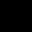

Frame 0: Predicted Class = 76


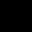

Frame 1: Predicted Class = 76


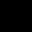

Frame 2: Predicted Class = 76


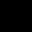

Frame 3: Predicted Class = 76


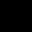

Frame 4: Predicted Class = 76


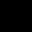

Frame 5: Predicted Class = 76


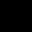

Frame 6: Predicted Class = 76


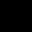

Frame 7: Predicted Class = 76


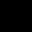

Frame 8: Predicted Class = 76


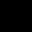

Frame 9: Predicted Class = 76


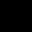

Frame 10: Predicted Class = 76


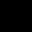

Frame 11: Predicted Class = 76


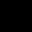

Frame 12: Predicted Class = 76


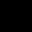

Frame 13: Predicted Class = 76


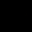

Frame 14: Predicted Class = 76


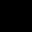

Frame 15: Predicted Class = 76


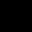

Frame 16: Predicted Class = 76


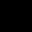

Frame 17: Predicted Class = 76


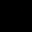

Frame 18: Predicted Class = 76


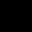

Frame 19: Predicted Class = 76


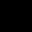

Frame 20: Predicted Class = 76


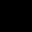

Frame 21: Predicted Class = 76


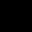

Frame 22: Predicted Class = 87


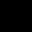

Frame 23: Predicted Class = 73


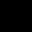

Frame 24: Predicted Class = 87


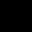

Frame 25: Predicted Class = 87


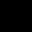

Frame 26: Predicted Class = 87


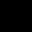

Frame 27: Predicted Class = 3


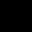

Frame 28: Predicted Class = 3


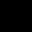

Frame 29: Predicted Class = 3


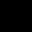

Frame 30: Predicted Class = 21


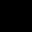

Frame 31: Predicted Class = 21


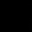

Frame 32: Predicted Class = 3


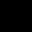

Frame 33: Predicted Class = 3


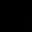

Frame 34: Predicted Class = 3


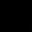

Frame 35: Predicted Class = 3


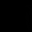

Frame 36: Predicted Class = 3


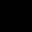

Frame 37: Predicted Class = 3


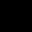

Frame 38: Predicted Class = 3


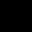

Frame 39: Predicted Class = 3


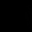

Frame 40: Predicted Class = 3


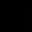

Frame 41: Predicted Class = 3


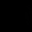

Frame 42: Predicted Class = 3


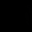

Frame 43: Predicted Class = 3


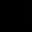

Frame 44: Predicted Class = 3


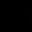

Frame 45: Predicted Class = 3


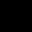

Frame 46: Predicted Class = 3


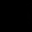

Frame 47: Predicted Class = 3


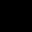

Frame 48: Predicted Class = 3


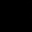

Frame 49: Predicted Class = 21


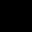

Frame 50: Predicted Class = 21


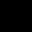

Frame 51: Predicted Class = 21


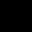

Frame 52: Predicted Class = 3


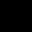

Frame 53: Predicted Class = 3


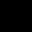

Frame 54: Predicted Class = 3


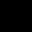

Frame 55: Predicted Class = 68


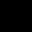

Frame 56: Predicted Class = 23


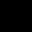

Frame 57: Predicted Class = 76


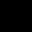

Frame 58: Predicted Class = 23


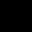

Frame 59: Predicted Class = 23


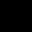

Frame 60: Predicted Class = 23


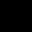

Frame 61: Predicted Class = 23


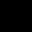

Frame 62: Predicted Class = 23


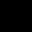

Frame 63: Predicted Class = 23


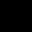

Frame 64: Predicted Class = 23


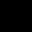

Frame 65: Predicted Class = 23


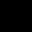

Frame 66: Predicted Class = 23


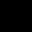

Frame 67: Predicted Class = 23


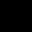

Frame 68: Predicted Class = 23


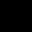

Frame 69: Predicted Class = 23


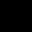

Frame 70: Predicted Class = 23


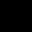

Frame 71: Predicted Class = 23


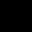

Frame 72: Predicted Class = 23


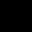

Frame 73: Predicted Class = 23


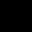

Frame 74: Predicted Class = 23


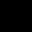

Frame 75: Predicted Class = 23


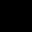

Frame 76: Predicted Class = 23


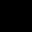

Frame 77: Predicted Class = 23


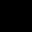

Frame 78: Predicted Class = 23


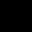

Frame 79: Predicted Class = 23


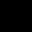

Frame 80: Predicted Class = 23


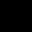

Frame 81: Predicted Class = 23


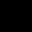

Frame 82: Predicted Class = 23


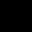

Frame 83: Predicted Class = 23


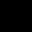

Frame 84: Predicted Class = 23


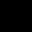

Frame 85: Predicted Class = 23


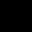

Frame 86: Predicted Class = 23


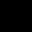

Frame 87: Predicted Class = 23


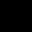

Frame 88: Predicted Class = 23


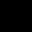

Frame 89: Predicted Class = 23


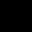

Frame 90: Predicted Class = 23


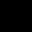

Frame 91: Predicted Class = 23


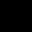

Frame 92: Predicted Class = 23


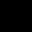

Frame 93: Predicted Class = 23


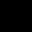

Frame 94: Predicted Class = 23


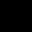

Frame 95: Predicted Class = 23


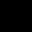

Frame 96: Predicted Class = 23


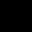

Frame 97: Predicted Class = 23


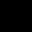

Frame 98: Predicted Class = 23


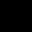

Frame 99: Predicted Class = 23


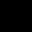

Frame 100: Predicted Class = 23


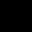

Frame 101: Predicted Class = 23


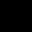

Frame 102: Predicted Class = 23


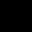

Frame 103: Predicted Class = 23


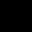

Frame 104: Predicted Class = 23


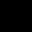

Frame 105: Predicted Class = 23


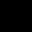

Frame 106: Predicted Class = 76


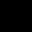

Frame 107: Predicted Class = 23


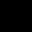

Frame 108: Predicted Class = 76


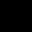

Frame 109: Predicted Class = 76


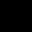

Frame 110: Predicted Class = 76


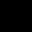

Frame 111: Predicted Class = 76


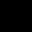

Frame 112: Predicted Class = 76


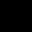

Frame 113: Predicted Class = 76


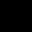

Frame 114: Predicted Class = 76


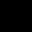

Frame 115: Predicted Class = 76


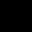

Frame 116: Predicted Class = 76


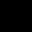

Frame 117: Predicted Class = 76


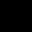

Frame 118: Predicted Class = 76


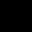

Frame 119: Predicted Class = 76


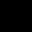

Frame 120: Predicted Class = 76


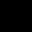

Frame 121: Predicted Class = 76


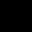

Frame 122: Predicted Class = 76


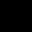

Frame 123: Predicted Class = 76


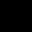

Frame 124: Predicted Class = 76


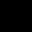

Frame 125: Predicted Class = 76


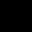

Frame 126: Predicted Class = 76


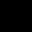

Frame 127: Predicted Class = 76


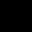

Frame 128: Predicted Class = 76


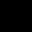

Frame 129: Predicted Class = 76


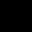

Frame 130: Predicted Class = 76


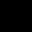

Frame 131: Predicted Class = 76


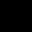

Frame 132: Predicted Class = 76


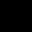

Frame 133: Predicted Class = 76


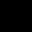

Frame 134: Predicted Class = 76


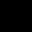

Frame 135: Predicted Class = 76


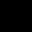

Frame 136: Predicted Class = 76


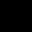

Frame 137: Predicted Class = 76


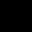

Frame 138: Predicted Class = 76


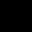

Frame 139: Predicted Class = 76


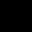

Frame 140: Predicted Class = 76


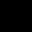

Frame 141: Predicted Class = 76


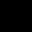

Frame 142: Predicted Class = 76


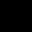

Frame 143: Predicted Class = 76


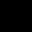

Frame 144: Predicted Class = 76


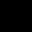

Frame 145: Predicted Class = 76


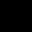

Frame 146: Predicted Class = 76


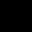

Frame 147: Predicted Class = 76


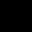

Frame 148: Predicted Class = 76


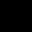

Frame 149: Predicted Class = 76


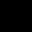

Frame 150: Predicted Class = 76


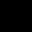

Frame 151: Predicted Class = 76


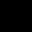

Frame 152: Predicted Class = 76


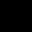

Frame 153: Predicted Class = 76


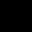

Frame 154: Predicted Class = 76


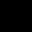

Frame 155: Predicted Class = 76


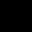

Frame 156: Predicted Class = 76


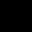

Frame 157: Predicted Class = 76


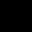

Frame 158: Predicted Class = 76


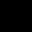

Frame 159: Predicted Class = 76


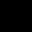

Frame 160: Predicted Class = 76


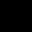

Frame 161: Predicted Class = 76


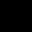

Frame 162: Predicted Class = 76


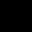

Frame 163: Predicted Class = 76


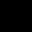

Frame 164: Predicted Class = 76


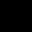

Frame 165: Predicted Class = 76


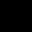

Frame 166: Predicted Class = 76


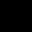

Frame 167: Predicted Class = 76


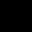

Frame 168: Predicted Class = 76


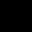

Frame 169: Predicted Class = 76


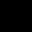

Frame 170: Predicted Class = 76


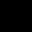

Frame 171: Predicted Class = 76


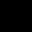

Frame 172: Predicted Class = 76


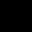

Frame 173: Predicted Class = 76


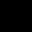

Frame 174: Predicted Class = 76


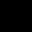

Frame 175: Predicted Class = 76


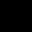

Frame 176: Predicted Class = 76


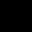

Frame 177: Predicted Class = 76


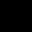

Frame 178: Predicted Class = 76


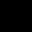

Frame 179: Predicted Class = 76


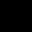

Frame 180: Predicted Class = 76


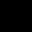

Frame 181: Predicted Class = 76


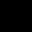

Frame 182: Predicted Class = 76


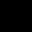

Frame 183: Predicted Class = 76


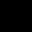

Frame 184: Predicted Class = 76


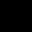

Frame 185: Predicted Class = 76


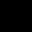

Frame 186: Predicted Class = 76


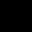

Frame 187: Predicted Class = 76


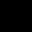

Frame 188: Predicted Class = 76


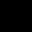

Frame 189: Predicted Class = 76


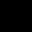

Frame 190: Predicted Class = 76


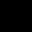

Frame 191: Predicted Class = 76


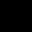

Frame 192: Predicted Class = 76


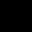

Frame 193: Predicted Class = 76


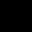

Frame 194: Predicted Class = 76


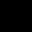

Frame 195: Predicted Class = 76


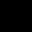

Frame 196: Predicted Class = 76


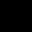

Frame 197: Predicted Class = 76


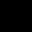

Frame 198: Predicted Class = 76


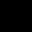

Frame 199: Predicted Class = 76


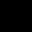

Frame 200: Predicted Class = 76


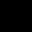

Frame 201: Predicted Class = 76


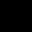

Frame 202: Predicted Class = 76


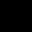

Frame 203: Predicted Class = 76


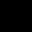

Frame 204: Predicted Class = 76


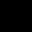

Frame 205: Predicted Class = 76


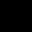

Frame 206: Predicted Class = 76


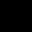

Frame 207: Predicted Class = 76


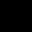

Frame 208: Predicted Class = 76


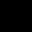

Frame 209: Predicted Class = 76


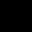

Frame 210: Predicted Class = 76


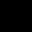

Frame 211: Predicted Class = 76


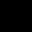

Frame 212: Predicted Class = 76


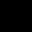

Frame 213: Predicted Class = 76


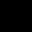

Frame 214: Predicted Class = 76


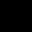

Frame 215: Predicted Class = 76


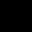

Frame 216: Predicted Class = 76


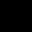

Frame 217: Predicted Class = 76


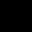

Frame 218: Predicted Class = 76


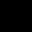

Frame 219: Predicted Class = 76


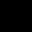

Frame 220: Predicted Class = 76


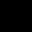

Frame 221: Predicted Class = 76


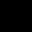

Frame 222: Predicted Class = 76


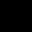

Frame 223: Predicted Class = 76


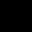

Frame 224: Predicted Class = 76


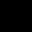

Frame 225: Predicted Class = 76


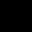

Frame 226: Predicted Class = 76


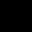

Frame 227: Predicted Class = 76


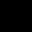

Frame 228: Predicted Class = 76


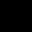

Frame 229: Predicted Class = 76


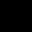

Frame 230: Predicted Class = 76


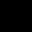

Frame 231: Predicted Class = 76


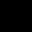

Frame 232: Predicted Class = 76


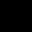

Frame 233: Predicted Class = 76


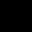

Frame 234: Predicted Class = 76


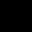

Frame 235: Predicted Class = 76


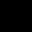

Frame 236: Predicted Class = 76


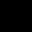

Frame 237: Predicted Class = 76


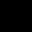

Frame 238: Predicted Class = 76


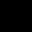

Frame 239: Predicted Class = 76


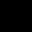

Frame 240: Predicted Class = 76


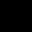

Frame 241: Predicted Class = 76


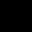

Frame 242: Predicted Class = 76


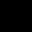

Frame 243: Predicted Class = 76


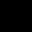

Frame 244: Predicted Class = 76


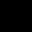

Frame 245: Predicted Class = 76


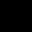

Frame 246: Predicted Class = 76


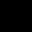

Frame 247: Predicted Class = 76


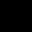

Frame 248: Predicted Class = 76


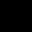

Frame 249: Predicted Class = 76


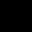

Frame 250: Predicted Class = 76


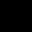

Frame 251: Predicted Class = 76


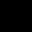

Frame 252: Predicted Class = 76


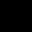

Frame 253: Predicted Class = 76


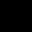

Frame 254: Predicted Class = 76


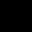

Frame 255: Predicted Class = 76


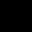

Frame 256: Predicted Class = 76


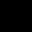

Frame 257: Predicted Class = 76


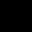

Frame 258: Predicted Class = 76


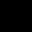

Frame 259: Predicted Class = 76


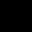

Frame 260: Predicted Class = 76


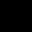

Frame 261: Predicted Class = 76


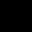

Frame 262: Predicted Class = 76


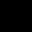

Frame 263: Predicted Class = 76


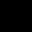

Frame 264: Predicted Class = 76


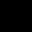

Frame 265: Predicted Class = 76


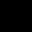

Frame 266: Predicted Class = 76


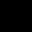

Frame 267: Predicted Class = 76


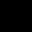

Frame 268: Predicted Class = 76


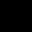

Frame 269: Predicted Class = 76


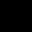

Frame 270: Predicted Class = 76


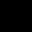

Frame 271: Predicted Class = 76


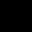

Frame 272: Predicted Class = 76


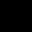

Frame 273: Predicted Class = 76


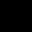

Frame 274: Predicted Class = 76


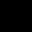

Frame 275: Predicted Class = 76


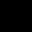

Frame 276: Predicted Class = 76


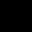

Frame 277: Predicted Class = 76


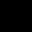

Frame 278: Predicted Class = 76


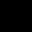

Frame 279: Predicted Class = 76


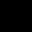

Frame 280: Predicted Class = 73


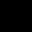

Frame 281: Predicted Class = 67


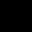

Frame 282: Predicted Class = 73


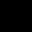

Frame 283: Predicted Class = 76


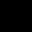

Frame 284: Predicted Class = 73


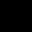

Frame 285: Predicted Class = 76


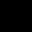

Frame 286: Predicted Class = 73


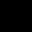

Frame 287: Predicted Class = 73


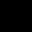

Frame 288: Predicted Class = 73


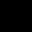

Frame 289: Predicted Class = 76


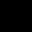

Frame 290: Predicted Class = 76


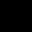

Frame 291: Predicted Class = 76


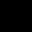

Frame 292: Predicted Class = 76


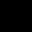

Frame 293: Predicted Class = 76


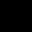

Frame 294: Predicted Class = 76


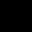

Frame 295: Predicted Class = 76


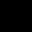

Frame 296: Predicted Class = 73


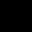

Frame 297: Predicted Class = 76


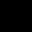

Frame 298: Predicted Class = 76


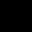

Frame 299: Predicted Class = 76


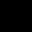

Frame 300: Predicted Class = 76


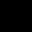

Frame 301: Predicted Class = 76


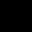

Frame 302: Predicted Class = 76


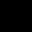

Frame 303: Predicted Class = 76


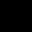

Frame 304: Predicted Class = 76


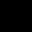

Frame 305: Predicted Class = 76


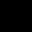

Frame 306: Predicted Class = 76


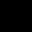

Frame 307: Predicted Class = 76


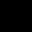

Frame 308: Predicted Class = 76


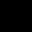

Frame 309: Predicted Class = 76


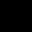

Frame 310: Predicted Class = 76


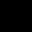

Frame 311: Predicted Class = 76


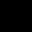

Frame 312: Predicted Class = 76


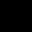

Frame 313: Predicted Class = 76


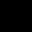

Frame 314: Predicted Class = 76


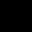

Frame 315: Predicted Class = 76


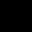

Frame 316: Predicted Class = 76


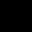

Frame 317: Predicted Class = 76


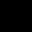

Frame 318: Predicted Class = 76


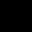

Frame 319: Predicted Class = 76


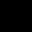

Frame 320: Predicted Class = 76


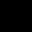

Frame 321: Predicted Class = 76


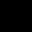

Frame 322: Predicted Class = 76


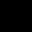

Frame 323: Predicted Class = 76


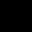

Frame 324: Predicted Class = 76


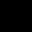

Frame 325: Predicted Class = 76


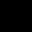

Frame 326: Predicted Class = 76


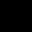

Frame 327: Predicted Class = 76


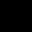

Frame 328: Predicted Class = 76


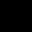

Frame 329: Predicted Class = 76


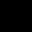

Frame 330: Predicted Class = 76


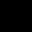

Frame 331: Predicted Class = 76


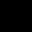

Frame 332: Predicted Class = 76


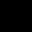

Frame 333: Predicted Class = 76


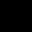

Frame 334: Predicted Class = 76


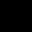

Frame 335: Predicted Class = 76


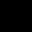

Frame 336: Predicted Class = 76


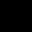

Frame 337: Predicted Class = 76


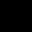

Frame 338: Predicted Class = 76


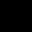

Frame 339: Predicted Class = 76


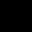

Frame 340: Predicted Class = 76


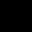

Frame 341: Predicted Class = 76


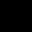

Frame 342: Predicted Class = 76


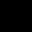

Frame 343: Predicted Class = 76


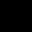

Frame 344: Predicted Class = 76


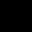

Frame 345: Predicted Class = 76


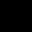

Frame 346: Predicted Class = 76


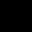

Frame 347: Predicted Class = 76


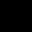

Frame 348: Predicted Class = 76


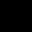

Frame 349: Predicted Class = 76


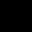

Frame 350: Predicted Class = 76


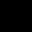

Frame 351: Predicted Class = 76


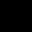

Frame 352: Predicted Class = 76


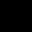

Frame 353: Predicted Class = 76


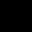

Frame 354: Predicted Class = 76


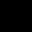

Frame 355: Predicted Class = 76


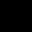

Frame 356: Predicted Class = 76


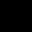

Frame 357: Predicted Class = 76


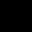

Frame 358: Predicted Class = 76


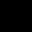

Frame 359: Predicted Class = 76


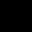

Frame 360: Predicted Class = 76


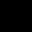

Frame 361: Predicted Class = 76


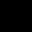

Frame 362: Predicted Class = 76


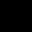

Frame 363: Predicted Class = 76


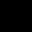

Frame 364: Predicted Class = 76


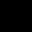

Frame 365: Predicted Class = 76


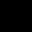

Frame 366: Predicted Class = 76


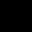

Frame 367: Predicted Class = 76


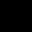

Frame 368: Predicted Class = 76


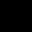

Frame 369: Predicted Class = 76


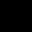

Frame 370: Predicted Class = 76


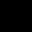

Frame 371: Predicted Class = 76


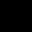

Frame 372: Predicted Class = 76


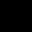

Frame 373: Predicted Class = 76


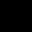

Frame 374: Predicted Class = 76


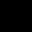

Frame 375: Predicted Class = 76


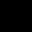

Frame 376: Predicted Class = 76


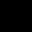

Frame 377: Predicted Class = 76


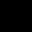

Frame 378: Predicted Class = 76


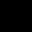

Frame 379: Predicted Class = 76


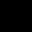

Frame 380: Predicted Class = 76


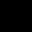

Frame 381: Predicted Class = 76


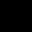

Frame 382: Predicted Class = 76


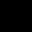

Frame 383: Predicted Class = 76


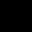

Frame 384: Predicted Class = 76


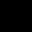

Frame 385: Predicted Class = 76


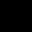

Frame 386: Predicted Class = 76


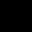

Frame 387: Predicted Class = 76


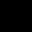

Frame 388: Predicted Class = 76


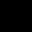

Frame 389: Predicted Class = 76


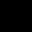

Frame 390: Predicted Class = 76


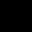

Frame 391: Predicted Class = 76


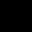

Frame 392: Predicted Class = 76


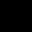

Frame 393: Predicted Class = 76


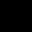

Frame 394: Predicted Class = 76


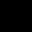

Frame 395: Predicted Class = 76


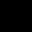

Frame 396: Predicted Class = 76


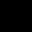

Frame 397: Predicted Class = 76


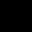

Frame 398: Predicted Class = 76


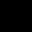

Frame 399: Predicted Class = 76


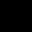

Frame 400: Predicted Class = 76


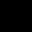

Frame 401: Predicted Class = 76


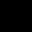

Frame 402: Predicted Class = 76


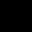

Frame 403: Predicted Class = 76


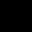

Frame 404: Predicted Class = 76


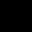

Frame 405: Predicted Class = 76


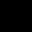

Frame 406: Predicted Class = 76


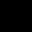

Frame 407: Predicted Class = 76


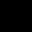

Frame 408: Predicted Class = 76


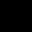

Frame 409: Predicted Class = 76


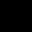

Frame 410: Predicted Class = 76


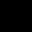

Frame 411: Predicted Class = 76


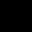

Frame 412: Predicted Class = 76


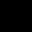

Frame 413: Predicted Class = 76


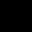

Frame 414: Predicted Class = 76


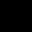

Frame 415: Predicted Class = 76


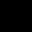

Frame 416: Predicted Class = 76


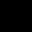

Frame 417: Predicted Class = 76


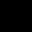

Frame 418: Predicted Class = 76


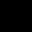

Frame 419: Predicted Class = 76


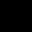

Frame 420: Predicted Class = 76


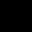

Frame 421: Predicted Class = 76


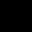

Frame 422: Predicted Class = 76


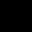

Frame 423: Predicted Class = 76


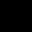

Frame 424: Predicted Class = 76


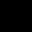

Frame 425: Predicted Class = 76


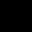

Frame 426: Predicted Class = 76


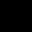

Frame 427: Predicted Class = 76


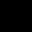

Frame 428: Predicted Class = 76


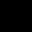

Frame 429: Predicted Class = 76


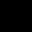

Frame 430: Predicted Class = 76


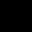

Frame 431: Predicted Class = 76


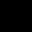

Frame 432: Predicted Class = 76


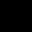

Frame 433: Predicted Class = 76


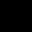

Frame 434: Predicted Class = 76


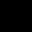

Frame 435: Predicted Class = 76


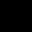

Frame 436: Predicted Class = 76


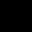

Frame 437: Predicted Class = 76


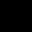

Frame 438: Predicted Class = 76


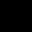

Frame 439: Predicted Class = 76


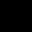

Frame 440: Predicted Class = 76


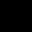

Frame 441: Predicted Class = 76


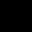

Frame 442: Predicted Class = 76


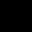

Frame 443: Predicted Class = 76


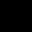

Frame 444: Predicted Class = 76


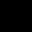

Frame 445: Predicted Class = 76


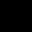

Frame 446: Predicted Class = 76


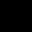

Frame 447: Predicted Class = 76


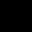

Frame 448: Predicted Class = 76


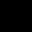

Frame 449: Predicted Class = 76


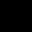

Frame 450: Predicted Class = 76


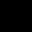

Frame 451: Predicted Class = 76


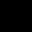

Frame 452: Predicted Class = 76


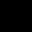

Frame 453: Predicted Class = 76


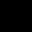

Frame 454: Predicted Class = 76


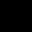

Frame 455: Predicted Class = 76


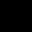

Frame 456: Predicted Class = 76


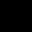

Frame 457: Predicted Class = 76


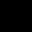

Frame 458: Predicted Class = 76


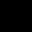

Frame 459: Predicted Class = 76


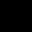

Frame 460: Predicted Class = 76


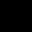

Frame 461: Predicted Class = 76


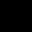

Frame 462: Predicted Class = 76


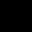

Frame 463: Predicted Class = 76


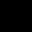

Frame 464: Predicted Class = 76


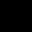

Frame 465: Predicted Class = 76


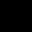

Frame 466: Predicted Class = 76


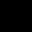

Frame 467: Predicted Class = 76


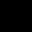

Frame 468: Predicted Class = 76


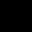

Frame 469: Predicted Class = 76


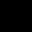

Frame 470: Predicted Class = 76


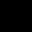

Frame 471: Predicted Class = 76


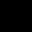

Frame 472: Predicted Class = 76


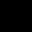

Frame 473: Predicted Class = 76


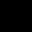

Frame 474: Predicted Class = 76


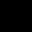

Frame 475: Predicted Class = 76


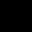

Frame 476: Predicted Class = 76


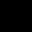

Frame 477: Predicted Class = 76


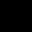

Frame 478: Predicted Class = 76


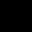

Frame 479: Predicted Class = 76


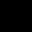

Frame 480: Predicted Class = 76


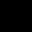

Frame 481: Predicted Class = 76


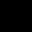

Frame 482: Predicted Class = 76


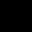

Frame 483: Predicted Class = 76


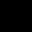

Frame 484: Predicted Class = 76


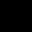

Frame 485: Predicted Class = 76


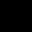

Frame 486: Predicted Class = 76


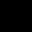

Frame 487: Predicted Class = 76


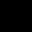

Frame 488: Predicted Class = 76


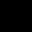

Frame 489: Predicted Class = 76


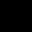

Frame 490: Predicted Class = 76


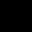

Frame 491: Predicted Class = 76


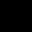

Frame 492: Predicted Class = 76


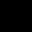

Frame 493: Predicted Class = 76


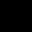

Frame 494: Predicted Class = 76


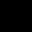

Frame 495: Predicted Class = 76


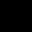

Frame 496: Predicted Class = 76


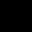

Frame 497: Predicted Class = 76


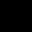

Frame 498: Predicted Class = 76


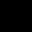

Frame 499: Predicted Class = 76


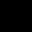

Frame 500: Predicted Class = 76


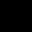

Frame 501: Predicted Class = 76


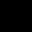

Frame 502: Predicted Class = 76


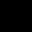

Frame 503: Predicted Class = 76


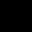

Frame 504: Predicted Class = 76


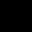

Frame 505: Predicted Class = 76


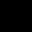

Frame 506: Predicted Class = 76


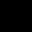

Frame 507: Predicted Class = 76


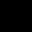

Frame 508: Predicted Class = 76


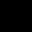

Frame 509: Predicted Class = 76


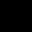

Frame 510: Predicted Class = 76


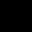

Frame 511: Predicted Class = 76


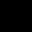

Frame 512: Predicted Class = 76


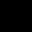

Frame 513: Predicted Class = 76


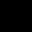

Frame 514: Predicted Class = 76


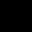

Frame 515: Predicted Class = 76


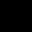

Frame 516: Predicted Class = 76


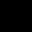

Frame 517: Predicted Class = 76


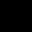

Frame 518: Predicted Class = 76


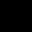

Frame 519: Predicted Class = 76


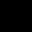

Frame 520: Predicted Class = 76


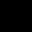

Frame 521: Predicted Class = 76


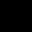

Frame 522: Predicted Class = 76


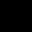

Frame 523: Predicted Class = 76


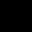

Frame 524: Predicted Class = 76


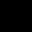

Frame 525: Predicted Class = 76


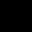

Frame 526: Predicted Class = 76


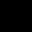

Frame 527: Predicted Class = 76


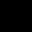

Frame 528: Predicted Class = 76


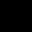

Frame 529: Predicted Class = 76


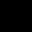

Frame 530: Predicted Class = 76


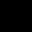

Frame 531: Predicted Class = 76


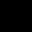

Frame 532: Predicted Class = 76


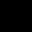

Frame 533: Predicted Class = 76


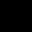

Frame 534: Predicted Class = 76


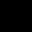

Frame 535: Predicted Class = 76


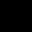

Frame 536: Predicted Class = 76


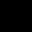

Frame 537: Predicted Class = 76


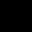

Frame 538: Predicted Class = 76


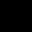

Frame 539: Predicted Class = 76


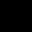

Frame 540: Predicted Class = 76


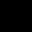

Frame 541: Predicted Class = 76


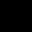

Frame 542: Predicted Class = 76


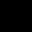

Frame 543: Predicted Class = 76


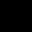

Frame 544: Predicted Class = 76


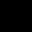

Frame 545: Predicted Class = 76


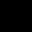

Frame 546: Predicted Class = 76


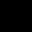

Frame 547: Predicted Class = 76


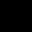

Frame 548: Predicted Class = 76


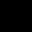

Frame 549: Predicted Class = 76


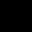

Frame 550: Predicted Class = 76


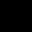

Frame 551: Predicted Class = 76


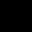

Frame 552: Predicted Class = 76


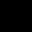

Frame 553: Predicted Class = 76


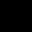

Frame 554: Predicted Class = 76


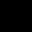

Frame 555: Predicted Class = 76


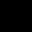

Frame 556: Predicted Class = 76


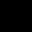

Frame 557: Predicted Class = 76


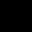

Frame 558: Predicted Class = 76


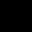

Frame 559: Predicted Class = 76


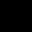

Frame 560: Predicted Class = 76


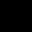

Frame 561: Predicted Class = 76


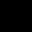

Frame 562: Predicted Class = 76


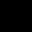

Frame 563: Predicted Class = 76


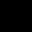

Frame 564: Predicted Class = 76


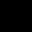

Frame 565: Predicted Class = 76


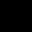

Frame 566: Predicted Class = 76


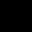

Frame 567: Predicted Class = 76


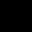

Frame 568: Predicted Class = 76


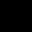

Frame 569: Predicted Class = 76


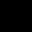

Frame 570: Predicted Class = 76


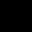

Frame 571: Predicted Class = 76


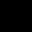

Frame 572: Predicted Class = 76


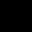

Frame 573: Predicted Class = 76


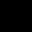

Frame 574: Predicted Class = 76


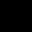

Frame 575: Predicted Class = 76


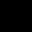

Frame 576: Predicted Class = 76


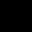

Frame 577: Predicted Class = 76


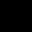

Frame 578: Predicted Class = 76


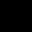

Frame 579: Predicted Class = 76


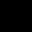

Frame 580: Predicted Class = 76


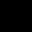

Frame 581: Predicted Class = 76


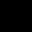

Frame 582: Predicted Class = 76


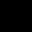

Frame 583: Predicted Class = 76


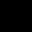

Frame 584: Predicted Class = 76


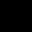

Frame 585: Predicted Class = 76


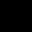

Frame 586: Predicted Class = 76


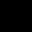

Frame 587: Predicted Class = 76


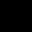

Frame 588: Predicted Class = 76


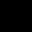

Frame 589: Predicted Class = 76


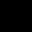

Frame 590: Predicted Class = 76


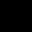

Frame 591: Predicted Class = 76


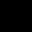

Frame 592: Predicted Class = 76


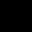

Frame 593: Predicted Class = 76


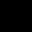

Frame 594: Predicted Class = 76


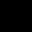

Frame 595: Predicted Class = 76


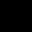

Frame 596: Predicted Class = 76


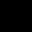

Frame 597: Predicted Class = 76


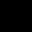

Frame 598: Predicted Class = 76


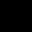

Frame 599: Predicted Class = 76


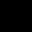

Frame 600: Predicted Class = 76


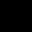

Frame 601: Predicted Class = 76


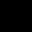

Frame 602: Predicted Class = 76


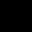

Frame 603: Predicted Class = 76


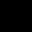

Frame 604: Predicted Class = 76


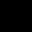

Frame 605: Predicted Class = 76


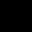

Frame 606: Predicted Class = 76


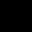

Frame 607: Predicted Class = 76


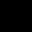

Frame 608: Predicted Class = 76


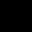

Frame 609: Predicted Class = 76


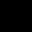

Frame 610: Predicted Class = 76


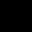

Frame 611: Predicted Class = 76


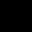

Frame 612: Predicted Class = 76


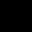

Frame 613: Predicted Class = 76


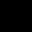

Frame 614: Predicted Class = 76


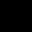

Frame 615: Predicted Class = 76


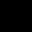

Frame 616: Predicted Class = 76


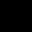

Frame 617: Predicted Class = 76


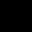

Frame 618: Predicted Class = 76


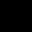

Frame 619: Predicted Class = 76


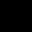

Frame 620: Predicted Class = 76


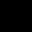

Frame 621: Predicted Class = 76


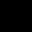

Frame 622: Predicted Class = 76


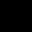

Frame 623: Predicted Class = 76


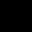

Frame 624: Predicted Class = 76


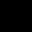

Frame 625: Predicted Class = 76


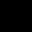

Frame 626: Predicted Class = 76


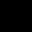

Frame 627: Predicted Class = 76


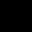

Frame 628: Predicted Class = 76


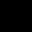

Frame 629: Predicted Class = 76


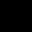

Frame 630: Predicted Class = 76


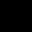

Frame 631: Predicted Class = 76


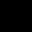

Frame 632: Predicted Class = 76


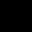

Frame 633: Predicted Class = 76


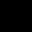

Frame 634: Predicted Class = 76


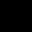

Frame 635: Predicted Class = 76


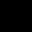

Frame 636: Predicted Class = 76


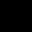

Frame 637: Predicted Class = 76


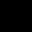

Frame 638: Predicted Class = 76


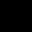

Frame 639: Predicted Class = 76


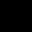

Frame 640: Predicted Class = 76


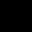

Frame 641: Predicted Class = 76


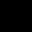

Frame 642: Predicted Class = 76


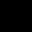

Frame 643: Predicted Class = 76


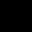

Frame 644: Predicted Class = 76


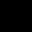

Frame 645: Predicted Class = 76


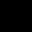

Frame 646: Predicted Class = 76


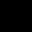

Frame 647: Predicted Class = 76


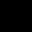

Frame 648: Predicted Class = 76


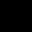

Frame 649: Predicted Class = 76


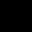

Frame 650: Predicted Class = 76


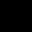

Frame 651: Predicted Class = 76


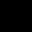

Frame 652: Predicted Class = 76


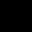

Frame 653: Predicted Class = 76


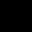

Frame 654: Predicted Class = 76


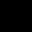

Frame 655: Predicted Class = 76


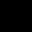

Frame 656: Predicted Class = 76


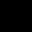

Frame 657: Predicted Class = 76


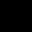

Frame 658: Predicted Class = 76


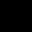

Frame 659: Predicted Class = 76


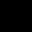

Frame 660: Predicted Class = 76


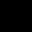

Frame 661: Predicted Class = 76


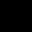

Frame 662: Predicted Class = 76


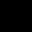

Frame 663: Predicted Class = 76


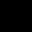

Frame 664: Predicted Class = 76


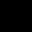

Frame 665: Predicted Class = 76


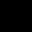

Frame 666: Predicted Class = 76


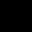

Frame 667: Predicted Class = 76


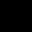

Frame 668: Predicted Class = 76


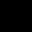

Frame 669: Predicted Class = 76


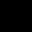

Frame 670: Predicted Class = 76


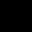

Frame 671: Predicted Class = 76


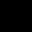

Frame 672: Predicted Class = 76


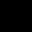

Frame 673: Predicted Class = 76


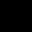

Frame 674: Predicted Class = 76


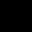

Frame 675: Predicted Class = 76


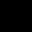

Frame 676: Predicted Class = 76


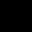

Frame 677: Predicted Class = 76


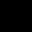

Frame 678: Predicted Class = 76


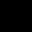

Frame 679: Predicted Class = 76


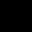

Frame 680: Predicted Class = 76


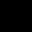

Frame 681: Predicted Class = 76


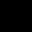

Frame 682: Predicted Class = 76


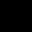

Frame 683: Predicted Class = 76


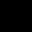

Frame 684: Predicted Class = 76


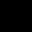

Frame 685: Predicted Class = 76


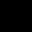

Frame 686: Predicted Class = 76


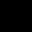

Frame 687: Predicted Class = 76


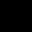

Frame 688: Predicted Class = 76


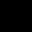

Frame 689: Predicted Class = 76


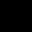

Frame 690: Predicted Class = 76


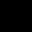

Frame 691: Predicted Class = 76


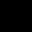

Frame 692: Predicted Class = 76


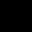

Frame 693: Predicted Class = 76


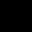

Frame 694: Predicted Class = 73


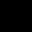

Frame 695: Predicted Class = 76


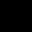

Frame 696: Predicted Class = 76


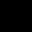

Frame 697: Predicted Class = 76


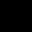

Frame 698: Predicted Class = 73


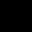

Frame 699: Predicted Class = 76


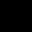

Frame 700: Predicted Class = 76


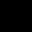

Frame 701: Predicted Class = 76


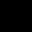

Frame 702: Predicted Class = 76


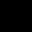

Frame 703: Predicted Class = 76


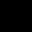

Frame 704: Predicted Class = 76


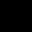

Frame 705: Predicted Class = 76


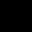

Frame 706: Predicted Class = 76


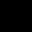

Frame 707: Predicted Class = 76


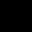

Frame 708: Predicted Class = 73


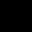

Frame 709: Predicted Class = 73


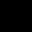

Frame 710: Predicted Class = 73


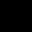

Frame 711: Predicted Class = 76


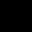

Frame 712: Predicted Class = 73


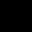

Frame 713: Predicted Class = 73


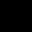

Frame 714: Predicted Class = 73


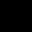

Frame 715: Predicted Class = 76


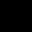

Frame 716: Predicted Class = 76


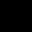

Frame 717: Predicted Class = 76


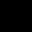

Frame 718: Predicted Class = 76


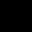

Frame 719: Predicted Class = 73


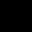

Frame 720: Predicted Class = 76


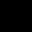

Frame 721: Predicted Class = 76


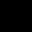

Frame 722: Predicted Class = 76


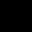

Frame 723: Predicted Class = 76


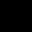

Frame 724: Predicted Class = 76


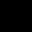

Frame 725: Predicted Class = 76


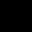

Frame 726: Predicted Class = 76


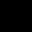

Frame 727: Predicted Class = 76


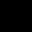

Frame 728: Predicted Class = 76


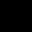

Frame 729: Predicted Class = 76


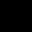

Frame 730: Predicted Class = 76


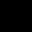

Frame 731: Predicted Class = 76


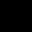

Frame 732: Predicted Class = 76


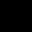

Frame 733: Predicted Class = 76


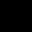

Frame 734: Predicted Class = 76


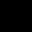

Frame 735: Predicted Class = 76


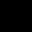

Frame 736: Predicted Class = 76


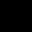

Frame 737: Predicted Class = 76


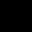

Frame 738: Predicted Class = 76


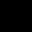

Frame 739: Predicted Class = 76


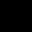

Frame 740: Predicted Class = 76


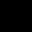

Frame 741: Predicted Class = 76


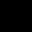

Frame 742: Predicted Class = 76


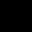

Frame 743: Predicted Class = 76


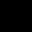

Frame 744: Predicted Class = 76


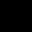

Frame 745: Predicted Class = 76


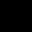

Frame 746: Predicted Class = 76


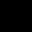

Frame 747: Predicted Class = 76


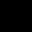

Frame 748: Predicted Class = 76


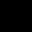

Frame 749: Predicted Class = 76


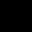

Frame 750: Predicted Class = 76


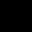

Frame 751: Predicted Class = 76


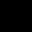

Frame 752: Predicted Class = 76


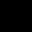

Frame 753: Predicted Class = 76


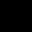

Frame 754: Predicted Class = 76


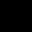

Frame 755: Predicted Class = 76


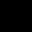

Frame 756: Predicted Class = 76


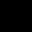

Frame 757: Predicted Class = 76


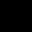

Frame 758: Predicted Class = 76


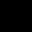

Frame 759: Predicted Class = 76


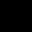

Frame 760: Predicted Class = 76


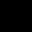

Frame 761: Predicted Class = 76


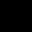

Frame 762: Predicted Class = 76


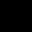

Frame 763: Predicted Class = 76


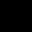

Frame 764: Predicted Class = 76


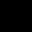

Frame 765: Predicted Class = 76


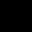

Frame 766: Predicted Class = 76


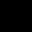

Frame 767: Predicted Class = 76


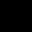

Frame 768: Predicted Class = 76


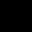

Frame 769: Predicted Class = 76


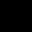

Frame 770: Predicted Class = 76


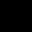

Frame 771: Predicted Class = 76


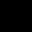

Frame 772: Predicted Class = 76


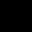

Frame 773: Predicted Class = 76


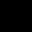

Frame 774: Predicted Class = 76


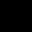

Frame 775: Predicted Class = 76


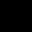

Frame 776: Predicted Class = 76


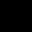

Frame 777: Predicted Class = 76


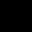

Frame 778: Predicted Class = 76


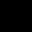

Frame 779: Predicted Class = 76


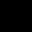

Frame 780: Predicted Class = 76


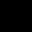

Frame 781: Predicted Class = 76


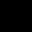

Frame 782: Predicted Class = 76


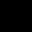

Frame 783: Predicted Class = 76


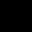

Frame 784: Predicted Class = 76


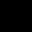

Frame 785: Predicted Class = 76


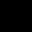

Frame 786: Predicted Class = 76


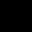

Frame 787: Predicted Class = 76


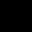

Frame 788: Predicted Class = 76


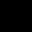

Frame 789: Predicted Class = 76


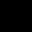

Frame 790: Predicted Class = 76


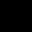

Frame 791: Predicted Class = 76


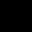

Frame 792: Predicted Class = 76


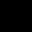

Frame 793: Predicted Class = 76


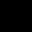

Frame 794: Predicted Class = 76


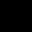

Frame 795: Predicted Class = 76


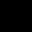

Frame 796: Predicted Class = 76


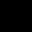

Frame 797: Predicted Class = 76


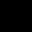

Frame 798: Predicted Class = 76


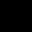

Frame 799: Predicted Class = 76


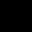

Frame 800: Predicted Class = 76


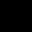

Frame 801: Predicted Class = 76


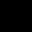

Frame 802: Predicted Class = 76


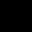

Frame 803: Predicted Class = 76


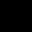

Frame 804: Predicted Class = 76


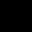

Frame 805: Predicted Class = 76


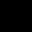

Frame 806: Predicted Class = 76


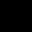

Frame 807: Predicted Class = 76


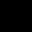

Frame 808: Predicted Class = 76


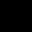

Frame 809: Predicted Class = 76


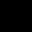

Frame 810: Predicted Class = 76


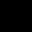

Frame 811: Predicted Class = 76


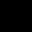

Frame 812: Predicted Class = 76


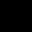

Frame 813: Predicted Class = 76


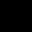

Frame 814: Predicted Class = 76


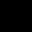

Frame 815: Predicted Class = 76


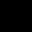

Frame 816: Predicted Class = 76


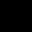

Frame 817: Predicted Class = 76


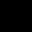

Frame 818: Predicted Class = 76


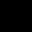

Frame 819: Predicted Class = 76


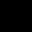

Frame 820: Predicted Class = 76


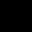

Frame 821: Predicted Class = 76


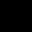

Frame 822: Predicted Class = 76


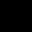

Frame 823: Predicted Class = 76


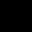

Frame 824: Predicted Class = 76


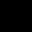

Frame 825: Predicted Class = 76


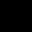

Frame 826: Predicted Class = 76


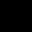

Frame 827: Predicted Class = 76


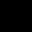

Frame 828: Predicted Class = 76


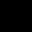

Frame 829: Predicted Class = 76


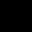

Frame 830: Predicted Class = 76


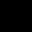

Frame 831: Predicted Class = 76


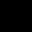

Frame 832: Predicted Class = 76


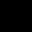

Frame 833: Predicted Class = 76


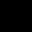

Frame 834: Predicted Class = 76


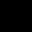

Frame 835: Predicted Class = 76


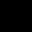

Frame 836: Predicted Class = 76


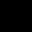

Frame 837: Predicted Class = 76


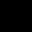

Frame 838: Predicted Class = 76


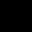

Frame 839: Predicted Class = 76


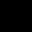

Frame 840: Predicted Class = 76


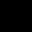

Frame 841: Predicted Class = 76


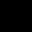

Frame 842: Predicted Class = 76


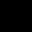

Frame 843: Predicted Class = 76


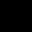

Frame 844: Predicted Class = 76


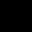

Frame 845: Predicted Class = 76


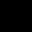

Frame 846: Predicted Class = 76


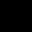

Frame 847: Predicted Class = 76


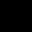

Frame 848: Predicted Class = 76


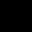

Frame 849: Predicted Class = 76


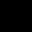

Frame 850: Predicted Class = 76


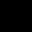

Frame 851: Predicted Class = 76


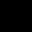

Frame 852: Predicted Class = 76


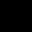

Frame 853: Predicted Class = 76


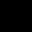

Frame 854: Predicted Class = 76


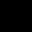

Frame 855: Predicted Class = 76


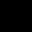

Frame 856: Predicted Class = 76


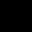

Frame 857: Predicted Class = 76


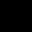

Frame 858: Predicted Class = 76


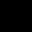

Frame 859: Predicted Class = 76


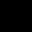

Frame 860: Predicted Class = 76


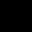

Frame 861: Predicted Class = 76


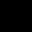

Frame 862: Predicted Class = 76


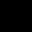

Frame 863: Predicted Class = 76


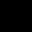

Frame 864: Predicted Class = 76


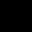

Frame 865: Predicted Class = 76


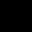

Frame 866: Predicted Class = 76


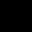

Frame 867: Predicted Class = 76


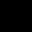

Frame 868: Predicted Class = 76


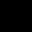

Frame 869: Predicted Class = 76


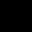

Frame 870: Predicted Class = 76


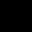

Frame 871: Predicted Class = 76


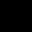

Frame 872: Predicted Class = 76


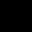

Frame 873: Predicted Class = 76


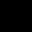

Frame 874: Predicted Class = 76


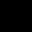

Frame 875: Predicted Class = 76


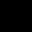

Frame 876: Predicted Class = 76


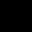

Frame 877: Predicted Class = 76


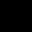

Frame 878: Predicted Class = 76


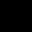

Frame 879: Predicted Class = 76


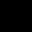

Frame 880: Predicted Class = 76


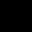

Frame 881: Predicted Class = 76


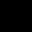

Frame 882: Predicted Class = 76


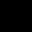

Frame 883: Predicted Class = 76


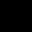

Frame 884: Predicted Class = 76


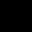

Frame 885: Predicted Class = 76


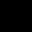

Frame 886: Predicted Class = 76


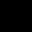

Frame 887: Predicted Class = 76


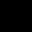

Frame 888: Predicted Class = 76


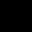

Frame 889: Predicted Class = 76


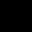

Frame 890: Predicted Class = 76


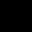

Frame 891: Predicted Class = 76


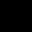

Frame 892: Predicted Class = 76


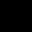

Frame 893: Predicted Class = 76


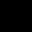

Frame 894: Predicted Class = 76


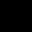

Frame 895: Predicted Class = 76


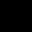

Frame 896: Predicted Class = 76


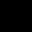

Frame 897: Predicted Class = 76


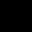

Frame 898: Predicted Class = 76


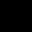

Frame 899: Predicted Class = 76


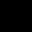

Frame 900: Predicted Class = 76


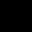

Frame 901: Predicted Class = 76


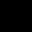

Frame 902: Predicted Class = 76


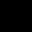

Frame 903: Predicted Class = 76


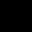

Frame 904: Predicted Class = 76


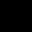

Frame 905: Predicted Class = 76


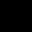

Frame 906: Predicted Class = 76


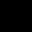

Frame 907: Predicted Class = 76


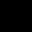

Frame 908: Predicted Class = 76


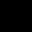

Frame 909: Predicted Class = 76


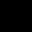

Frame 910: Predicted Class = 76


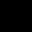

Frame 911: Predicted Class = 76


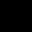

Frame 912: Predicted Class = 76


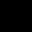

Frame 913: Predicted Class = 76


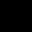

Frame 914: Predicted Class = 76


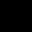

Frame 915: Predicted Class = 76


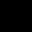

Frame 916: Predicted Class = 76


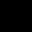

Frame 917: Predicted Class = 76


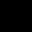

Frame 918: Predicted Class = 76


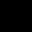

Frame 919: Predicted Class = 76


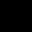

Frame 920: Predicted Class = 76


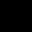

Frame 921: Predicted Class = 76


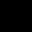

Frame 922: Predicted Class = 76


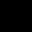

Frame 923: Predicted Class = 76


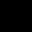

Frame 924: Predicted Class = 76


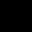

Frame 925: Predicted Class = 76


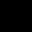

Frame 926: Predicted Class = 76


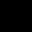

Frame 927: Predicted Class = 76


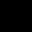

Frame 928: Predicted Class = 76


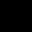

Frame 929: Predicted Class = 76


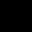

Frame 930: Predicted Class = 76


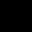

Frame 931: Predicted Class = 76


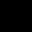

Frame 932: Predicted Class = 76


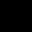

Frame 933: Predicted Class = 76


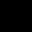

Frame 934: Predicted Class = 76


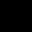

Frame 935: Predicted Class = 76


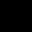

Frame 936: Predicted Class = 76


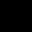

Frame 937: Predicted Class = 76


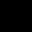

Frame 938: Predicted Class = 76


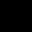

Frame 939: Predicted Class = 76


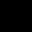

Frame 940: Predicted Class = 76


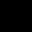

Frame 941: Predicted Class = 76


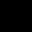

Frame 942: Predicted Class = 76


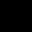

Frame 943: Predicted Class = 76


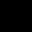

Frame 944: Predicted Class = 76


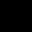

Frame 945: Predicted Class = 76


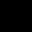

Frame 946: Predicted Class = 76


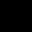

Frame 947: Predicted Class = 76


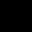

Frame 948: Predicted Class = 76


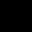

Frame 949: Predicted Class = 76


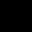

Frame 950: Predicted Class = 76


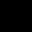

Frame 951: Predicted Class = 76


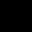

Frame 952: Predicted Class = 76


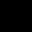

Frame 953: Predicted Class = 76


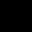

Frame 954: Predicted Class = 76


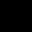

Frame 955: Predicted Class = 76


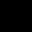

Frame 956: Predicted Class = 76


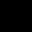

Frame 957: Predicted Class = 76


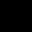

Frame 958: Predicted Class = 76


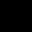

Frame 959: Predicted Class = 76


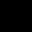

Frame 960: Predicted Class = 76


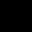

Frame 961: Predicted Class = 76


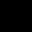

Frame 962: Predicted Class = 76


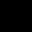

Frame 963: Predicted Class = 76


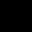

Frame 964: Predicted Class = 76


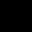

Frame 965: Predicted Class = 76


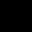

Frame 966: Predicted Class = 76


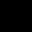

Frame 967: Predicted Class = 76


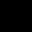

Frame 968: Predicted Class = 76


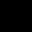

Frame 969: Predicted Class = 76


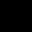

Frame 970: Predicted Class = 76


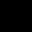

Frame 971: Predicted Class = 76


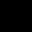

Frame 972: Predicted Class = 76


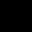

Frame 973: Predicted Class = 76


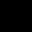

Frame 974: Predicted Class = 76


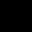

Frame 975: Predicted Class = 76


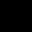

Frame 976: Predicted Class = 76


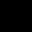

Frame 977: Predicted Class = 76


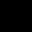

Frame 978: Predicted Class = 76


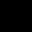

Frame 979: Predicted Class = 76


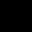

Frame 980: Predicted Class = 76


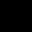

Frame 981: Predicted Class = 76


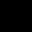

Frame 982: Predicted Class = 76


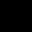

Frame 983: Predicted Class = 76


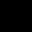

Frame 984: Predicted Class = 76


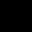

Frame 985: Predicted Class = 76


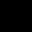

Frame 986: Predicted Class = 76


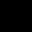

Frame 987: Predicted Class = 76


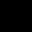

Frame 988: Predicted Class = 76


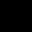

Frame 989: Predicted Class = 76


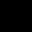

Frame 990: Predicted Class = 76


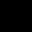

Frame 991: Predicted Class = 76


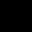

Frame 992: Predicted Class = 76


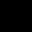

Frame 993: Predicted Class = 76


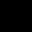

Frame 994: Predicted Class = 76


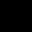

Frame 995: Predicted Class = 76


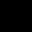

Frame 996: Predicted Class = 76


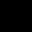

Frame 997: Predicted Class = 76


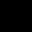

Frame 998: Predicted Class = 76


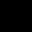

Frame 999: Predicted Class = 76


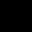

Frame 1000: Predicted Class = 76


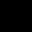

Frame 1001: Predicted Class = 76


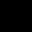

Frame 1002: Predicted Class = 76


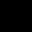

Frame 1003: Predicted Class = 76


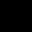

Frame 1004: Predicted Class = 76


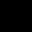

Frame 1005: Predicted Class = 76


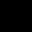

Frame 1006: Predicted Class = 76


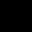

Frame 1007: Predicted Class = 76


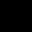

Frame 1008: Predicted Class = 76


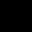

Frame 1009: Predicted Class = 76


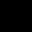

Frame 1010: Predicted Class = 76


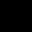

Frame 1011: Predicted Class = 76


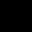

Frame 1012: Predicted Class = 76


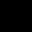

Frame 1013: Predicted Class = 76


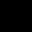

Frame 1014: Predicted Class = 76


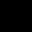

Frame 1015: Predicted Class = 76


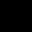

Frame 1016: Predicted Class = 76


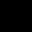

Frame 1017: Predicted Class = 76


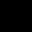

Frame 1018: Predicted Class = 76


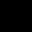

Frame 1019: Predicted Class = 76


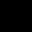

Frame 1020: Predicted Class = 76


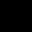

Frame 1021: Predicted Class = 76


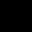

Frame 1022: Predicted Class = 76


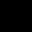

Frame 1023: Predicted Class = 76


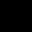

Frame 1024: Predicted Class = 76


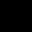

Frame 1025: Predicted Class = 76


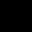

Frame 1026: Predicted Class = 76


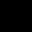

Frame 1027: Predicted Class = 76


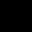

Frame 1028: Predicted Class = 76


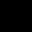

Frame 1029: Predicted Class = 76


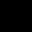

Frame 1030: Predicted Class = 76


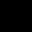

Frame 1031: Predicted Class = 76


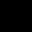

Frame 1032: Predicted Class = 76


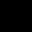

Frame 1033: Predicted Class = 76


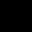

Frame 1034: Predicted Class = 76


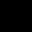

Frame 1035: Predicted Class = 76


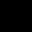

Frame 1036: Predicted Class = 76


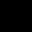

Frame 1037: Predicted Class = 76


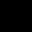

Frame 1038: Predicted Class = 76


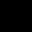

Frame 1039: Predicted Class = 76


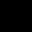

Frame 1040: Predicted Class = 76


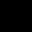

Frame 1041: Predicted Class = 76


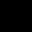

Frame 1042: Predicted Class = 76


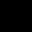

Frame 1043: Predicted Class = 76


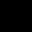

Frame 1044: Predicted Class = 76


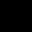

Frame 1045: Predicted Class = 76


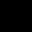

Frame 1046: Predicted Class = 76


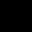

Frame 1047: Predicted Class = 76


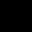

Frame 1048: Predicted Class = 76


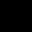

Frame 1049: Predicted Class = 76


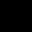

Frame 1050: Predicted Class = 76


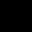

Frame 1051: Predicted Class = 76


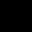

Frame 1052: Predicted Class = 76


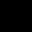

Frame 1053: Predicted Class = 76


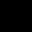

Frame 1054: Predicted Class = 76


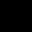

Frame 1055: Predicted Class = 76


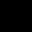

Frame 1056: Predicted Class = 76


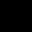

Frame 1057: Predicted Class = 76


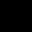

Frame 1058: Predicted Class = 76


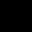

Frame 1059: Predicted Class = 76


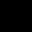

Frame 1060: Predicted Class = 76


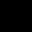

Frame 1061: Predicted Class = 76


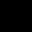

Frame 1062: Predicted Class = 76


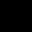

Frame 1063: Predicted Class = 76


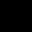

Frame 1064: Predicted Class = 76


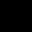

Frame 1065: Predicted Class = 76


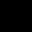

Frame 1066: Predicted Class = 76


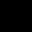

Frame 1067: Predicted Class = 76


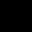

Frame 1068: Predicted Class = 76


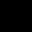

Frame 1069: Predicted Class = 76


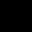

Frame 1070: Predicted Class = 76


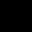

Frame 1071: Predicted Class = 76


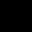

Frame 1072: Predicted Class = 76


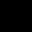

Frame 1073: Predicted Class = 76


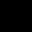

Frame 1074: Predicted Class = 76


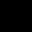

Frame 1075: Predicted Class = 76


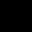

Frame 1076: Predicted Class = 76


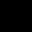

Frame 1077: Predicted Class = 76


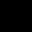

Frame 1078: Predicted Class = 76


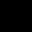

Frame 1079: Predicted Class = 76


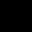

Frame 1080: Predicted Class = 76


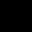

Frame 1081: Predicted Class = 76


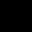

Frame 1082: Predicted Class = 76


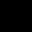

Frame 1083: Predicted Class = 76


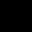

Frame 1084: Predicted Class = 76


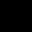

Frame 1085: Predicted Class = 76


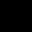

Frame 1086: Predicted Class = 76


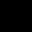

Frame 1087: Predicted Class = 76


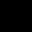

Frame 1088: Predicted Class = 76


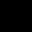

Frame 1089: Predicted Class = 76


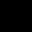

Frame 1090: Predicted Class = 76


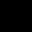

Frame 1091: Predicted Class = 76


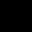

Frame 1092: Predicted Class = 76


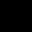

Frame 1093: Predicted Class = 76


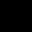

Frame 1094: Predicted Class = 76


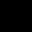

Frame 1095: Predicted Class = 76


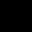

Frame 1096: Predicted Class = 76


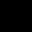

Frame 1097: Predicted Class = 76


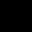

Frame 1098: Predicted Class = 76


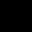

Frame 1099: Predicted Class = 76


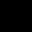

Frame 1100: Predicted Class = 76


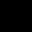

Frame 1101: Predicted Class = 76


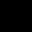

Frame 1102: Predicted Class = 76


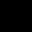

Frame 1103: Predicted Class = 76


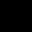

Frame 1104: Predicted Class = 76


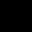

Frame 1105: Predicted Class = 76


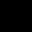

Frame 1106: Predicted Class = 76


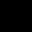

Frame 1107: Predicted Class = 76


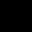

Frame 1108: Predicted Class = 76


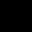

Frame 1109: Predicted Class = 76


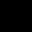

Frame 1110: Predicted Class = 76


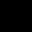

Frame 1111: Predicted Class = 76


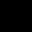

Frame 1112: Predicted Class = 76


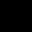

Frame 1113: Predicted Class = 76


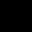

Frame 1114: Predicted Class = 76


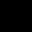

Frame 1115: Predicted Class = 76


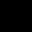

Frame 1116: Predicted Class = 76


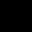

Frame 1117: Predicted Class = 76


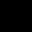

Frame 1118: Predicted Class = 76


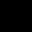

Frame 1119: Predicted Class = 76


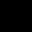

Frame 1120: Predicted Class = 76


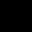

Frame 1121: Predicted Class = 76


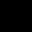

Frame 1122: Predicted Class = 76


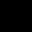

Frame 1123: Predicted Class = 76


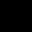

Frame 1124: Predicted Class = 76


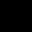

Frame 1125: Predicted Class = 76


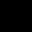

Frame 1126: Predicted Class = 76


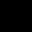

Frame 1127: Predicted Class = 76


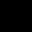

Frame 1128: Predicted Class = 76


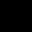

Frame 1129: Predicted Class = 76


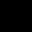

Frame 1130: Predicted Class = 76


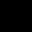

Frame 1131: Predicted Class = 76


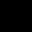

Frame 1132: Predicted Class = 76


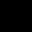

Frame 1133: Predicted Class = 76


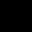

Frame 1134: Predicted Class = 76


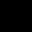

Frame 1135: Predicted Class = 76


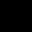

Frame 1136: Predicted Class = 76


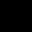

Frame 1137: Predicted Class = 76


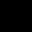

Frame 1138: Predicted Class = 76


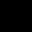

Frame 1139: Predicted Class = 76


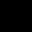

Frame 1140: Predicted Class = 76


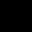

Frame 1141: Predicted Class = 76


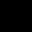

Frame 1142: Predicted Class = 76


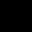

Frame 1143: Predicted Class = 76


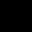

Frame 1144: Predicted Class = 76


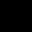

Frame 1145: Predicted Class = 76


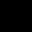

Frame 1146: Predicted Class = 76


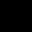

Frame 1147: Predicted Class = 76


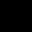

Frame 1148: Predicted Class = 76


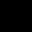

Frame 1149: Predicted Class = 76


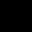

Frame 1150: Predicted Class = 76


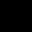

Frame 1151: Predicted Class = 76


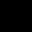

Frame 1152: Predicted Class = 76


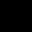

Frame 1153: Predicted Class = 76


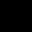

Frame 1154: Predicted Class = 76


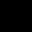

Frame 1155: Predicted Class = 76


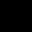

Frame 1156: Predicted Class = 76


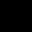

Frame 1157: Predicted Class = 76


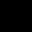

Frame 1158: Predicted Class = 76


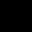

Frame 1159: Predicted Class = 76


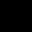

Frame 1160: Predicted Class = 76


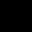

Frame 1161: Predicted Class = 76


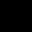

Frame 1162: Predicted Class = 76


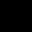

Frame 1163: Predicted Class = 76


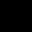

Frame 1164: Predicted Class = 76


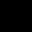

Frame 1165: Predicted Class = 76


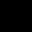

Frame 1166: Predicted Class = 76


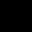

Frame 1167: Predicted Class = 76


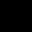

Frame 1168: Predicted Class = 76


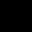

Frame 1169: Predicted Class = 76


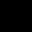

Frame 1170: Predicted Class = 76


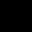

Frame 1171: Predicted Class = 76


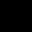

Frame 1172: Predicted Class = 76


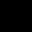

Frame 1173: Predicted Class = 76


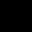

Frame 1174: Predicted Class = 76


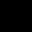

Frame 1175: Predicted Class = 76


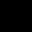

Frame 1176: Predicted Class = 76


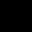

Frame 1177: Predicted Class = 76


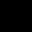

Frame 1178: Predicted Class = 76


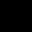

Frame 1179: Predicted Class = 76


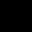

Frame 1180: Predicted Class = 76


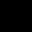

Frame 1181: Predicted Class = 76


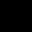

Frame 1182: Predicted Class = 76


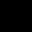

Frame 1183: Predicted Class = 76


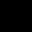

Frame 1184: Predicted Class = 76


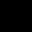

Frame 1185: Predicted Class = 76


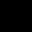

Frame 1186: Predicted Class = 76


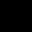

Frame 1187: Predicted Class = 76


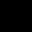

Frame 1188: Predicted Class = 76


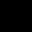

Frame 1189: Predicted Class = 76


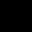

Frame 1190: Predicted Class = 76


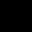

Frame 1191: Predicted Class = 76


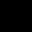

Frame 1192: Predicted Class = 76


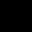

Frame 1193: Predicted Class = 76


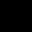

Frame 1194: Predicted Class = 76


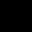

Frame 1195: Predicted Class = 76


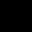

Frame 1196: Predicted Class = 76


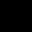

Frame 1197: Predicted Class = 76


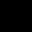

Frame 1198: Predicted Class = 76


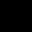

Frame 1199: Predicted Class = 76


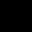

Frame 1200: Predicted Class = 76


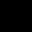

Frame 1201: Predicted Class = 76


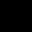

Frame 1202: Predicted Class = 76


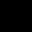

Frame 1203: Predicted Class = 76


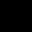

Frame 1204: Predicted Class = 76


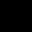

Frame 1205: Predicted Class = 76


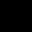

Frame 1206: Predicted Class = 76


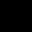

Frame 1207: Predicted Class = 76


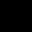

Frame 1208: Predicted Class = 76


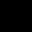

Frame 1209: Predicted Class = 76


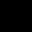

Frame 1210: Predicted Class = 76


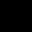

Frame 1211: Predicted Class = 76


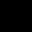

Frame 1212: Predicted Class = 76


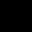

Frame 1213: Predicted Class = 76


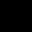

Frame 1214: Predicted Class = 76


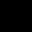

Frame 1215: Predicted Class = 76


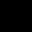

Frame 1216: Predicted Class = 76


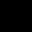

Frame 1217: Predicted Class = 76


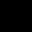

Frame 1218: Predicted Class = 76


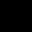

Frame 1219: Predicted Class = 76


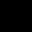

Frame 1220: Predicted Class = 76


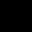

Frame 1221: Predicted Class = 76


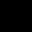

Frame 1222: Predicted Class = 76


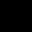

Frame 1223: Predicted Class = 76


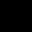

Frame 1224: Predicted Class = 76


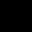

Frame 1225: Predicted Class = 76


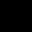

Frame 1226: Predicted Class = 76


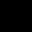

Frame 1227: Predicted Class = 76


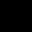

Frame 1228: Predicted Class = 76


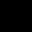

Frame 1229: Predicted Class = 76


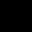

Frame 1230: Predicted Class = 76


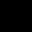

Frame 1231: Predicted Class = 76


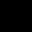

Frame 1232: Predicted Class = 76


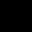

Frame 1233: Predicted Class = 76


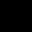

Frame 1234: Predicted Class = 76


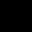

Frame 1235: Predicted Class = 76


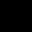

Frame 1236: Predicted Class = 76


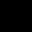

Frame 1237: Predicted Class = 76


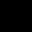

Frame 1238: Predicted Class = 76


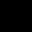

Frame 1239: Predicted Class = 76


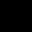

Frame 1240: Predicted Class = 76


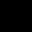

Frame 1241: Predicted Class = 76


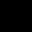

Frame 1242: Predicted Class = 76


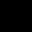

Frame 1243: Predicted Class = 76


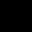

Frame 1244: Predicted Class = 76


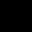

Frame 1245: Predicted Class = 76


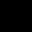

Frame 1246: Predicted Class = 76


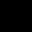

Frame 1247: Predicted Class = 76


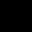

Frame 1248: Predicted Class = 76


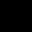

Frame 1249: Predicted Class = 76


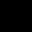

Frame 1250: Predicted Class = 76


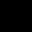

Frame 1251: Predicted Class = 76


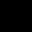

Frame 1252: Predicted Class = 76


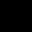

Frame 1253: Predicted Class = 76


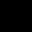

Frame 1254: Predicted Class = 76


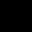

Frame 1255: Predicted Class = 76


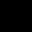

Frame 1256: Predicted Class = 76


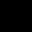

Frame 1257: Predicted Class = 76


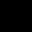

Frame 1258: Predicted Class = 76


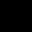

Frame 1259: Predicted Class = 76


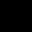

Frame 1260: Predicted Class = 76


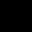

Frame 1261: Predicted Class = 76


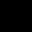

Frame 1262: Predicted Class = 76


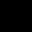

Frame 1263: Predicted Class = 76


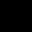

Frame 1264: Predicted Class = 76


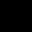

Frame 1265: Predicted Class = 76


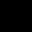

Frame 1266: Predicted Class = 76


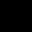

Frame 1267: Predicted Class = 76


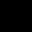

Frame 1268: Predicted Class = 76


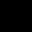

Frame 1269: Predicted Class = 76


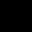

Frame 1270: Predicted Class = 76


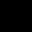

Frame 1271: Predicted Class = 76


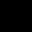

Frame 1272: Predicted Class = 76


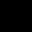

Frame 1273: Predicted Class = 76


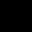

Frame 1274: Predicted Class = 76


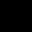

Frame 1275: Predicted Class = 76


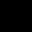

Frame 1276: Predicted Class = 76


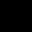

Frame 1277: Predicted Class = 76


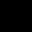

Frame 1278: Predicted Class = 76


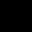

Frame 1279: Predicted Class = 76


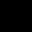

Frame 1280: Predicted Class = 76


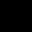

Frame 1281: Predicted Class = 76


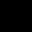

Frame 1282: Predicted Class = 76


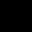

Frame 1283: Predicted Class = 76


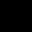

Frame 1284: Predicted Class = 76


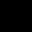

Frame 1285: Predicted Class = 76


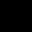

Frame 1286: Predicted Class = 76


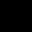

Frame 1287: Predicted Class = 76


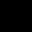

Frame 1288: Predicted Class = 76


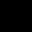

Frame 1289: Predicted Class = 76


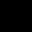

Frame 1290: Predicted Class = 76


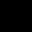

Frame 1291: Predicted Class = 76


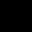

Frame 1292: Predicted Class = 76


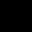

Frame 1293: Predicted Class = 76


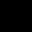

Frame 1294: Predicted Class = 76


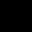

Frame 1295: Predicted Class = 76


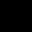

Frame 1296: Predicted Class = 76


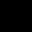

Frame 1297: Predicted Class = 76


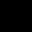

Frame 1298: Predicted Class = 76


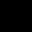

Frame 1299: Predicted Class = 76


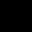

Frame 1300: Predicted Class = 76


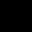

Frame 1301: Predicted Class = 76


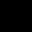

Frame 1302: Predicted Class = 76


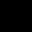

Frame 1303: Predicted Class = 76


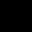

Frame 1304: Predicted Class = 76


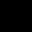

Frame 1305: Predicted Class = 76


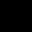

Frame 1306: Predicted Class = 76


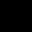

Frame 1307: Predicted Class = 76


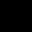

Frame 1308: Predicted Class = 76


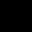

Frame 1309: Predicted Class = 76


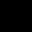

Frame 1310: Predicted Class = 76


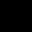

Frame 1311: Predicted Class = 76


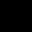

Frame 1312: Predicted Class = 76


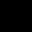

Frame 1313: Predicted Class = 76


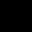

Frame 1314: Predicted Class = 76


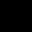

Frame 1315: Predicted Class = 76


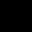

Frame 1316: Predicted Class = 76


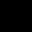

Frame 1317: Predicted Class = 76


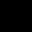

Frame 1318: Predicted Class = 76


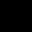

Frame 1319: Predicted Class = 76


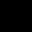

Frame 1320: Predicted Class = 76


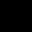

Frame 1321: Predicted Class = 76


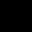

Frame 1322: Predicted Class = 76


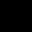

Frame 1323: Predicted Class = 76


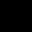

Frame 1324: Predicted Class = 76


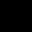

Frame 1325: Predicted Class = 76


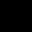

Frame 1326: Predicted Class = 76


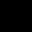

Frame 1327: Predicted Class = 76


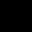

Frame 1328: Predicted Class = 76


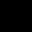

Frame 1329: Predicted Class = 76


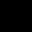

Frame 1330: Predicted Class = 76


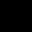

Frame 1331: Predicted Class = 76


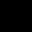

Frame 1332: Predicted Class = 76


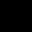

Frame 1333: Predicted Class = 76


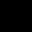

Frame 1334: Predicted Class = 76


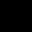

Frame 1335: Predicted Class = 76


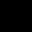

Frame 1336: Predicted Class = 76


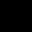

Frame 1337: Predicted Class = 76


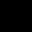

Frame 1338: Predicted Class = 76


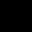

Frame 1339: Predicted Class = 76


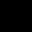

Frame 1340: Predicted Class = 76


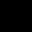

Frame 1341: Predicted Class = 76


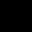

Frame 1342: Predicted Class = 76


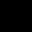

Frame 1343: Predicted Class = 76


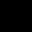

Frame 1344: Predicted Class = 76


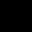

Frame 1345: Predicted Class = 76


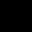

Frame 1346: Predicted Class = 76


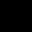

Frame 1347: Predicted Class = 76


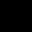

Frame 1348: Predicted Class = 76


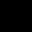

Frame 1349: Predicted Class = 76


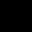

Frame 1350: Predicted Class = 76


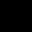

Frame 1351: Predicted Class = 76


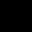

Frame 1352: Predicted Class = 76


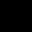

Frame 1353: Predicted Class = 76


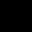

Frame 1354: Predicted Class = 76


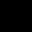

Frame 1355: Predicted Class = 76


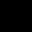

Frame 1356: Predicted Class = 76


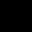

Frame 1357: Predicted Class = 76


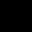

Frame 1358: Predicted Class = 76


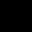

Frame 1359: Predicted Class = 76


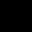

Frame 1360: Predicted Class = 76


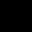

Frame 1361: Predicted Class = 76


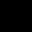

Frame 1362: Predicted Class = 76


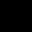

Frame 1363: Predicted Class = 76


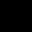

Frame 1364: Predicted Class = 76


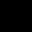

Frame 1365: Predicted Class = 76


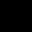

Frame 1366: Predicted Class = 76


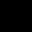

Frame 1367: Predicted Class = 76


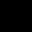

Frame 1368: Predicted Class = 76


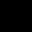

Frame 1369: Predicted Class = 76


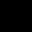

Frame 1370: Predicted Class = 76


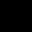

Frame 1371: Predicted Class = 76


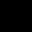

Frame 1372: Predicted Class = 76


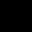

Frame 1373: Predicted Class = 76


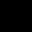

Frame 1374: Predicted Class = 76


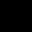

Frame 1375: Predicted Class = 76


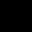

Frame 1376: Predicted Class = 76


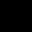

Frame 1377: Predicted Class = 76


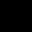

Frame 1378: Predicted Class = 76


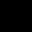

Frame 1379: Predicted Class = 76


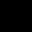

Frame 1380: Predicted Class = 76


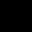

Frame 1381: Predicted Class = 76


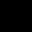

Frame 1382: Predicted Class = 76


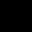

Frame 1383: Predicted Class = 76


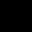

Frame 1384: Predicted Class = 76


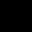

Frame 1385: Predicted Class = 76


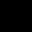

Frame 1386: Predicted Class = 76


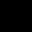

Frame 1387: Predicted Class = 76


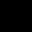

Frame 1388: Predicted Class = 76


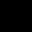

Frame 1389: Predicted Class = 76


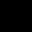

Frame 1390: Predicted Class = 76


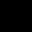

Frame 1391: Predicted Class = 76


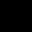

Frame 1392: Predicted Class = 76


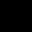

Frame 1393: Predicted Class = 76


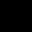

Frame 1394: Predicted Class = 76


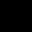

Frame 1395: Predicted Class = 76


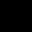

Frame 1396: Predicted Class = 76


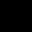

Frame 1397: Predicted Class = 76


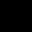

Frame 1398: Predicted Class = 76


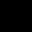

Frame 1399: Predicted Class = 76


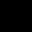

Frame 1400: Predicted Class = 76


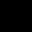

Frame 1401: Predicted Class = 76


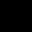

Frame 1402: Predicted Class = 76


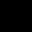

Frame 1403: Predicted Class = 76


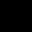

Frame 1404: Predicted Class = 76


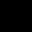

Frame 1405: Predicted Class = 76


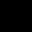

Frame 1406: Predicted Class = 76


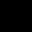

Frame 1407: Predicted Class = 76


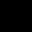

Frame 1408: Predicted Class = 76


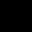

Frame 1409: Predicted Class = 76


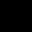

Frame 1410: Predicted Class = 76


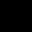

Frame 1411: Predicted Class = 76


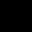

Frame 1412: Predicted Class = 76


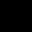

Frame 1413: Predicted Class = 76


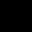

Frame 1414: Predicted Class = 76


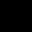

Frame 1415: Predicted Class = 76


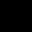

Frame 1416: Predicted Class = 76


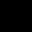

Frame 1417: Predicted Class = 76


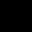

Frame 1418: Predicted Class = 76


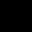

Frame 1419: Predicted Class = 76


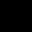

Frame 1420: Predicted Class = 76


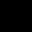

Frame 1421: Predicted Class = 76


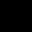

Frame 1422: Predicted Class = 76


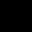

Frame 1423: Predicted Class = 76


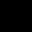

Frame 1424: Predicted Class = 76


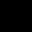

Frame 1425: Predicted Class = 76


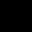

Frame 1426: Predicted Class = 76


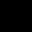

Frame 1427: Predicted Class = 76


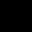

Frame 1428: Predicted Class = 76


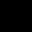

Frame 1429: Predicted Class = 76


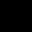

Frame 1430: Predicted Class = 76


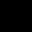

Frame 1431: Predicted Class = 76


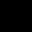

Frame 1432: Predicted Class = 76


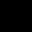

Frame 1433: Predicted Class = 76


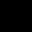

Frame 1434: Predicted Class = 76


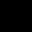

Frame 1435: Predicted Class = 76


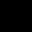

Frame 1436: Predicted Class = 76


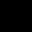

Frame 1437: Predicted Class = 76


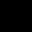

Frame 1438: Predicted Class = 76


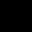

Frame 1439: Predicted Class = 76


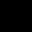

Frame 1440: Predicted Class = 76


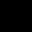

Frame 1441: Predicted Class = 76


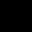

Frame 1442: Predicted Class = 76


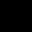

Frame 1443: Predicted Class = 76


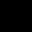

Frame 1444: Predicted Class = 76


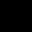

Frame 1445: Predicted Class = 76


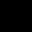

Frame 1446: Predicted Class = 76


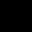

Frame 1447: Predicted Class = 76


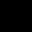

Frame 1448: Predicted Class = 76


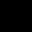

Frame 1449: Predicted Class = 76


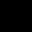

Frame 1450: Predicted Class = 76


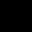

Frame 1451: Predicted Class = 76


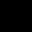

Frame 1452: Predicted Class = 76


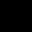

Frame 1453: Predicted Class = 76


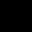

Frame 1454: Predicted Class = 76


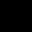

Frame 1455: Predicted Class = 76


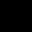

Frame 1456: Predicted Class = 76


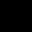

Frame 1457: Predicted Class = 76


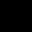

Frame 1458: Predicted Class = 76


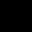

Frame 1459: Predicted Class = 76


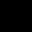

Frame 1460: Predicted Class = 76


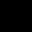

Frame 1461: Predicted Class = 76


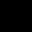

Frame 1462: Predicted Class = 76


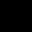

Frame 1463: Predicted Class = 76


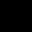

Frame 1464: Predicted Class = 76


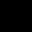

Frame 1465: Predicted Class = 76


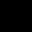

Frame 1466: Predicted Class = 76


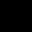

Frame 1467: Predicted Class = 76


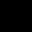

Frame 1468: Predicted Class = 76


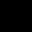

Frame 1469: Predicted Class = 76


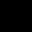

Frame 1470: Predicted Class = 76


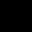

Frame 1471: Predicted Class = 76


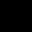

Frame 1472: Predicted Class = 76


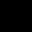

Frame 1473: Predicted Class = 76


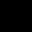

Frame 1474: Predicted Class = 76


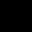

Frame 1475: Predicted Class = 76


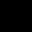

Frame 1476: Predicted Class = 76


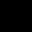

Frame 1477: Predicted Class = 76


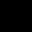

Frame 1478: Predicted Class = 76


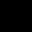

Frame 1479: Predicted Class = 76


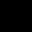

Frame 1480: Predicted Class = 76


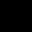

Frame 1481: Predicted Class = 76


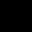

Frame 1482: Predicted Class = 76


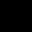

Frame 1483: Predicted Class = 76


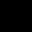

Frame 1484: Predicted Class = 76


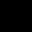

Frame 1485: Predicted Class = 76


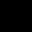

Frame 1486: Predicted Class = 76


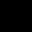

Frame 1487: Predicted Class = 76


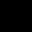

Frame 1488: Predicted Class = 76


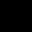

Frame 1489: Predicted Class = 76


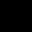

Frame 1490: Predicted Class = 76


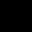

Frame 1491: Predicted Class = 76


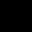

Frame 1492: Predicted Class = 76


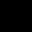

Frame 1493: Predicted Class = 76


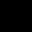

Frame 1494: Predicted Class = 76


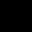

Frame 1495: Predicted Class = 76


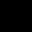

Frame 1496: Predicted Class = 76


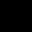

Frame 1497: Predicted Class = 76


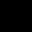

Frame 1498: Predicted Class = 76


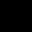

Frame 1499: Predicted Class = 76


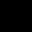

Frame 1500: Predicted Class = 76


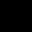

Frame 1501: Predicted Class = 76


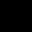

Frame 1502: Predicted Class = 76


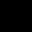

Frame 1503: Predicted Class = 76


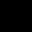

Frame 1504: Predicted Class = 76


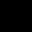

Frame 1505: Predicted Class = 76


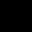

Frame 1506: Predicted Class = 76


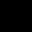

Frame 1507: Predicted Class = 76


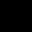

Frame 1508: Predicted Class = 76


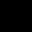

Frame 1509: Predicted Class = 76


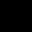

Frame 1510: Predicted Class = 76


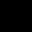

Frame 1511: Predicted Class = 76


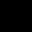

Frame 1512: Predicted Class = 76


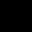

Frame 1513: Predicted Class = 76


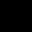

Frame 1514: Predicted Class = 76


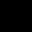

Frame 1515: Predicted Class = 76


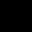

Frame 1516: Predicted Class = 76


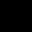

Frame 1517: Predicted Class = 76


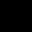

Frame 1518: Predicted Class = 76


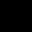

Frame 1519: Predicted Class = 76


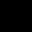

Frame 1520: Predicted Class = 76


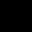

Frame 1521: Predicted Class = 76


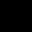

Frame 1522: Predicted Class = 76


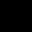

Frame 1523: Predicted Class = 76


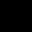

Frame 1524: Predicted Class = 76


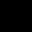

Frame 1525: Predicted Class = 76


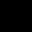

Frame 1526: Predicted Class = 76


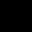

Frame 1527: Predicted Class = 76


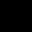

Frame 1528: Predicted Class = 76


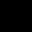

Frame 1529: Predicted Class = 76


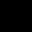

Frame 1530: Predicted Class = 76


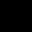

Frame 1531: Predicted Class = 76


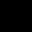

Frame 1532: Predicted Class = 76


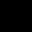

Frame 1533: Predicted Class = 76


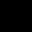

Frame 1534: Predicted Class = 76


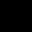

Frame 1535: Predicted Class = 76


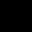

Frame 1536: Predicted Class = 76


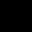

Frame 1537: Predicted Class = 76


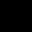

Frame 1538: Predicted Class = 76


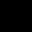

Frame 1539: Predicted Class = 76


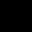

Frame 1540: Predicted Class = 76


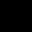

Frame 1541: Predicted Class = 76


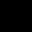

Frame 1542: Predicted Class = 76


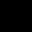

Frame 1543: Predicted Class = 76


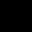

Frame 1544: Predicted Class = 76


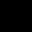

Frame 1545: Predicted Class = 76


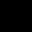

Frame 1546: Predicted Class = 76


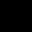

Frame 1547: Predicted Class = 76


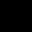

Frame 1548: Predicted Class = 76


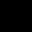

Frame 1549: Predicted Class = 76


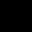

Frame 1550: Predicted Class = 76


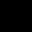

Frame 1551: Predicted Class = 76


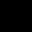

Frame 1552: Predicted Class = 76


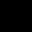

Frame 1553: Predicted Class = 76


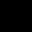

Frame 1554: Predicted Class = 76


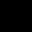

Frame 1555: Predicted Class = 76


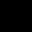

Frame 1556: Predicted Class = 76


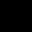

Frame 1557: Predicted Class = 76


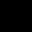

Frame 1558: Predicted Class = 76


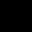

Frame 1559: Predicted Class = 76


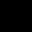

Frame 1560: Predicted Class = 76


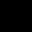

Frame 1561: Predicted Class = 76


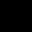

Frame 1562: Predicted Class = 76


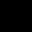

Frame 1563: Predicted Class = 76


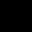

Frame 1564: Predicted Class = 76


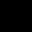

Frame 1565: Predicted Class = 76


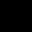

Frame 1566: Predicted Class = 76


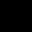

Frame 1567: Predicted Class = 76


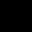

Frame 1568: Predicted Class = 76


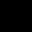

Frame 1569: Predicted Class = 76


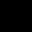

Frame 1570: Predicted Class = 76


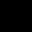

Frame 1571: Predicted Class = 76


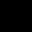

Frame 1572: Predicted Class = 76


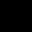

Frame 1573: Predicted Class = 76


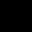

Frame 1574: Predicted Class = 76


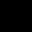

Frame 1575: Predicted Class = 76


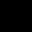

Frame 1576: Predicted Class = 76


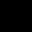

Frame 1577: Predicted Class = 76


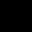

Frame 1578: Predicted Class = 76


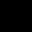

Frame 1579: Predicted Class = 76


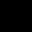

Frame 1580: Predicted Class = 76


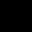

Frame 1581: Predicted Class = 76


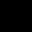

Frame 1582: Predicted Class = 76


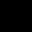

Frame 1583: Predicted Class = 76


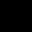

Frame 1584: Predicted Class = 76


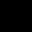

Frame 1585: Predicted Class = 76


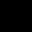

Frame 1586: Predicted Class = 76


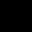

Frame 1587: Predicted Class = 76


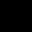

Frame 1588: Predicted Class = 76


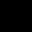

Frame 1589: Predicted Class = 76


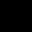

Frame 1590: Predicted Class = 76


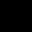

Frame 1591: Predicted Class = 76


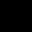

Frame 1592: Predicted Class = 76


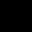

Frame 1593: Predicted Class = 76


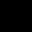

Frame 1594: Predicted Class = 76


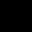

Frame 1595: Predicted Class = 76


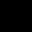

Frame 1596: Predicted Class = 76


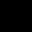

Frame 1597: Predicted Class = 76


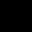

Frame 1598: Predicted Class = 76


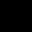

Frame 1599: Predicted Class = 76


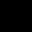

Frame 1600: Predicted Class = 76


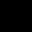

Frame 1601: Predicted Class = 76


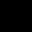

Frame 1602: Predicted Class = 76


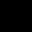

Frame 1603: Predicted Class = 76


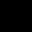

Frame 1604: Predicted Class = 76


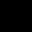

Frame 1605: Predicted Class = 76


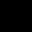

Frame 1606: Predicted Class = 76


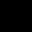

Frame 1607: Predicted Class = 76


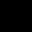

Frame 1608: Predicted Class = 76


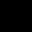

Frame 1609: Predicted Class = 76


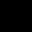

Frame 1610: Predicted Class = 76


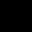

Frame 1611: Predicted Class = 76


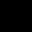

Frame 1612: Predicted Class = 76


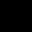

Frame 1613: Predicted Class = 76


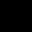

Frame 1614: Predicted Class = 76


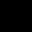

Frame 1615: Predicted Class = 76


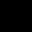

Frame 1616: Predicted Class = 76


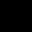

Frame 1617: Predicted Class = 76


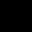

Frame 1618: Predicted Class = 76


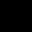

Frame 1619: Predicted Class = 76


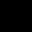

Frame 1620: Predicted Class = 76


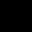

Frame 1621: Predicted Class = 76


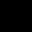

Frame 1622: Predicted Class = 76


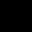

Frame 1623: Predicted Class = 76


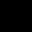

Frame 1624: Predicted Class = 76


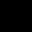

Frame 1625: Predicted Class = 76


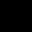

Frame 1626: Predicted Class = 76


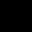

Frame 1627: Predicted Class = 76


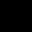

Frame 1628: Predicted Class = 76


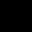

Frame 1629: Predicted Class = 76


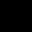

Frame 1630: Predicted Class = 76


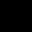

Frame 1631: Predicted Class = 76


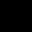

Frame 1632: Predicted Class = 76


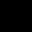

Frame 1633: Predicted Class = 76


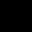

Frame 1634: Predicted Class = 76


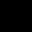

Frame 1635: Predicted Class = 76


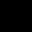

Frame 1636: Predicted Class = 76


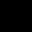

Frame 1637: Predicted Class = 76


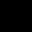

Frame 1638: Predicted Class = 76


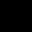

Frame 1639: Predicted Class = 76


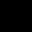

Frame 1640: Predicted Class = 76


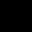

Frame 1641: Predicted Class = 76


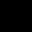

Frame 1642: Predicted Class = 76


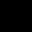

Frame 1643: Predicted Class = 76


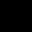

Frame 1644: Predicted Class = 76


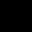

Frame 1645: Predicted Class = 76


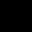

Frame 1646: Predicted Class = 76


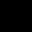

Frame 1647: Predicted Class = 76


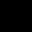

Frame 1648: Predicted Class = 76


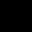

Frame 1649: Predicted Class = 76


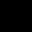

Frame 1650: Predicted Class = 76


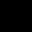

Frame 1651: Predicted Class = 76


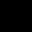

Frame 1652: Predicted Class = 76


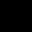

Frame 1653: Predicted Class = 76


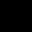

Frame 1654: Predicted Class = 76


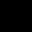

Frame 1655: Predicted Class = 76


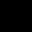

Frame 1656: Predicted Class = 76


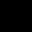

Frame 1657: Predicted Class = 76


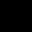

Frame 1658: Predicted Class = 76


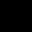

Frame 1659: Predicted Class = 76


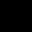

Frame 1660: Predicted Class = 76


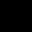

Frame 1661: Predicted Class = 76


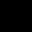

Frame 1662: Predicted Class = 76


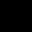

Frame 1663: Predicted Class = 76


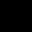

Frame 1664: Predicted Class = 76


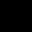

Frame 1665: Predicted Class = 76


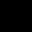

Frame 1666: Predicted Class = 76


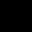

Frame 1667: Predicted Class = 76


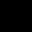

Frame 1668: Predicted Class = 76


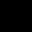

Frame 1669: Predicted Class = 76


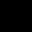

Frame 1670: Predicted Class = 76


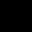

Frame 1671: Predicted Class = 76


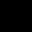

Frame 1672: Predicted Class = 76


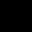

Frame 1673: Predicted Class = 76


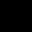

Frame 1674: Predicted Class = 76


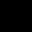

Frame 1675: Predicted Class = 76


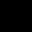

Frame 1676: Predicted Class = 76


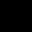

Frame 1677: Predicted Class = 76


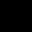

Frame 1678: Predicted Class = 76


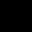

Frame 1679: Predicted Class = 76


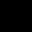

Frame 1680: Predicted Class = 76


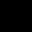

Frame 1681: Predicted Class = 76


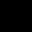

Frame 1682: Predicted Class = 76


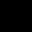

Frame 1683: Predicted Class = 76


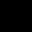

Frame 1684: Predicted Class = 76


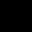

Frame 1685: Predicted Class = 76


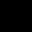

Frame 1686: Predicted Class = 76


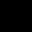

Frame 1687: Predicted Class = 76


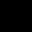

Frame 1688: Predicted Class = 76


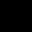

Frame 1689: Predicted Class = 76


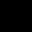

Frame 1690: Predicted Class = 76


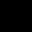

Frame 1691: Predicted Class = 76


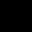

Frame 1692: Predicted Class = 76


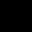

Frame 1693: Predicted Class = 76


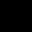

Frame 1694: Predicted Class = 76


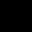

Frame 1695: Predicted Class = 76


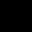

Frame 1696: Predicted Class = 76


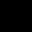

Frame 1697: Predicted Class = 76


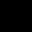

Frame 1698: Predicted Class = 76


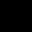

Frame 1699: Predicted Class = 76


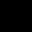

Frame 1700: Predicted Class = 76


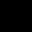

Frame 1701: Predicted Class = 76


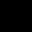

Frame 1702: Predicted Class = 76


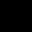

Frame 1703: Predicted Class = 76


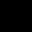

Frame 1704: Predicted Class = 76


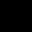

Frame 1705: Predicted Class = 76


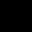

Frame 1706: Predicted Class = 76


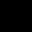

Frame 1707: Predicted Class = 76


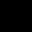

Frame 1708: Predicted Class = 76


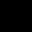

Frame 1709: Predicted Class = 76


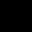

Frame 1710: Predicted Class = 76


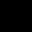

Frame 1711: Predicted Class = 76


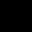

Frame 1712: Predicted Class = 76


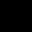

Frame 1713: Predicted Class = 76


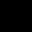

Frame 1714: Predicted Class = 76


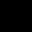

Frame 1715: Predicted Class = 76


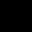

Frame 1716: Predicted Class = 76


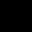

Frame 1717: Predicted Class = 76


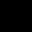

Frame 1718: Predicted Class = 76


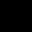

Frame 1719: Predicted Class = 76


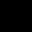

Frame 1720: Predicted Class = 76


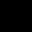

Frame 1721: Predicted Class = 76


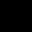

Frame 1722: Predicted Class = 76


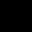

Frame 1723: Predicted Class = 76


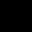

Frame 1724: Predicted Class = 76


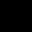

Frame 1725: Predicted Class = 76


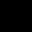

Frame 1726: Predicted Class = 76


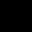

Frame 1727: Predicted Class = 76


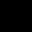

Frame 1728: Predicted Class = 76


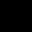

Frame 1729: Predicted Class = 76


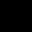

Frame 1730: Predicted Class = 76


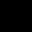

Frame 1731: Predicted Class = 76


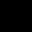

Frame 1732: Predicted Class = 76


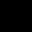

Frame 1733: Predicted Class = 76


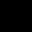

Frame 1734: Predicted Class = 76


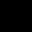

Frame 1735: Predicted Class = 76


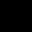

Frame 1736: Predicted Class = 76


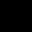

Frame 1737: Predicted Class = 76


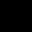

Frame 1738: Predicted Class = 76


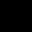

Frame 1739: Predicted Class = 76


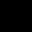

Frame 1740: Predicted Class = 76


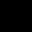

Frame 1741: Predicted Class = 76


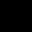

Frame 1742: Predicted Class = 76


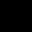

Frame 1743: Predicted Class = 76


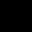

Frame 1744: Predicted Class = 76


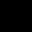

Frame 1745: Predicted Class = 76


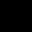

Frame 1746: Predicted Class = 76


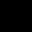

Frame 1747: Predicted Class = 76


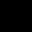

Frame 1748: Predicted Class = 76


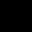

Frame 1749: Predicted Class = 76


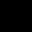

Frame 1750: Predicted Class = 76


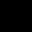

Frame 1751: Predicted Class = 76


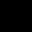

Frame 1752: Predicted Class = 76


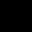

Frame 1753: Predicted Class = 76


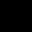

Frame 1754: Predicted Class = 76


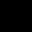

Frame 1755: Predicted Class = 76


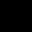

Frame 1756: Predicted Class = 76


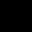

Frame 1757: Predicted Class = 76


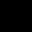

Frame 1758: Predicted Class = 76


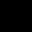

Frame 1759: Predicted Class = 76


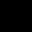

Frame 1760: Predicted Class = 76


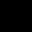

Frame 1761: Predicted Class = 76


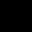

Frame 1762: Predicted Class = 76


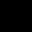

Frame 1763: Predicted Class = 76


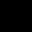

Frame 1764: Predicted Class = 76


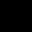

Frame 1765: Predicted Class = 76


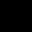

Frame 1766: Predicted Class = 76


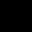

Frame 1767: Predicted Class = 76


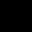

Frame 1768: Predicted Class = 76


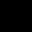

Frame 1769: Predicted Class = 76


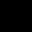

Frame 1770: Predicted Class = 76


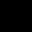

Frame 1771: Predicted Class = 76


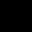

Frame 1772: Predicted Class = 76


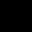

Frame 1773: Predicted Class = 76


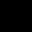

Frame 1774: Predicted Class = 76


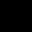

Frame 1775: Predicted Class = 76


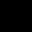

Frame 1776: Predicted Class = 76


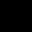

Frame 1777: Predicted Class = 76


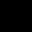

Frame 1778: Predicted Class = 76


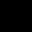

Frame 1779: Predicted Class = 76


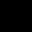

Frame 1780: Predicted Class = 76


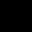

Frame 1781: Predicted Class = 76


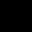

Frame 1782: Predicted Class = 76


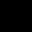

Frame 1783: Predicted Class = 76


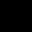

Frame 1784: Predicted Class = 76


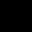

Frame 1785: Predicted Class = 76


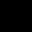

Frame 1786: Predicted Class = 76


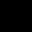

Frame 1787: Predicted Class = 76


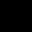

Frame 1788: Predicted Class = 76


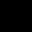

Frame 1789: Predicted Class = 76


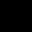

Frame 1790: Predicted Class = 76


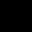

Frame 1791: Predicted Class = 76


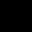

Frame 1792: Predicted Class = 76


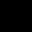

Frame 1793: Predicted Class = 76


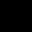

Frame 1794: Predicted Class = 76


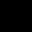

Frame 1795: Predicted Class = 76


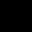

Frame 1796: Predicted Class = 76


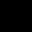

Frame 1797: Predicted Class = 76


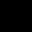

Frame 1798: Predicted Class = 76


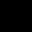

Frame 1799: Predicted Class = 76


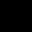

Frame 1800: Predicted Class = 76


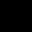

Frame 1801: Predicted Class = 76


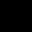

Frame 1802: Predicted Class = 76


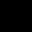

Frame 1803: Predicted Class = 76


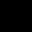

Frame 1804: Predicted Class = 76


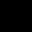

Frame 1805: Predicted Class = 76


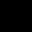

Frame 1806: Predicted Class = 76


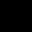

Frame 1807: Predicted Class = 76


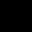

Frame 1808: Predicted Class = 76


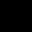

Frame 1809: Predicted Class = 76


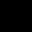

Frame 1810: Predicted Class = 76


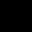

Frame 1811: Predicted Class = 76


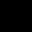

Frame 1812: Predicted Class = 76


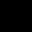

Frame 1813: Predicted Class = 76


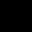

Frame 1814: Predicted Class = 76


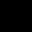

Frame 1815: Predicted Class = 76


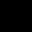

Frame 1816: Predicted Class = 76


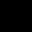

Frame 1817: Predicted Class = 76


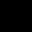

Frame 1818: Predicted Class = 76


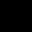

Frame 1819: Predicted Class = 76


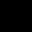

Frame 1820: Predicted Class = 76


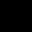

Frame 1821: Predicted Class = 76


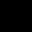

Frame 1822: Predicted Class = 76


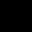

Frame 1823: Predicted Class = 76


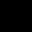

Frame 1824: Predicted Class = 76


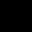

Frame 1825: Predicted Class = 76


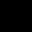

Frame 1826: Predicted Class = 76


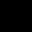

Frame 1827: Predicted Class = 76


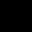

Frame 1828: Predicted Class = 76


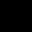

Frame 1829: Predicted Class = 76


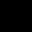

Frame 1830: Predicted Class = 76


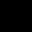

Frame 1831: Predicted Class = 76


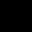

Frame 1832: Predicted Class = 76


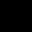

Frame 1833: Predicted Class = 76


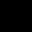

Frame 1834: Predicted Class = 76


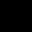

Frame 1835: Predicted Class = 76


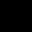

Frame 1836: Predicted Class = 76


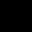

Frame 1837: Predicted Class = 76


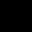

Frame 1838: Predicted Class = 76


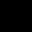

Frame 1839: Predicted Class = 76


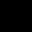

Frame 1840: Predicted Class = 76


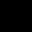

Frame 1841: Predicted Class = 76


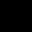

Frame 1842: Predicted Class = 76


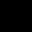

Frame 1843: Predicted Class = 76


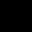

Frame 1844: Predicted Class = 76


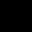

Frame 1845: Predicted Class = 76


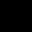

Frame 1846: Predicted Class = 76


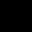

Frame 1847: Predicted Class = 76


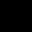

Frame 1848: Predicted Class = 76


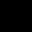

Frame 1849: Predicted Class = 76


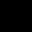

Frame 1850: Predicted Class = 76


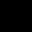

Frame 1851: Predicted Class = 76


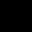

Frame 1852: Predicted Class = 76


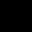

Frame 1853: Predicted Class = 76


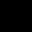

Frame 1854: Predicted Class = 76


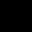

Frame 1855: Predicted Class = 76


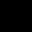

Frame 1856: Predicted Class = 76


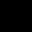

Frame 1857: Predicted Class = 76


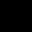

Frame 1858: Predicted Class = 76


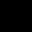

Frame 1859: Predicted Class = 76


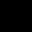

Frame 1860: Predicted Class = 76


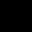

Frame 1861: Predicted Class = 76


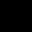

Frame 1862: Predicted Class = 76


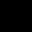

Frame 1863: Predicted Class = 76


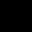

Frame 1864: Predicted Class = 76


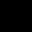

Frame 1865: Predicted Class = 76


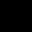

Frame 1866: Predicted Class = 76


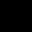

Frame 1867: Predicted Class = 76


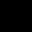

Frame 1868: Predicted Class = 76


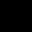

Frame 1869: Predicted Class = 76


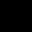

Frame 1870: Predicted Class = 76


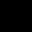

Frame 1871: Predicted Class = 76


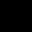

Frame 1872: Predicted Class = 76


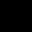

Frame 1873: Predicted Class = 76


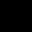

Frame 1874: Predicted Class = 76


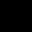

Frame 1875: Predicted Class = 76


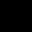

Frame 1876: Predicted Class = 76


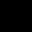

Frame 1877: Predicted Class = 76


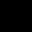

Frame 1878: Predicted Class = 76


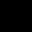

Frame 1879: Predicted Class = 76


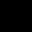

Frame 1880: Predicted Class = 76


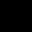

Frame 1881: Predicted Class = 76


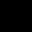

Frame 1882: Predicted Class = 76


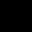

Frame 1883: Predicted Class = 76


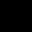

Frame 1884: Predicted Class = 76


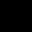

Frame 1885: Predicted Class = 76


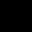

Frame 1886: Predicted Class = 76


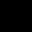

Frame 1887: Predicted Class = 76


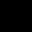

Frame 1888: Predicted Class = 76


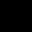

Frame 1889: Predicted Class = 76


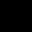

Frame 1890: Predicted Class = 76


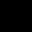

Frame 1891: Predicted Class = 76


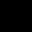

Frame 1892: Predicted Class = 76


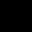

Frame 1893: Predicted Class = 76


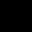

Frame 1894: Predicted Class = 76


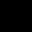

Frame 1895: Predicted Class = 76


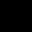

Frame 1896: Predicted Class = 76


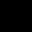

Frame 1897: Predicted Class = 76


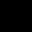

Frame 1898: Predicted Class = 76


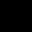

Frame 1899: Predicted Class = 76


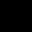

Frame 1900: Predicted Class = 76


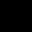

Frame 1901: Predicted Class = 76


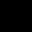

Frame 1902: Predicted Class = 76


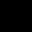

Frame 1903: Predicted Class = 76


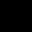

Frame 1904: Predicted Class = 76


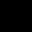

Frame 1905: Predicted Class = 76


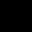

Frame 1906: Predicted Class = 76


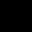

Frame 1907: Predicted Class = 76


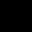

Frame 1908: Predicted Class = 76


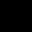

Frame 1909: Predicted Class = 76


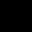

Frame 1910: Predicted Class = 76


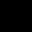

Frame 1911: Predicted Class = 76


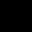

Frame 1912: Predicted Class = 76


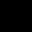

Frame 1913: Predicted Class = 76


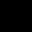

Frame 1914: Predicted Class = 76


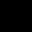

Frame 1915: Predicted Class = 76


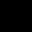

Frame 1916: Predicted Class = 76


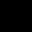

Frame 1917: Predicted Class = 76


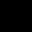

Frame 1918: Predicted Class = 76


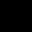

Frame 1919: Predicted Class = 76


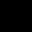

Frame 1920: Predicted Class = 76


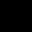

Frame 1921: Predicted Class = 76


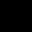

Frame 1922: Predicted Class = 76


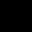

Frame 1923: Predicted Class = 76


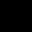

Frame 1924: Predicted Class = 76


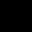

Frame 1925: Predicted Class = 76


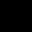

Frame 1926: Predicted Class = 76


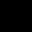

Frame 1927: Predicted Class = 76


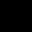

Frame 1928: Predicted Class = 76


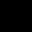

Frame 1929: Predicted Class = 76


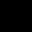

Frame 1930: Predicted Class = 76


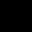

Frame 1931: Predicted Class = 76


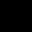

Frame 1932: Predicted Class = 76


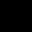

Frame 1933: Predicted Class = 76


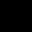

Frame 1934: Predicted Class = 76


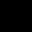

Frame 1935: Predicted Class = 76


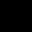

Frame 1936: Predicted Class = 76


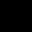

Frame 1937: Predicted Class = 76


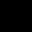

Frame 1938: Predicted Class = 76


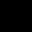

Frame 1939: Predicted Class = 76


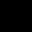

Frame 1940: Predicted Class = 76


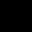

Frame 1941: Predicted Class = 76


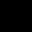

Frame 1942: Predicted Class = 76


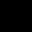

Frame 1943: Predicted Class = 76


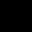

Frame 1944: Predicted Class = 76


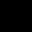

Frame 1945: Predicted Class = 76


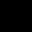

Frame 1946: Predicted Class = 76


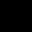

Frame 1947: Predicted Class = 76


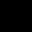

Frame 1948: Predicted Class = 76


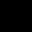

Frame 1949: Predicted Class = 76


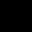

Frame 1950: Predicted Class = 76


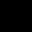

Frame 1951: Predicted Class = 76


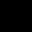

Frame 1952: Predicted Class = 76


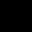

Frame 1953: Predicted Class = 76


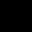

Frame 1954: Predicted Class = 76


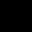

Frame 1955: Predicted Class = 76


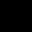

Frame 1956: Predicted Class = 76


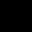

Frame 1957: Predicted Class = 76


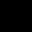

Frame 1958: Predicted Class = 76


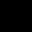

Frame 1959: Predicted Class = 76


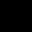

Frame 1960: Predicted Class = 76


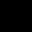

Frame 1961: Predicted Class = 76


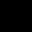

Frame 1962: Predicted Class = 76


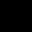

Frame 1963: Predicted Class = 76


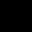

Frame 1964: Predicted Class = 76


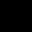

Frame 1965: Predicted Class = 76


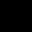

Frame 1966: Predicted Class = 76


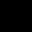

Frame 1967: Predicted Class = 76


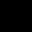

Frame 1968: Predicted Class = 76


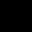

Frame 1969: Predicted Class = 76


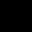

Frame 1970: Predicted Class = 76


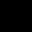

Frame 1971: Predicted Class = 76


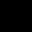

Frame 1972: Predicted Class = 76


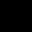

Frame 1973: Predicted Class = 76


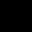

Frame 1974: Predicted Class = 76


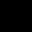

Frame 1975: Predicted Class = 76


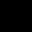

Frame 1976: Predicted Class = 76


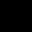

Frame 1977: Predicted Class = 76


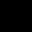

Frame 1978: Predicted Class = 76


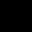

Frame 1979: Predicted Class = 76


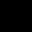

Frame 1980: Predicted Class = 76


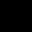

Frame 1981: Predicted Class = 76


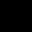

Frame 1982: Predicted Class = 76


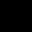

Frame 1983: Predicted Class = 76


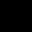

Frame 1984: Predicted Class = 76


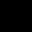

Frame 1985: Predicted Class = 76


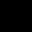

Frame 1986: Predicted Class = 76


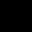

Frame 1987: Predicted Class = 76


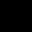

Frame 1988: Predicted Class = 76


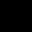

Frame 1989: Predicted Class = 76


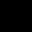

Frame 1990: Predicted Class = 76


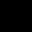

Frame 1991: Predicted Class = 76


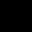

Frame 1992: Predicted Class = 76


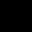

Frame 1993: Predicted Class = 76


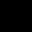

Frame 1994: Predicted Class = 76


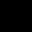

Frame 1995: Predicted Class = 76


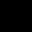

Frame 1996: Predicted Class = 76


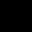

Frame 1997: Predicted Class = 76


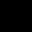

Frame 1998: Predicted Class = 76


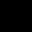

Frame 1999: Predicted Class = 76


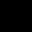

Frame 2000: Predicted Class = 76


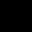

Frame 2001: Predicted Class = 76


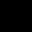

Frame 2002: Predicted Class = 76


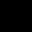

Frame 2003: Predicted Class = 76


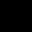

Frame 2004: Predicted Class = 76


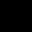

Frame 2005: Predicted Class = 76


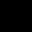

Frame 2006: Predicted Class = 76


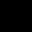

Frame 2007: Predicted Class = 76


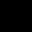

Frame 2008: Predicted Class = 76


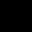

Frame 2009: Predicted Class = 76


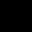

Frame 2010: Predicted Class = 76


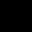

Frame 2011: Predicted Class = 76


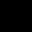

Frame 2012: Predicted Class = 76


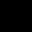

Frame 2013: Predicted Class = 76


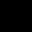

Frame 2014: Predicted Class = 76


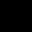

Frame 2015: Predicted Class = 76


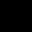

Frame 2016: Predicted Class = 76


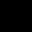

Frame 2017: Predicted Class = 76


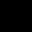

Frame 2018: Predicted Class = 76


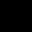

Frame 2019: Predicted Class = 76


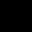

Frame 2020: Predicted Class = 76


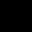

Frame 2021: Predicted Class = 76


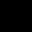

Frame 2022: Predicted Class = 76


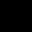

Frame 2023: Predicted Class = 76


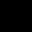

Frame 2024: Predicted Class = 76


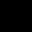

Frame 2025: Predicted Class = 76


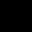

Frame 2026: Predicted Class = 76


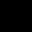

Frame 2027: Predicted Class = 76


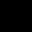

Frame 2028: Predicted Class = 76


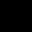

Frame 2029: Predicted Class = 76


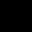

Frame 2030: Predicted Class = 76


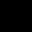

Frame 2031: Predicted Class = 76


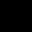

Frame 2032: Predicted Class = 76


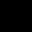

Frame 2033: Predicted Class = 76


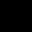

Frame 2034: Predicted Class = 76


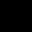

Frame 2035: Predicted Class = 76


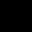

Frame 2036: Predicted Class = 76


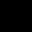

Frame 2037: Predicted Class = 76


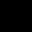

Frame 2038: Predicted Class = 76


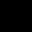

Frame 2039: Predicted Class = 76


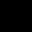

Frame 2040: Predicted Class = 76


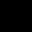

Frame 2041: Predicted Class = 76


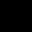

Frame 2042: Predicted Class = 76


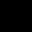

Frame 2043: Predicted Class = 76


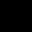

Frame 2044: Predicted Class = 76


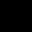

Frame 2045: Predicted Class = 76


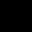

Frame 2046: Predicted Class = 76


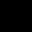

Frame 2047: Predicted Class = 76


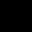

Frame 2048: Predicted Class = 76


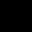

Frame 2049: Predicted Class = 76


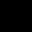

Frame 2050: Predicted Class = 76


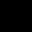

Frame 2051: Predicted Class = 76


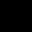

Frame 2052: Predicted Class = 76


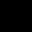

Frame 2053: Predicted Class = 76


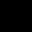

Frame 2054: Predicted Class = 76


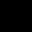

Frame 2055: Predicted Class = 76


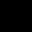

Frame 2056: Predicted Class = 76


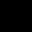

Frame 2057: Predicted Class = 76


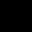

Frame 2058: Predicted Class = 76


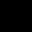

Frame 2059: Predicted Class = 76


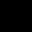

Frame 2060: Predicted Class = 76


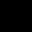

Frame 2061: Predicted Class = 76


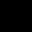

Frame 2062: Predicted Class = 76


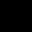

Frame 2063: Predicted Class = 76


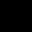

Frame 2064: Predicted Class = 76


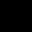

Frame 2065: Predicted Class = 76


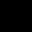

Frame 2066: Predicted Class = 76


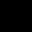

Frame 2067: Predicted Class = 76


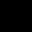

Frame 2068: Predicted Class = 76


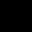

Frame 2069: Predicted Class = 76


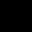

Frame 2070: Predicted Class = 76


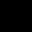

Frame 2071: Predicted Class = 76


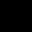

Frame 2072: Predicted Class = 76


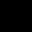

Frame 2073: Predicted Class = 76


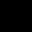

Frame 2074: Predicted Class = 76


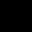

Frame 2075: Predicted Class = 76


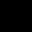

Frame 2076: Predicted Class = 76


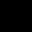

Frame 2077: Predicted Class = 76


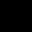

Frame 2078: Predicted Class = 76


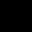

Frame 2079: Predicted Class = 76


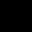

Frame 2080: Predicted Class = 76


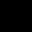

Frame 2081: Predicted Class = 76


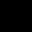

Frame 2082: Predicted Class = 76


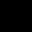

Frame 2083: Predicted Class = 76


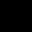

Frame 2084: Predicted Class = 76


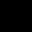

Frame 2085: Predicted Class = 76


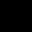

Frame 2086: Predicted Class = 76


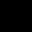

Frame 2087: Predicted Class = 76


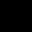

Frame 2088: Predicted Class = 76


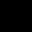

Frame 2089: Predicted Class = 76


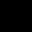

Frame 2090: Predicted Class = 76


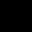

Frame 2091: Predicted Class = 76


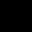

Frame 2092: Predicted Class = 76


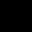

Frame 2093: Predicted Class = 76


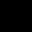

Frame 2094: Predicted Class = 76


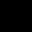

Frame 2095: Predicted Class = 76


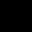

Frame 2096: Predicted Class = 76


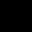

Frame 2097: Predicted Class = 76


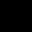

Frame 2098: Predicted Class = 76


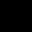

Frame 2099: Predicted Class = 76


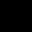

Frame 2100: Predicted Class = 76


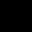

Frame 2101: Predicted Class = 76


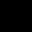

Frame 2102: Predicted Class = 76


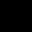

Frame 2103: Predicted Class = 76


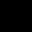

Frame 2104: Predicted Class = 76


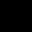

Frame 2105: Predicted Class = 76


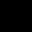

Frame 2106: Predicted Class = 76


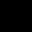

Frame 2107: Predicted Class = 76


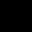

Frame 2108: Predicted Class = 76


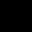

Frame 2109: Predicted Class = 76


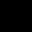

Frame 2110: Predicted Class = 76


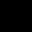

Frame 2111: Predicted Class = 76


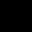

Frame 2112: Predicted Class = 76


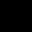

Frame 2113: Predicted Class = 76


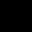

Frame 2114: Predicted Class = 76


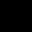

Frame 2115: Predicted Class = 76


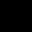

Frame 2116: Predicted Class = 76


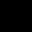

Frame 2117: Predicted Class = 76


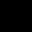

Frame 2118: Predicted Class = 76


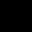

Frame 2119: Predicted Class = 76


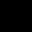

Frame 2120: Predicted Class = 76


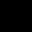

Frame 2121: Predicted Class = 76


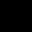

Frame 2122: Predicted Class = 76


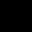

Frame 2123: Predicted Class = 76


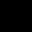

Frame 2124: Predicted Class = 76


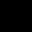

Frame 2125: Predicted Class = 76


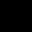

Frame 2126: Predicted Class = 76


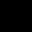

Frame 2127: Predicted Class = 76


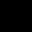

Frame 2128: Predicted Class = 76


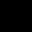

Frame 2129: Predicted Class = 76


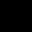

Frame 2130: Predicted Class = 76


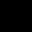

Frame 2131: Predicted Class = 76


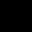

Frame 2132: Predicted Class = 76


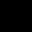

Frame 2133: Predicted Class = 76


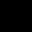

Frame 2134: Predicted Class = 76


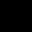

Frame 2135: Predicted Class = 76


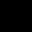

Frame 2136: Predicted Class = 76


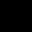

Frame 2137: Predicted Class = 76


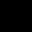

Frame 2138: Predicted Class = 76


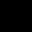

Frame 2139: Predicted Class = 76


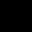

Frame 2140: Predicted Class = 76


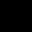

Frame 2141: Predicted Class = 76


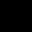

Frame 2142: Predicted Class = 76


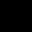

Frame 2143: Predicted Class = 76


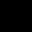

Frame 2144: Predicted Class = 76


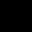

Frame 2145: Predicted Class = 76


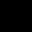

Frame 2146: Predicted Class = 76


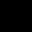

Frame 2147: Predicted Class = 76


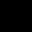

Frame 2148: Predicted Class = 76


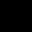

Frame 2149: Predicted Class = 76


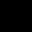

Frame 2150: Predicted Class = 76


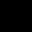

Frame 2151: Predicted Class = 76


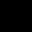

Frame 2152: Predicted Class = 76


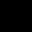

Frame 2153: Predicted Class = 76


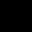

Frame 2154: Predicted Class = 76


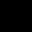

Frame 2155: Predicted Class = 76


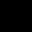

Frame 2156: Predicted Class = 76


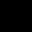

Frame 2157: Predicted Class = 76


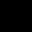

Frame 2158: Predicted Class = 76


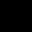

Frame 2159: Predicted Class = 76


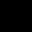

Frame 2160: Predicted Class = 76


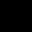

Frame 2161: Predicted Class = 76


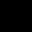

Frame 2162: Predicted Class = 76


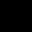

Frame 2163: Predicted Class = 76


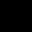

Frame 2164: Predicted Class = 76


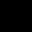

Frame 2165: Predicted Class = 76


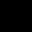

Frame 2166: Predicted Class = 76


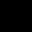

Frame 2167: Predicted Class = 76


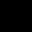

Frame 2168: Predicted Class = 76


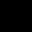

Frame 2169: Predicted Class = 76


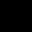

Frame 2170: Predicted Class = 76


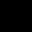

Frame 2171: Predicted Class = 76


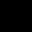

Frame 2172: Predicted Class = 76


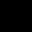

Frame 2173: Predicted Class = 76


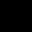

Frame 2174: Predicted Class = 76


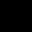

Frame 2175: Predicted Class = 76


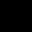

Frame 2176: Predicted Class = 76


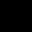

Frame 2177: Predicted Class = 76


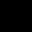

Frame 2178: Predicted Class = 76


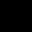

Frame 2179: Predicted Class = 76


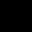

Frame 2180: Predicted Class = 76


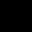

Frame 2181: Predicted Class = 76


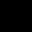

Frame 2182: Predicted Class = 76


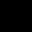

Frame 2183: Predicted Class = 76


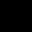

Frame 2184: Predicted Class = 76


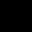

Frame 2185: Predicted Class = 76


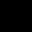

Frame 2186: Predicted Class = 76


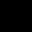

Frame 2187: Predicted Class = 76


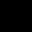

Frame 2188: Predicted Class = 76


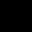

Frame 2189: Predicted Class = 76


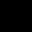

Frame 2190: Predicted Class = 76


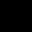

Frame 2191: Predicted Class = 76


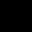

Frame 2192: Predicted Class = 76


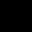

Frame 2193: Predicted Class = 76


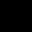

Frame 2194: Predicted Class = 76


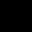

Frame 2195: Predicted Class = 76


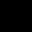

Frame 2196: Predicted Class = 76


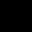

Frame 2197: Predicted Class = 76


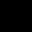

Frame 2198: Predicted Class = 76


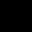

Frame 2199: Predicted Class = 76


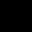

Frame 2200: Predicted Class = 76


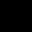

Frame 2201: Predicted Class = 76


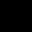

Frame 2202: Predicted Class = 76


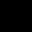

Frame 2203: Predicted Class = 76


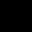

Frame 2204: Predicted Class = 76


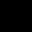

Frame 2205: Predicted Class = 76


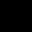

Frame 2206: Predicted Class = 76


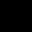

Frame 2207: Predicted Class = 76


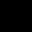

Frame 2208: Predicted Class = 76


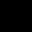

Frame 2209: Predicted Class = 76


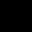

Frame 2210: Predicted Class = 76


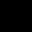

Frame 2211: Predicted Class = 76


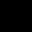

Frame 2212: Predicted Class = 76


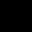

Frame 2213: Predicted Class = 76


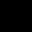

Frame 2214: Predicted Class = 76


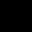

Frame 2215: Predicted Class = 76


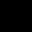

Frame 2216: Predicted Class = 76


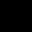

Frame 2217: Predicted Class = 76


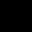

Frame 2218: Predicted Class = 76


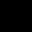

Frame 2219: Predicted Class = 76


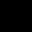

Frame 2220: Predicted Class = 76


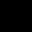

Frame 2221: Predicted Class = 76


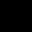

Frame 2222: Predicted Class = 76


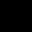

Frame 2223: Predicted Class = 76


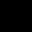

Frame 2224: Predicted Class = 76


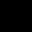

Frame 2225: Predicted Class = 76


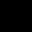

Frame 2226: Predicted Class = 76


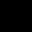

Frame 2227: Predicted Class = 76


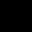

Frame 2228: Predicted Class = 76


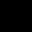

Frame 2229: Predicted Class = 76


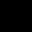

Frame 2230: Predicted Class = 76


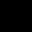

Frame 2231: Predicted Class = 76


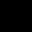

Frame 2232: Predicted Class = 76


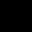

Frame 2233: Predicted Class = 76


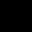

Frame 2234: Predicted Class = 76


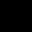

Frame 2235: Predicted Class = 76


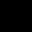

Frame 2236: Predicted Class = 76


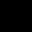

Frame 2237: Predicted Class = 76


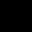

Frame 2238: Predicted Class = 76


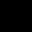

Frame 2239: Predicted Class = 76


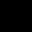

Frame 2240: Predicted Class = 76


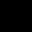

Frame 2241: Predicted Class = 76


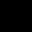

Frame 2242: Predicted Class = 76


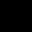

Frame 2243: Predicted Class = 76


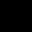

Frame 2244: Predicted Class = 76


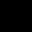

Frame 2245: Predicted Class = 76


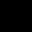

Frame 2246: Predicted Class = 76


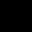

Frame 2247: Predicted Class = 76


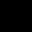

Frame 2248: Predicted Class = 76


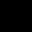

Frame 2249: Predicted Class = 76


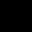

Frame 2250: Predicted Class = 76


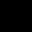

Frame 2251: Predicted Class = 76


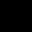

Frame 2252: Predicted Class = 76


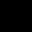

Frame 2253: Predicted Class = 76


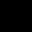

Frame 2254: Predicted Class = 76


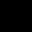

Frame 2255: Predicted Class = 76


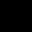

Frame 2256: Predicted Class = 76


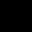

Frame 2257: Predicted Class = 76


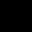

Frame 2258: Predicted Class = 76


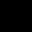

Frame 2259: Predicted Class = 76


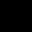

Frame 2260: Predicted Class = 76


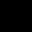

Frame 2261: Predicted Class = 76


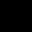

Frame 2262: Predicted Class = 76


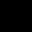

Frame 2263: Predicted Class = 76


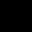

Frame 2264: Predicted Class = 76


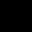

Frame 2265: Predicted Class = 76


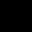

Frame 2266: Predicted Class = 76


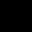

Frame 2267: Predicted Class = 76


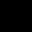

Frame 2268: Predicted Class = 76


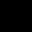

Frame 2269: Predicted Class = 76


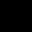

Frame 2270: Predicted Class = 76


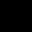

Frame 2271: Predicted Class = 76


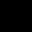

Frame 2272: Predicted Class = 76


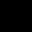

Frame 2273: Predicted Class = 76


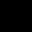

Frame 2274: Predicted Class = 76


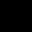

Frame 2275: Predicted Class = 76


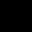

Frame 2276: Predicted Class = 76


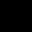

Frame 2277: Predicted Class = 76


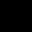

Frame 2278: Predicted Class = 76


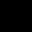

Frame 2279: Predicted Class = 76


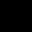

Frame 2280: Predicted Class = 76


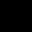

Frame 2281: Predicted Class = 76


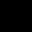

Frame 2282: Predicted Class = 76


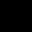

Frame 2283: Predicted Class = 76


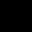

Frame 2284: Predicted Class = 76


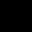

Frame 2285: Predicted Class = 76


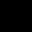

Frame 2286: Predicted Class = 76


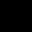

Frame 2287: Predicted Class = 76


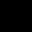

Frame 2288: Predicted Class = 76


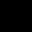

Frame 2289: Predicted Class = 76


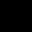

Frame 2290: Predicted Class = 76


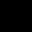

Frame 2291: Predicted Class = 76


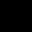

Frame 2292: Predicted Class = 76


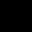

Frame 2293: Predicted Class = 76


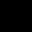

Frame 2294: Predicted Class = 73


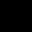

Frame 2295: Predicted Class = 73


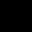

Frame 2296: Predicted Class = 73


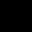

Frame 2297: Predicted Class = 76


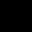

Frame 2298: Predicted Class = 73


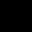

Frame 2299: Predicted Class = 73


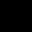

Frame 2300: Predicted Class = 73


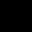

Frame 2301: Predicted Class = 73


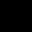

Frame 2302: Predicted Class = 73


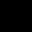

Frame 2303: Predicted Class = 73


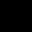

Frame 2304: Predicted Class = 73


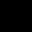

Frame 2305: Predicted Class = 73


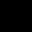

Frame 2306: Predicted Class = 73


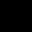

Frame 2307: Predicted Class = 76


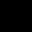

Frame 2308: Predicted Class = 76


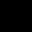

Frame 2309: Predicted Class = 76


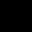

Frame 2310: Predicted Class = 76


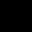

Frame 2311: Predicted Class = 76


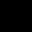

Frame 2312: Predicted Class = 76


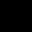

Frame 2313: Predicted Class = 76


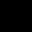

Frame 2314: Predicted Class = 76


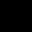

Frame 2315: Predicted Class = 76


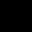

Frame 2316: Predicted Class = 76


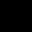

Frame 2317: Predicted Class = 76


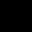

Frame 2318: Predicted Class = 76


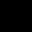

Frame 2319: Predicted Class = 76


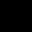

Frame 2320: Predicted Class = 76


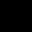

Frame 2321: Predicted Class = 76


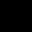

Frame 2322: Predicted Class = 76


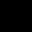

Frame 2323: Predicted Class = 76


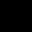

Frame 2324: Predicted Class = 76


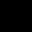

Frame 2325: Predicted Class = 76


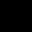

Frame 2326: Predicted Class = 76


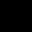

Frame 2327: Predicted Class = 76


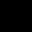

Frame 2328: Predicted Class = 76


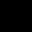

Frame 2329: Predicted Class = 76


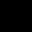

Frame 2330: Predicted Class = 76


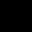

Frame 2331: Predicted Class = 76


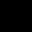

Frame 2332: Predicted Class = 76


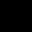

Frame 2333: Predicted Class = 76


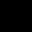

Frame 2334: Predicted Class = 76


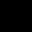

Frame 2335: Predicted Class = 76


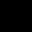

Frame 2336: Predicted Class = 76


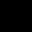

Frame 2337: Predicted Class = 76


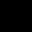

Frame 2338: Predicted Class = 76


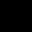

Frame 2339: Predicted Class = 76


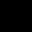

Frame 2340: Predicted Class = 76


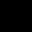

Frame 2341: Predicted Class = 76


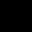

Frame 2342: Predicted Class = 76


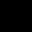

Frame 2343: Predicted Class = 76


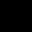

Frame 2344: Predicted Class = 76


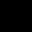

Frame 2345: Predicted Class = 76


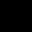

Frame 2346: Predicted Class = 76


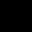

Frame 2347: Predicted Class = 76


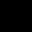

Frame 2348: Predicted Class = 76


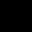

Frame 2349: Predicted Class = 76


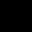

Frame 2350: Predicted Class = 76


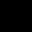

Frame 2351: Predicted Class = 76


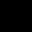

Frame 2352: Predicted Class = 76


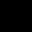

Frame 2353: Predicted Class = 76


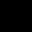

Frame 2354: Predicted Class = 76


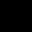

Frame 2355: Predicted Class = 76


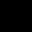

Frame 2356: Predicted Class = 76


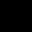

Frame 2357: Predicted Class = 76


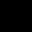

Frame 2358: Predicted Class = 76


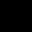

Frame 2359: Predicted Class = 76


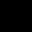

Frame 2360: Predicted Class = 76


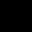

Frame 2361: Predicted Class = 76


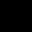

Frame 2362: Predicted Class = 76


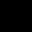

Frame 2363: Predicted Class = 76


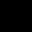

Frame 2364: Predicted Class = 76


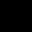

Frame 2365: Predicted Class = 76


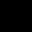

Frame 2366: Predicted Class = 76


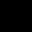

Frame 2367: Predicted Class = 76


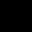

Frame 2368: Predicted Class = 76


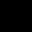

Frame 2369: Predicted Class = 76


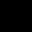

Frame 2370: Predicted Class = 76


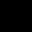

Frame 2371: Predicted Class = 76


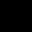

Frame 2372: Predicted Class = 76


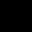

Frame 2373: Predicted Class = 76


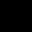

Frame 2374: Predicted Class = 76


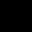

Frame 2375: Predicted Class = 76


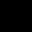

Frame 2376: Predicted Class = 76


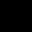

Frame 2377: Predicted Class = 76


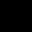

Frame 2378: Predicted Class = 76


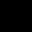

Frame 2379: Predicted Class = 76


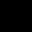

Frame 2380: Predicted Class = 76


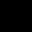

Frame 2381: Predicted Class = 76


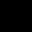

Frame 2382: Predicted Class = 76


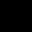

Frame 2383: Predicted Class = 76


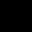

Frame 2384: Predicted Class = 76


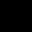

Frame 2385: Predicted Class = 76


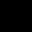

Frame 2386: Predicted Class = 76


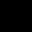

Frame 2387: Predicted Class = 76


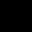

Frame 2388: Predicted Class = 76


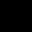

Frame 2389: Predicted Class = 76


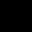

Frame 2390: Predicted Class = 76


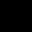

Frame 2391: Predicted Class = 76


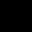

Frame 2392: Predicted Class = 76


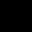

Frame 2393: Predicted Class = 76


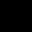

Frame 2394: Predicted Class = 76


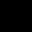

Frame 2395: Predicted Class = 76


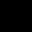

Frame 2396: Predicted Class = 76


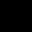

Frame 2397: Predicted Class = 76


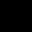

Frame 2398: Predicted Class = 76


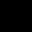

Frame 2399: Predicted Class = 76


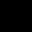

Frame 2400: Predicted Class = 76


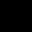

Frame 2401: Predicted Class = 76


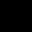

Frame 2402: Predicted Class = 76


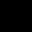

Frame 2403: Predicted Class = 76


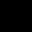

Frame 2404: Predicted Class = 76


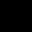

Frame 2405: Predicted Class = 76


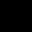

Frame 2406: Predicted Class = 76


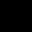

Frame 2407: Predicted Class = 76


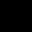

Frame 2408: Predicted Class = 76


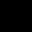

Frame 2409: Predicted Class = 76


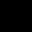

Frame 2410: Predicted Class = 73


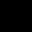

Frame 2411: Predicted Class = 76


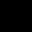

Frame 2412: Predicted Class = 73


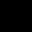

Frame 2413: Predicted Class = 76


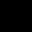

Frame 2414: Predicted Class = 73


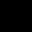

Frame 2415: Predicted Class = 76


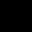

Frame 2416: Predicted Class = 73


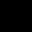

Frame 2417: Predicted Class = 76


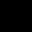

Frame 2418: Predicted Class = 73


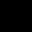

Frame 2419: Predicted Class = 73


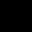

Frame 2420: Predicted Class = 73


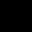

Frame 2421: Predicted Class = 73


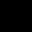

Frame 2422: Predicted Class = 73


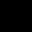

Frame 2423: Predicted Class = 73


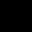

Frame 2424: Predicted Class = 73


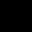

Frame 2425: Predicted Class = 73


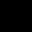

Frame 2426: Predicted Class = 73


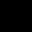

Frame 2427: Predicted Class = 76


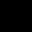

Frame 2428: Predicted Class = 76


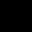

Frame 2429: Predicted Class = 76


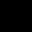

Frame 2430: Predicted Class = 76


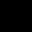

Frame 2431: Predicted Class = 76


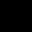

Frame 2432: Predicted Class = 76


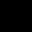

Frame 2433: Predicted Class = 76


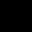

Frame 2434: Predicted Class = 76


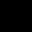

Frame 2435: Predicted Class = 76


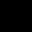

Frame 2436: Predicted Class = 76


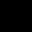

Frame 2437: Predicted Class = 76


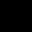

Frame 2438: Predicted Class = 76


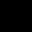

Frame 2439: Predicted Class = 76


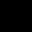

Frame 2440: Predicted Class = 76


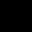

Frame 2441: Predicted Class = 76


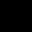

Frame 2442: Predicted Class = 76


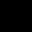

Frame 2443: Predicted Class = 76


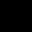

Frame 2444: Predicted Class = 76


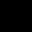

Frame 2445: Predicted Class = 76


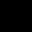

Frame 2446: Predicted Class = 76


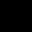

Frame 2447: Predicted Class = 76


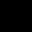

Frame 2448: Predicted Class = 76


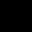

Frame 2449: Predicted Class = 76


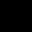

Frame 2450: Predicted Class = 76


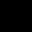

Frame 2451: Predicted Class = 76


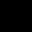

Frame 2452: Predicted Class = 76


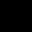

Frame 2453: Predicted Class = 76


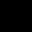

Frame 2454: Predicted Class = 76


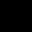

Frame 2455: Predicted Class = 76


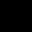

Frame 2456: Predicted Class = 76


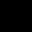

Frame 2457: Predicted Class = 76


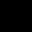

Frame 2458: Predicted Class = 76


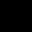

Frame 2459: Predicted Class = 76


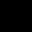

Frame 2460: Predicted Class = 76


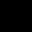

Frame 2461: Predicted Class = 76


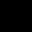

Frame 2462: Predicted Class = 76


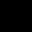

Frame 2463: Predicted Class = 76


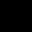

Frame 2464: Predicted Class = 76


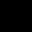

Frame 2465: Predicted Class = 76


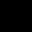

Frame 2466: Predicted Class = 76


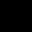

Frame 2467: Predicted Class = 76


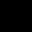

Frame 2468: Predicted Class = 76


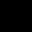

Frame 2469: Predicted Class = 76


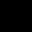

Frame 2470: Predicted Class = 76


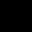

Frame 2471: Predicted Class = 76


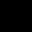

Frame 2472: Predicted Class = 76


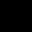

Frame 2473: Predicted Class = 76


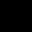

Frame 2474: Predicted Class = 76


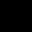

Frame 2475: Predicted Class = 76


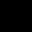

Frame 2476: Predicted Class = 76


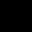

Frame 2477: Predicted Class = 76


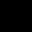

Frame 2478: Predicted Class = 76


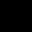

Frame 2479: Predicted Class = 76


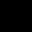

Frame 2480: Predicted Class = 76


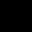

Frame 2481: Predicted Class = 76


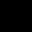

Frame 2482: Predicted Class = 76


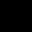

Frame 2483: Predicted Class = 76


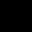

Frame 2484: Predicted Class = 76


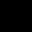

Frame 2485: Predicted Class = 76


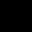

Frame 2486: Predicted Class = 76


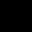

Frame 2487: Predicted Class = 76


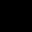

Frame 2488: Predicted Class = 76


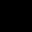

Frame 2489: Predicted Class = 76


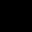

Frame 2490: Predicted Class = 76


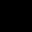

Frame 2491: Predicted Class = 76


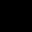

Frame 2492: Predicted Class = 76


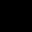

Frame 2493: Predicted Class = 76


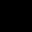

Frame 2494: Predicted Class = 76


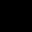

Frame 2495: Predicted Class = 76


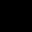

Frame 2496: Predicted Class = 76


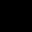

Frame 2497: Predicted Class = 76


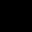

Frame 2498: Predicted Class = 76


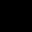

Frame 2499: Predicted Class = 76


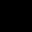

Frame 2500: Predicted Class = 76


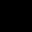

Frame 2501: Predicted Class = 76


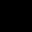

Frame 2502: Predicted Class = 76


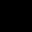

Frame 2503: Predicted Class = 76


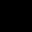

Frame 2504: Predicted Class = 76


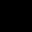

Frame 2505: Predicted Class = 76


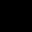

Frame 2506: Predicted Class = 76


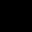

Frame 2507: Predicted Class = 76


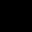

Frame 2508: Predicted Class = 76


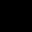

Frame 2509: Predicted Class = 76


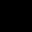

Frame 2510: Predicted Class = 76


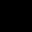

Frame 2511: Predicted Class = 76


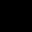

Frame 2512: Predicted Class = 76


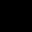

Frame 2513: Predicted Class = 76


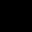

Frame 2514: Predicted Class = 76


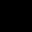

Frame 2515: Predicted Class = 76


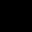

Frame 2516: Predicted Class = 76


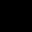

Frame 2517: Predicted Class = 76


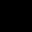

Frame 2518: Predicted Class = 76


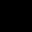

Frame 2519: Predicted Class = 76


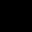

Frame 2520: Predicted Class = 76


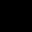

Frame 2521: Predicted Class = 76


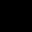

Frame 2522: Predicted Class = 76


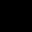

Frame 2523: Predicted Class = 76


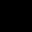

Frame 2524: Predicted Class = 76


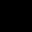

Frame 2525: Predicted Class = 76


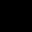

Frame 2526: Predicted Class = 76


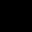

Frame 2527: Predicted Class = 76


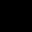

Frame 2528: Predicted Class = 76


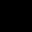

Frame 2529: Predicted Class = 76


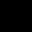

Frame 2530: Predicted Class = 76


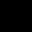

Frame 2531: Predicted Class = 76


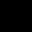

Frame 2532: Predicted Class = 76


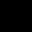

Frame 2533: Predicted Class = 76


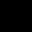

Frame 2534: Predicted Class = 76


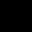

Frame 2535: Predicted Class = 76


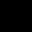

Frame 2536: Predicted Class = 76


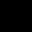

Frame 2537: Predicted Class = 76


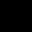

Frame 2538: Predicted Class = 76


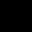

Frame 2539: Predicted Class = 76


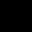

Frame 2540: Predicted Class = 76


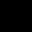

Frame 2541: Predicted Class = 76


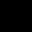

Frame 2542: Predicted Class = 76


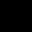

Frame 2543: Predicted Class = 76


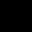

Frame 2544: Predicted Class = 76


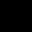

Frame 2545: Predicted Class = 76


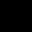

Frame 2546: Predicted Class = 76


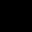

Frame 2547: Predicted Class = 76


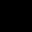

Frame 2548: Predicted Class = 76


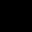

Frame 2549: Predicted Class = 76


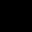

Frame 2550: Predicted Class = 76


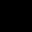

Frame 2551: Predicted Class = 76


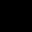

Frame 2552: Predicted Class = 76


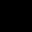

Frame 2553: Predicted Class = 76


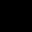

Frame 2554: Predicted Class = 76


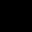

Frame 2555: Predicted Class = 76


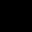

Frame 2556: Predicted Class = 76


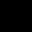

Frame 2557: Predicted Class = 76


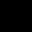

Frame 2558: Predicted Class = 76


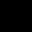

Frame 2559: Predicted Class = 76


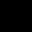

Frame 2560: Predicted Class = 76


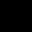

Frame 2561: Predicted Class = 76


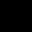

Frame 2562: Predicted Class = 76


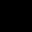

Frame 2563: Predicted Class = 76


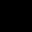

Frame 2564: Predicted Class = 76


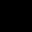

Frame 2565: Predicted Class = 76


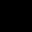

Frame 2566: Predicted Class = 76


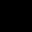

Frame 2567: Predicted Class = 76


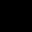

Frame 2568: Predicted Class = 76


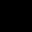

Frame 2569: Predicted Class = 76


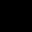

Frame 2570: Predicted Class = 76


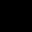

Frame 2571: Predicted Class = 76


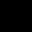

Frame 2572: Predicted Class = 76


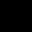

Frame 2573: Predicted Class = 76


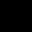

Frame 2574: Predicted Class = 76


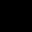

Frame 2575: Predicted Class = 76


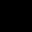

Frame 2576: Predicted Class = 76


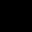

Frame 2577: Predicted Class = 76


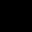

Frame 2578: Predicted Class = 76


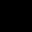

Frame 2579: Predicted Class = 76


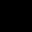

Frame 2580: Predicted Class = 76


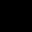

Frame 2581: Predicted Class = 76


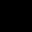

Frame 2582: Predicted Class = 76


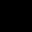

Frame 2583: Predicted Class = 76


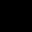

Frame 2584: Predicted Class = 76


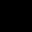

Frame 2585: Predicted Class = 76


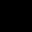

Frame 2586: Predicted Class = 76


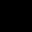

Frame 2587: Predicted Class = 76


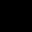

Frame 2588: Predicted Class = 76


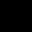

Frame 2589: Predicted Class = 76


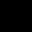

Frame 2590: Predicted Class = 76


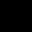

Frame 2591: Predicted Class = 76


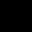

Frame 2592: Predicted Class = 76


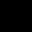

Frame 2593: Predicted Class = 76


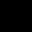

Frame 2594: Predicted Class = 76


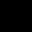

Frame 2595: Predicted Class = 76


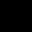

Frame 2596: Predicted Class = 76


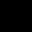

Frame 2597: Predicted Class = 76


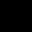

Frame 2598: Predicted Class = 76


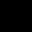

Frame 2599: Predicted Class = 76


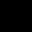

Frame 2600: Predicted Class = 76


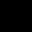

Frame 2601: Predicted Class = 76


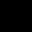

Frame 2602: Predicted Class = 76


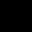

Frame 2603: Predicted Class = 76


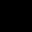

Frame 2604: Predicted Class = 76


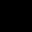

Frame 2605: Predicted Class = 76


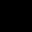

Frame 2606: Predicted Class = 76


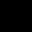

Frame 2607: Predicted Class = 76


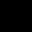

Frame 2608: Predicted Class = 76


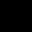

Frame 2609: Predicted Class = 76


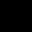

Frame 2610: Predicted Class = 76


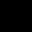

Frame 2611: Predicted Class = 76


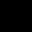

Frame 2612: Predicted Class = 76


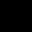

Frame 2613: Predicted Class = 76


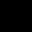

Frame 2614: Predicted Class = 76


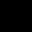

Frame 2615: Predicted Class = 76


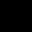

Frame 2616: Predicted Class = 76


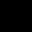

Frame 2617: Predicted Class = 76


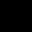

Frame 2618: Predicted Class = 76


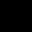

Frame 2619: Predicted Class = 76


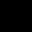

Frame 2620: Predicted Class = 76


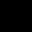

Frame 2621: Predicted Class = 76


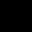

Frame 2622: Predicted Class = 76


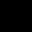

Frame 2623: Predicted Class = 76


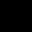

Frame 2624: Predicted Class = 76


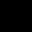

Frame 2625: Predicted Class = 76


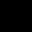

Frame 2626: Predicted Class = 76


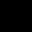

Frame 2627: Predicted Class = 76


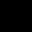

Frame 2628: Predicted Class = 76


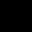

Frame 2629: Predicted Class = 76


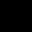

Frame 2630: Predicted Class = 76


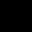

Frame 2631: Predicted Class = 76


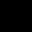

Frame 2632: Predicted Class = 76


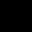

Frame 2633: Predicted Class = 76


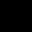

Frame 2634: Predicted Class = 76


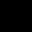

Frame 2635: Predicted Class = 76


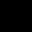

Frame 2636: Predicted Class = 76


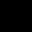

Frame 2637: Predicted Class = 76


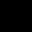

Frame 2638: Predicted Class = 76


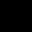

Frame 2639: Predicted Class = 76


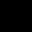

Frame 2640: Predicted Class = 76


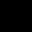

Frame 2641: Predicted Class = 76


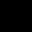

Frame 2642: Predicted Class = 76


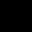

Frame 2643: Predicted Class = 76


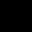

Frame 2644: Predicted Class = 76


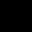

Frame 2645: Predicted Class = 76


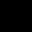

Frame 2646: Predicted Class = 76


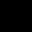

Frame 2647: Predicted Class = 76


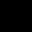

Frame 2648: Predicted Class = 76


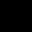

Frame 2649: Predicted Class = 76


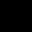

Frame 2650: Predicted Class = 76


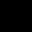

Frame 2651: Predicted Class = 76


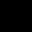

Frame 2652: Predicted Class = 76


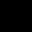

Frame 2653: Predicted Class = 76


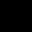

Frame 2654: Predicted Class = 76


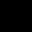

Frame 2655: Predicted Class = 76


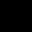

Frame 2656: Predicted Class = 76


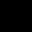

Frame 2657: Predicted Class = 76


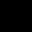

Frame 2658: Predicted Class = 76


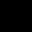

Frame 2659: Predicted Class = 76


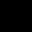

Frame 2660: Predicted Class = 76


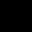

Frame 2661: Predicted Class = 76


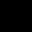

Frame 2662: Predicted Class = 76


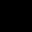

Frame 2663: Predicted Class = 76


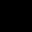

Frame 2664: Predicted Class = 76


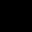

Frame 2665: Predicted Class = 76


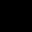

Frame 2666: Predicted Class = 76


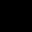

Frame 2667: Predicted Class = 76


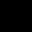

Frame 2668: Predicted Class = 76


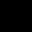

Frame 2669: Predicted Class = 76


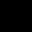

Frame 2670: Predicted Class = 76


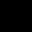

Frame 2671: Predicted Class = 76


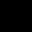

Frame 2672: Predicted Class = 76


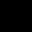

Frame 2673: Predicted Class = 76


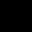

Frame 2674: Predicted Class = 76


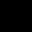

Frame 2675: Predicted Class = 76


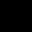

Frame 2676: Predicted Class = 76


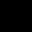

Frame 2677: Predicted Class = 76


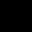

Frame 2678: Predicted Class = 76


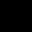

Frame 2679: Predicted Class = 76


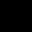

Frame 2680: Predicted Class = 76


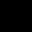

Frame 2681: Predicted Class = 76


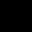

Frame 2682: Predicted Class = 76


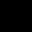

Frame 2683: Predicted Class = 76


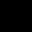

Frame 2684: Predicted Class = 76


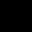

Frame 2685: Predicted Class = 76


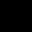

Frame 2686: Predicted Class = 76


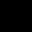

Frame 2687: Predicted Class = 76


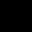

Frame 2688: Predicted Class = 76


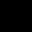

Frame 2689: Predicted Class = 76


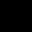

Frame 2690: Predicted Class = 76


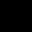

Frame 2691: Predicted Class = 76


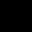

Frame 2692: Predicted Class = 76


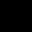

Frame 2693: Predicted Class = 76


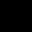

Frame 2694: Predicted Class = 76


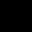

Frame 2695: Predicted Class = 76


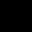

Frame 2696: Predicted Class = 76


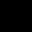

Frame 2697: Predicted Class = 76


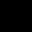

Frame 2698: Predicted Class = 76


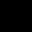

Frame 2699: Predicted Class = 76


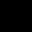

Frame 2700: Predicted Class = 76


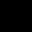

Frame 2701: Predicted Class = 76


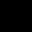

Frame 2702: Predicted Class = 76


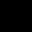

Frame 2703: Predicted Class = 76


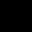

Frame 2704: Predicted Class = 76


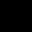

Frame 2705: Predicted Class = 76


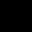

Frame 2706: Predicted Class = 76


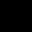

Frame 2707: Predicted Class = 76


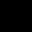

Frame 2708: Predicted Class = 76


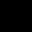

Frame 2709: Predicted Class = 76


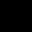

Frame 2710: Predicted Class = 76


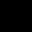

Frame 2711: Predicted Class = 76


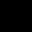

Frame 2712: Predicted Class = 76


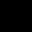

Frame 2713: Predicted Class = 76


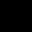

Frame 2714: Predicted Class = 76


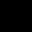

Frame 2715: Predicted Class = 76


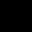

Frame 2716: Predicted Class = 76


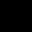

Frame 2717: Predicted Class = 76


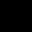

Frame 2718: Predicted Class = 76


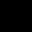

Frame 2719: Predicted Class = 76


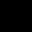

Frame 2720: Predicted Class = 76


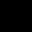

Frame 2721: Predicted Class = 76


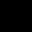

Frame 2722: Predicted Class = 76


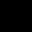

Frame 2723: Predicted Class = 76


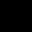

Frame 2724: Predicted Class = 76


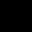

Frame 2725: Predicted Class = 76


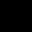

Frame 2726: Predicted Class = 76


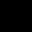

Frame 2727: Predicted Class = 76


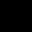

Frame 2728: Predicted Class = 76


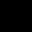

Frame 2729: Predicted Class = 76


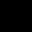

Frame 2730: Predicted Class = 76


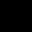

Frame 2731: Predicted Class = 76


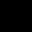

Frame 2732: Predicted Class = 76


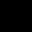

Frame 2733: Predicted Class = 76


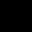

Frame 2734: Predicted Class = 76


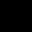

Frame 2735: Predicted Class = 76


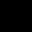

Frame 2736: Predicted Class = 76


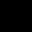

Frame 2737: Predicted Class = 76


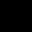

Frame 2738: Predicted Class = 76


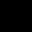

Frame 2739: Predicted Class = 76


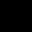

Frame 2740: Predicted Class = 76


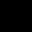

Frame 2741: Predicted Class = 76


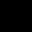

Frame 2742: Predicted Class = 76


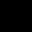

Frame 2743: Predicted Class = 76


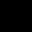

Frame 2744: Predicted Class = 76


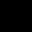

Frame 2745: Predicted Class = 76


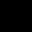

Frame 2746: Predicted Class = 76


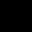

Frame 2747: Predicted Class = 76


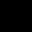

Frame 2748: Predicted Class = 76


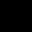

Frame 2749: Predicted Class = 76


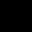

Frame 2750: Predicted Class = 76


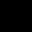

Frame 2751: Predicted Class = 76


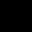

Frame 2752: Predicted Class = 76


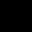

Frame 2753: Predicted Class = 76


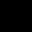

Frame 2754: Predicted Class = 76


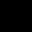

Frame 2755: Predicted Class = 76


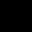

Frame 2756: Predicted Class = 76


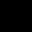

Frame 2757: Predicted Class = 76


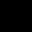

Frame 2758: Predicted Class = 76


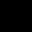

Frame 2759: Predicted Class = 76


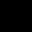

Frame 2760: Predicted Class = 76


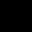

Frame 2761: Predicted Class = 76


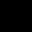

Frame 2762: Predicted Class = 76


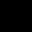

Frame 2763: Predicted Class = 76


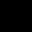

Frame 2764: Predicted Class = 76


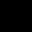

Frame 2765: Predicted Class = 76


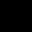

Frame 2766: Predicted Class = 76


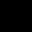

Frame 2767: Predicted Class = 76


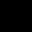

Frame 2768: Predicted Class = 76


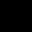

Frame 2769: Predicted Class = 76


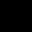

Frame 2770: Predicted Class = 76


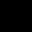

Frame 2771: Predicted Class = 76


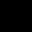

Frame 2772: Predicted Class = 76


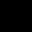

Frame 2773: Predicted Class = 76


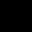

Frame 2774: Predicted Class = 76


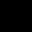

Frame 2775: Predicted Class = 76


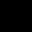

Frame 2776: Predicted Class = 76


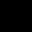

Frame 2777: Predicted Class = 76


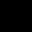

Frame 2778: Predicted Class = 76


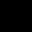

Frame 2779: Predicted Class = 76


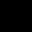

Frame 2780: Predicted Class = 76


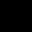

Frame 2781: Predicted Class = 76


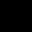

Frame 2782: Predicted Class = 76


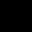

Frame 2783: Predicted Class = 76


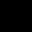

Frame 2784: Predicted Class = 76


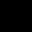

Frame 2785: Predicted Class = 76


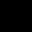

Frame 2786: Predicted Class = 76


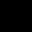

Frame 2787: Predicted Class = 76


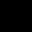

Frame 2788: Predicted Class = 76


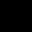

Frame 2789: Predicted Class = 76


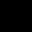

Frame 2790: Predicted Class = 76


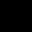

Frame 2791: Predicted Class = 76


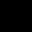

Frame 2792: Predicted Class = 76


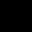

Frame 2793: Predicted Class = 76


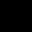

Frame 2794: Predicted Class = 76


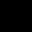

Frame 2795: Predicted Class = 76


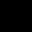

Frame 2796: Predicted Class = 76


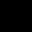

Frame 2797: Predicted Class = 76


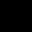

Frame 2798: Predicted Class = 76


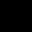

Frame 2799: Predicted Class = 76


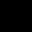

Frame 2800: Predicted Class = 76


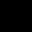

Frame 2801: Predicted Class = 76


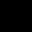

Frame 2802: Predicted Class = 76


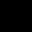

Frame 2803: Predicted Class = 76


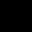

Frame 2804: Predicted Class = 76


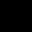

Frame 2805: Predicted Class = 76


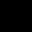

Frame 2806: Predicted Class = 76


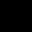

Frame 2807: Predicted Class = 76


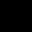

Frame 2808: Predicted Class = 76


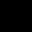

Frame 2809: Predicted Class = 76


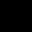

Frame 2810: Predicted Class = 76


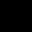

Frame 2811: Predicted Class = 76


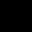

Frame 2812: Predicted Class = 76


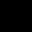

Frame 2813: Predicted Class = 76


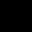

Frame 2814: Predicted Class = 76


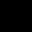

Frame 2815: Predicted Class = 76


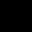

Frame 2816: Predicted Class = 76


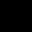

Frame 2817: Predicted Class = 76


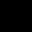

Frame 2818: Predicted Class = 76


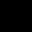

Frame 2819: Predicted Class = 76


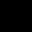

Frame 2820: Predicted Class = 76


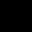

Frame 2821: Predicted Class = 76


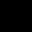

Frame 2822: Predicted Class = 76


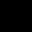

Frame 2823: Predicted Class = 76


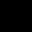

Frame 2824: Predicted Class = 76


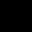

Frame 2825: Predicted Class = 76


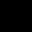

Frame 2826: Predicted Class = 76


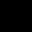

Frame 2827: Predicted Class = 76


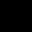

Frame 2828: Predicted Class = 76


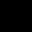

Frame 2829: Predicted Class = 76


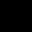

Frame 2830: Predicted Class = 76


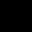

Frame 2831: Predicted Class = 76


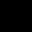

Frame 2832: Predicted Class = 76


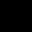

Frame 2833: Predicted Class = 76


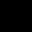

Frame 2834: Predicted Class = 76


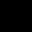

Frame 2835: Predicted Class = 76


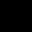

Frame 2836: Predicted Class = 76


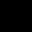

Frame 2837: Predicted Class = 76


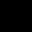

Frame 2838: Predicted Class = 76


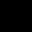

Frame 2839: Predicted Class = 76


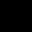

Frame 2840: Predicted Class = 76


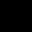

Frame 2841: Predicted Class = 76


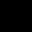

Frame 2842: Predicted Class = 76


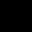

Frame 2843: Predicted Class = 76


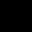

Frame 2844: Predicted Class = 76


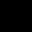

Frame 2845: Predicted Class = 76


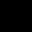

Frame 2846: Predicted Class = 76


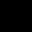

Frame 2847: Predicted Class = 76


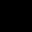

Frame 2848: Predicted Class = 76


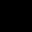

Frame 2849: Predicted Class = 76


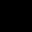

Frame 2850: Predicted Class = 76


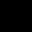

Frame 2851: Predicted Class = 76


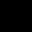

Frame 2852: Predicted Class = 76


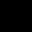

Frame 2853: Predicted Class = 76


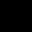

Frame 2854: Predicted Class = 76


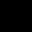

Frame 2855: Predicted Class = 76


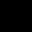

Frame 2856: Predicted Class = 76


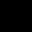

Frame 2857: Predicted Class = 76


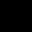

Frame 2858: Predicted Class = 76


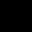

Frame 2859: Predicted Class = 76


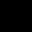

Frame 2860: Predicted Class = 76


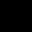

Frame 2861: Predicted Class = 76


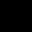

Frame 2862: Predicted Class = 76


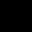

Frame 2863: Predicted Class = 76


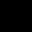

Frame 2864: Predicted Class = 76


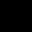

Frame 2865: Predicted Class = 76


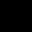

Frame 2866: Predicted Class = 76


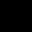

Frame 2867: Predicted Class = 76


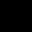

Frame 2868: Predicted Class = 76


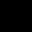

Frame 2869: Predicted Class = 76


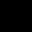

Frame 2870: Predicted Class = 76


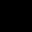

Frame 2871: Predicted Class = 76


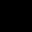

Frame 2872: Predicted Class = 76


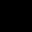

Frame 2873: Predicted Class = 76


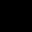

Frame 2874: Predicted Class = 76


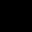

Frame 2875: Predicted Class = 76


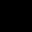

Frame 2876: Predicted Class = 76


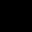

Frame 2877: Predicted Class = 76


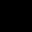

Frame 2878: Predicted Class = 76


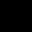

Frame 2879: Predicted Class = 76


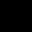

Frame 2880: Predicted Class = 76


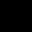

Frame 2881: Predicted Class = 76


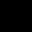

Frame 2882: Predicted Class = 76


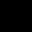

Frame 2883: Predicted Class = 76


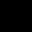

Frame 2884: Predicted Class = 76


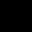

Frame 2885: Predicted Class = 76


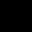

Frame 2886: Predicted Class = 76


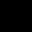

Frame 2887: Predicted Class = 76


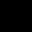

Frame 2888: Predicted Class = 76


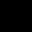

Frame 2889: Predicted Class = 76


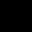

Frame 2890: Predicted Class = 76


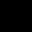

Frame 2891: Predicted Class = 76


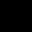

Frame 2892: Predicted Class = 76


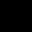

Frame 2893: Predicted Class = 76


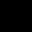

Frame 2894: Predicted Class = 76


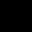

Frame 2895: Predicted Class = 76


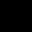

Frame 2896: Predicted Class = 76


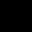

Frame 2897: Predicted Class = 76


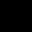

Frame 2898: Predicted Class = 76


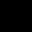

Frame 2899: Predicted Class = 76


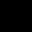

Frame 2900: Predicted Class = 76


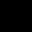

Frame 2901: Predicted Class = 76


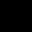

Frame 2902: Predicted Class = 76


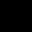

Frame 2903: Predicted Class = 76


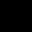

Frame 2904: Predicted Class = 76


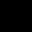

Frame 2905: Predicted Class = 76


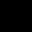

Frame 2906: Predicted Class = 76


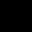

Frame 2907: Predicted Class = 76


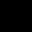

Frame 2908: Predicted Class = 76


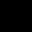

Frame 2909: Predicted Class = 76


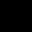

Frame 2910: Predicted Class = 76


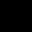

Frame 2911: Predicted Class = 76


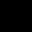

Frame 2912: Predicted Class = 76


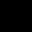

Frame 2913: Predicted Class = 76


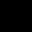

Frame 2914: Predicted Class = 76


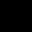

Frame 2915: Predicted Class = 76


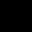

Frame 2916: Predicted Class = 76


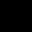

Frame 2917: Predicted Class = 76


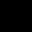

Frame 2918: Predicted Class = 76


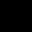

Frame 2919: Predicted Class = 76


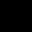

Frame 2920: Predicted Class = 76


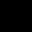

Frame 2921: Predicted Class = 76


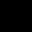

Frame 2922: Predicted Class = 76


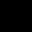

Frame 2923: Predicted Class = 76


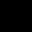

Frame 2924: Predicted Class = 76


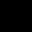

Frame 2925: Predicted Class = 76


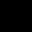

Frame 2926: Predicted Class = 76


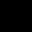

Frame 2927: Predicted Class = 76


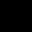

Frame 2928: Predicted Class = 76


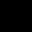

Frame 2929: Predicted Class = 76


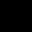

Frame 2930: Predicted Class = 76


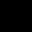

Frame 2931: Predicted Class = 76


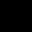

Frame 2932: Predicted Class = 76


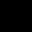

Frame 2933: Predicted Class = 76


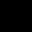

Frame 2934: Predicted Class = 76


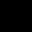

Frame 2935: Predicted Class = 76


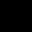

Frame 2936: Predicted Class = 76


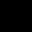

Frame 2937: Predicted Class = 76


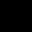

Frame 2938: Predicted Class = 76


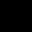

Frame 2939: Predicted Class = 76


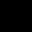

Frame 2940: Predicted Class = 76


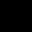

Frame 2941: Predicted Class = 76


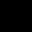

Frame 2942: Predicted Class = 76


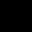

Frame 2943: Predicted Class = 76


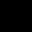

Frame 2944: Predicted Class = 76


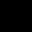

Frame 2945: Predicted Class = 76


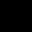

Frame 2946: Predicted Class = 76


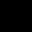

Frame 2947: Predicted Class = 76


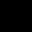

Frame 2948: Predicted Class = 76


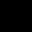

Frame 2949: Predicted Class = 76


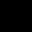

Frame 2950: Predicted Class = 76


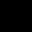

Frame 2951: Predicted Class = 76


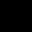

Frame 2952: Predicted Class = 76


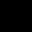

Frame 2953: Predicted Class = 76


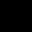

Frame 2954: Predicted Class = 76


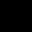

Frame 2955: Predicted Class = 76


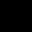

Frame 2956: Predicted Class = 76


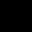

Frame 2957: Predicted Class = 76


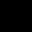

Frame 2958: Predicted Class = 76


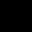

Frame 2959: Predicted Class = 76


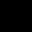

Frame 2960: Predicted Class = 76


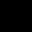

Frame 2961: Predicted Class = 76


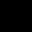

Frame 2962: Predicted Class = 76


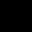

Frame 2963: Predicted Class = 76


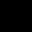

Frame 2964: Predicted Class = 76


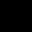

Frame 2965: Predicted Class = 76


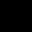

Frame 2966: Predicted Class = 76


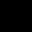

Frame 2967: Predicted Class = 76


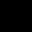

Frame 2968: Predicted Class = 76


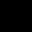

Frame 2969: Predicted Class = 76


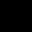

Frame 2970: Predicted Class = 76


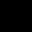

Frame 2971: Predicted Class = 76


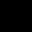

Frame 2972: Predicted Class = 76


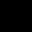

Frame 2973: Predicted Class = 76


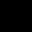

Frame 2974: Predicted Class = 76


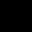

Frame 2975: Predicted Class = 76


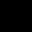

Frame 2976: Predicted Class = 76


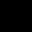

Frame 2977: Predicted Class = 76


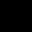

Frame 2978: Predicted Class = 76


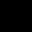

Frame 2979: Predicted Class = 76


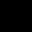

Frame 2980: Predicted Class = 76


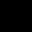

Frame 2981: Predicted Class = 76


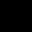

Frame 2982: Predicted Class = 76


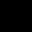

Frame 2983: Predicted Class = 76


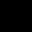

Frame 2984: Predicted Class = 76


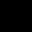

Frame 2985: Predicted Class = 76


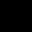

Frame 2986: Predicted Class = 76


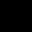

Frame 2987: Predicted Class = 76


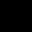

Frame 2988: Predicted Class = 76


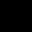

Frame 2989: Predicted Class = 76


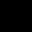

Frame 2990: Predicted Class = 76


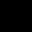

Frame 2991: Predicted Class = 76


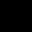

Frame 2992: Predicted Class = 76


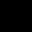

Frame 2993: Predicted Class = 76


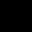

Frame 2994: Predicted Class = 76


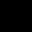

Frame 2995: Predicted Class = 76


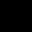

Frame 2996: Predicted Class = 76


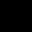

Frame 2997: Predicted Class = 76


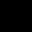

Frame 2998: Predicted Class = 76


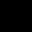

Frame 2999: Predicted Class = 76


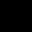

Frame 3000: Predicted Class = 76


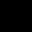

Frame 3001: Predicted Class = 76


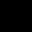

Frame 3002: Predicted Class = 76


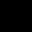

Frame 3003: Predicted Class = 76


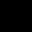

Frame 3004: Predicted Class = 76


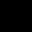

Frame 3005: Predicted Class = 76


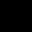

Frame 3006: Predicted Class = 76


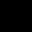

Frame 3007: Predicted Class = 76


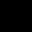

Frame 3008: Predicted Class = 76


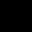

Frame 3009: Predicted Class = 76


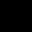

Frame 3010: Predicted Class = 76


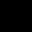

Frame 3011: Predicted Class = 76


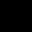

Frame 3012: Predicted Class = 76


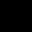

Frame 3013: Predicted Class = 76


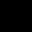

Frame 3014: Predicted Class = 76


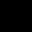

Frame 3015: Predicted Class = 76


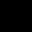

Frame 3016: Predicted Class = 76


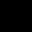

Frame 3017: Predicted Class = 76


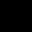

Frame 3018: Predicted Class = 76


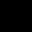

Frame 3019: Predicted Class = 76


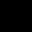

Frame 3020: Predicted Class = 76


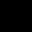

Frame 3021: Predicted Class = 76


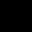

Frame 3022: Predicted Class = 76


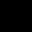

Frame 3023: Predicted Class = 76


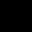

Frame 3024: Predicted Class = 76


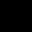

Frame 3025: Predicted Class = 76


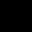

Frame 3026: Predicted Class = 76


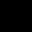

Frame 3027: Predicted Class = 76


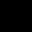

Frame 3028: Predicted Class = 76


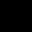

Frame 3029: Predicted Class = 76


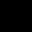

Frame 3030: Predicted Class = 76


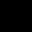

Frame 3031: Predicted Class = 76


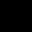

Frame 3032: Predicted Class = 73


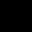

Frame 3033: Predicted Class = 76


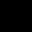

Frame 3034: Predicted Class = 76


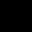

Frame 3035: Predicted Class = 76


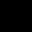

Frame 3036: Predicted Class = 76


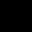

Frame 3037: Predicted Class = 76


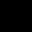

Frame 3038: Predicted Class = 76


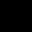

Frame 3039: Predicted Class = 76


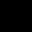

Frame 3040: Predicted Class = 76


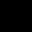

Frame 3041: Predicted Class = 76


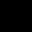

Frame 3042: Predicted Class = 76


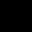

Frame 3043: Predicted Class = 76


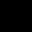

Frame 3044: Predicted Class = 76


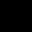

Frame 3045: Predicted Class = 76


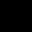

Frame 3046: Predicted Class = 76


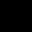

Frame 3047: Predicted Class = 76


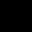

Frame 3048: Predicted Class = 76


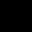

Frame 3049: Predicted Class = 76


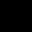

Frame 3050: Predicted Class = 76


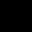

Frame 3051: Predicted Class = 76


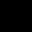

Frame 3052: Predicted Class = 76


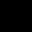

Frame 3053: Predicted Class = 76


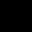

Frame 3054: Predicted Class = 76


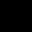

Frame 3055: Predicted Class = 76


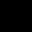

Frame 3056: Predicted Class = 76


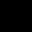

Frame 3057: Predicted Class = 76


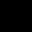

Frame 3058: Predicted Class = 76


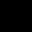

Frame 3059: Predicted Class = 76


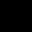

Frame 3060: Predicted Class = 76


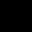

Frame 3061: Predicted Class = 76


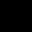

Frame 3062: Predicted Class = 76


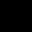

Frame 3063: Predicted Class = 76


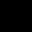

Frame 3064: Predicted Class = 76


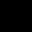

Frame 3065: Predicted Class = 76


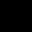

Frame 3066: Predicted Class = 76


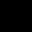

Frame 3067: Predicted Class = 76


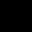

Frame 3068: Predicted Class = 76


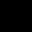

Frame 3069: Predicted Class = 76


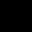

Frame 3070: Predicted Class = 76


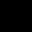

Frame 3071: Predicted Class = 76


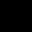

Frame 3072: Predicted Class = 76


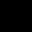

Frame 3073: Predicted Class = 76


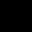

Frame 3074: Predicted Class = 76


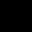

Frame 3075: Predicted Class = 76


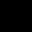

Frame 3076: Predicted Class = 76


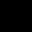

Frame 3077: Predicted Class = 76


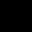

Frame 3078: Predicted Class = 76


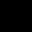

Frame 3079: Predicted Class = 76


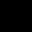

Frame 3080: Predicted Class = 76


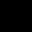

Frame 3081: Predicted Class = 76


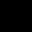

Frame 3082: Predicted Class = 76


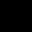

Frame 3083: Predicted Class = 76


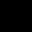

Frame 3084: Predicted Class = 76


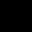

Frame 3085: Predicted Class = 76


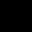

Frame 3086: Predicted Class = 76


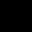

Frame 3087: Predicted Class = 76


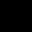

Frame 3088: Predicted Class = 76


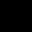

Frame 3089: Predicted Class = 76


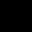

Frame 3090: Predicted Class = 76


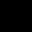

Frame 3091: Predicted Class = 76


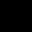

Frame 3092: Predicted Class = 76


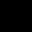

Frame 3093: Predicted Class = 76


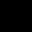

Frame 3094: Predicted Class = 76


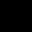

Frame 3095: Predicted Class = 76


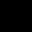

Frame 3096: Predicted Class = 76


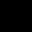

Frame 3097: Predicted Class = 76


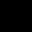

Frame 3098: Predicted Class = 76


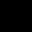

Frame 3099: Predicted Class = 76


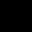

Frame 3100: Predicted Class = 76


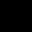

Frame 3101: Predicted Class = 76


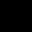

Frame 3102: Predicted Class = 76


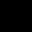

Frame 3103: Predicted Class = 76


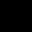

Frame 3104: Predicted Class = 76


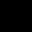

Frame 3105: Predicted Class = 76


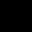

Frame 3106: Predicted Class = 76


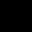

Frame 3107: Predicted Class = 76


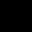

Frame 3108: Predicted Class = 76


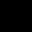

Frame 3109: Predicted Class = 76


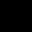

Frame 3110: Predicted Class = 76


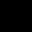

Frame 3111: Predicted Class = 76


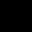

Frame 3112: Predicted Class = 76


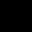

Frame 3113: Predicted Class = 76


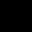

Frame 3114: Predicted Class = 76


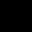

Frame 3115: Predicted Class = 76


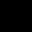

Frame 3116: Predicted Class = 76


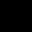

Frame 3117: Predicted Class = 76


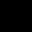

Frame 3118: Predicted Class = 76


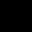

Frame 3119: Predicted Class = 76


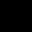

Frame 3120: Predicted Class = 76


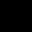

Frame 3121: Predicted Class = 76


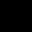

Frame 3122: Predicted Class = 76


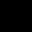

Frame 3123: Predicted Class = 76


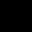

Frame 3124: Predicted Class = 76


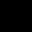

Frame 3125: Predicted Class = 76


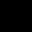

Frame 3126: Predicted Class = 76


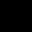

Frame 3127: Predicted Class = 76


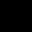

Frame 3128: Predicted Class = 76


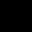

Frame 3129: Predicted Class = 76


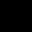

Frame 3130: Predicted Class = 76


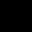

Frame 3131: Predicted Class = 76


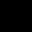

Frame 3132: Predicted Class = 76


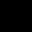

Frame 3133: Predicted Class = 76


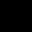

Frame 3134: Predicted Class = 76


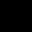

Frame 3135: Predicted Class = 76


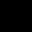

Frame 3136: Predicted Class = 76


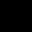

Frame 3137: Predicted Class = 76


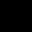

Frame 3138: Predicted Class = 76


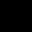

Frame 3139: Predicted Class = 76


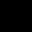

Frame 3140: Predicted Class = 76


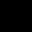

Frame 3141: Predicted Class = 76


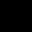

Frame 3142: Predicted Class = 76


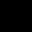

Frame 3143: Predicted Class = 76


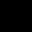

Frame 3144: Predicted Class = 76


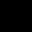

Frame 3145: Predicted Class = 76


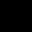

Frame 3146: Predicted Class = 76


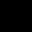

Frame 3147: Predicted Class = 76


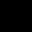

Frame 3148: Predicted Class = 76


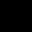

Frame 3149: Predicted Class = 76


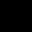

Frame 3150: Predicted Class = 76


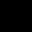

Frame 3151: Predicted Class = 76


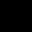

Frame 3152: Predicted Class = 76


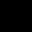

Frame 3153: Predicted Class = 76


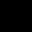

Frame 3154: Predicted Class = 76


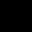

Frame 3155: Predicted Class = 76


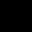

Frame 3156: Predicted Class = 76


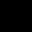

Frame 3157: Predicted Class = 76


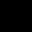

Frame 3158: Predicted Class = 76


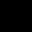

Frame 3159: Predicted Class = 76


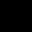

Frame 3160: Predicted Class = 76


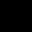

Frame 3161: Predicted Class = 76


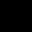

Frame 3162: Predicted Class = 76


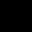

Frame 3163: Predicted Class = 76


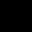

Frame 3164: Predicted Class = 76


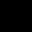

Frame 3165: Predicted Class = 76


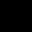

Frame 3166: Predicted Class = 76


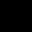

Frame 3167: Predicted Class = 76


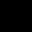

Frame 3168: Predicted Class = 76


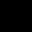

Frame 3169: Predicted Class = 76


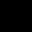

Frame 3170: Predicted Class = 76


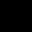

Frame 3171: Predicted Class = 76


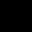

Frame 3172: Predicted Class = 76


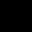

Frame 3173: Predicted Class = 76


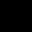

Frame 3174: Predicted Class = 76


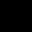

Frame 3175: Predicted Class = 76


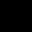

Frame 3176: Predicted Class = 76


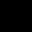

Frame 3177: Predicted Class = 76


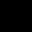

Frame 3178: Predicted Class = 76


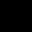

Frame 3179: Predicted Class = 76


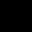

Frame 3180: Predicted Class = 76


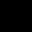

Frame 3181: Predicted Class = 76


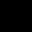

Frame 3182: Predicted Class = 76


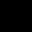

Frame 3183: Predicted Class = 76


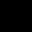

Frame 3184: Predicted Class = 76


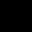

Frame 3185: Predicted Class = 76


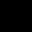

Frame 3186: Predicted Class = 76


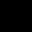

Frame 3187: Predicted Class = 76


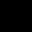

Frame 3188: Predicted Class = 76


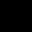

Frame 3189: Predicted Class = 76


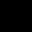

Frame 3190: Predicted Class = 76


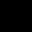

Frame 3191: Predicted Class = 76


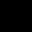

Frame 3192: Predicted Class = 76


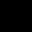

Frame 3193: Predicted Class = 76


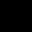

Frame 3194: Predicted Class = 76


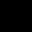

Frame 3195: Predicted Class = 76


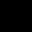

Frame 3196: Predicted Class = 76


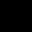

Frame 3197: Predicted Class = 76


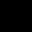

Frame 3198: Predicted Class = 76


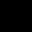

Frame 3199: Predicted Class = 76


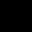

Frame 3200: Predicted Class = 76


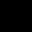

Frame 3201: Predicted Class = 76


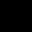

Frame 3202: Predicted Class = 76


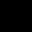

Frame 3203: Predicted Class = 76


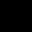

Frame 3204: Predicted Class = 76


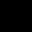

Frame 3205: Predicted Class = 76


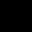

Frame 3206: Predicted Class = 76


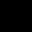

Frame 3207: Predicted Class = 76


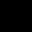

Frame 3208: Predicted Class = 76


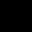

Frame 3209: Predicted Class = 76


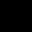

Frame 3210: Predicted Class = 76


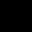

Frame 3211: Predicted Class = 76


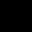

Frame 3212: Predicted Class = 76


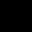

Frame 3213: Predicted Class = 76


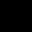

Frame 3214: Predicted Class = 76


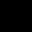

Frame 3215: Predicted Class = 76


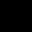

Frame 3216: Predicted Class = 76


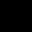

Frame 3217: Predicted Class = 76


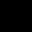

Frame 3218: Predicted Class = 76


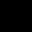

Frame 3219: Predicted Class = 76


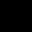

Frame 3220: Predicted Class = 76


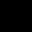

Frame 3221: Predicted Class = 76


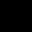

Frame 3222: Predicted Class = 76


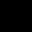

Frame 3223: Predicted Class = 76


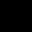

Frame 3224: Predicted Class = 76


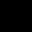

Frame 3225: Predicted Class = 76


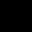

Frame 3226: Predicted Class = 76


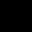

Frame 3227: Predicted Class = 76


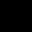

Frame 3228: Predicted Class = 76


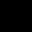

Frame 3229: Predicted Class = 76


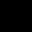

Frame 3230: Predicted Class = 76


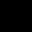

Frame 3231: Predicted Class = 76


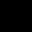

Frame 3232: Predicted Class = 76


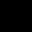

Frame 3233: Predicted Class = 76


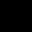

Frame 3234: Predicted Class = 76


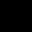

Frame 3235: Predicted Class = 76


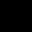

Frame 3236: Predicted Class = 76


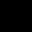

Frame 3237: Predicted Class = 76


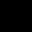

Frame 3238: Predicted Class = 76


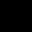

Frame 3239: Predicted Class = 76


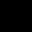

Frame 3240: Predicted Class = 76


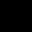

Frame 3241: Predicted Class = 76


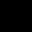

Frame 3242: Predicted Class = 76


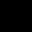

Frame 3243: Predicted Class = 76


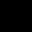

Frame 3244: Predicted Class = 76


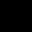

Frame 3245: Predicted Class = 76


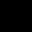

Frame 3246: Predicted Class = 76


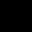

Frame 3247: Predicted Class = 76


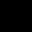

Frame 3248: Predicted Class = 76


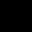

Frame 3249: Predicted Class = 76


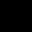

Frame 3250: Predicted Class = 76


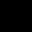

Frame 3251: Predicted Class = 76


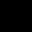

Frame 3252: Predicted Class = 76


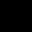

Frame 3253: Predicted Class = 76


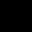

Frame 3254: Predicted Class = 76


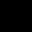

Frame 3255: Predicted Class = 76


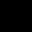

Frame 3256: Predicted Class = 76


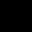

Frame 3257: Predicted Class = 76


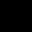

Frame 3258: Predicted Class = 76


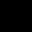

Frame 3259: Predicted Class = 76


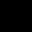

Frame 3260: Predicted Class = 76


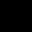

Frame 3261: Predicted Class = 76


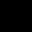

Frame 3262: Predicted Class = 76


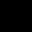

Frame 3263: Predicted Class = 76


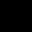

Frame 3264: Predicted Class = 76


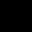

Frame 3265: Predicted Class = 76


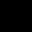

Frame 3266: Predicted Class = 76


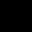

Frame 3267: Predicted Class = 76


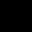

Frame 3268: Predicted Class = 76


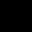

Frame 3269: Predicted Class = 76


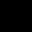

Frame 3270: Predicted Class = 76


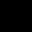

Frame 3271: Predicted Class = 76


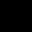

Frame 3272: Predicted Class = 76


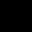

Frame 3273: Predicted Class = 76


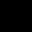

Frame 3274: Predicted Class = 76


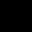

Frame 3275: Predicted Class = 76


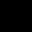

Frame 3276: Predicted Class = 76


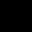

Frame 3277: Predicted Class = 76


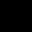

Frame 3278: Predicted Class = 76


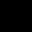

Frame 3279: Predicted Class = 76


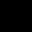

Frame 3280: Predicted Class = 76


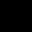

Frame 3281: Predicted Class = 76


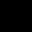

Frame 3282: Predicted Class = 76


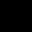

Frame 3283: Predicted Class = 76


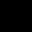

Frame 3284: Predicted Class = 76


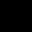

Frame 3285: Predicted Class = 76


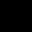

Frame 3286: Predicted Class = 76


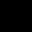

Frame 3287: Predicted Class = 76


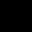

Frame 3288: Predicted Class = 76


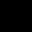

Frame 3289: Predicted Class = 76


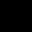

Frame 3290: Predicted Class = 76


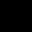

Frame 3291: Predicted Class = 76


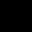

Frame 3292: Predicted Class = 76


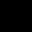

Frame 3293: Predicted Class = 76


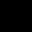

Frame 3294: Predicted Class = 76


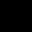

Frame 3295: Predicted Class = 76


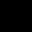

Frame 3296: Predicted Class = 76


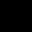

Frame 3297: Predicted Class = 76


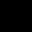

Frame 3298: Predicted Class = 76


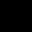

Frame 3299: Predicted Class = 76


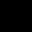

Frame 3300: Predicted Class = 76


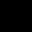

Frame 3301: Predicted Class = 76


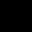

Frame 3302: Predicted Class = 76


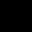

Frame 3303: Predicted Class = 76


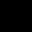

Frame 3304: Predicted Class = 76


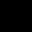

Frame 3305: Predicted Class = 76


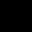

Frame 3306: Predicted Class = 76


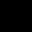

Frame 3307: Predicted Class = 76


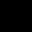

Frame 3308: Predicted Class = 76


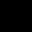

Frame 3309: Predicted Class = 76


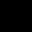

Frame 3310: Predicted Class = 76


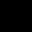

Frame 3311: Predicted Class = 76


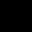

Frame 3312: Predicted Class = 76


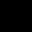

Frame 3313: Predicted Class = 76


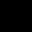

Frame 3314: Predicted Class = 76


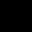

Frame 3315: Predicted Class = 76


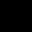

Frame 3316: Predicted Class = 76


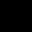

Frame 3317: Predicted Class = 76


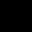

Frame 3318: Predicted Class = 76


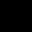

Frame 3319: Predicted Class = 76


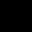

Frame 3320: Predicted Class = 76


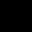

Frame 3321: Predicted Class = 76


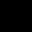

Frame 3322: Predicted Class = 76


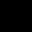

Frame 3323: Predicted Class = 76


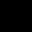

Frame 3324: Predicted Class = 76


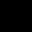

Frame 3325: Predicted Class = 76


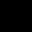

Frame 3326: Predicted Class = 76


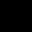

Frame 3327: Predicted Class = 76


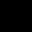

Frame 3328: Predicted Class = 76


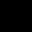

Frame 3329: Predicted Class = 76


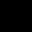

Frame 3330: Predicted Class = 76


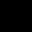

Frame 3331: Predicted Class = 76


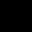

Frame 3332: Predicted Class = 76


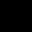

Frame 3333: Predicted Class = 76


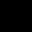

Frame 3334: Predicted Class = 76


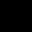

Frame 3335: Predicted Class = 76


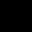

Frame 3336: Predicted Class = 76


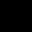

Frame 3337: Predicted Class = 76


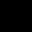

Frame 3338: Predicted Class = 76


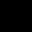

Frame 3339: Predicted Class = 76


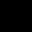

Frame 3340: Predicted Class = 76


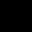

Frame 3341: Predicted Class = 76


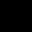

Frame 3342: Predicted Class = 76


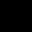

Frame 3343: Predicted Class = 76


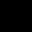

Frame 3344: Predicted Class = 76


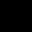

Frame 3345: Predicted Class = 76


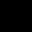

Frame 3346: Predicted Class = 76


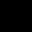

Frame 3347: Predicted Class = 76


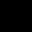

Frame 3348: Predicted Class = 76


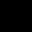

Frame 3349: Predicted Class = 76


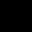

Frame 3350: Predicted Class = 76


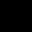

Frame 3351: Predicted Class = 76


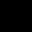

Frame 3352: Predicted Class = 76


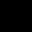

Frame 3353: Predicted Class = 76


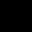

Frame 3354: Predicted Class = 76


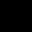

Frame 3355: Predicted Class = 76


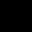

Frame 3356: Predicted Class = 76


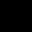

Frame 3357: Predicted Class = 76


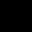

Frame 3358: Predicted Class = 76


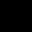

Frame 3359: Predicted Class = 76


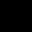

Frame 3360: Predicted Class = 76


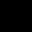

Frame 3361: Predicted Class = 76


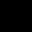

Frame 3362: Predicted Class = 76


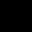

Frame 3363: Predicted Class = 76


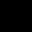

Frame 3364: Predicted Class = 76


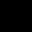

Frame 3365: Predicted Class = 76


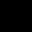

Frame 3366: Predicted Class = 76


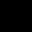

Frame 3367: Predicted Class = 76


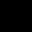

Frame 3368: Predicted Class = 76


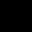

Frame 3369: Predicted Class = 76


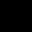

Frame 3370: Predicted Class = 76


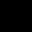

Frame 3371: Predicted Class = 76


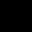

Frame 3372: Predicted Class = 76


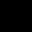

Frame 3373: Predicted Class = 76


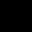

Frame 3374: Predicted Class = 76


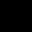

Frame 3375: Predicted Class = 76


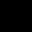

Frame 3376: Predicted Class = 76


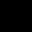

Frame 3377: Predicted Class = 76


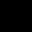

Frame 3378: Predicted Class = 76


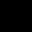

Frame 3379: Predicted Class = 76


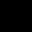

Frame 3380: Predicted Class = 76


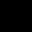

Frame 3381: Predicted Class = 76


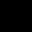

Frame 3382: Predicted Class = 76


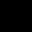

Frame 3383: Predicted Class = 76


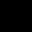

Frame 3384: Predicted Class = 76


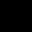

Frame 3385: Predicted Class = 76


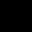

Frame 3386: Predicted Class = 76


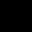

Frame 3387: Predicted Class = 76


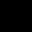

Frame 3388: Predicted Class = 76


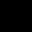

Frame 3389: Predicted Class = 76


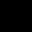

Frame 3390: Predicted Class = 76


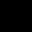

Frame 3391: Predicted Class = 76


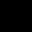

Frame 3392: Predicted Class = 76


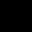

Frame 3393: Predicted Class = 76


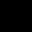

Frame 3394: Predicted Class = 76


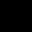

Frame 3395: Predicted Class = 76


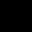

Frame 3396: Predicted Class = 76


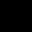

Frame 3397: Predicted Class = 76


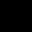

Frame 3398: Predicted Class = 76


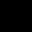

Frame 3399: Predicted Class = 76


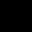

Frame 3400: Predicted Class = 76


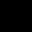

Frame 3401: Predicted Class = 76


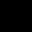

Frame 3402: Predicted Class = 76


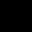

Frame 3403: Predicted Class = 76


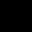

Frame 3404: Predicted Class = 76


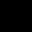

Frame 3405: Predicted Class = 76


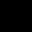

Frame 3406: Predicted Class = 76


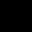

Frame 3407: Predicted Class = 76


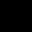

Frame 3408: Predicted Class = 76


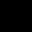

Frame 3409: Predicted Class = 76


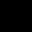

Frame 3410: Predicted Class = 76


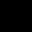

Frame 3411: Predicted Class = 76


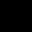

Frame 3412: Predicted Class = 76


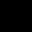

Frame 3413: Predicted Class = 76


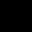

Frame 3414: Predicted Class = 76


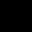

Frame 3415: Predicted Class = 76


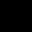

Frame 3416: Predicted Class = 76


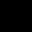

Frame 3417: Predicted Class = 76


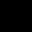

Frame 3418: Predicted Class = 76


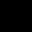

Frame 3419: Predicted Class = 76


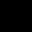

Frame 3420: Predicted Class = 76


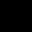

Frame 3421: Predicted Class = 76


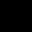

Frame 3422: Predicted Class = 76


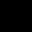

Frame 3423: Predicted Class = 76


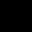

Frame 3424: Predicted Class = 76


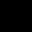

Frame 3425: Predicted Class = 76


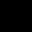

Frame 3426: Predicted Class = 76


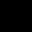

Frame 3427: Predicted Class = 76


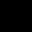

Frame 3428: Predicted Class = 76


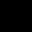

Frame 3429: Predicted Class = 76


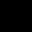

Frame 3430: Predicted Class = 76


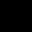

Frame 3431: Predicted Class = 76


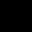

Frame 3432: Predicted Class = 76


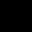

Frame 3433: Predicted Class = 76


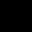

Frame 3434: Predicted Class = 76


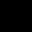

Frame 3435: Predicted Class = 76


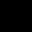

Frame 3436: Predicted Class = 76


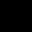

Frame 3437: Predicted Class = 76


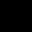

Frame 3438: Predicted Class = 76


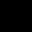

Frame 3439: Predicted Class = 76


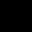

Frame 3440: Predicted Class = 76


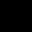

Frame 3441: Predicted Class = 76


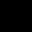

Frame 3442: Predicted Class = 76


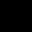

Frame 3443: Predicted Class = 76


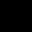

Frame 3444: Predicted Class = 76


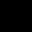

Frame 3445: Predicted Class = 76


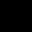

Frame 3446: Predicted Class = 76


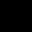

Frame 3447: Predicted Class = 76


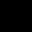

Frame 3448: Predicted Class = 76


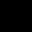

Frame 3449: Predicted Class = 76


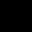

Frame 3450: Predicted Class = 76


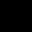

Frame 3451: Predicted Class = 76


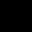

Frame 3452: Predicted Class = 76


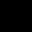

Frame 3453: Predicted Class = 76


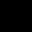

Frame 3454: Predicted Class = 76


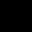

Frame 3455: Predicted Class = 76


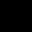

Frame 3456: Predicted Class = 76


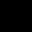

Frame 3457: Predicted Class = 76


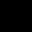

Frame 3458: Predicted Class = 76


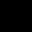

Frame 3459: Predicted Class = 76


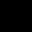

Frame 3460: Predicted Class = 76


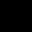

Frame 3461: Predicted Class = 76


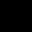

Frame 3462: Predicted Class = 76


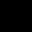

Frame 3463: Predicted Class = 76


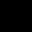

Frame 3464: Predicted Class = 76


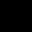

Frame 3465: Predicted Class = 76


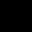

Frame 3466: Predicted Class = 76


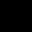

Frame 3467: Predicted Class = 76


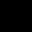

Frame 3468: Predicted Class = 76


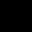

Frame 3469: Predicted Class = 76


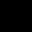

Frame 3470: Predicted Class = 76


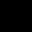

Frame 3471: Predicted Class = 76


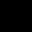

Frame 3472: Predicted Class = 76


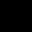

Frame 3473: Predicted Class = 76


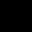

Frame 3474: Predicted Class = 76


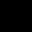

Frame 3475: Predicted Class = 76


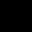

Frame 3476: Predicted Class = 76


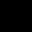

Frame 3477: Predicted Class = 76


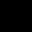

Frame 3478: Predicted Class = 76


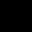

Frame 3479: Predicted Class = 76


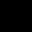

Frame 3480: Predicted Class = 76


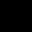

Frame 3481: Predicted Class = 76


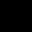

Frame 3482: Predicted Class = 76


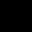

Frame 3483: Predicted Class = 76


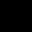

Frame 3484: Predicted Class = 76


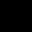

Frame 3485: Predicted Class = 76


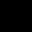

Frame 3486: Predicted Class = 76


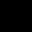

Frame 3487: Predicted Class = 76


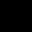

Frame 3488: Predicted Class = 76


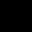

Frame 3489: Predicted Class = 76


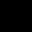

Frame 3490: Predicted Class = 76


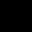

Frame 3491: Predicted Class = 76


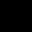

Frame 3492: Predicted Class = 76


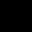

Frame 3493: Predicted Class = 76


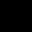

Frame 3494: Predicted Class = 76


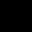

Frame 3495: Predicted Class = 76


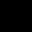

Frame 3496: Predicted Class = 76


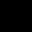

Frame 3497: Predicted Class = 76


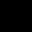

Frame 3498: Predicted Class = 76


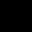

Frame 3499: Predicted Class = 76


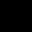

Frame 3500: Predicted Class = 76


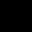

Frame 3501: Predicted Class = 76


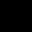

Frame 3502: Predicted Class = 76


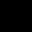

Frame 3503: Predicted Class = 76


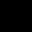

Frame 3504: Predicted Class = 76


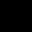

Frame 3505: Predicted Class = 76


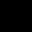

Frame 3506: Predicted Class = 76


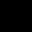

Frame 3507: Predicted Class = 76


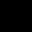

Frame 3508: Predicted Class = 76


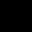

Frame 3509: Predicted Class = 76


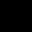

Frame 3510: Predicted Class = 76


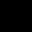

Frame 3511: Predicted Class = 76


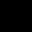

Frame 3512: Predicted Class = 76


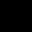

Frame 3513: Predicted Class = 76


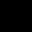

Frame 3514: Predicted Class = 76


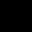

Frame 3515: Predicted Class = 76


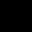

Frame 3516: Predicted Class = 76


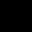

Frame 3517: Predicted Class = 76


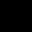

Frame 3518: Predicted Class = 76


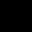

Frame 3519: Predicted Class = 76


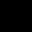

Frame 3520: Predicted Class = 76


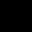

Frame 3521: Predicted Class = 76


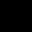

Frame 3522: Predicted Class = 76


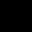

Frame 3523: Predicted Class = 76


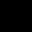

Frame 3524: Predicted Class = 76


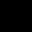

Frame 3525: Predicted Class = 76


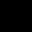

Frame 3526: Predicted Class = 76


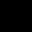

Frame 3527: Predicted Class = 76


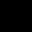

Frame 3528: Predicted Class = 76


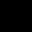

Frame 3529: Predicted Class = 76


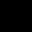

Frame 3530: Predicted Class = 76


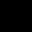

Frame 3531: Predicted Class = 76


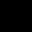

Frame 3532: Predicted Class = 76


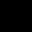

Frame 3533: Predicted Class = 76


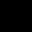

Frame 3534: Predicted Class = 76


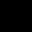

Frame 3535: Predicted Class = 76


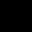

Frame 3536: Predicted Class = 76


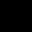

Frame 3537: Predicted Class = 76


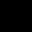

Frame 3538: Predicted Class = 76


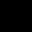

Frame 3539: Predicted Class = 76


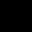

Frame 3540: Predicted Class = 76


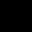

Frame 3541: Predicted Class = 76


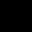

Frame 3542: Predicted Class = 76


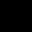

Frame 3543: Predicted Class = 76


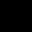

Frame 3544: Predicted Class = 76


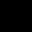

Frame 3545: Predicted Class = 76


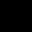

Frame 3546: Predicted Class = 76


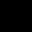

Frame 3547: Predicted Class = 76


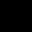

Frame 3548: Predicted Class = 76


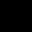

Frame 3549: Predicted Class = 76


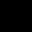

Frame 3550: Predicted Class = 76


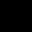

Frame 3551: Predicted Class = 76


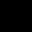

Frame 3552: Predicted Class = 76


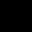

Frame 3553: Predicted Class = 76


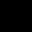

Frame 3554: Predicted Class = 76


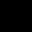

Frame 3555: Predicted Class = 76


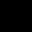

Frame 3556: Predicted Class = 76


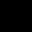

Frame 3557: Predicted Class = 76


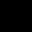

Frame 3558: Predicted Class = 76


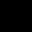

Frame 3559: Predicted Class = 76


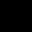

Frame 3560: Predicted Class = 76


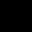

Frame 3561: Predicted Class = 76


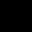

Frame 3562: Predicted Class = 76


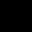

Frame 3563: Predicted Class = 76


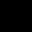

Frame 3564: Predicted Class = 76


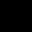

Frame 3565: Predicted Class = 76


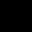

Frame 3566: Predicted Class = 76


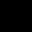

Frame 3567: Predicted Class = 76


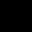

Frame 3568: Predicted Class = 76


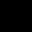

Frame 3569: Predicted Class = 76


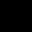

Frame 3570: Predicted Class = 76


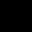

Frame 3571: Predicted Class = 76


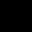

Frame 3572: Predicted Class = 76


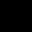

Frame 3573: Predicted Class = 76


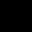

Frame 3574: Predicted Class = 76


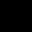

Frame 3575: Predicted Class = 76


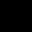

Frame 3576: Predicted Class = 76


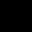

Frame 3577: Predicted Class = 76


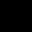

Frame 3578: Predicted Class = 76


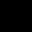

Frame 3579: Predicted Class = 76


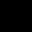

Frame 3580: Predicted Class = 76


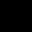

Frame 3581: Predicted Class = 76


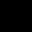

Frame 3582: Predicted Class = 76


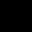

Frame 3583: Predicted Class = 76


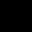

Frame 3584: Predicted Class = 76


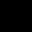

Frame 3585: Predicted Class = 76


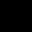

Frame 3586: Predicted Class = 76


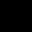

Frame 3587: Predicted Class = 76


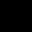

Frame 3588: Predicted Class = 76


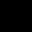

Frame 3589: Predicted Class = 76


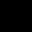

Frame 3590: Predicted Class = 76


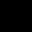

Frame 3591: Predicted Class = 76


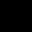

Frame 3592: Predicted Class = 76


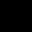

Frame 3593: Predicted Class = 76


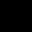

Frame 3594: Predicted Class = 76


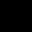

Frame 3595: Predicted Class = 76


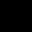

Frame 3596: Predicted Class = 76


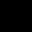

Frame 3597: Predicted Class = 76


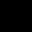

Frame 3598: Predicted Class = 76


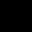

Frame 3599: Predicted Class = 76


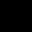

Frame 3600: Predicted Class = 76


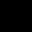

Frame 3601: Predicted Class = 76


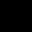

Frame 3602: Predicted Class = 76


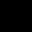

Frame 3603: Predicted Class = 76


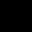

Frame 3604: Predicted Class = 76


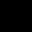

Frame 3605: Predicted Class = 76


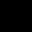

Frame 3606: Predicted Class = 76


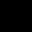

Frame 3607: Predicted Class = 76


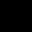

Frame 3608: Predicted Class = 76


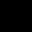

Frame 3609: Predicted Class = 76


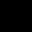

Frame 3610: Predicted Class = 76


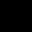

Frame 3611: Predicted Class = 76


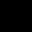

Frame 3612: Predicted Class = 76


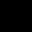

Frame 3613: Predicted Class = 76


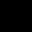

Frame 3614: Predicted Class = 76


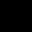

Frame 3615: Predicted Class = 76


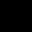

Frame 3616: Predicted Class = 76


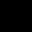

Frame 3617: Predicted Class = 76


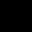

Frame 3618: Predicted Class = 76


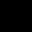

Frame 3619: Predicted Class = 76


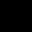

Frame 3620: Predicted Class = 76


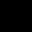

Frame 3621: Predicted Class = 76


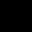

Frame 3622: Predicted Class = 76


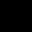

Frame 3623: Predicted Class = 76


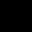

Frame 3624: Predicted Class = 76


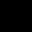

Frame 3625: Predicted Class = 76


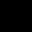

Frame 3626: Predicted Class = 76


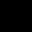

Frame 3627: Predicted Class = 76


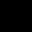

Frame 3628: Predicted Class = 76


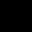

Frame 3629: Predicted Class = 76


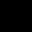

Frame 3630: Predicted Class = 76


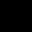

Frame 3631: Predicted Class = 76


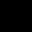

Frame 3632: Predicted Class = 76


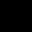

Frame 3633: Predicted Class = 76


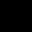

Frame 3634: Predicted Class = 76


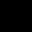

Frame 3635: Predicted Class = 76


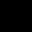

Frame 3636: Predicted Class = 76


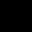

Frame 3637: Predicted Class = 76


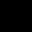

Frame 3638: Predicted Class = 76


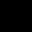

Frame 3639: Predicted Class = 76


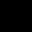

Frame 3640: Predicted Class = 76


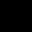

Frame 3641: Predicted Class = 76


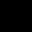

Frame 3642: Predicted Class = 76


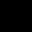

Frame 3643: Predicted Class = 76


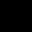

Frame 3644: Predicted Class = 76


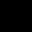

Frame 3645: Predicted Class = 76


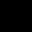

Frame 3646: Predicted Class = 76


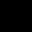

Frame 3647: Predicted Class = 76


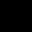

Frame 3648: Predicted Class = 76


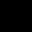

Frame 3649: Predicted Class = 76


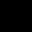

Frame 3650: Predicted Class = 76


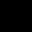

Frame 3651: Predicted Class = 76


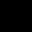

Frame 3652: Predicted Class = 76


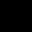

Frame 3653: Predicted Class = 76


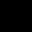

Frame 3654: Predicted Class = 76


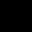

Frame 3655: Predicted Class = 76


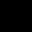

Frame 3656: Predicted Class = 76


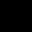

Frame 3657: Predicted Class = 76


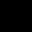

Frame 3658: Predicted Class = 76


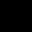

Frame 3659: Predicted Class = 76


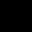

Frame 3660: Predicted Class = 76


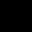

Frame 3661: Predicted Class = 76


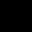

Frame 3662: Predicted Class = 76


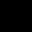

Frame 3663: Predicted Class = 76


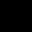

Frame 3664: Predicted Class = 76


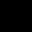

Frame 3665: Predicted Class = 76


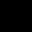

Frame 3666: Predicted Class = 76


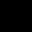

Frame 3667: Predicted Class = 76


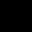

Frame 3668: Predicted Class = 76


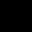

Frame 3669: Predicted Class = 76


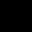

Frame 3670: Predicted Class = 76


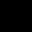

Frame 3671: Predicted Class = 76


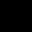

Frame 3672: Predicted Class = 76


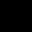

Frame 3673: Predicted Class = 76


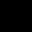

Frame 3674: Predicted Class = 76


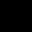

Frame 3675: Predicted Class = 76


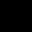

Frame 3676: Predicted Class = 76


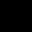

Frame 3677: Predicted Class = 76


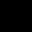

Frame 3678: Predicted Class = 76


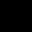

Frame 3679: Predicted Class = 76


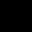

Frame 3680: Predicted Class = 76


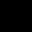

Frame 3681: Predicted Class = 76


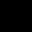

Frame 3682: Predicted Class = 76


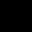

Frame 3683: Predicted Class = 76


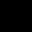

Frame 3684: Predicted Class = 76


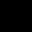

Frame 3685: Predicted Class = 76


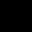

Frame 3686: Predicted Class = 76


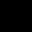

Frame 3687: Predicted Class = 76


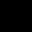

Frame 3688: Predicted Class = 76


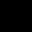

Frame 3689: Predicted Class = 76


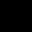

Frame 3690: Predicted Class = 76


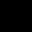

Frame 3691: Predicted Class = 76


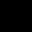

Frame 3692: Predicted Class = 76


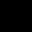

Frame 3693: Predicted Class = 76


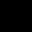

Frame 3694: Predicted Class = 76


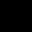

Frame 3695: Predicted Class = 76


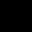

Frame 3696: Predicted Class = 76


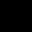

Frame 3697: Predicted Class = 76


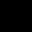

Frame 3698: Predicted Class = 76


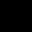

Frame 3699: Predicted Class = 76


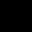

Frame 3700: Predicted Class = 76


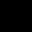

Frame 3701: Predicted Class = 76


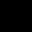

Frame 3702: Predicted Class = 76


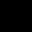

Frame 3703: Predicted Class = 76


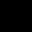

Frame 3704: Predicted Class = 76


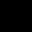

Frame 3705: Predicted Class = 76


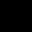

Frame 3706: Predicted Class = 76


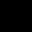

Frame 3707: Predicted Class = 76


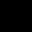

Frame 3708: Predicted Class = 76


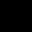

Frame 3709: Predicted Class = 76


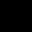

Frame 3710: Predicted Class = 76


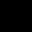

Frame 3711: Predicted Class = 76


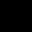

Frame 3712: Predicted Class = 76


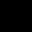

Frame 3713: Predicted Class = 76


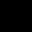

Frame 3714: Predicted Class = 76


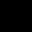

Frame 3715: Predicted Class = 76


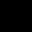

Frame 3716: Predicted Class = 76


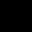

Frame 3717: Predicted Class = 76


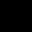

Frame 3718: Predicted Class = 76


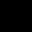

Frame 3719: Predicted Class = 76


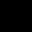

Frame 3720: Predicted Class = 76


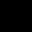

Frame 3721: Predicted Class = 76


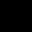

Frame 3722: Predicted Class = 76


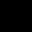

Frame 3723: Predicted Class = 76


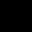

Frame 3724: Predicted Class = 76


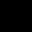

Frame 3725: Predicted Class = 76


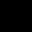

Frame 3726: Predicted Class = 76


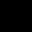

Frame 3727: Predicted Class = 76


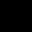

Frame 3728: Predicted Class = 76


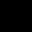

Frame 3729: Predicted Class = 76


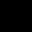

Frame 3730: Predicted Class = 76


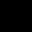

Frame 3731: Predicted Class = 76


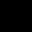

Frame 3732: Predicted Class = 76


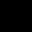

Frame 3733: Predicted Class = 76


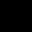

Frame 3734: Predicted Class = 76


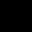

Frame 3735: Predicted Class = 76


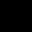

Frame 3736: Predicted Class = 76


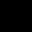

Frame 3737: Predicted Class = 76


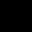

Frame 3738: Predicted Class = 76


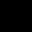

Frame 3739: Predicted Class = 76


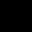

Frame 3740: Predicted Class = 76


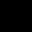

Frame 3741: Predicted Class = 76


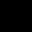

Frame 3742: Predicted Class = 76


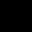

Frame 3743: Predicted Class = 76


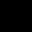

Frame 3744: Predicted Class = 76


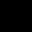

Frame 3745: Predicted Class = 76


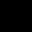

Frame 3746: Predicted Class = 76


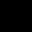

Frame 3747: Predicted Class = 76


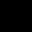

Frame 3748: Predicted Class = 76


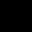

Frame 3749: Predicted Class = 76


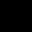

Frame 3750: Predicted Class = 76


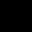

Frame 3751: Predicted Class = 76


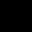

Frame 3752: Predicted Class = 76


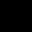

Frame 3753: Predicted Class = 76


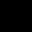

Frame 3754: Predicted Class = 76


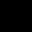

Frame 3755: Predicted Class = 76


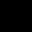

Frame 3756: Predicted Class = 76


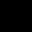

Frame 3757: Predicted Class = 76


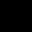

Frame 3758: Predicted Class = 76


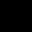

Frame 3759: Predicted Class = 76


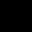

Frame 3760: Predicted Class = 76


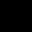

Frame 3761: Predicted Class = 76


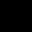

Frame 3762: Predicted Class = 76


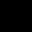

Frame 3763: Predicted Class = 76


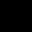

Frame 3764: Predicted Class = 76


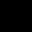

Frame 3765: Predicted Class = 76


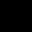

Frame 3766: Predicted Class = 76


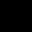

Frame 3767: Predicted Class = 76


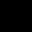

Frame 3768: Predicted Class = 76


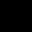

Frame 3769: Predicted Class = 76


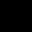

Frame 3770: Predicted Class = 76


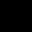

Frame 3771: Predicted Class = 76


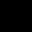

Frame 3772: Predicted Class = 76


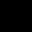

Frame 3773: Predicted Class = 76


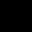

Frame 3774: Predicted Class = 76


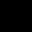

Frame 3775: Predicted Class = 76


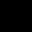

Frame 3776: Predicted Class = 76


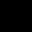

Frame 3777: Predicted Class = 76


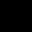

Frame 3778: Predicted Class = 76


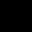

Frame 3779: Predicted Class = 76


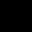

Frame 3780: Predicted Class = 76


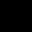

Frame 3781: Predicted Class = 76


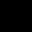

Frame 3782: Predicted Class = 76


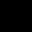

Frame 3783: Predicted Class = 76


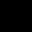

Frame 3784: Predicted Class = 76


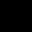

Frame 3785: Predicted Class = 76


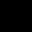

Frame 3786: Predicted Class = 76


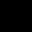

Frame 3787: Predicted Class = 76


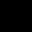

Frame 3788: Predicted Class = 76


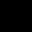

Frame 3789: Predicted Class = 76


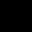

Frame 3790: Predicted Class = 76


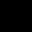

Frame 3791: Predicted Class = 76


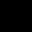

Frame 3792: Predicted Class = 76


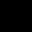

Frame 3793: Predicted Class = 76


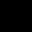

Frame 3794: Predicted Class = 76


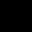

Frame 3795: Predicted Class = 76


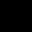

Frame 3796: Predicted Class = 76


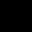

Frame 3797: Predicted Class = 76


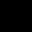

Frame 3798: Predicted Class = 76


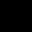

Frame 3799: Predicted Class = 76


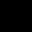

Frame 3800: Predicted Class = 76


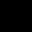

Frame 3801: Predicted Class = 76


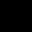

Frame 3802: Predicted Class = 76


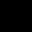

Frame 3803: Predicted Class = 76


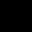

Frame 3804: Predicted Class = 76


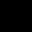

Frame 3805: Predicted Class = 76


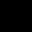

Frame 3806: Predicted Class = 76


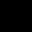

Frame 3807: Predicted Class = 76


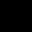

Frame 3808: Predicted Class = 76


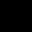

Frame 3809: Predicted Class = 76


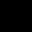

Frame 3810: Predicted Class = 76


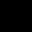

Frame 3811: Predicted Class = 76


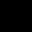

Frame 3812: Predicted Class = 76


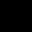

Frame 3813: Predicted Class = 76


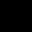

Frame 3814: Predicted Class = 76


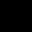

Frame 3815: Predicted Class = 76


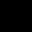

Frame 3816: Predicted Class = 76


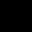

Frame 3817: Predicted Class = 76


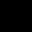

Frame 3818: Predicted Class = 76


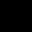

Frame 3819: Predicted Class = 76


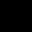

Frame 3820: Predicted Class = 76


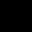

Frame 3821: Predicted Class = 76


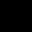

Frame 3822: Predicted Class = 76


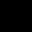

Frame 3823: Predicted Class = 76


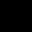

Frame 3824: Predicted Class = 76


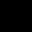

Frame 3825: Predicted Class = 76


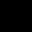

Frame 3826: Predicted Class = 76


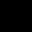

Frame 3827: Predicted Class = 76


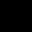

Frame 3828: Predicted Class = 76


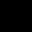

Frame 3829: Predicted Class = 76


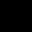

Frame 3830: Predicted Class = 76


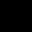

Frame 3831: Predicted Class = 76


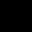

Frame 3832: Predicted Class = 76


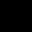

Frame 3833: Predicted Class = 76


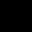

Frame 3834: Predicted Class = 76


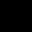

Frame 3835: Predicted Class = 76


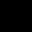

Frame 3836: Predicted Class = 76


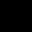

Frame 3837: Predicted Class = 76


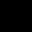

Frame 3838: Predicted Class = 76


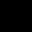

Frame 3839: Predicted Class = 76


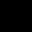

Frame 3840: Predicted Class = 76


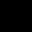

Frame 3841: Predicted Class = 76


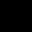

Frame 3842: Predicted Class = 76


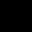

Frame 3843: Predicted Class = 76


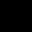

Frame 3844: Predicted Class = 76


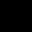

Frame 3845: Predicted Class = 76


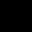

Frame 3846: Predicted Class = 76


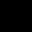

Frame 3847: Predicted Class = 76


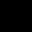

Frame 3848: Predicted Class = 76


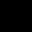

Frame 3849: Predicted Class = 76


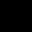

Frame 3850: Predicted Class = 76


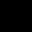

Frame 3851: Predicted Class = 76


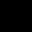

Frame 3852: Predicted Class = 76


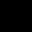

Frame 3853: Predicted Class = 76


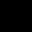

Frame 3854: Predicted Class = 76


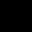

Frame 3855: Predicted Class = 76


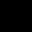

Frame 3856: Predicted Class = 76


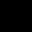

Frame 3857: Predicted Class = 76


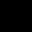

Frame 3858: Predicted Class = 76


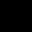

Frame 3859: Predicted Class = 76


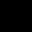

Frame 3860: Predicted Class = 76


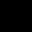

Frame 3861: Predicted Class = 76


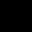

Frame 3862: Predicted Class = 76


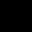

Frame 3863: Predicted Class = 76


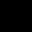

Frame 3864: Predicted Class = 76


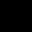

Frame 3865: Predicted Class = 76


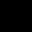

Frame 3866: Predicted Class = 76


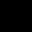

Frame 3867: Predicted Class = 76


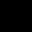

Frame 3868: Predicted Class = 76


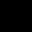

Frame 3869: Predicted Class = 76


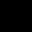

Frame 3870: Predicted Class = 76


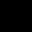

Frame 3871: Predicted Class = 76


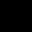

Frame 3872: Predicted Class = 76


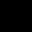

Frame 3873: Predicted Class = 76


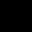

Frame 3874: Predicted Class = 76


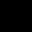

Frame 3875: Predicted Class = 76


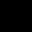

Frame 3876: Predicted Class = 76


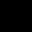

Frame 3877: Predicted Class = 76


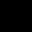

Frame 3878: Predicted Class = 76


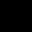

Frame 3879: Predicted Class = 76


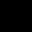

Frame 3880: Predicted Class = 76


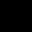

Frame 3881: Predicted Class = 76


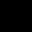

Frame 3882: Predicted Class = 76


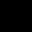

Frame 3883: Predicted Class = 76


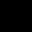

Frame 3884: Predicted Class = 76


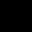

Frame 3885: Predicted Class = 76


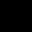

Frame 3886: Predicted Class = 76


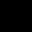

Frame 3887: Predicted Class = 76


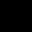

Frame 3888: Predicted Class = 76


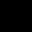

Frame 3889: Predicted Class = 76


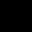

Frame 3890: Predicted Class = 76


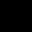

Frame 3891: Predicted Class = 76


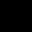

Frame 3892: Predicted Class = 76


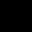

Frame 3893: Predicted Class = 76


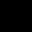

Frame 3894: Predicted Class = 76


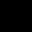

Frame 3895: Predicted Class = 76


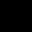

Frame 3896: Predicted Class = 76


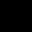

Frame 3897: Predicted Class = 76


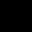

Frame 3898: Predicted Class = 76


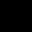

Frame 3899: Predicted Class = 76


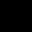

Frame 3900: Predicted Class = 76


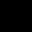

Frame 3901: Predicted Class = 76


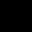

Frame 3902: Predicted Class = 76


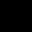

Frame 3903: Predicted Class = 76


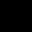

Frame 3904: Predicted Class = 76


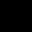

Frame 3905: Predicted Class = 76


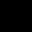

Frame 3906: Predicted Class = 76


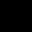

Frame 3907: Predicted Class = 76


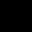

Frame 3908: Predicted Class = 76


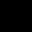

Frame 3909: Predicted Class = 76


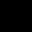

Frame 3910: Predicted Class = 76


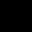

Frame 3911: Predicted Class = 76


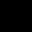

Frame 3912: Predicted Class = 76


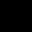

Frame 3913: Predicted Class = 76


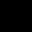

Frame 3914: Predicted Class = 76


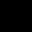

Frame 3915: Predicted Class = 76


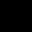

Frame 3916: Predicted Class = 76


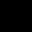

Frame 3917: Predicted Class = 76


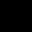

Frame 3918: Predicted Class = 76


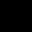

Frame 3919: Predicted Class = 76


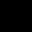

Frame 3920: Predicted Class = 76


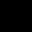

Frame 3921: Predicted Class = 76


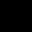

Frame 3922: Predicted Class = 76


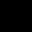

Frame 3923: Predicted Class = 76


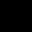

Frame 3924: Predicted Class = 76


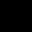

Frame 3925: Predicted Class = 76


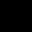

Frame 3926: Predicted Class = 76


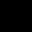

Frame 3927: Predicted Class = 76


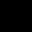

Frame 3928: Predicted Class = 76


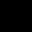

Frame 3929: Predicted Class = 76


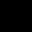

Frame 3930: Predicted Class = 76


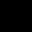

Frame 3931: Predicted Class = 76


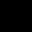

Frame 3932: Predicted Class = 76


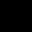

Frame 3933: Predicted Class = 76


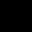

Frame 3934: Predicted Class = 76


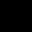

Frame 3935: Predicted Class = 76


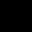

Frame 3936: Predicted Class = 76


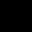

Frame 3937: Predicted Class = 76


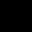

Frame 3938: Predicted Class = 76


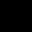

Frame 3939: Predicted Class = 76


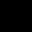

Frame 3940: Predicted Class = 76


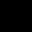

Frame 3941: Predicted Class = 76


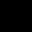

Frame 3942: Predicted Class = 76


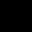

Frame 3943: Predicted Class = 76


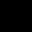

Frame 3944: Predicted Class = 76


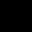

Frame 3945: Predicted Class = 76


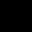

Frame 3946: Predicted Class = 76


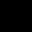

Frame 3947: Predicted Class = 76


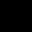

Frame 3948: Predicted Class = 76


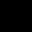

Frame 3949: Predicted Class = 76


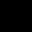

Frame 3950: Predicted Class = 76


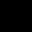

Frame 3951: Predicted Class = 76


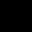

Frame 3952: Predicted Class = 76


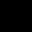

Frame 3953: Predicted Class = 76


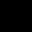

Frame 3954: Predicted Class = 76


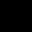

Frame 3955: Predicted Class = 76


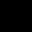

Frame 3956: Predicted Class = 76


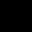

Frame 3957: Predicted Class = 76


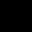

Frame 3958: Predicted Class = 76


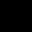

Frame 3959: Predicted Class = 76


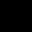

Frame 3960: Predicted Class = 76


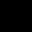

Frame 3961: Predicted Class = 76


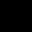

Frame 3962: Predicted Class = 76


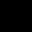

Frame 3963: Predicted Class = 76


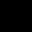

Frame 3964: Predicted Class = 76


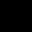

Frame 3965: Predicted Class = 76


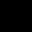

Frame 3966: Predicted Class = 76


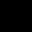

Frame 3967: Predicted Class = 76


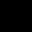

Frame 3968: Predicted Class = 76


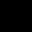

Frame 3969: Predicted Class = 76


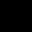

Frame 3970: Predicted Class = 76


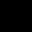

Frame 3971: Predicted Class = 76


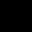

Frame 3972: Predicted Class = 76


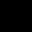

Frame 3973: Predicted Class = 76


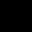

Frame 3974: Predicted Class = 76


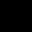

Frame 3975: Predicted Class = 76


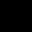

Frame 3976: Predicted Class = 76


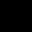

Frame 3977: Predicted Class = 76


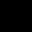

Frame 3978: Predicted Class = 76


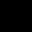

Frame 3979: Predicted Class = 76


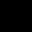

Frame 3980: Predicted Class = 76


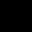

Frame 3981: Predicted Class = 76


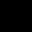

Frame 3982: Predicted Class = 76


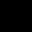

Frame 3983: Predicted Class = 76


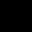

Frame 3984: Predicted Class = 76


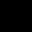

Frame 3985: Predicted Class = 76


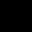

Frame 3986: Predicted Class = 76


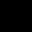

Frame 3987: Predicted Class = 76


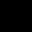

Frame 3988: Predicted Class = 76


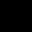

Frame 3989: Predicted Class = 76


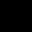

Frame 3990: Predicted Class = 76


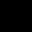

Frame 3991: Predicted Class = 76


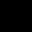

Frame 3992: Predicted Class = 76


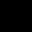

Frame 3993: Predicted Class = 76


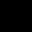

Frame 3994: Predicted Class = 76


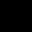

Frame 3995: Predicted Class = 76


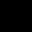

Frame 3996: Predicted Class = 76


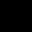

Frame 3997: Predicted Class = 76


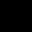

Frame 3998: Predicted Class = 76


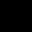

Frame 3999: Predicted Class = 76


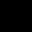

Frame 4000: Predicted Class = 76


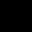

Frame 4001: Predicted Class = 76


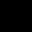

Frame 4002: Predicted Class = 76


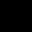

Frame 4003: Predicted Class = 76


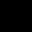

Frame 4004: Predicted Class = 76


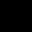

Frame 4005: Predicted Class = 76


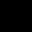

Frame 4006: Predicted Class = 76


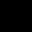

Frame 4007: Predicted Class = 76


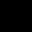

Frame 4008: Predicted Class = 76


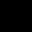

Frame 4009: Predicted Class = 76


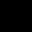

Frame 4010: Predicted Class = 76


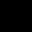

Frame 4011: Predicted Class = 76


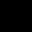

Frame 4012: Predicted Class = 76


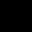

Frame 4013: Predicted Class = 76


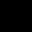

Frame 4014: Predicted Class = 76


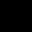

Frame 4015: Predicted Class = 76


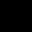

Frame 4016: Predicted Class = 76


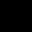

Frame 4017: Predicted Class = 76


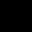

Frame 4018: Predicted Class = 76


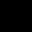

Frame 4019: Predicted Class = 76


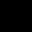

Frame 4020: Predicted Class = 76


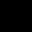

Frame 4021: Predicted Class = 76


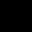

Frame 4022: Predicted Class = 76


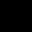

Frame 4023: Predicted Class = 76


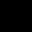

Frame 4024: Predicted Class = 76


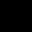

Frame 4025: Predicted Class = 76


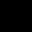

Frame 4026: Predicted Class = 76


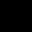

Frame 4027: Predicted Class = 76


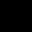

Frame 4028: Predicted Class = 76


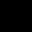

Frame 4029: Predicted Class = 76


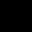

Frame 4030: Predicted Class = 76


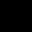

Frame 4031: Predicted Class = 76


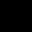

Frame 4032: Predicted Class = 76


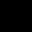

Frame 4033: Predicted Class = 76


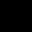

Frame 4034: Predicted Class = 76


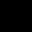

Frame 4035: Predicted Class = 76


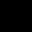

Frame 4036: Predicted Class = 76


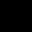

Frame 4037: Predicted Class = 76


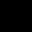

Frame 4038: Predicted Class = 76


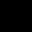

Frame 4039: Predicted Class = 76


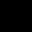

Frame 4040: Predicted Class = 76


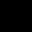

Frame 4041: Predicted Class = 76


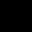

Frame 4042: Predicted Class = 76


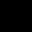

Frame 4043: Predicted Class = 76


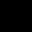

Frame 4044: Predicted Class = 76


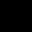

Frame 4045: Predicted Class = 76


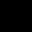

Frame 4046: Predicted Class = 76


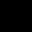

Frame 4047: Predicted Class = 76


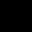

Frame 4048: Predicted Class = 76


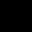

Frame 4049: Predicted Class = 76


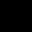

Frame 4050: Predicted Class = 76


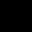

Frame 4051: Predicted Class = 76


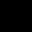

Frame 4052: Predicted Class = 76


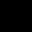

Frame 4053: Predicted Class = 76


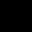

Frame 4054: Predicted Class = 76


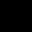

Frame 4055: Predicted Class = 76


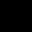

Frame 4056: Predicted Class = 76


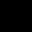

Frame 4057: Predicted Class = 76


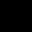

Frame 4058: Predicted Class = 76


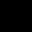

Frame 4059: Predicted Class = 76


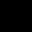

Frame 4060: Predicted Class = 76


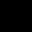

Frame 4061: Predicted Class = 76


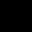

Frame 4062: Predicted Class = 76


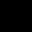

Frame 4063: Predicted Class = 76


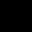

Frame 4064: Predicted Class = 76


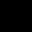

Frame 4065: Predicted Class = 76


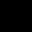

Frame 4066: Predicted Class = 76


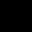

Frame 4067: Predicted Class = 76


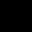

Frame 4068: Predicted Class = 76


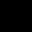

Frame 4069: Predicted Class = 76


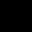

Frame 4070: Predicted Class = 76


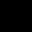

Frame 4071: Predicted Class = 76


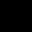

Frame 4072: Predicted Class = 76


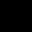

Frame 4073: Predicted Class = 76


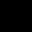

Frame 4074: Predicted Class = 76


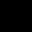

Frame 4075: Predicted Class = 76


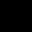

Frame 4076: Predicted Class = 76


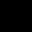

Frame 4077: Predicted Class = 76


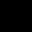

Frame 4078: Predicted Class = 76


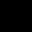

Frame 4079: Predicted Class = 76


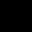

Frame 4080: Predicted Class = 76


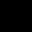

Frame 4081: Predicted Class = 76


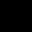

Frame 4082: Predicted Class = 76


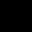

Frame 4083: Predicted Class = 76


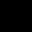

Frame 4084: Predicted Class = 76


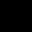

Frame 4085: Predicted Class = 76


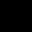

Frame 4086: Predicted Class = 76


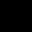

Frame 4087: Predicted Class = 76


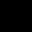

Frame 4088: Predicted Class = 76


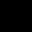

Frame 4089: Predicted Class = 76


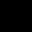

Frame 4090: Predicted Class = 76


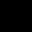

Frame 4091: Predicted Class = 76


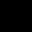

Frame 4092: Predicted Class = 76


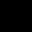

Frame 4093: Predicted Class = 76


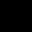

Frame 4094: Predicted Class = 76


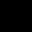

Frame 4095: Predicted Class = 76


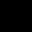

Frame 4096: Predicted Class = 76


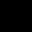

Frame 4097: Predicted Class = 76


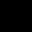

Frame 4098: Predicted Class = 76


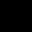

Frame 4099: Predicted Class = 76


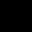

Frame 4100: Predicted Class = 76


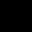

Frame 4101: Predicted Class = 76


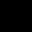

Frame 4102: Predicted Class = 76


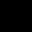

Frame 4103: Predicted Class = 76


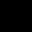

Frame 4104: Predicted Class = 76


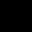

Frame 4105: Predicted Class = 76


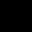

Frame 4106: Predicted Class = 76


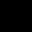

Frame 4107: Predicted Class = 76


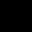

Frame 4108: Predicted Class = 76


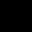

Frame 4109: Predicted Class = 76


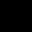

Frame 4110: Predicted Class = 76


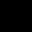

Frame 4111: Predicted Class = 76


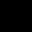

Frame 4112: Predicted Class = 76


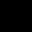

Frame 4113: Predicted Class = 76


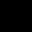

Frame 4114: Predicted Class = 76


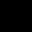

Frame 4115: Predicted Class = 76


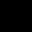

Frame 4116: Predicted Class = 76


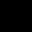

Frame 4117: Predicted Class = 76


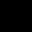

Frame 4118: Predicted Class = 76


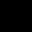

Frame 4119: Predicted Class = 76


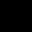

Frame 4120: Predicted Class = 76


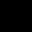

Frame 4121: Predicted Class = 76


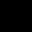

Frame 4122: Predicted Class = 76


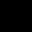

Frame 4123: Predicted Class = 76


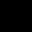

Frame 4124: Predicted Class = 76


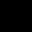

Frame 4125: Predicted Class = 76


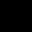

Frame 4126: Predicted Class = 76


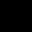

Frame 4127: Predicted Class = 76


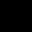

Frame 4128: Predicted Class = 76


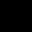

Frame 4129: Predicted Class = 76


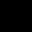

Frame 4130: Predicted Class = 76


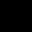

Frame 4131: Predicted Class = 76


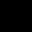

Frame 4132: Predicted Class = 76


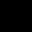

Frame 4133: Predicted Class = 76


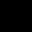

Frame 4134: Predicted Class = 76


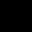

Frame 4135: Predicted Class = 76


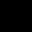

Frame 4136: Predicted Class = 76


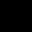

Frame 4137: Predicted Class = 76


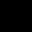

Frame 4138: Predicted Class = 76


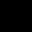

Frame 4139: Predicted Class = 76


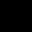

Frame 4140: Predicted Class = 76


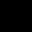

Frame 4141: Predicted Class = 76


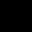

Frame 4142: Predicted Class = 76


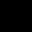

Frame 4143: Predicted Class = 76


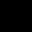

Frame 4144: Predicted Class = 76


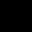

Frame 4145: Predicted Class = 76


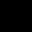

Frame 4146: Predicted Class = 76


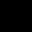

Frame 4147: Predicted Class = 76


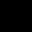

Frame 4148: Predicted Class = 76


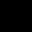

Frame 4149: Predicted Class = 76


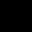

Frame 4150: Predicted Class = 76


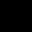

Frame 4151: Predicted Class = 76


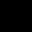

Frame 4152: Predicted Class = 76


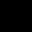

Frame 4153: Predicted Class = 76


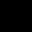

Frame 4154: Predicted Class = 76


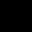

Frame 4155: Predicted Class = 76


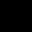

Frame 4156: Predicted Class = 76


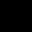

Frame 4157: Predicted Class = 76


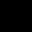

Frame 4158: Predicted Class = 76


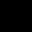

Frame 4159: Predicted Class = 76


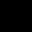

Frame 4160: Predicted Class = 76


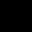

Frame 4161: Predicted Class = 76


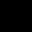

Frame 4162: Predicted Class = 76


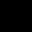

Frame 4163: Predicted Class = 76


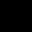

Frame 4164: Predicted Class = 76


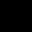

Frame 4165: Predicted Class = 76


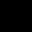

Frame 4166: Predicted Class = 76


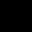

Frame 4167: Predicted Class = 76


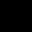

Frame 4168: Predicted Class = 76


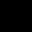

Frame 4169: Predicted Class = 76


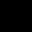

Frame 4170: Predicted Class = 76


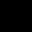

Frame 4171: Predicted Class = 76


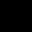

Frame 4172: Predicted Class = 76


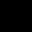

Frame 4173: Predicted Class = 76


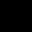

Frame 4174: Predicted Class = 76


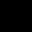

Frame 4175: Predicted Class = 76


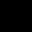

Frame 4176: Predicted Class = 76


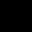

Frame 4177: Predicted Class = 76


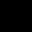

Frame 4178: Predicted Class = 76


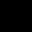

Frame 4179: Predicted Class = 76


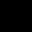

Frame 4180: Predicted Class = 76


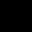

Frame 4181: Predicted Class = 76


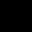

Frame 4182: Predicted Class = 76


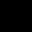

Frame 4183: Predicted Class = 76


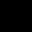

Frame 4184: Predicted Class = 76


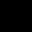

Frame 4185: Predicted Class = 76


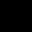

Frame 4186: Predicted Class = 76


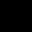

Frame 4187: Predicted Class = 76


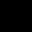

Frame 4188: Predicted Class = 76


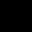

Frame 4189: Predicted Class = 76


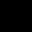

Frame 4190: Predicted Class = 76


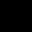

Frame 4191: Predicted Class = 76


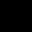

Frame 4192: Predicted Class = 76


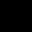

Frame 4193: Predicted Class = 76


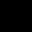

Frame 4194: Predicted Class = 76


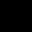

Frame 4195: Predicted Class = 76


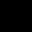

Frame 4196: Predicted Class = 76


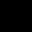

Frame 4197: Predicted Class = 76


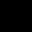

Frame 4198: Predicted Class = 76


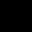

Frame 4199: Predicted Class = 76


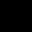

Frame 4200: Predicted Class = 76


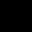

Frame 4201: Predicted Class = 76


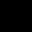

Frame 4202: Predicted Class = 76


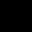

Frame 4203: Predicted Class = 76


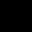

Frame 4204: Predicted Class = 76


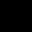

Frame 4205: Predicted Class = 76


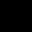

Frame 4206: Predicted Class = 76


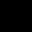

Frame 4207: Predicted Class = 76


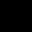

Frame 4208: Predicted Class = 76


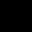

Frame 4209: Predicted Class = 76


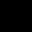

Frame 4210: Predicted Class = 76


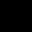

Frame 4211: Predicted Class = 76


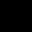

Frame 4212: Predicted Class = 76


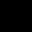

Frame 4213: Predicted Class = 76


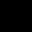

Frame 4214: Predicted Class = 76


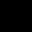

Frame 4215: Predicted Class = 76


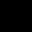

Frame 4216: Predicted Class = 76


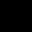

Frame 4217: Predicted Class = 76


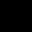

Frame 4218: Predicted Class = 76


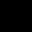

Frame 4219: Predicted Class = 76


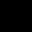

Frame 4220: Predicted Class = 76


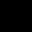

Frame 4221: Predicted Class = 76


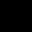

Frame 4222: Predicted Class = 76


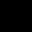

Frame 4223: Predicted Class = 76


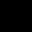

Frame 4224: Predicted Class = 76


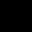

Frame 4225: Predicted Class = 76


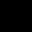

Frame 4226: Predicted Class = 76


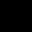

Frame 4227: Predicted Class = 76


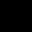

Frame 4228: Predicted Class = 76


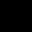

Frame 4229: Predicted Class = 76


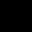

Frame 4230: Predicted Class = 76


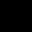

Frame 4231: Predicted Class = 76


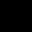

Frame 4232: Predicted Class = 76


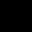

Frame 4233: Predicted Class = 76


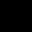

Frame 4234: Predicted Class = 76


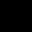

Frame 4235: Predicted Class = 76


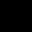

Frame 4236: Predicted Class = 76


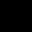

Frame 4237: Predicted Class = 76


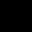

Frame 4238: Predicted Class = 76


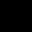

Frame 4239: Predicted Class = 76


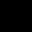

Frame 4240: Predicted Class = 76


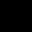

Frame 4241: Predicted Class = 76


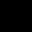

Frame 4242: Predicted Class = 76


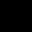

Frame 4243: Predicted Class = 76


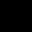

Frame 4244: Predicted Class = 76


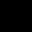

Frame 4245: Predicted Class = 76


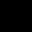

Frame 4246: Predicted Class = 76


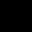

Frame 4247: Predicted Class = 76


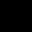

Frame 4248: Predicted Class = 76


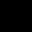

Frame 4249: Predicted Class = 76


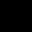

Frame 4250: Predicted Class = 76


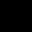

Frame 4251: Predicted Class = 76


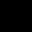

Frame 4252: Predicted Class = 76


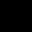

Frame 4253: Predicted Class = 76


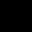

Frame 4254: Predicted Class = 76


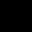

Frame 4255: Predicted Class = 76


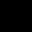

Frame 4256: Predicted Class = 76


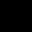

Frame 4257: Predicted Class = 76


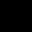

Frame 4258: Predicted Class = 76


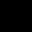

Frame 4259: Predicted Class = 76


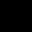

Frame 4260: Predicted Class = 76


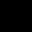

Frame 4261: Predicted Class = 76


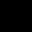

Frame 4262: Predicted Class = 76


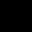

Frame 4263: Predicted Class = 76


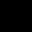

Frame 4264: Predicted Class = 76


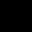

Frame 4265: Predicted Class = 76


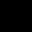

Frame 4266: Predicted Class = 76


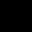

Frame 4267: Predicted Class = 76


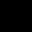

Frame 4268: Predicted Class = 76


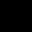

Frame 4269: Predicted Class = 76


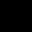

Frame 4270: Predicted Class = 76


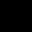

Frame 4271: Predicted Class = 76


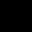

Frame 4272: Predicted Class = 76


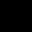

Frame 4273: Predicted Class = 76


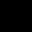

Frame 4274: Predicted Class = 76


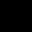

Frame 4275: Predicted Class = 76


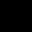

Frame 4276: Predicted Class = 76


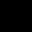

Frame 4277: Predicted Class = 76


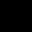

Frame 4278: Predicted Class = 76


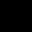

Frame 4279: Predicted Class = 76


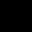

Frame 4280: Predicted Class = 76


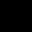

Frame 4281: Predicted Class = 76


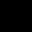

Frame 4282: Predicted Class = 76


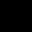

Frame 4283: Predicted Class = 76


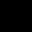

Frame 4284: Predicted Class = 76


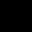

Frame 4285: Predicted Class = 76


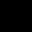

Frame 4286: Predicted Class = 76


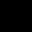

Frame 4287: Predicted Class = 76


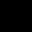

Frame 4288: Predicted Class = 76


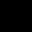

Frame 4289: Predicted Class = 76


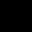

Frame 4290: Predicted Class = 76


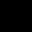

Frame 4291: Predicted Class = 76


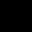

Frame 4292: Predicted Class = 76


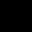

Frame 4293: Predicted Class = 76


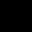

Frame 4294: Predicted Class = 76


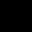

Frame 4295: Predicted Class = 76


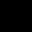

Frame 4296: Predicted Class = 76


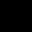

Frame 4297: Predicted Class = 76


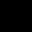

Frame 4298: Predicted Class = 76


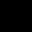

Frame 4299: Predicted Class = 76


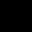

Frame 4300: Predicted Class = 76


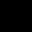

Frame 4301: Predicted Class = 76


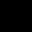

Frame 4302: Predicted Class = 76


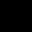

Frame 4303: Predicted Class = 76


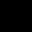

Frame 4304: Predicted Class = 76


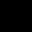

Frame 4305: Predicted Class = 76


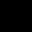

Frame 4306: Predicted Class = 76


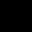

Frame 4307: Predicted Class = 76


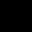

Frame 4308: Predicted Class = 76


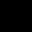

Frame 4309: Predicted Class = 76


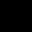

Frame 4310: Predicted Class = 76


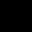

Frame 4311: Predicted Class = 76


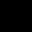

Frame 4312: Predicted Class = 76


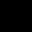

Frame 4313: Predicted Class = 76


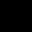

Frame 4314: Predicted Class = 76


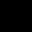

Frame 4315: Predicted Class = 76


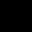

Frame 4316: Predicted Class = 76


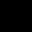

Frame 4317: Predicted Class = 76


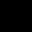

Frame 4318: Predicted Class = 76


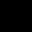

Frame 4319: Predicted Class = 76


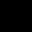

Frame 4320: Predicted Class = 76


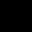

Frame 4321: Predicted Class = 76


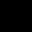

Frame 4322: Predicted Class = 76


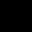

Frame 4323: Predicted Class = 76


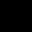

Frame 4324: Predicted Class = 76


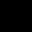

Frame 4325: Predicted Class = 76


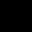

Frame 4326: Predicted Class = 76


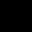

Frame 4327: Predicted Class = 76


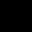

Frame 4328: Predicted Class = 76


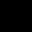

Frame 4329: Predicted Class = 76


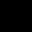

Frame 4330: Predicted Class = 76


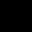

Frame 4331: Predicted Class = 76


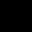

Frame 4332: Predicted Class = 76


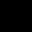

Frame 4333: Predicted Class = 76


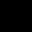

Frame 4334: Predicted Class = 76


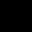

Frame 4335: Predicted Class = 76


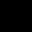

Frame 4336: Predicted Class = 76


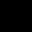

Frame 4337: Predicted Class = 76


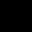

Frame 4338: Predicted Class = 76


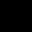

Frame 4339: Predicted Class = 76


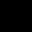

Frame 4340: Predicted Class = 76


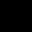

Frame 4341: Predicted Class = 76


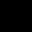

Frame 4342: Predicted Class = 76


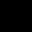

Frame 4343: Predicted Class = 76


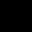

Frame 4344: Predicted Class = 76


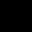

Frame 4345: Predicted Class = 76


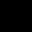

Frame 4346: Predicted Class = 76


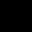

Frame 4347: Predicted Class = 76


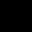

Frame 4348: Predicted Class = 76


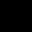

Frame 4349: Predicted Class = 76


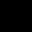

Frame 4350: Predicted Class = 76


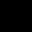

Frame 4351: Predicted Class = 76


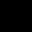

Frame 4352: Predicted Class = 76


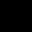

Frame 4353: Predicted Class = 76


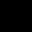

Frame 4354: Predicted Class = 76


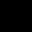

Frame 4355: Predicted Class = 76


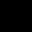

Frame 4356: Predicted Class = 76


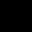

Frame 4357: Predicted Class = 76


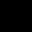

Frame 4358: Predicted Class = 76


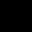

Frame 4359: Predicted Class = 76


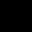

Frame 4360: Predicted Class = 76


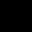

Frame 4361: Predicted Class = 76


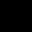

Frame 4362: Predicted Class = 76


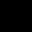

Frame 4363: Predicted Class = 76


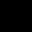

Frame 4364: Predicted Class = 76


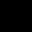

Frame 4365: Predicted Class = 76


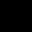

Frame 4366: Predicted Class = 76


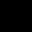

Frame 4367: Predicted Class = 76


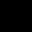

Frame 4368: Predicted Class = 76


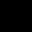

Frame 4369: Predicted Class = 76


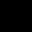

Frame 4370: Predicted Class = 76


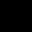

Frame 4371: Predicted Class = 76


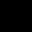

Frame 4372: Predicted Class = 76


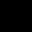

Frame 4373: Predicted Class = 76


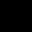

Frame 4374: Predicted Class = 76


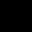

Frame 4375: Predicted Class = 76


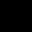

Frame 4376: Predicted Class = 76


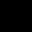

Frame 4377: Predicted Class = 76


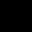

Frame 4378: Predicted Class = 76


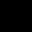

Frame 4379: Predicted Class = 76


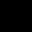

Frame 4380: Predicted Class = 76


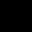

Frame 4381: Predicted Class = 76


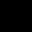

Frame 4382: Predicted Class = 76


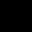

Frame 4383: Predicted Class = 76


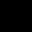

Frame 4384: Predicted Class = 76


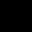

Frame 4385: Predicted Class = 76


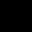

Frame 4386: Predicted Class = 76


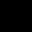

Frame 4387: Predicted Class = 76


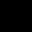

Frame 4388: Predicted Class = 76


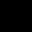

Frame 4389: Predicted Class = 76


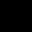

Frame 4390: Predicted Class = 76


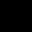

Frame 4391: Predicted Class = 76


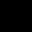

Frame 4392: Predicted Class = 76


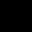

Frame 4393: Predicted Class = 76


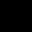

Frame 4394: Predicted Class = 76


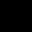

Frame 4395: Predicted Class = 76


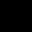

Frame 4396: Predicted Class = 76


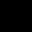

Frame 4397: Predicted Class = 76


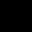

Frame 4398: Predicted Class = 76


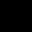

Frame 4399: Predicted Class = 76


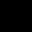

Frame 4400: Predicted Class = 76


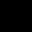

Frame 4401: Predicted Class = 76


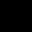

Frame 4402: Predicted Class = 76


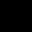

Frame 4403: Predicted Class = 76


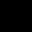

Frame 4404: Predicted Class = 76


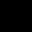

Frame 4405: Predicted Class = 76


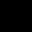

Frame 4406: Predicted Class = 76


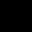

Frame 4407: Predicted Class = 76


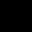

Frame 4408: Predicted Class = 76


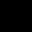

Frame 4409: Predicted Class = 76


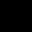

Frame 4410: Predicted Class = 76


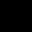

Frame 4411: Predicted Class = 76


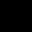

Frame 4412: Predicted Class = 76


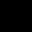

Frame 4413: Predicted Class = 76


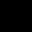

Frame 4414: Predicted Class = 76


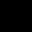

Frame 4415: Predicted Class = 76


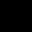

Frame 4416: Predicted Class = 76


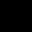

Frame 4417: Predicted Class = 76


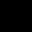

Frame 4418: Predicted Class = 76


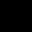

Frame 4419: Predicted Class = 76


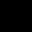

Frame 4420: Predicted Class = 76


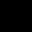

Frame 4421: Predicted Class = 76


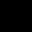

Frame 4422: Predicted Class = 76


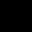

Frame 4423: Predicted Class = 76


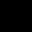

Frame 4424: Predicted Class = 76


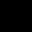

Frame 4425: Predicted Class = 76


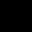

Frame 4426: Predicted Class = 76


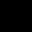

Frame 4427: Predicted Class = 76


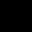

Frame 4428: Predicted Class = 76


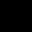

Frame 4429: Predicted Class = 76


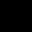

Frame 4430: Predicted Class = 76


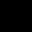

Frame 4431: Predicted Class = 76


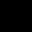

Frame 4432: Predicted Class = 76


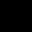

Frame 4433: Predicted Class = 76


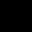

Frame 4434: Predicted Class = 76


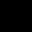

Frame 4435: Predicted Class = 76


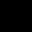

Frame 4436: Predicted Class = 76


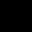

Frame 4437: Predicted Class = 76


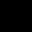

Frame 4438: Predicted Class = 76


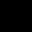

Frame 4439: Predicted Class = 76


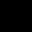

Frame 4440: Predicted Class = 76


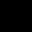

Frame 4441: Predicted Class = 76


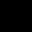

Frame 4442: Predicted Class = 76


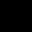

Frame 4443: Predicted Class = 76


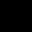

Frame 4444: Predicted Class = 76


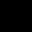

Frame 4445: Predicted Class = 76


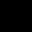

Frame 4446: Predicted Class = 76


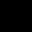

Frame 4447: Predicted Class = 76


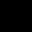

Frame 4448: Predicted Class = 76


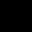

Frame 4449: Predicted Class = 76


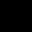

Frame 4450: Predicted Class = 76


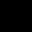

Frame 4451: Predicted Class = 76


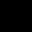

Frame 4452: Predicted Class = 76


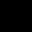

Frame 4453: Predicted Class = 76


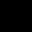

Frame 4454: Predicted Class = 76


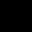

Frame 4455: Predicted Class = 76


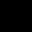

Frame 4456: Predicted Class = 76


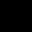

Frame 4457: Predicted Class = 76


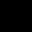

Frame 4458: Predicted Class = 76


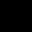

Frame 4459: Predicted Class = 76


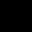

Frame 4460: Predicted Class = 76


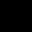

Frame 4461: Predicted Class = 76


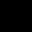

Frame 4462: Predicted Class = 76


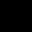

Frame 4463: Predicted Class = 76


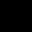

Frame 4464: Predicted Class = 76


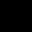

Frame 4465: Predicted Class = 76


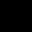

Frame 4466: Predicted Class = 76


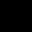

Frame 4467: Predicted Class = 76


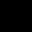

Frame 4468: Predicted Class = 76


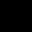

Frame 4469: Predicted Class = 76


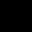

Frame 4470: Predicted Class = 76


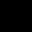

Frame 4471: Predicted Class = 76


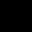

Frame 4472: Predicted Class = 76


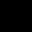

Frame 4473: Predicted Class = 76


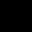

Frame 4474: Predicted Class = 76


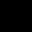

Frame 4475: Predicted Class = 76


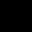

Frame 4476: Predicted Class = 76


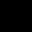

Frame 4477: Predicted Class = 76


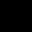

Frame 4478: Predicted Class = 76


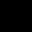

Frame 4479: Predicted Class = 76


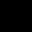

Frame 4480: Predicted Class = 76


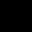

Frame 4481: Predicted Class = 76


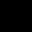

Frame 4482: Predicted Class = 76


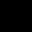

Frame 4483: Predicted Class = 76


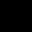

Frame 4484: Predicted Class = 76


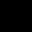

Frame 4485: Predicted Class = 76


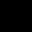

Frame 4486: Predicted Class = 76


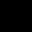

Frame 4487: Predicted Class = 76


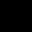

Frame 4488: Predicted Class = 76


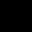

Frame 4489: Predicted Class = 76


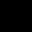

Frame 4490: Predicted Class = 76


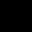

Frame 4491: Predicted Class = 76


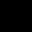

Frame 4492: Predicted Class = 76


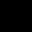

Frame 4493: Predicted Class = 76


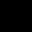

Frame 4494: Predicted Class = 76


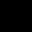

Frame 4495: Predicted Class = 76


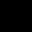

Frame 4496: Predicted Class = 76


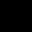

Frame 4497: Predicted Class = 76


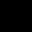

Frame 4498: Predicted Class = 76


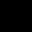

Frame 4499: Predicted Class = 76


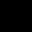

Frame 4500: Predicted Class = 76


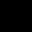

Frame 4501: Predicted Class = 76


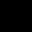

Frame 4502: Predicted Class = 76


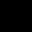

Frame 4503: Predicted Class = 76


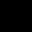

Frame 4504: Predicted Class = 76


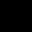

Frame 4505: Predicted Class = 76


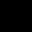

Frame 4506: Predicted Class = 76


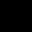

Frame 4507: Predicted Class = 76


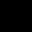

Frame 4508: Predicted Class = 76


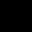

Frame 4509: Predicted Class = 76


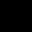

Frame 4510: Predicted Class = 76


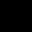

Frame 4511: Predicted Class = 76


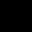

Frame 4512: Predicted Class = 76


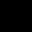

Frame 4513: Predicted Class = 76


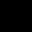

Frame 4514: Predicted Class = 76


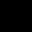

Frame 4515: Predicted Class = 76


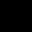

Frame 4516: Predicted Class = 76


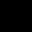

Frame 4517: Predicted Class = 76


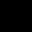

Frame 4518: Predicted Class = 76


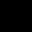

Frame 4519: Predicted Class = 76


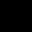

Frame 4520: Predicted Class = 76


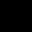

Frame 4521: Predicted Class = 76


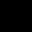

Frame 4522: Predicted Class = 76


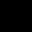

Frame 4523: Predicted Class = 76


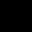

Frame 4524: Predicted Class = 76


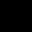

Frame 4525: Predicted Class = 76


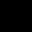

Frame 4526: Predicted Class = 76


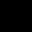

Frame 4527: Predicted Class = 76


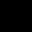

Frame 4528: Predicted Class = 76


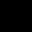

Frame 4529: Predicted Class = 76


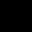

Frame 4530: Predicted Class = 76


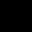

Frame 4531: Predicted Class = 76


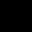

Frame 4532: Predicted Class = 76


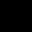

Frame 4533: Predicted Class = 76


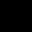

Frame 4534: Predicted Class = 76


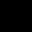

Frame 4535: Predicted Class = 76


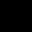

Frame 4536: Predicted Class = 76


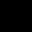

Frame 4537: Predicted Class = 76


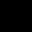

Frame 4538: Predicted Class = 76


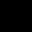

Frame 4539: Predicted Class = 76


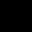

Frame 4540: Predicted Class = 76


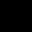

Frame 4541: Predicted Class = 76


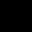

Frame 4542: Predicted Class = 76


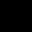

Frame 4543: Predicted Class = 76


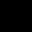

Frame 4544: Predicted Class = 76


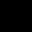

Frame 4545: Predicted Class = 76


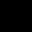

Frame 4546: Predicted Class = 76


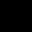

Frame 4547: Predicted Class = 76


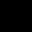

Frame 4548: Predicted Class = 76


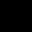

Frame 4549: Predicted Class = 76


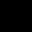

Frame 4550: Predicted Class = 76


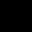

Frame 4551: Predicted Class = 76


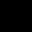

Frame 4552: Predicted Class = 76


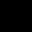

Frame 4553: Predicted Class = 76


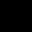

Frame 4554: Predicted Class = 76


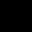

Frame 4555: Predicted Class = 76


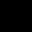

Frame 4556: Predicted Class = 76


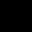

Frame 4557: Predicted Class = 76


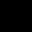

Frame 4558: Predicted Class = 76


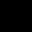

Frame 4559: Predicted Class = 76


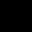

Frame 4560: Predicted Class = 76


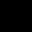

Frame 4561: Predicted Class = 76


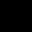

Frame 4562: Predicted Class = 76


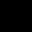

Frame 4563: Predicted Class = 76


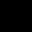

Frame 4564: Predicted Class = 76


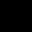

Frame 4565: Predicted Class = 76


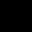

Frame 4566: Predicted Class = 76


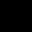

Frame 4567: Predicted Class = 76


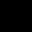

Frame 4568: Predicted Class = 76


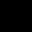

Frame 4569: Predicted Class = 76


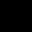

Frame 4570: Predicted Class = 76


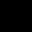

Frame 4571: Predicted Class = 76


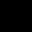

Frame 4572: Predicted Class = 76


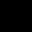

Frame 4573: Predicted Class = 76


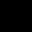

Frame 4574: Predicted Class = 76


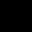

Frame 4575: Predicted Class = 76


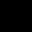

Frame 4576: Predicted Class = 76


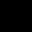

Frame 4577: Predicted Class = 76


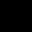

Frame 4578: Predicted Class = 76


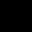

Frame 4579: Predicted Class = 76


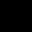

Frame 4580: Predicted Class = 76


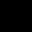

Frame 4581: Predicted Class = 76


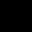

Frame 4582: Predicted Class = 76


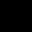

Frame 4583: Predicted Class = 76


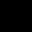

Frame 4584: Predicted Class = 76


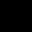

Frame 4585: Predicted Class = 76


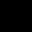

Frame 4586: Predicted Class = 76


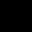

Frame 4587: Predicted Class = 76


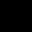

Frame 4588: Predicted Class = 76


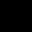

Frame 4589: Predicted Class = 76


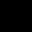

Frame 4590: Predicted Class = 76


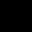

Frame 4591: Predicted Class = 76


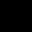

Frame 4592: Predicted Class = 76


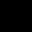

Frame 4593: Predicted Class = 76


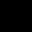

Frame 4594: Predicted Class = 76


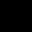

Frame 4595: Predicted Class = 76


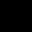

Frame 4596: Predicted Class = 76


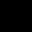

Frame 4597: Predicted Class = 76


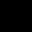

Frame 4598: Predicted Class = 76


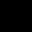

Frame 4599: Predicted Class = 76


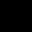

Frame 4600: Predicted Class = 76


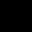

Frame 4601: Predicted Class = 76


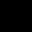

Frame 4602: Predicted Class = 76


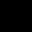

Frame 4603: Predicted Class = 76


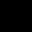

Frame 4604: Predicted Class = 76


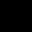

Frame 4605: Predicted Class = 76


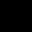

Frame 4606: Predicted Class = 76


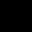

Frame 4607: Predicted Class = 76


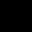

Frame 4608: Predicted Class = 76


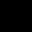

Frame 4609: Predicted Class = 76


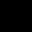

Frame 4610: Predicted Class = 76


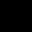

Frame 4611: Predicted Class = 76


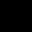

Frame 4612: Predicted Class = 76


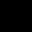

Frame 4613: Predicted Class = 76


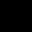

Frame 4614: Predicted Class = 76


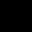

Frame 4615: Predicted Class = 76


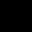

Frame 4616: Predicted Class = 76


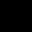

Frame 4617: Predicted Class = 76


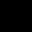

Frame 4618: Predicted Class = 76


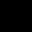

Frame 4619: Predicted Class = 76


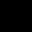

Frame 4620: Predicted Class = 76


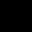

Frame 4621: Predicted Class = 76


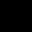

Frame 4622: Predicted Class = 76


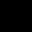

Frame 4623: Predicted Class = 76


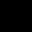

Frame 4624: Predicted Class = 76


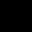

Frame 4625: Predicted Class = 76


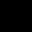

Frame 4626: Predicted Class = 76


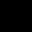

Frame 4627: Predicted Class = 76


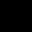

Frame 4628: Predicted Class = 76


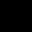

Frame 4629: Predicted Class = 76


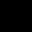

Frame 4630: Predicted Class = 76


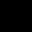

Frame 4631: Predicted Class = 76


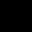

Frame 4632: Predicted Class = 76


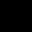

Frame 4633: Predicted Class = 76


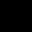

Frame 4634: Predicted Class = 76


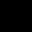

Frame 4635: Predicted Class = 76


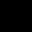

Frame 4636: Predicted Class = 76


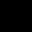

Frame 4637: Predicted Class = 76


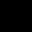

Frame 4638: Predicted Class = 76


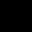

Frame 4639: Predicted Class = 76


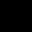

Frame 4640: Predicted Class = 76


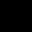

Frame 4641: Predicted Class = 76


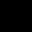

Frame 4642: Predicted Class = 76


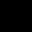

Frame 4643: Predicted Class = 76


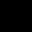

Frame 4644: Predicted Class = 76


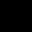

Frame 4645: Predicted Class = 76


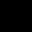

Frame 4646: Predicted Class = 76


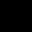

Frame 4647: Predicted Class = 76


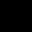

Frame 4648: Predicted Class = 76


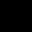

Frame 4649: Predicted Class = 76


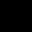

Frame 4650: Predicted Class = 76


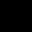

Frame 4651: Predicted Class = 76


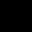

Frame 4652: Predicted Class = 76


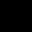

Frame 4653: Predicted Class = 76


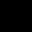

Frame 4654: Predicted Class = 76


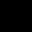

Frame 4655: Predicted Class = 76


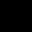

Frame 4656: Predicted Class = 76


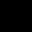

Frame 4657: Predicted Class = 76


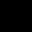

Frame 4658: Predicted Class = 76


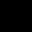

Frame 4659: Predicted Class = 76


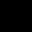

Frame 4660: Predicted Class = 76


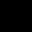

Frame 4661: Predicted Class = 76


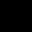

Frame 4662: Predicted Class = 76


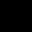

Frame 4663: Predicted Class = 76


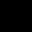

Frame 4664: Predicted Class = 76


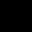

Frame 4665: Predicted Class = 76


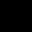

Frame 4666: Predicted Class = 76


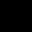

Frame 4667: Predicted Class = 76


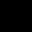

Frame 4668: Predicted Class = 76


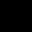

Frame 4669: Predicted Class = 76


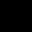

Frame 4670: Predicted Class = 76


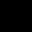

Frame 4671: Predicted Class = 76


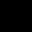

Frame 4672: Predicted Class = 76


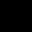

Frame 4673: Predicted Class = 76


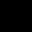

Frame 4674: Predicted Class = 76


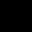

Frame 4675: Predicted Class = 76


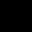

Frame 4676: Predicted Class = 76


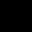

Frame 4677: Predicted Class = 76


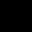

Frame 4678: Predicted Class = 76


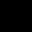

Frame 4679: Predicted Class = 76


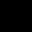

Frame 4680: Predicted Class = 76


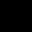

Frame 4681: Predicted Class = 76


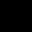

Frame 4682: Predicted Class = 76


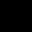

Frame 4683: Predicted Class = 76


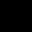

Frame 4684: Predicted Class = 76


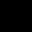

Frame 4685: Predicted Class = 76


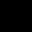

Frame 4686: Predicted Class = 76


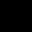

Frame 4687: Predicted Class = 76


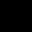

Frame 4688: Predicted Class = 76


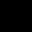

Frame 4689: Predicted Class = 76


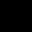

Frame 4690: Predicted Class = 76


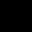

Frame 4691: Predicted Class = 76


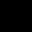

Frame 4692: Predicted Class = 76


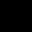

Frame 4693: Predicted Class = 76


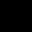

Frame 4694: Predicted Class = 76


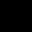

Frame 4695: Predicted Class = 76


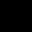

Frame 4696: Predicted Class = 76


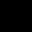

Frame 4697: Predicted Class = 76


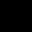

Frame 4698: Predicted Class = 76


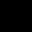

Frame 4699: Predicted Class = 76


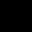

Frame 4700: Predicted Class = 76


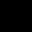

Frame 4701: Predicted Class = 76


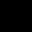

Frame 4702: Predicted Class = 76


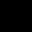

Frame 4703: Predicted Class = 76


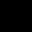

Frame 4704: Predicted Class = 76


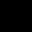

Frame 4705: Predicted Class = 76


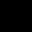

Frame 4706: Predicted Class = 76


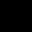

Frame 4707: Predicted Class = 76


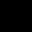

Frame 4708: Predicted Class = 76


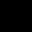

Frame 4709: Predicted Class = 76


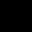

Frame 4710: Predicted Class = 76


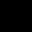

Frame 4711: Predicted Class = 76


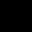

Frame 4712: Predicted Class = 76


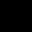

Frame 4713: Predicted Class = 76


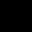

Frame 4714: Predicted Class = 76


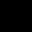

Frame 4715: Predicted Class = 76


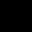

Frame 4716: Predicted Class = 76


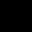

Frame 4717: Predicted Class = 76


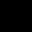

Frame 4718: Predicted Class = 76


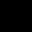

Frame 4719: Predicted Class = 76


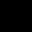

Frame 4720: Predicted Class = 76


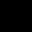

Frame 4721: Predicted Class = 76


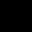

Frame 4722: Predicted Class = 76


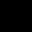

Frame 4723: Predicted Class = 76


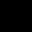

Frame 4724: Predicted Class = 76


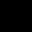

Frame 4725: Predicted Class = 76


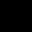

Frame 4726: Predicted Class = 76


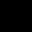

Frame 4727: Predicted Class = 76


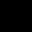

Frame 4728: Predicted Class = 76


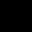

Frame 4729: Predicted Class = 76


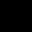

Frame 4730: Predicted Class = 76


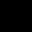

Frame 4731: Predicted Class = 76


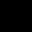

Frame 4732: Predicted Class = 76


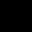

Frame 4733: Predicted Class = 76


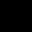

Frame 4734: Predicted Class = 76


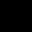

Frame 4735: Predicted Class = 76


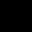

Frame 4736: Predicted Class = 76


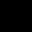

Frame 4737: Predicted Class = 76


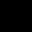

Frame 4738: Predicted Class = 76


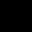

Frame 4739: Predicted Class = 76


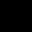

Frame 4740: Predicted Class = 76


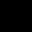

Frame 4741: Predicted Class = 76


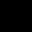

Frame 4742: Predicted Class = 76


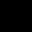

Frame 4743: Predicted Class = 76


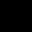

Frame 4744: Predicted Class = 76


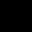

Frame 4745: Predicted Class = 76


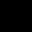

Frame 4746: Predicted Class = 76


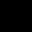

Frame 4747: Predicted Class = 76


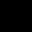

Frame 4748: Predicted Class = 76


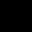

Frame 4749: Predicted Class = 76


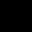

Frame 4750: Predicted Class = 76


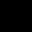

Frame 4751: Predicted Class = 76


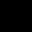

Frame 4752: Predicted Class = 76


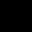

Frame 4753: Predicted Class = 76


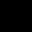

Frame 4754: Predicted Class = 76


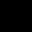

Frame 4755: Predicted Class = 76


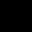

Frame 4756: Predicted Class = 76


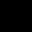

Frame 4757: Predicted Class = 76


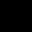

Frame 4758: Predicted Class = 76


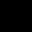

Frame 4759: Predicted Class = 76


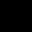

Frame 4760: Predicted Class = 76


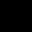

Frame 4761: Predicted Class = 76


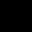

Frame 4762: Predicted Class = 76


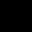

Frame 4763: Predicted Class = 76


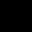

Frame 4764: Predicted Class = 76


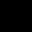

Frame 4765: Predicted Class = 76


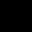

Frame 4766: Predicted Class = 76


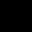

Frame 4767: Predicted Class = 76


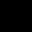

Frame 4768: Predicted Class = 76


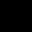

Frame 4769: Predicted Class = 76


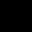

Frame 4770: Predicted Class = 76


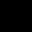

Frame 4771: Predicted Class = 76


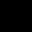

Frame 4772: Predicted Class = 76


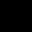

Frame 4773: Predicted Class = 76


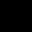

Frame 4774: Predicted Class = 76


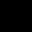

Frame 4775: Predicted Class = 76


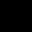

Frame 4776: Predicted Class = 76


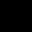

Frame 4777: Predicted Class = 76


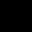

Frame 4778: Predicted Class = 76


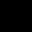

Frame 4779: Predicted Class = 76


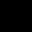

Frame 4780: Predicted Class = 76


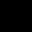

Frame 4781: Predicted Class = 76


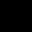

Frame 4782: Predicted Class = 76


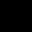

Frame 4783: Predicted Class = 76


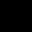

Frame 4784: Predicted Class = 76


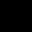

Frame 4785: Predicted Class = 76


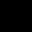

Frame 4786: Predicted Class = 76


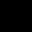

Frame 4787: Predicted Class = 76


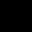

Frame 4788: Predicted Class = 76


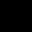

Frame 4789: Predicted Class = 76


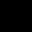

Frame 4790: Predicted Class = 76


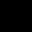

Frame 4791: Predicted Class = 76


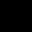

Frame 4792: Predicted Class = 76


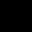

Frame 4793: Predicted Class = 76


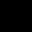

Frame 4794: Predicted Class = 76


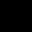

Frame 4795: Predicted Class = 76


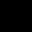

Frame 4796: Predicted Class = 76


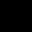

Frame 4797: Predicted Class = 76


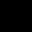

Frame 4798: Predicted Class = 76


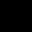

Frame 4799: Predicted Class = 76


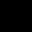

Frame 4800: Predicted Class = 76


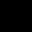

Frame 4801: Predicted Class = 76


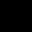

Frame 4802: Predicted Class = 76


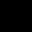

Frame 4803: Predicted Class = 76


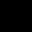

Frame 4804: Predicted Class = 76


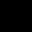

Frame 4805: Predicted Class = 76


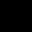

Frame 4806: Predicted Class = 76


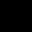

Frame 4807: Predicted Class = 76


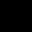

Frame 4808: Predicted Class = 76


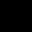

Frame 4809: Predicted Class = 76


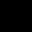

Frame 4810: Predicted Class = 76


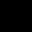

Frame 4811: Predicted Class = 76


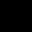

Frame 4812: Predicted Class = 76


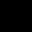

Frame 4813: Predicted Class = 76


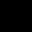

Frame 4814: Predicted Class = 76


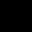

Frame 4815: Predicted Class = 76


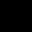

Frame 4816: Predicted Class = 76


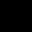

Frame 4817: Predicted Class = 76


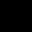

Frame 4818: Predicted Class = 76


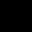

Frame 4819: Predicted Class = 76


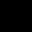

Frame 4820: Predicted Class = 76


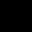

Frame 4821: Predicted Class = 76


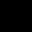

Frame 4822: Predicted Class = 76


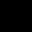

Frame 4823: Predicted Class = 76


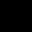

Frame 4824: Predicted Class = 76


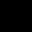

Frame 4825: Predicted Class = 76


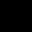

Frame 4826: Predicted Class = 76


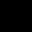

Frame 4827: Predicted Class = 76


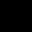

Frame 4828: Predicted Class = 76


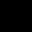

Frame 4829: Predicted Class = 76


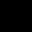

Frame 4830: Predicted Class = 76


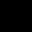

Frame 4831: Predicted Class = 76


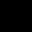

Frame 4832: Predicted Class = 76


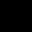

Frame 4833: Predicted Class = 76


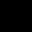

Frame 4834: Predicted Class = 76


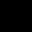

Frame 4835: Predicted Class = 76


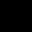

Frame 4836: Predicted Class = 76


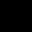

Frame 4837: Predicted Class = 76


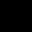

Frame 4838: Predicted Class = 76


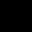

Frame 4839: Predicted Class = 76


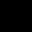

Frame 4840: Predicted Class = 76


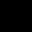

Frame 4841: Predicted Class = 76


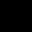

Frame 4842: Predicted Class = 76


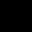

Frame 4843: Predicted Class = 76


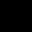

Frame 4844: Predicted Class = 76


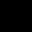

Frame 4845: Predicted Class = 76


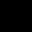

Frame 4846: Predicted Class = 76


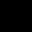

Frame 4847: Predicted Class = 76


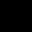

Frame 4848: Predicted Class = 76


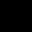

Frame 4849: Predicted Class = 76


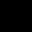

Frame 4850: Predicted Class = 76


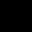

Frame 4851: Predicted Class = 76


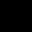

Frame 4852: Predicted Class = 76


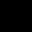

Frame 4853: Predicted Class = 76


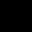

Frame 4854: Predicted Class = 76


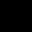

Frame 4855: Predicted Class = 76


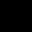

Frame 4856: Predicted Class = 76


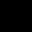

Frame 4857: Predicted Class = 76


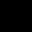

Frame 4858: Predicted Class = 76


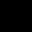

Frame 4859: Predicted Class = 76


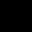

Frame 4860: Predicted Class = 76


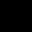

Frame 4861: Predicted Class = 76


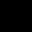

Frame 4862: Predicted Class = 76


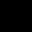

Frame 4863: Predicted Class = 76


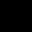

Frame 4864: Predicted Class = 76


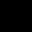

Frame 4865: Predicted Class = 76


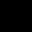

Frame 4866: Predicted Class = 76


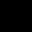

Frame 4867: Predicted Class = 76


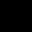

Frame 4868: Predicted Class = 76


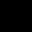

Frame 4869: Predicted Class = 76


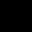

Frame 4870: Predicted Class = 76


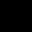

Frame 4871: Predicted Class = 76


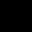

Frame 4872: Predicted Class = 76


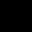

Frame 4873: Predicted Class = 76


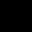

Frame 4874: Predicted Class = 76


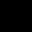

Frame 4875: Predicted Class = 76


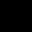

Frame 4876: Predicted Class = 76


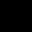

Frame 4877: Predicted Class = 76


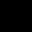

Frame 4878: Predicted Class = 76


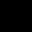

Frame 4879: Predicted Class = 76


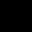

Frame 4880: Predicted Class = 76


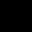

Frame 4881: Predicted Class = 76


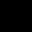

Frame 4882: Predicted Class = 76


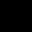

Frame 4883: Predicted Class = 76


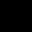

Frame 4884: Predicted Class = 76


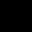

Frame 4885: Predicted Class = 76


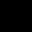

Frame 4886: Predicted Class = 76


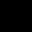

Frame 4887: Predicted Class = 76


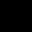

Frame 4888: Predicted Class = 76


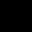

Frame 4889: Predicted Class = 76


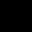

Frame 4890: Predicted Class = 76


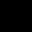

Frame 4891: Predicted Class = 76


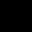

Frame 4892: Predicted Class = 76


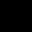

Frame 4893: Predicted Class = 76


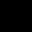

Frame 4894: Predicted Class = 76


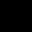

Frame 4895: Predicted Class = 76


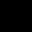

Frame 4896: Predicted Class = 76


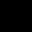

Frame 4897: Predicted Class = 76


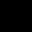

Frame 4898: Predicted Class = 76


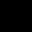

Frame 4899: Predicted Class = 76


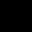

Frame 4900: Predicted Class = 76


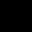

Frame 4901: Predicted Class = 76


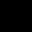

Frame 4902: Predicted Class = 76


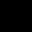

Frame 4903: Predicted Class = 76


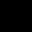

Frame 4904: Predicted Class = 76


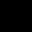

Frame 4905: Predicted Class = 76


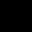

Frame 4906: Predicted Class = 76


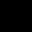

Frame 4907: Predicted Class = 76


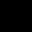

Frame 4908: Predicted Class = 76


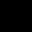

Frame 4909: Predicted Class = 76


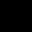

Frame 4910: Predicted Class = 76


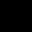

Frame 4911: Predicted Class = 76


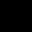

Frame 4912: Predicted Class = 76


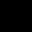

Frame 4913: Predicted Class = 76


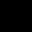

Frame 4914: Predicted Class = 76


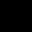

Frame 4915: Predicted Class = 76


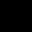

Frame 4916: Predicted Class = 76


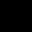

Frame 4917: Predicted Class = 76


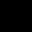

Frame 4918: Predicted Class = 76


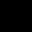

Frame 4919: Predicted Class = 76


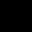

Frame 4920: Predicted Class = 76


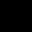

Frame 4921: Predicted Class = 76


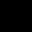

Frame 4922: Predicted Class = 76


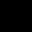

Frame 4923: Predicted Class = 76


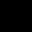

Frame 4924: Predicted Class = 76


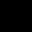

Frame 4925: Predicted Class = 76


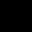

Frame 4926: Predicted Class = 76


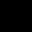

Frame 4927: Predicted Class = 76


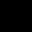

Frame 4928: Predicted Class = 76


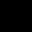

Frame 4929: Predicted Class = 76


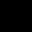

Frame 4930: Predicted Class = 76


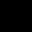

Frame 4931: Predicted Class = 76


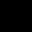

Frame 4932: Predicted Class = 76


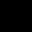

Frame 4933: Predicted Class = 76


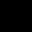

Frame 4934: Predicted Class = 76


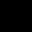

Frame 4935: Predicted Class = 76


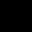

Frame 4936: Predicted Class = 76


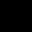

Frame 4937: Predicted Class = 76


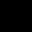

Frame 4938: Predicted Class = 76


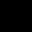

Frame 4939: Predicted Class = 76


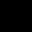

Frame 4940: Predicted Class = 76


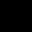

Frame 4941: Predicted Class = 76


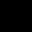

Frame 4942: Predicted Class = 76


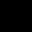

Frame 4943: Predicted Class = 76


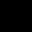

Frame 4944: Predicted Class = 76


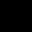

Frame 4945: Predicted Class = 76


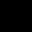

Frame 4946: Predicted Class = 76


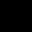

Frame 4947: Predicted Class = 76


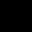

Frame 4948: Predicted Class = 76


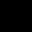

Frame 4949: Predicted Class = 76


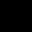

Frame 4950: Predicted Class = 76


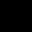

Frame 4951: Predicted Class = 76


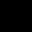

Frame 4952: Predicted Class = 76


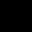

Frame 4953: Predicted Class = 76


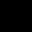

Frame 4954: Predicted Class = 76


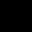

Frame 4955: Predicted Class = 76


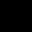

Frame 4956: Predicted Class = 76


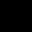

Frame 4957: Predicted Class = 76


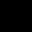

Frame 4958: Predicted Class = 76


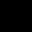

Frame 4959: Predicted Class = 76


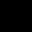

Frame 4960: Predicted Class = 76


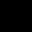

Frame 4961: Predicted Class = 76


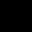

Frame 4962: Predicted Class = 76


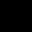

Frame 4963: Predicted Class = 76


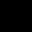

Frame 4964: Predicted Class = 76


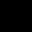

Frame 4965: Predicted Class = 76


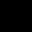

Frame 4966: Predicted Class = 76


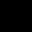

Frame 4967: Predicted Class = 76


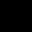

Frame 4968: Predicted Class = 76


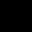

Frame 4969: Predicted Class = 76


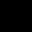

Frame 4970: Predicted Class = 76


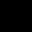

Frame 4971: Predicted Class = 76


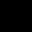

Frame 4972: Predicted Class = 76


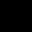

Frame 4973: Predicted Class = 76


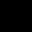

Frame 4974: Predicted Class = 76


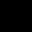

Frame 4975: Predicted Class = 76


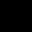

Frame 4976: Predicted Class = 76


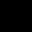

Frame 4977: Predicted Class = 76


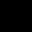

Frame 4978: Predicted Class = 76


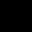

Frame 4979: Predicted Class = 76


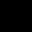

Frame 4980: Predicted Class = 76


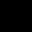

Frame 4981: Predicted Class = 76


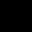

Frame 4982: Predicted Class = 76


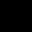

Frame 4983: Predicted Class = 76


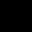

Frame 4984: Predicted Class = 76


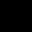

Frame 4985: Predicted Class = 76


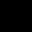

Frame 4986: Predicted Class = 76


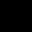

Frame 4987: Predicted Class = 76


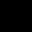

Frame 4988: Predicted Class = 76


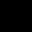

Frame 4989: Predicted Class = 76


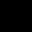

Frame 4990: Predicted Class = 76


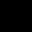

Frame 4991: Predicted Class = 76


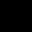

Frame 4992: Predicted Class = 76


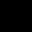

Frame 4993: Predicted Class = 76


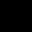

Frame 4994: Predicted Class = 76


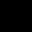

Frame 4995: Predicted Class = 76


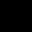

Frame 4996: Predicted Class = 76


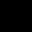

Frame 4997: Predicted Class = 76


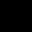

Frame 4998: Predicted Class = 76


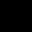

Frame 4999: Predicted Class = 76


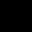

Frame 5000: Predicted Class = 76


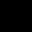

Frame 5001: Predicted Class = 76


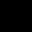

Frame 5002: Predicted Class = 76


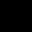

Frame 5003: Predicted Class = 76


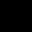

Frame 5004: Predicted Class = 76


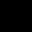

Frame 5005: Predicted Class = 76


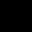

Frame 5006: Predicted Class = 76


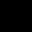

Frame 5007: Predicted Class = 76


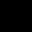

Frame 5008: Predicted Class = 76


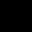

Frame 5009: Predicted Class = 76


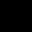

Frame 5010: Predicted Class = 76


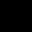

Frame 5011: Predicted Class = 76


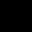

Frame 5012: Predicted Class = 76


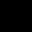

Frame 5013: Predicted Class = 76


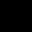

Frame 5014: Predicted Class = 76


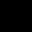

Frame 5015: Predicted Class = 76


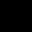

Frame 5016: Predicted Class = 76


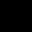

Frame 5017: Predicted Class = 76


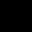

Frame 5018: Predicted Class = 76


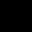

Frame 5019: Predicted Class = 76


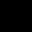

Frame 5020: Predicted Class = 76


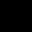

Frame 5021: Predicted Class = 76


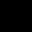

Frame 5022: Predicted Class = 76


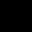

Frame 5023: Predicted Class = 76


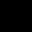

Frame 5024: Predicted Class = 76


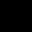

Frame 5025: Predicted Class = 76


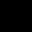

Frame 5026: Predicted Class = 76


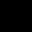

Frame 5027: Predicted Class = 76


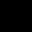

Frame 5028: Predicted Class = 76


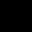

Frame 5029: Predicted Class = 76


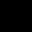

Frame 5030: Predicted Class = 76


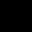

Frame 5031: Predicted Class = 76


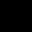

Frame 5032: Predicted Class = 76


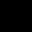

Frame 5033: Predicted Class = 76


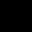

Frame 5034: Predicted Class = 76


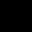

Frame 5035: Predicted Class = 76


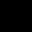

Frame 5036: Predicted Class = 76


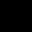

Frame 5037: Predicted Class = 76


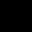

Frame 5038: Predicted Class = 76


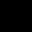

Frame 5039: Predicted Class = 76


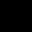

Frame 5040: Predicted Class = 76


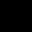

Frame 5041: Predicted Class = 76


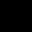

Frame 5042: Predicted Class = 76


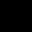

Frame 5043: Predicted Class = 76


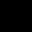

Frame 5044: Predicted Class = 76


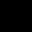

Frame 5045: Predicted Class = 76


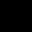

Frame 5046: Predicted Class = 76


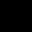

Frame 5047: Predicted Class = 76


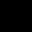

Frame 5048: Predicted Class = 76


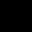

Frame 5049: Predicted Class = 76


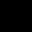

Frame 5050: Predicted Class = 76


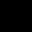

Frame 5051: Predicted Class = 76


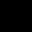

Frame 5052: Predicted Class = 76


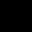

Frame 5053: Predicted Class = 76


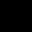

Frame 5054: Predicted Class = 76


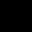

Frame 5055: Predicted Class = 76


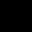

Frame 5056: Predicted Class = 76


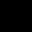

Frame 5057: Predicted Class = 76


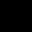

Frame 5058: Predicted Class = 76


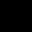

Frame 5059: Predicted Class = 76


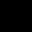

Frame 5060: Predicted Class = 76


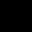

Frame 5061: Predicted Class = 76


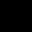

Frame 5062: Predicted Class = 76


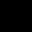

Frame 5063: Predicted Class = 76


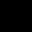

Frame 5064: Predicted Class = 76


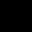

Frame 5065: Predicted Class = 76


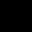

Frame 5066: Predicted Class = 76


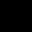

Frame 5067: Predicted Class = 76


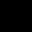

Frame 5068: Predicted Class = 76


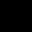

Frame 5069: Predicted Class = 76


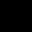

Frame 5070: Predicted Class = 76


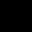

Frame 5071: Predicted Class = 76


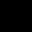

Frame 5072: Predicted Class = 76


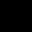

Frame 5073: Predicted Class = 76


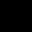

Frame 5074: Predicted Class = 76


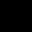

Frame 5075: Predicted Class = 76


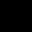

Frame 5076: Predicted Class = 76


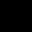

Frame 5077: Predicted Class = 76


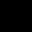

Frame 5078: Predicted Class = 76


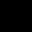

Frame 5079: Predicted Class = 76


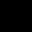

Frame 5080: Predicted Class = 76


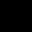

Frame 5081: Predicted Class = 76


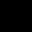

Frame 5082: Predicted Class = 76


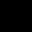

Frame 5083: Predicted Class = 76


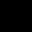

Frame 5084: Predicted Class = 76


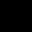

Frame 5085: Predicted Class = 76


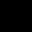

Frame 5086: Predicted Class = 76


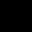

Frame 5087: Predicted Class = 76


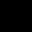

Frame 5088: Predicted Class = 76


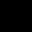

Frame 5089: Predicted Class = 76


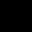

Frame 5090: Predicted Class = 76


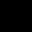

Frame 5091: Predicted Class = 76


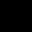

Frame 5092: Predicted Class = 76


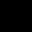

Frame 5093: Predicted Class = 76


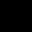

Frame 5094: Predicted Class = 76


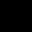

Frame 5095: Predicted Class = 76


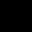

Frame 5096: Predicted Class = 76


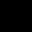

Frame 5097: Predicted Class = 76


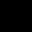

Frame 5098: Predicted Class = 76


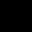

Frame 5099: Predicted Class = 76


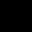

Frame 5100: Predicted Class = 76


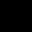

Frame 5101: Predicted Class = 76


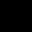

Frame 5102: Predicted Class = 76


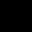

Frame 5103: Predicted Class = 76


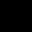

Frame 5104: Predicted Class = 76


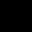

Frame 5105: Predicted Class = 76


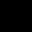

Frame 5106: Predicted Class = 76


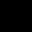

Frame 5107: Predicted Class = 76


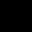

Frame 5108: Predicted Class = 76


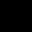

Frame 5109: Predicted Class = 76


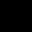

Frame 5110: Predicted Class = 76


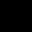

Frame 5111: Predicted Class = 76


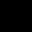

Frame 5112: Predicted Class = 76


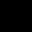

Frame 5113: Predicted Class = 76


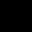

Frame 5114: Predicted Class = 76


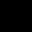

Frame 5115: Predicted Class = 76


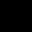

Frame 5116: Predicted Class = 76


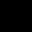

Frame 5117: Predicted Class = 76


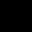

Frame 5118: Predicted Class = 76


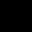

Frame 5119: Predicted Class = 76


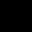

Frame 5120: Predicted Class = 76


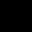

Frame 5121: Predicted Class = 76


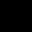

Frame 5122: Predicted Class = 76


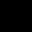

Frame 5123: Predicted Class = 76


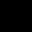

Frame 5124: Predicted Class = 76


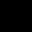

Frame 5125: Predicted Class = 76


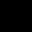

Frame 5126: Predicted Class = 76


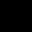

Frame 5127: Predicted Class = 76


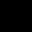

Frame 5128: Predicted Class = 76


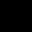

Frame 5129: Predicted Class = 76


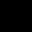

Frame 5130: Predicted Class = 76


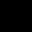

Frame 5131: Predicted Class = 76


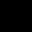

Frame 5132: Predicted Class = 76


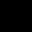

Frame 5133: Predicted Class = 76


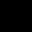

Frame 5134: Predicted Class = 76


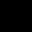

Frame 5135: Predicted Class = 76


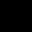

Frame 5136: Predicted Class = 76


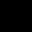

Frame 5137: Predicted Class = 76


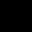

Frame 5138: Predicted Class = 76


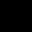

Frame 5139: Predicted Class = 76


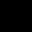

Frame 5140: Predicted Class = 76


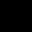

Frame 5141: Predicted Class = 76


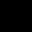

Frame 5142: Predicted Class = 76


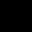

Frame 5143: Predicted Class = 76


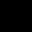

Frame 5144: Predicted Class = 76


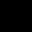

Frame 5145: Predicted Class = 76


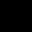

Frame 5146: Predicted Class = 76


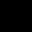

Frame 5147: Predicted Class = 76


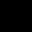

Frame 5148: Predicted Class = 76


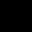

Frame 5149: Predicted Class = 76


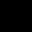

Frame 5150: Predicted Class = 76


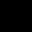

Frame 5151: Predicted Class = 76


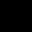

Frame 5152: Predicted Class = 76


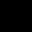

Frame 5153: Predicted Class = 76


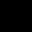

Frame 5154: Predicted Class = 76


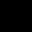

Frame 5155: Predicted Class = 76


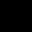

Frame 5156: Predicted Class = 76


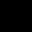

Frame 5157: Predicted Class = 76


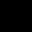

Frame 5158: Predicted Class = 76


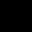

Frame 5159: Predicted Class = 76


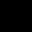

Frame 5160: Predicted Class = 76


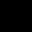

Frame 5161: Predicted Class = 76


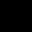

Frame 5162: Predicted Class = 76


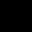

Frame 5163: Predicted Class = 76


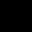

Frame 5164: Predicted Class = 76


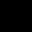

Frame 5165: Predicted Class = 76


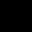

Frame 5166: Predicted Class = 76


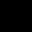

Frame 5167: Predicted Class = 76


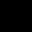

Frame 5168: Predicted Class = 76


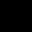

Frame 5169: Predicted Class = 76


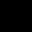

Frame 5170: Predicted Class = 76


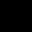

Frame 5171: Predicted Class = 76


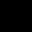

Frame 5172: Predicted Class = 76


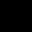

Frame 5173: Predicted Class = 76


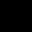

Frame 5174: Predicted Class = 76


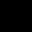

Frame 5175: Predicted Class = 76


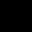

Frame 5176: Predicted Class = 76


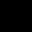

Frame 5177: Predicted Class = 76


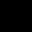

Frame 5178: Predicted Class = 76


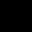

Frame 5179: Predicted Class = 76


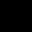

Frame 5180: Predicted Class = 76


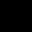

Frame 5181: Predicted Class = 76


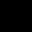

Frame 5182: Predicted Class = 76


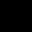

Frame 5183: Predicted Class = 76


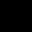

Frame 5184: Predicted Class = 76


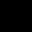

Frame 5185: Predicted Class = 76


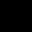

Frame 5186: Predicted Class = 76


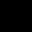

Frame 5187: Predicted Class = 76


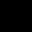

Frame 5188: Predicted Class = 76


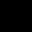

Frame 5189: Predicted Class = 76


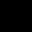

Frame 5190: Predicted Class = 76


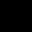

Frame 5191: Predicted Class = 76


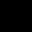

Frame 5192: Predicted Class = 76


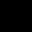

Frame 5193: Predicted Class = 76


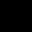

Frame 5194: Predicted Class = 76


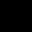

Frame 5195: Predicted Class = 76


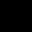

Frame 5196: Predicted Class = 76


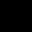

Frame 5197: Predicted Class = 76


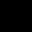

Frame 5198: Predicted Class = 76


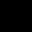

Frame 5199: Predicted Class = 76


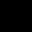

Frame 5200: Predicted Class = 76


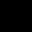

Frame 5201: Predicted Class = 76


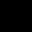

Frame 5202: Predicted Class = 76


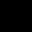

Frame 5203: Predicted Class = 76


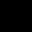

Frame 5204: Predicted Class = 76


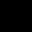

Frame 5205: Predicted Class = 76


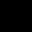

Frame 5206: Predicted Class = 76


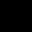

Frame 5207: Predicted Class = 76


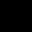

Frame 5208: Predicted Class = 76


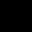

Frame 5209: Predicted Class = 76


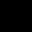

Frame 5210: Predicted Class = 76


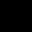

Frame 5211: Predicted Class = 76


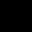

Frame 5212: Predicted Class = 76


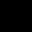

Frame 5213: Predicted Class = 76


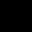

Frame 5214: Predicted Class = 76


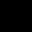

Frame 5215: Predicted Class = 76


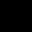

Frame 5216: Predicted Class = 76


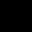

Frame 5217: Predicted Class = 76


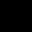

Frame 5218: Predicted Class = 76


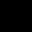

Frame 5219: Predicted Class = 76


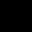

Frame 5220: Predicted Class = 76


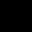

Frame 5221: Predicted Class = 76


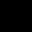

Frame 5222: Predicted Class = 76


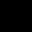

Frame 5223: Predicted Class = 76


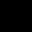

Frame 5224: Predicted Class = 76


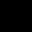

Frame 5225: Predicted Class = 76


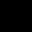

Frame 5226: Predicted Class = 76


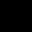

Frame 5227: Predicted Class = 76


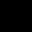

Frame 5228: Predicted Class = 76


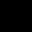

Frame 5229: Predicted Class = 76


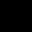

Frame 5230: Predicted Class = 76


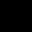

Frame 5231: Predicted Class = 76


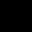

Frame 5232: Predicted Class = 76


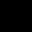

Frame 5233: Predicted Class = 76


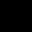

Frame 5234: Predicted Class = 76


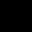

Frame 5235: Predicted Class = 76


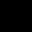

Frame 5236: Predicted Class = 76


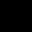

Frame 5237: Predicted Class = 76


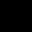

Frame 5238: Predicted Class = 76


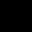

Frame 5239: Predicted Class = 76


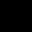

Frame 5240: Predicted Class = 76


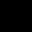

Frame 5241: Predicted Class = 76


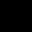

Frame 5242: Predicted Class = 76


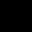

Frame 5243: Predicted Class = 76


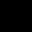

Frame 5244: Predicted Class = 76


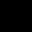

Frame 5245: Predicted Class = 76


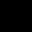

Frame 5246: Predicted Class = 76


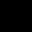

Frame 5247: Predicted Class = 76


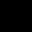

Frame 5248: Predicted Class = 76


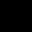

Frame 5249: Predicted Class = 76


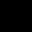

Frame 5250: Predicted Class = 76


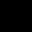

Frame 5251: Predicted Class = 76


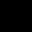

Frame 5252: Predicted Class = 76


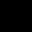

Frame 5253: Predicted Class = 76


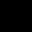

Frame 5254: Predicted Class = 76


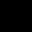

Frame 5255: Predicted Class = 76


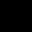

Frame 5256: Predicted Class = 76


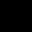

Frame 5257: Predicted Class = 76


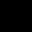

Frame 5258: Predicted Class = 76


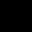

Frame 5259: Predicted Class = 76


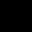

Frame 5260: Predicted Class = 76


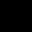

Frame 5261: Predicted Class = 76


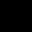

Frame 5262: Predicted Class = 76


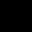

Frame 5263: Predicted Class = 76


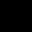

Frame 5264: Predicted Class = 76


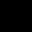

Frame 5265: Predicted Class = 76


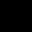

Frame 5266: Predicted Class = 76


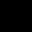

Frame 5267: Predicted Class = 76


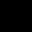

Frame 5268: Predicted Class = 76


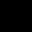

Frame 5269: Predicted Class = 76


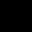

Frame 5270: Predicted Class = 76


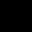

Frame 5271: Predicted Class = 76


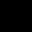

Frame 5272: Predicted Class = 76


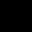

Frame 5273: Predicted Class = 76


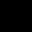

Frame 5274: Predicted Class = 76


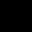

Frame 5275: Predicted Class = 76


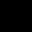

Frame 5276: Predicted Class = 76


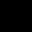

Frame 5277: Predicted Class = 76


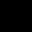

Frame 5278: Predicted Class = 76


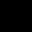

Frame 5279: Predicted Class = 76


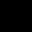

Frame 5280: Predicted Class = 76


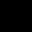

Frame 5281: Predicted Class = 76


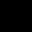

Frame 5282: Predicted Class = 76


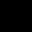

Frame 5283: Predicted Class = 76


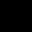

Frame 5284: Predicted Class = 76


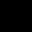

Frame 5285: Predicted Class = 76


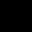

Frame 5286: Predicted Class = 76


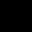

Frame 5287: Predicted Class = 76


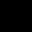

Frame 5288: Predicted Class = 76


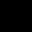

Frame 5289: Predicted Class = 76


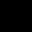

Frame 5290: Predicted Class = 76


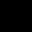

Frame 5291: Predicted Class = 76


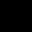

Frame 5292: Predicted Class = 76


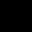

Frame 5293: Predicted Class = 76


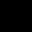

Frame 5294: Predicted Class = 76


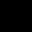

Frame 5295: Predicted Class = 76


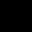

Frame 5296: Predicted Class = 76


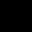

Frame 5297: Predicted Class = 76


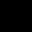

Frame 5298: Predicted Class = 76


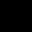

Frame 5299: Predicted Class = 76


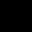

Frame 5300: Predicted Class = 76


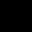

Frame 5301: Predicted Class = 76


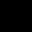

Frame 5302: Predicted Class = 76


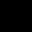

Frame 5303: Predicted Class = 76


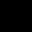

Frame 5304: Predicted Class = 76


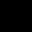

Frame 5305: Predicted Class = 76


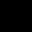

Frame 5306: Predicted Class = 76


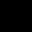

Frame 5307: Predicted Class = 76


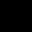

Frame 5308: Predicted Class = 76


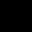

Frame 5309: Predicted Class = 76


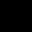

Frame 5310: Predicted Class = 76


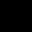

Frame 5311: Predicted Class = 76


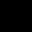

Frame 5312: Predicted Class = 76


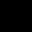

Frame 5313: Predicted Class = 76


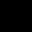

Frame 5314: Predicted Class = 76


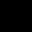

Frame 5315: Predicted Class = 76


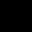

Frame 5316: Predicted Class = 76


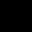

Frame 5317: Predicted Class = 76


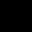

Frame 5318: Predicted Class = 76


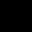

Frame 5319: Predicted Class = 76


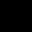

Frame 5320: Predicted Class = 76


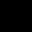

Frame 5321: Predicted Class = 76


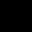

Frame 5322: Predicted Class = 76


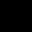

Frame 5323: Predicted Class = 76


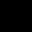

Frame 5324: Predicted Class = 76


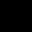

Frame 5325: Predicted Class = 76


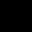

Frame 5326: Predicted Class = 76


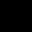

Frame 5327: Predicted Class = 76


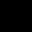

Frame 5328: Predicted Class = 76


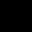

Frame 5329: Predicted Class = 76


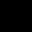

Frame 5330: Predicted Class = 76


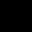

Frame 5331: Predicted Class = 76


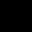

Frame 5332: Predicted Class = 76


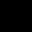

Frame 5333: Predicted Class = 76


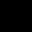

Frame 5334: Predicted Class = 76


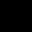

Frame 5335: Predicted Class = 76


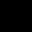

Frame 5336: Predicted Class = 76


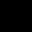

Frame 5337: Predicted Class = 76


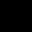

Frame 5338: Predicted Class = 76


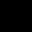

Frame 5339: Predicted Class = 76


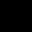

Frame 5340: Predicted Class = 76


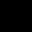

Frame 5341: Predicted Class = 76


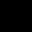

Frame 5342: Predicted Class = 76


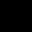

Frame 5343: Predicted Class = 76


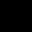

Frame 5344: Predicted Class = 76


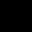

Frame 5345: Predicted Class = 76


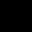

Frame 5346: Predicted Class = 76


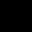

Frame 5347: Predicted Class = 76


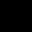

Frame 5348: Predicted Class = 76


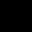

Frame 5349: Predicted Class = 76


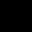

Frame 5350: Predicted Class = 76


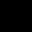

Frame 5351: Predicted Class = 76


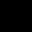

Frame 5352: Predicted Class = 76


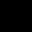

Frame 5353: Predicted Class = 76


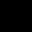

Frame 5354: Predicted Class = 76


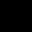

Frame 5355: Predicted Class = 76


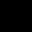

Frame 5356: Predicted Class = 76


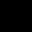

Frame 5357: Predicted Class = 76


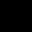

Frame 5358: Predicted Class = 76


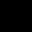

Frame 5359: Predicted Class = 76


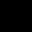

Frame 5360: Predicted Class = 76


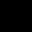

Frame 5361: Predicted Class = 76


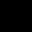

Frame 5362: Predicted Class = 76


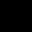

Frame 5363: Predicted Class = 76


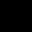

Frame 5364: Predicted Class = 76


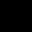

Frame 5365: Predicted Class = 76


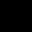

Frame 5366: Predicted Class = 76


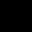

Frame 5367: Predicted Class = 76


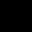

Frame 5368: Predicted Class = 76


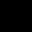

Frame 5369: Predicted Class = 76


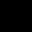

Frame 5370: Predicted Class = 76


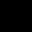

Frame 5371: Predicted Class = 76


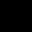

Frame 5372: Predicted Class = 76


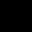

Frame 5373: Predicted Class = 76


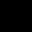

Frame 5374: Predicted Class = 76


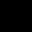

Frame 5375: Predicted Class = 76


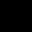

Frame 5376: Predicted Class = 76


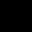

Frame 5377: Predicted Class = 76


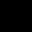

Frame 5378: Predicted Class = 76


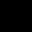

Frame 5379: Predicted Class = 76


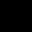

Frame 5380: Predicted Class = 76


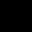

Frame 5381: Predicted Class = 76


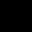

Frame 5382: Predicted Class = 76


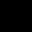

Frame 5383: Predicted Class = 76


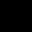

Frame 5384: Predicted Class = 76


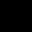

Frame 5385: Predicted Class = 76


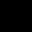

Frame 5386: Predicted Class = 76


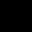

Frame 5387: Predicted Class = 76


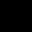

Frame 5388: Predicted Class = 76


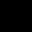

Frame 5389: Predicted Class = 76


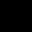

Frame 5390: Predicted Class = 76


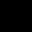

Frame 5391: Predicted Class = 76


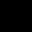

Frame 5392: Predicted Class = 76


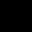

Frame 5393: Predicted Class = 76


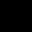

Frame 5394: Predicted Class = 76


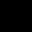

Frame 5395: Predicted Class = 76


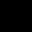

Frame 5396: Predicted Class = 76


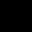

Frame 5397: Predicted Class = 76


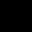

Frame 5398: Predicted Class = 76


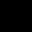

Frame 5399: Predicted Class = 76


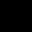

Frame 5400: Predicted Class = 76


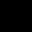

Frame 5401: Predicted Class = 76


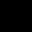

Frame 5402: Predicted Class = 76


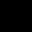

Frame 5403: Predicted Class = 76


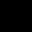

Frame 5404: Predicted Class = 76


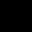

Frame 5405: Predicted Class = 76


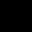

Frame 5406: Predicted Class = 76


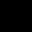

Frame 5407: Predicted Class = 76


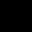

Frame 5408: Predicted Class = 76


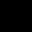

Frame 5409: Predicted Class = 76


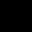

Frame 5410: Predicted Class = 76


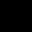

Frame 5411: Predicted Class = 76


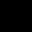

Frame 5412: Predicted Class = 76


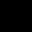

Frame 5413: Predicted Class = 76


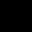

Frame 5414: Predicted Class = 76


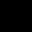

Frame 5415: Predicted Class = 76


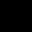

Frame 5416: Predicted Class = 76


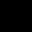

Frame 5417: Predicted Class = 76


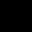

Frame 5418: Predicted Class = 76


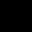

Frame 5419: Predicted Class = 76


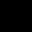

Frame 5420: Predicted Class = 76


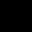

Frame 5421: Predicted Class = 76


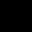

Frame 5422: Predicted Class = 76


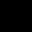

Frame 5423: Predicted Class = 76


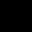

Frame 5424: Predicted Class = 76


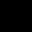

Frame 5425: Predicted Class = 76


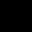

Frame 5426: Predicted Class = 76


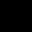

Frame 5427: Predicted Class = 76


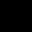

Frame 5428: Predicted Class = 76


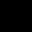

Frame 5429: Predicted Class = 76


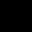

Frame 5430: Predicted Class = 76


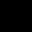

Frame 5431: Predicted Class = 76


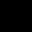

Frame 5432: Predicted Class = 76


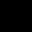

Frame 5433: Predicted Class = 76


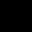

Frame 5434: Predicted Class = 76


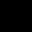

Frame 5435: Predicted Class = 76


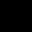

Frame 5436: Predicted Class = 76


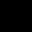

Frame 5437: Predicted Class = 76


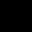

Frame 5438: Predicted Class = 76


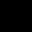

Frame 5439: Predicted Class = 76


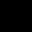

Frame 5440: Predicted Class = 76


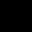

Frame 5441: Predicted Class = 76


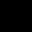

Frame 5442: Predicted Class = 76


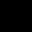

Frame 5443: Predicted Class = 76


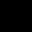

Frame 5444: Predicted Class = 76


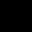

Frame 5445: Predicted Class = 76


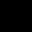

Frame 5446: Predicted Class = 76


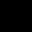

Frame 5447: Predicted Class = 76


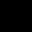

Frame 5448: Predicted Class = 76


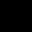

Frame 5449: Predicted Class = 76


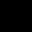

Frame 5450: Predicted Class = 76


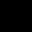

Frame 5451: Predicted Class = 76


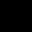

Frame 5452: Predicted Class = 76


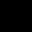

Frame 5453: Predicted Class = 76


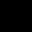

Frame 5454: Predicted Class = 76


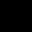

Frame 5455: Predicted Class = 76


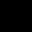

Frame 5456: Predicted Class = 76


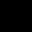

Frame 5457: Predicted Class = 76


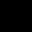

Frame 5458: Predicted Class = 76


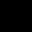

Frame 5459: Predicted Class = 76


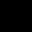

Frame 5460: Predicted Class = 76


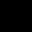

Frame 5461: Predicted Class = 76


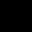

Frame 5462: Predicted Class = 76


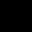

Frame 5463: Predicted Class = 76


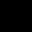

Frame 5464: Predicted Class = 76


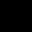

Frame 5465: Predicted Class = 76


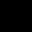

Frame 5466: Predicted Class = 76


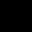

Frame 5467: Predicted Class = 76


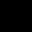

Frame 5468: Predicted Class = 76


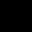

Frame 5469: Predicted Class = 76


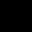

Frame 5470: Predicted Class = 76


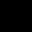

Frame 5471: Predicted Class = 76


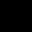

Frame 5472: Predicted Class = 76


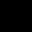

Frame 5473: Predicted Class = 76


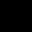

Frame 5474: Predicted Class = 76


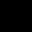

Frame 5475: Predicted Class = 76


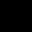

Frame 5476: Predicted Class = 76


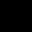

Frame 5477: Predicted Class = 76


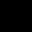

Frame 5478: Predicted Class = 76


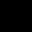

Frame 5479: Predicted Class = 76


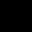

Frame 5480: Predicted Class = 76


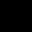

Frame 5481: Predicted Class = 76


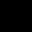

Frame 5482: Predicted Class = 76


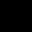

Frame 5483: Predicted Class = 76


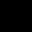

Frame 5484: Predicted Class = 76


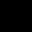

Frame 5485: Predicted Class = 76


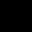

Frame 5486: Predicted Class = 76


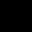

Frame 5487: Predicted Class = 76


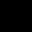

Frame 5488: Predicted Class = 76


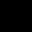

Frame 5489: Predicted Class = 76


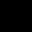

Frame 5490: Predicted Class = 76


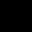

Frame 5491: Predicted Class = 76


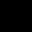

Frame 5492: Predicted Class = 76


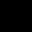

Frame 5493: Predicted Class = 76


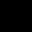

Frame 5494: Predicted Class = 76


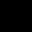

Frame 5495: Predicted Class = 76


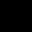

Frame 5496: Predicted Class = 76


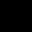

Frame 5497: Predicted Class = 76


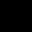

Frame 5498: Predicted Class = 76


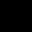

Frame 5499: Predicted Class = 76


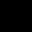

Frame 5500: Predicted Class = 76


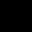

Frame 5501: Predicted Class = 76


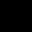

Frame 5502: Predicted Class = 76


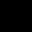

Frame 5503: Predicted Class = 76


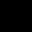

Frame 5504: Predicted Class = 76


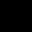

Frame 5505: Predicted Class = 76


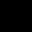

Frame 5506: Predicted Class = 76


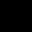

Frame 5507: Predicted Class = 76


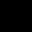

Frame 5508: Predicted Class = 76


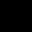

Frame 5509: Predicted Class = 76


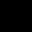

Frame 5510: Predicted Class = 76


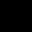

Frame 5511: Predicted Class = 76


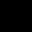

Frame 5512: Predicted Class = 76


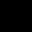

Frame 5513: Predicted Class = 76


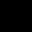

Frame 5514: Predicted Class = 76


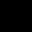

Frame 5515: Predicted Class = 76


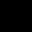

Frame 5516: Predicted Class = 76


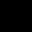

Frame 5517: Predicted Class = 76


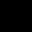

Frame 5518: Predicted Class = 76


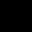

Frame 5519: Predicted Class = 76


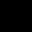

Frame 5520: Predicted Class = 76


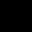

Frame 5521: Predicted Class = 76


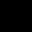

Frame 5522: Predicted Class = 76


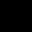

Frame 5523: Predicted Class = 76


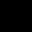

Frame 5524: Predicted Class = 76


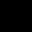

Frame 5525: Predicted Class = 76


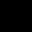

Frame 5526: Predicted Class = 76


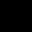

Frame 5527: Predicted Class = 76


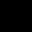

Frame 5528: Predicted Class = 76


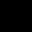

Frame 5529: Predicted Class = 76


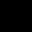

Frame 5530: Predicted Class = 76


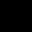

Frame 5531: Predicted Class = 76


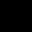

Frame 5532: Predicted Class = 76


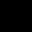

Frame 5533: Predicted Class = 76


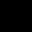

Frame 5534: Predicted Class = 76


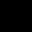

Frame 5535: Predicted Class = 76


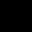

Frame 5536: Predicted Class = 76


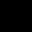

Frame 5537: Predicted Class = 76


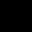

Frame 5538: Predicted Class = 76


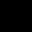

Frame 5539: Predicted Class = 76


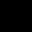

Frame 5540: Predicted Class = 76


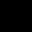

Frame 5541: Predicted Class = 76


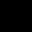

Frame 5542: Predicted Class = 76


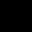

Frame 5543: Predicted Class = 76


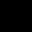

Frame 5544: Predicted Class = 76


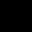

Frame 5545: Predicted Class = 76


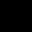

Frame 5546: Predicted Class = 76


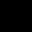

Frame 5547: Predicted Class = 76


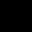

Frame 5548: Predicted Class = 76


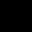

Frame 5549: Predicted Class = 76


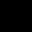

Frame 5550: Predicted Class = 76


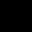

Frame 5551: Predicted Class = 76


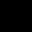

Frame 5552: Predicted Class = 76


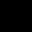

Frame 5553: Predicted Class = 76


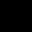

Frame 5554: Predicted Class = 76


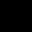

Frame 5555: Predicted Class = 76


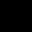

Frame 5556: Predicted Class = 76


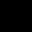

Frame 5557: Predicted Class = 76


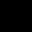

Frame 5558: Predicted Class = 76


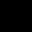

Frame 5559: Predicted Class = 76


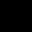

Frame 5560: Predicted Class = 76


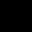

Frame 5561: Predicted Class = 76


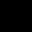

Frame 5562: Predicted Class = 76


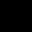

Frame 5563: Predicted Class = 76


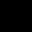

Frame 5564: Predicted Class = 76


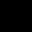

Frame 5565: Predicted Class = 76


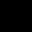

Frame 5566: Predicted Class = 76


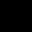

Frame 5567: Predicted Class = 76


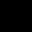

Frame 5568: Predicted Class = 76


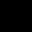

Frame 5569: Predicted Class = 76


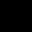

Frame 5570: Predicted Class = 76


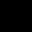

Frame 5571: Predicted Class = 76


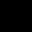

Frame 5572: Predicted Class = 76


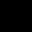

Frame 5573: Predicted Class = 76


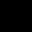

Frame 5574: Predicted Class = 76


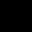

Frame 5575: Predicted Class = 76


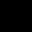

Frame 5576: Predicted Class = 76


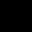

Frame 5577: Predicted Class = 76


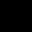

Frame 5578: Predicted Class = 76


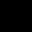

Frame 5579: Predicted Class = 76


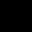

Frame 5580: Predicted Class = 76


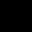

Frame 5581: Predicted Class = 76


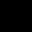

Frame 5582: Predicted Class = 76


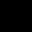

Frame 5583: Predicted Class = 76


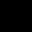

Frame 5584: Predicted Class = 76


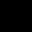

Frame 5585: Predicted Class = 76


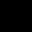

Frame 5586: Predicted Class = 76


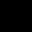

Frame 5587: Predicted Class = 76


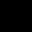

Frame 5588: Predicted Class = 76


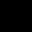

Frame 5589: Predicted Class = 76


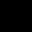

Frame 5590: Predicted Class = 76


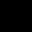

Frame 5591: Predicted Class = 76


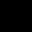

Frame 5592: Predicted Class = 76


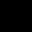

Frame 5593: Predicted Class = 76


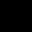

Frame 5594: Predicted Class = 76


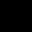

Frame 5595: Predicted Class = 76


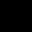

Frame 5596: Predicted Class = 76


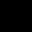

Frame 5597: Predicted Class = 76


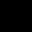

Frame 5598: Predicted Class = 76


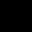

Frame 5599: Predicted Class = 76


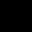

Frame 5600: Predicted Class = 76


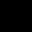

Frame 5601: Predicted Class = 76


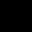

Frame 5602: Predicted Class = 76


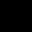

Frame 5603: Predicted Class = 76


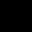

Frame 5604: Predicted Class = 76


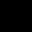

Frame 5605: Predicted Class = 76


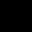

Frame 5606: Predicted Class = 76


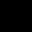

Frame 5607: Predicted Class = 76


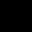

Frame 5608: Predicted Class = 76


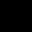

Frame 5609: Predicted Class = 76


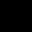

Frame 5610: Predicted Class = 76


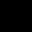

Frame 5611: Predicted Class = 76


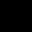

Frame 5612: Predicted Class = 76


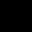

Frame 5613: Predicted Class = 76


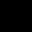

Frame 5614: Predicted Class = 76


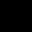

Frame 5615: Predicted Class = 76


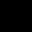

Frame 5616: Predicted Class = 76


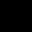

Frame 5617: Predicted Class = 76


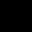

Frame 5618: Predicted Class = 76


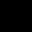

Frame 5619: Predicted Class = 76


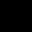

Frame 5620: Predicted Class = 76


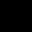

Frame 5621: Predicted Class = 76


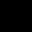

Frame 5622: Predicted Class = 76


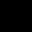

Frame 5623: Predicted Class = 76


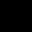

Frame 5624: Predicted Class = 76


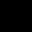

Frame 5625: Predicted Class = 76


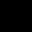

Frame 5626: Predicted Class = 76


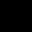

Frame 5627: Predicted Class = 76


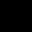

Frame 5628: Predicted Class = 76


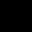

Frame 5629: Predicted Class = 76


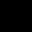

Frame 5630: Predicted Class = 76


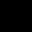

Frame 5631: Predicted Class = 76


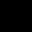

Frame 5632: Predicted Class = 76


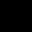

Frame 5633: Predicted Class = 76


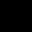

Frame 5634: Predicted Class = 76


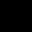

Frame 5635: Predicted Class = 76


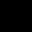

Frame 5636: Predicted Class = 76


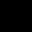

Frame 5637: Predicted Class = 76


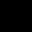

Frame 5638: Predicted Class = 76


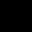

Frame 5639: Predicted Class = 76


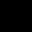

Frame 5640: Predicted Class = 76


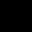

Frame 5641: Predicted Class = 76


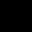

Frame 5642: Predicted Class = 76


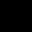

Frame 5643: Predicted Class = 76


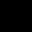

Frame 5644: Predicted Class = 76


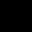

Frame 5645: Predicted Class = 76


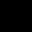

Frame 5646: Predicted Class = 76


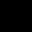

Frame 5647: Predicted Class = 76


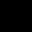

Frame 5648: Predicted Class = 76


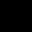

Frame 5649: Predicted Class = 76


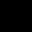

Frame 5650: Predicted Class = 76


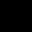

Frame 5651: Predicted Class = 76


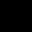

Frame 5652: Predicted Class = 76


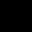

Frame 5653: Predicted Class = 76


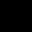

Frame 5654: Predicted Class = 76


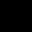

Frame 5655: Predicted Class = 76


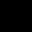

Frame 5656: Predicted Class = 76


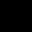

Frame 5657: Predicted Class = 76


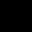

Frame 5658: Predicted Class = 76


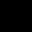

Frame 5659: Predicted Class = 76


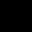

Frame 5660: Predicted Class = 76


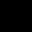

Frame 5661: Predicted Class = 76


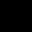

Frame 5662: Predicted Class = 76


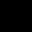

Frame 5663: Predicted Class = 76


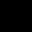

Frame 5664: Predicted Class = 76


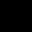

Frame 5665: Predicted Class = 76


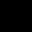

Frame 5666: Predicted Class = 76


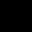

Frame 5667: Predicted Class = 76


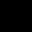

Frame 5668: Predicted Class = 76


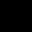

Frame 5669: Predicted Class = 76


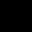

Frame 5670: Predicted Class = 76


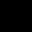

Frame 5671: Predicted Class = 76


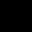

Frame 5672: Predicted Class = 76


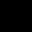

Frame 5673: Predicted Class = 76


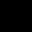

Frame 5674: Predicted Class = 76


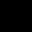

Frame 5675: Predicted Class = 76


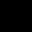

Frame 5676: Predicted Class = 76


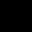

Frame 5677: Predicted Class = 76


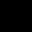

Frame 5678: Predicted Class = 76


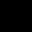

Frame 5679: Predicted Class = 76


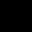

Frame 5680: Predicted Class = 76


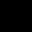

Frame 5681: Predicted Class = 76


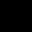

Frame 5682: Predicted Class = 76


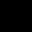

Frame 5683: Predicted Class = 76


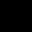

Frame 5684: Predicted Class = 76


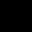

Frame 5685: Predicted Class = 76


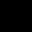

Frame 5686: Predicted Class = 76


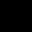

Frame 5687: Predicted Class = 76


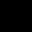

Frame 5688: Predicted Class = 76


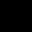

Frame 5689: Predicted Class = 76


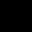

Frame 5690: Predicted Class = 76


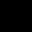

Frame 5691: Predicted Class = 76


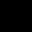

Frame 5692: Predicted Class = 76


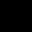

Frame 5693: Predicted Class = 76


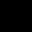

Frame 5694: Predicted Class = 76


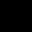

Frame 5695: Predicted Class = 76


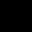

Frame 5696: Predicted Class = 76


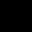

Frame 5697: Predicted Class = 76


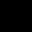

Frame 5698: Predicted Class = 76


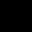

Frame 5699: Predicted Class = 76


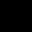

Frame 5700: Predicted Class = 76


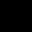

Frame 5701: Predicted Class = 76


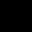

Frame 5702: Predicted Class = 76


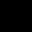

Frame 5703: Predicted Class = 76


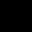

Frame 5704: Predicted Class = 76


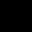

Frame 5705: Predicted Class = 76


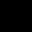

Frame 5706: Predicted Class = 76


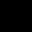

Frame 5707: Predicted Class = 76


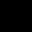

Frame 5708: Predicted Class = 76


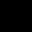

Frame 5709: Predicted Class = 76


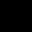

Frame 5710: Predicted Class = 76


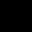

Frame 5711: Predicted Class = 76


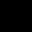

Frame 5712: Predicted Class = 76


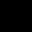

Frame 5713: Predicted Class = 76


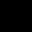

Frame 5714: Predicted Class = 76


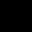

Frame 5715: Predicted Class = 76


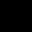

Frame 5716: Predicted Class = 76


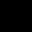

Frame 5717: Predicted Class = 76


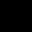

Frame 5718: Predicted Class = 76


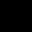

Frame 5719: Predicted Class = 76


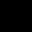

Frame 5720: Predicted Class = 76


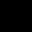

Frame 5721: Predicted Class = 76


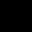

Frame 5722: Predicted Class = 76


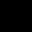

Frame 5723: Predicted Class = 76


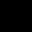

Frame 5724: Predicted Class = 76


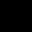

Frame 5725: Predicted Class = 76


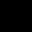

Frame 5726: Predicted Class = 76


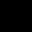

Frame 5727: Predicted Class = 76


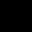

Frame 5728: Predicted Class = 76


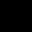

Frame 5729: Predicted Class = 76


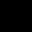

Frame 5730: Predicted Class = 76


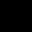

Frame 5731: Predicted Class = 76


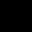

Frame 5732: Predicted Class = 76


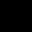

Frame 5733: Predicted Class = 76


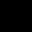

Frame 5734: Predicted Class = 76


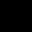

Frame 5735: Predicted Class = 76


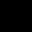

Frame 5736: Predicted Class = 76


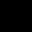

Frame 5737: Predicted Class = 76


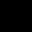

Frame 5738: Predicted Class = 76


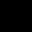

Frame 5739: Predicted Class = 76


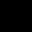

Frame 5740: Predicted Class = 76


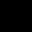

Frame 5741: Predicted Class = 76


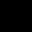

Frame 5742: Predicted Class = 76


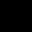

Frame 5743: Predicted Class = 76


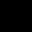

Frame 5744: Predicted Class = 76


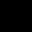

Frame 5745: Predicted Class = 76


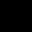

Frame 5746: Predicted Class = 76


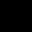

Frame 5747: Predicted Class = 76


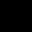

Frame 5748: Predicted Class = 76


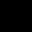

Frame 5749: Predicted Class = 76


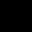

Frame 5750: Predicted Class = 76


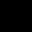

Frame 5751: Predicted Class = 76


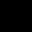

Frame 5752: Predicted Class = 76


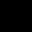

Frame 5753: Predicted Class = 76


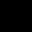

Frame 5754: Predicted Class = 76


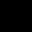

Frame 5755: Predicted Class = 76


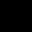

Frame 5756: Predicted Class = 76


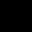

Frame 5757: Predicted Class = 76


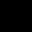

Frame 5758: Predicted Class = 76


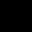

Frame 5759: Predicted Class = 76


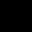

Frame 5760: Predicted Class = 76


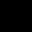

Frame 5761: Predicted Class = 76


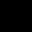

Frame 5762: Predicted Class = 76


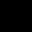

Frame 5763: Predicted Class = 76


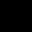

Frame 5764: Predicted Class = 76


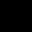

Frame 5765: Predicted Class = 76


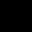

Frame 5766: Predicted Class = 76


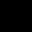

Frame 5767: Predicted Class = 76


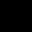

Frame 5768: Predicted Class = 76


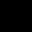

Frame 5769: Predicted Class = 76


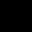

Frame 5770: Predicted Class = 76


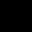

Frame 5771: Predicted Class = 76


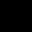

Frame 5772: Predicted Class = 76


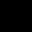

Frame 5773: Predicted Class = 76


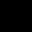

Frame 5774: Predicted Class = 76


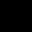

Frame 5775: Predicted Class = 76


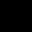

Frame 5776: Predicted Class = 76


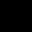

Frame 5777: Predicted Class = 76


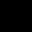

Frame 5778: Predicted Class = 76


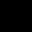

Frame 5779: Predicted Class = 76


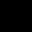

Frame 5780: Predicted Class = 76


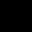

Frame 5781: Predicted Class = 76


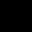

Frame 5782: Predicted Class = 76


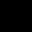

Frame 5783: Predicted Class = 76


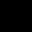

Frame 5784: Predicted Class = 76


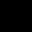

Frame 5785: Predicted Class = 76


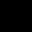

Frame 5786: Predicted Class = 76


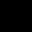

Frame 5787: Predicted Class = 76


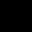

Frame 5788: Predicted Class = 76


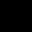

Frame 5789: Predicted Class = 76


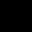

Frame 5790: Predicted Class = 76


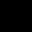

Frame 5791: Predicted Class = 76


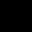

Frame 5792: Predicted Class = 76


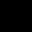

Frame 5793: Predicted Class = 76


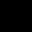

Frame 5794: Predicted Class = 76


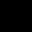

Frame 5795: Predicted Class = 76


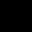

Frame 5796: Predicted Class = 76


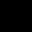

Frame 5797: Predicted Class = 76


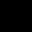

Frame 5798: Predicted Class = 76


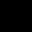

Frame 5799: Predicted Class = 76


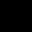

Frame 5800: Predicted Class = 76


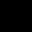

Frame 5801: Predicted Class = 76


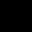

Frame 5802: Predicted Class = 76


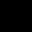

Frame 5803: Predicted Class = 76


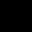

Frame 5804: Predicted Class = 76


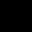

Frame 5805: Predicted Class = 76


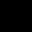

Frame 5806: Predicted Class = 76


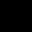

Frame 5807: Predicted Class = 76


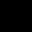

Frame 5808: Predicted Class = 76


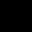

Frame 5809: Predicted Class = 76


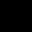

Frame 5810: Predicted Class = 76


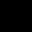

Frame 5811: Predicted Class = 76


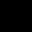

Frame 5812: Predicted Class = 76


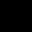

Frame 5813: Predicted Class = 76


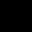

Frame 5814: Predicted Class = 76


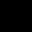

Frame 5815: Predicted Class = 76


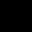

Frame 5816: Predicted Class = 76


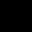

Frame 5817: Predicted Class = 76


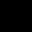

Frame 5818: Predicted Class = 76


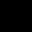

Frame 5819: Predicted Class = 76


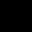

Frame 5820: Predicted Class = 76


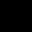

Frame 5821: Predicted Class = 76


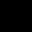

Frame 5822: Predicted Class = 76


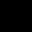

Frame 5823: Predicted Class = 76


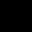

Frame 5824: Predicted Class = 76


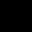

Frame 5825: Predicted Class = 76


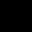

Frame 5826: Predicted Class = 76


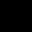

Frame 5827: Predicted Class = 76


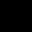

Frame 5828: Predicted Class = 76


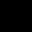

Frame 5829: Predicted Class = 76


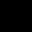

Frame 5830: Predicted Class = 76


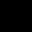

Frame 5831: Predicted Class = 76


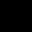

Frame 5832: Predicted Class = 76


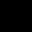

Frame 5833: Predicted Class = 76


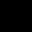

Frame 5834: Predicted Class = 76


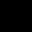

Frame 5835: Predicted Class = 76


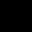

Frame 5836: Predicted Class = 76


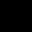

Frame 5837: Predicted Class = 76


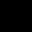

Frame 5838: Predicted Class = 76


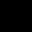

Frame 5839: Predicted Class = 76


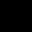

Frame 5840: Predicted Class = 76


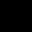

Frame 5841: Predicted Class = 76


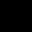

Frame 5842: Predicted Class = 76


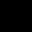

Frame 5843: Predicted Class = 76


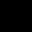

Frame 5844: Predicted Class = 76


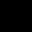

Frame 5845: Predicted Class = 76


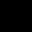

Frame 5846: Predicted Class = 76


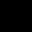

Frame 5847: Predicted Class = 76


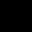

Frame 5848: Predicted Class = 76


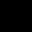

Frame 5849: Predicted Class = 76


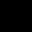

Frame 5850: Predicted Class = 76


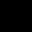

Frame 5851: Predicted Class = 76


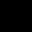

Frame 5852: Predicted Class = 76


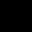

Frame 5853: Predicted Class = 76


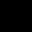

Frame 5854: Predicted Class = 76


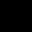

Frame 5855: Predicted Class = 76


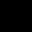

Frame 5856: Predicted Class = 76


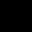

Frame 5857: Predicted Class = 76


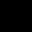

Frame 5858: Predicted Class = 76


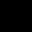

Frame 5859: Predicted Class = 76


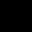

Frame 5860: Predicted Class = 76


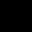

Frame 5861: Predicted Class = 76


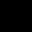

Frame 5862: Predicted Class = 76


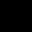

Frame 5863: Predicted Class = 76


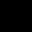

Frame 5864: Predicted Class = 76


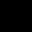

Frame 5865: Predicted Class = 76


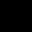

Frame 5866: Predicted Class = 76


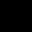

Frame 5867: Predicted Class = 76


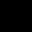

Frame 5868: Predicted Class = 76


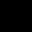

Frame 5869: Predicted Class = 76


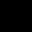

Frame 5870: Predicted Class = 76


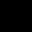

Frame 5871: Predicted Class = 76


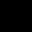

Frame 5872: Predicted Class = 76


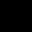

Frame 5873: Predicted Class = 76


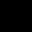

Frame 5874: Predicted Class = 76


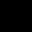

Frame 5875: Predicted Class = 76


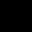

Frame 5876: Predicted Class = 76


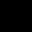

Frame 5877: Predicted Class = 76


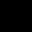

Frame 5878: Predicted Class = 76


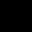

Frame 5879: Predicted Class = 76


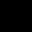

Frame 5880: Predicted Class = 76


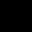

Frame 5881: Predicted Class = 76


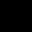

Frame 5882: Predicted Class = 76


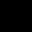

Frame 5883: Predicted Class = 76


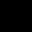

Frame 5884: Predicted Class = 76


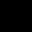

Frame 5885: Predicted Class = 76


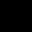

Frame 5886: Predicted Class = 76


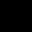

Frame 5887: Predicted Class = 76


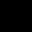

Frame 5888: Predicted Class = 76


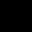

Frame 5889: Predicted Class = 76


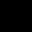

Frame 5890: Predicted Class = 76


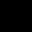

Frame 5891: Predicted Class = 76


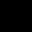

Frame 5892: Predicted Class = 76


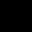

Frame 5893: Predicted Class = 76


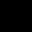

Frame 5894: Predicted Class = 76


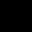

Frame 5895: Predicted Class = 76


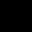

Frame 5896: Predicted Class = 76


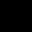

Frame 5897: Predicted Class = 76


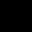

Frame 5898: Predicted Class = 76


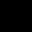

Frame 5899: Predicted Class = 76


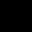

Frame 5900: Predicted Class = 76


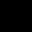

Frame 5901: Predicted Class = 76


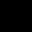

Frame 5902: Predicted Class = 76


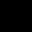

Frame 5903: Predicted Class = 76


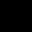

Frame 5904: Predicted Class = 76


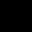

Frame 5905: Predicted Class = 76


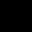

Frame 5906: Predicted Class = 76


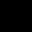

Frame 5907: Predicted Class = 76


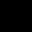

Frame 5908: Predicted Class = 76


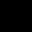

Frame 5909: Predicted Class = 76


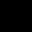

Frame 5910: Predicted Class = 76


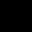

Frame 5911: Predicted Class = 76


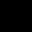

Frame 5912: Predicted Class = 76


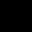

Frame 5913: Predicted Class = 76


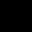

Frame 5914: Predicted Class = 76


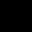

Frame 5915: Predicted Class = 76


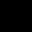

Frame 5916: Predicted Class = 76


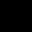

Frame 5917: Predicted Class = 76


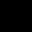

Frame 5918: Predicted Class = 76


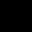

Frame 5919: Predicted Class = 76


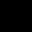

Frame 5920: Predicted Class = 76


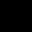

Frame 5921: Predicted Class = 76


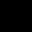

Frame 5922: Predicted Class = 76


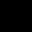

Frame 5923: Predicted Class = 76


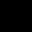

Frame 5924: Predicted Class = 76


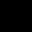

Frame 5925: Predicted Class = 76


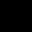

Frame 5926: Predicted Class = 76


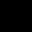

Frame 5927: Predicted Class = 76


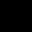

Frame 5928: Predicted Class = 76


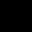

Frame 5929: Predicted Class = 76


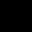

Frame 5930: Predicted Class = 76


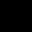

Frame 5931: Predicted Class = 76


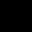

Frame 5932: Predicted Class = 76


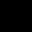

Frame 5933: Predicted Class = 76


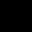

Frame 5934: Predicted Class = 76


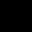

Frame 5935: Predicted Class = 76


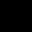

Frame 5936: Predicted Class = 76


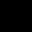

Frame 5937: Predicted Class = 76


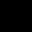

Frame 5938: Predicted Class = 76


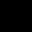

Frame 5939: Predicted Class = 76


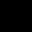

Frame 5940: Predicted Class = 76


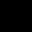

Frame 5941: Predicted Class = 76


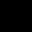

Frame 5942: Predicted Class = 76


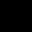

Frame 5943: Predicted Class = 76


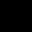

Frame 5944: Predicted Class = 76


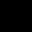

Frame 5945: Predicted Class = 76


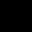

Frame 5946: Predicted Class = 76


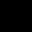

Frame 5947: Predicted Class = 76


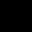

Frame 5948: Predicted Class = 76


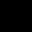

Frame 5949: Predicted Class = 76


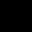

Frame 5950: Predicted Class = 76


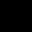

Frame 5951: Predicted Class = 76


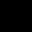

Frame 5952: Predicted Class = 76


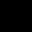

Frame 5953: Predicted Class = 76


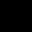

Frame 5954: Predicted Class = 76


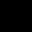

Frame 5955: Predicted Class = 76


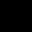

Frame 5956: Predicted Class = 76


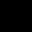

Frame 5957: Predicted Class = 76


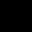

Frame 5958: Predicted Class = 76


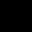

Frame 5959: Predicted Class = 76


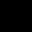

Frame 5960: Predicted Class = 76


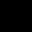

Frame 5961: Predicted Class = 76


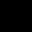

Frame 5962: Predicted Class = 76


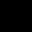

Frame 5963: Predicted Class = 76


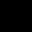

Frame 5964: Predicted Class = 76


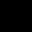

Frame 5965: Predicted Class = 76


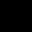

Frame 5966: Predicted Class = 76


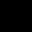

Frame 5967: Predicted Class = 76


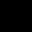

Frame 5968: Predicted Class = 76


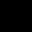

Frame 5969: Predicted Class = 76


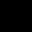

Frame 5970: Predicted Class = 76


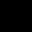

Frame 5971: Predicted Class = 76


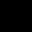

Frame 5972: Predicted Class = 76


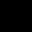

Frame 5973: Predicted Class = 76


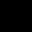

Frame 5974: Predicted Class = 76


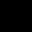

Frame 5975: Predicted Class = 76


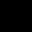

Frame 5976: Predicted Class = 76


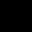

Frame 5977: Predicted Class = 76


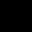

Frame 5978: Predicted Class = 76


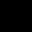

Frame 5979: Predicted Class = 76


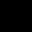

Frame 5980: Predicted Class = 76


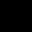

Frame 5981: Predicted Class = 76


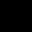

Frame 5982: Predicted Class = 76


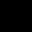

Frame 5983: Predicted Class = 76


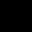

Frame 5984: Predicted Class = 76


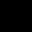

Frame 5985: Predicted Class = 76


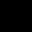

Frame 5986: Predicted Class = 76


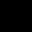

Frame 5987: Predicted Class = 76


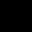

Frame 5988: Predicted Class = 76


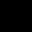

Frame 5989: Predicted Class = 76


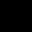

Frame 5990: Predicted Class = 76


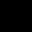

Frame 5991: Predicted Class = 76


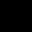

Frame 5992: Predicted Class = 76


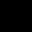

Frame 5993: Predicted Class = 76


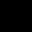

Frame 5994: Predicted Class = 76


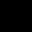

Frame 5995: Predicted Class = 76


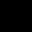

Frame 5996: Predicted Class = 76


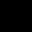

Frame 5997: Predicted Class = 76


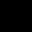

Frame 5998: Predicted Class = 76


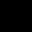

Frame 5999: Predicted Class = 76


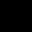

Frame 6000: Predicted Class = 76


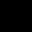

Frame 6001: Predicted Class = 76


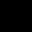

Frame 6002: Predicted Class = 76


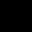

Frame 6003: Predicted Class = 76


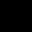

Frame 6004: Predicted Class = 76


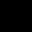

Frame 6005: Predicted Class = 76


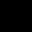

Frame 6006: Predicted Class = 76


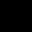

Frame 6007: Predicted Class = 76


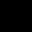

Frame 6008: Predicted Class = 76


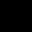

Frame 6009: Predicted Class = 76


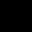

Frame 6010: Predicted Class = 76


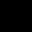

Frame 6011: Predicted Class = 76


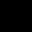

Frame 6012: Predicted Class = 76


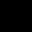

Frame 6013: Predicted Class = 76


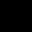

Frame 6014: Predicted Class = 76


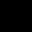

Frame 6015: Predicted Class = 76


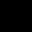

Frame 6016: Predicted Class = 76


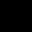

Frame 6017: Predicted Class = 76


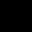

Frame 6018: Predicted Class = 76


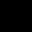

Frame 6019: Predicted Class = 76


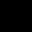

Frame 6020: Predicted Class = 76


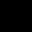

Frame 6021: Predicted Class = 76


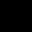

Frame 6022: Predicted Class = 76


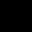

Frame 6023: Predicted Class = 76


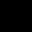

Frame 6024: Predicted Class = 76


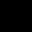

Frame 6025: Predicted Class = 76


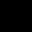

Frame 6026: Predicted Class = 76


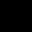

Frame 6027: Predicted Class = 76


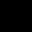

Frame 6028: Predicted Class = 76


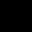

Frame 6029: Predicted Class = 76


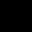

Frame 6030: Predicted Class = 76


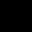

Frame 6031: Predicted Class = 76


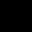

Frame 6032: Predicted Class = 76


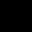

Frame 6033: Predicted Class = 76


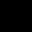

Frame 6034: Predicted Class = 76


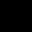

Frame 6035: Predicted Class = 76


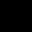

Frame 6036: Predicted Class = 76


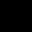

Frame 6037: Predicted Class = 76


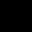

Frame 6038: Predicted Class = 76


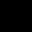

Frame 6039: Predicted Class = 76


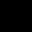

Frame 6040: Predicted Class = 76


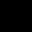

Frame 6041: Predicted Class = 76


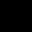

Frame 6042: Predicted Class = 76


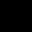

Frame 6043: Predicted Class = 76


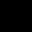

Frame 6044: Predicted Class = 76


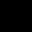

Frame 6045: Predicted Class = 76


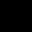

Frame 6046: Predicted Class = 76


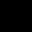

Frame 6047: Predicted Class = 76


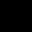

Frame 6048: Predicted Class = 76


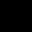

Frame 6049: Predicted Class = 76


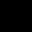

Frame 6050: Predicted Class = 76


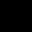

Frame 6051: Predicted Class = 76


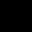

Frame 6052: Predicted Class = 76


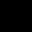

Frame 6053: Predicted Class = 76


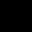

Frame 6054: Predicted Class = 76


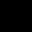

Frame 6055: Predicted Class = 76


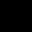

Frame 6056: Predicted Class = 76


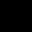

Frame 6057: Predicted Class = 76


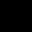

Frame 6058: Predicted Class = 76


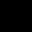

Frame 6059: Predicted Class = 76


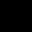

Frame 6060: Predicted Class = 76


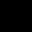

Frame 6061: Predicted Class = 76


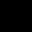

Frame 6062: Predicted Class = 76


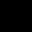

Frame 6063: Predicted Class = 76


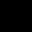

Frame 6064: Predicted Class = 76


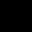

Frame 6065: Predicted Class = 76


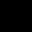

Frame 6066: Predicted Class = 76


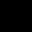

Frame 6067: Predicted Class = 76


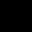

Frame 6068: Predicted Class = 76


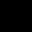

Frame 6069: Predicted Class = 76


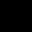

Frame 6070: Predicted Class = 76


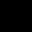

Frame 6071: Predicted Class = 76


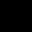

Frame 6072: Predicted Class = 76


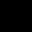

Frame 6073: Predicted Class = 76


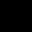

Frame 6074: Predicted Class = 76


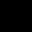

Frame 6075: Predicted Class = 76


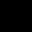

Frame 6076: Predicted Class = 76


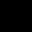

Frame 6077: Predicted Class = 76


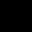

Frame 6078: Predicted Class = 76


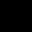

Frame 6079: Predicted Class = 76


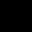

Frame 6080: Predicted Class = 76


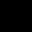

Frame 6081: Predicted Class = 76


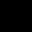

Frame 6082: Predicted Class = 76


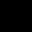

Frame 6083: Predicted Class = 76


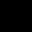

Frame 6084: Predicted Class = 76


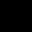

Frame 6085: Predicted Class = 76


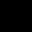

Frame 6086: Predicted Class = 76


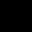

Frame 6087: Predicted Class = 76


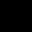

Frame 6088: Predicted Class = 76


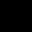

Frame 6089: Predicted Class = 76


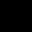

Frame 6090: Predicted Class = 76


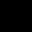

Frame 6091: Predicted Class = 76


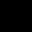

Frame 6092: Predicted Class = 76


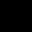

Frame 6093: Predicted Class = 76


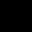

Frame 6094: Predicted Class = 76


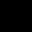

Frame 6095: Predicted Class = 76


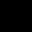

Frame 6096: Predicted Class = 76


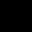

Frame 6097: Predicted Class = 76


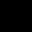

Frame 6098: Predicted Class = 76


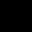

Frame 6099: Predicted Class = 76


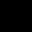

Frame 6100: Predicted Class = 76


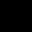

Frame 6101: Predicted Class = 76


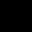

Frame 6102: Predicted Class = 76


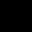

Frame 6103: Predicted Class = 76


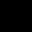

Frame 6104: Predicted Class = 76


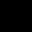

Frame 6105: Predicted Class = 76


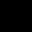

Frame 6106: Predicted Class = 76


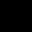

Frame 6107: Predicted Class = 76


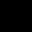

Frame 6108: Predicted Class = 76


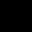

Frame 6109: Predicted Class = 76


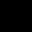

Frame 6110: Predicted Class = 76


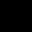

Frame 6111: Predicted Class = 76


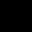

Frame 6112: Predicted Class = 76


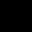

Frame 6113: Predicted Class = 76


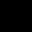

Frame 6114: Predicted Class = 76


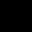

Frame 6115: Predicted Class = 76


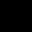

Frame 6116: Predicted Class = 76


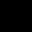

Frame 6117: Predicted Class = 76


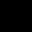

Frame 6118: Predicted Class = 76


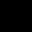

Frame 6119: Predicted Class = 76


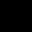

Frame 6120: Predicted Class = 76


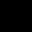

Frame 6121: Predicted Class = 76


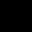

Frame 6122: Predicted Class = 76


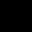

Frame 6123: Predicted Class = 76


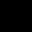

Frame 6124: Predicted Class = 76


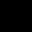

Frame 6125: Predicted Class = 76


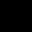

Frame 6126: Predicted Class = 76


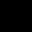

Frame 6127: Predicted Class = 76


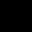

Frame 6128: Predicted Class = 76


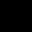

Frame 6129: Predicted Class = 76


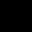

Frame 6130: Predicted Class = 76


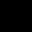

Frame 6131: Predicted Class = 76


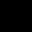

Frame 6132: Predicted Class = 76


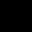

Frame 6133: Predicted Class = 76


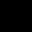

Frame 6134: Predicted Class = 76


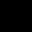

Frame 6135: Predicted Class = 76


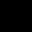

Frame 6136: Predicted Class = 76


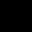

Frame 6137: Predicted Class = 76


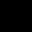

Frame 6138: Predicted Class = 76


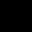

Frame 6139: Predicted Class = 76


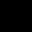

Frame 6140: Predicted Class = 76


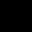

Frame 6141: Predicted Class = 76


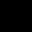

Frame 6142: Predicted Class = 76


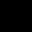

Frame 6143: Predicted Class = 76


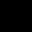

Frame 6144: Predicted Class = 76


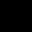

Frame 6145: Predicted Class = 76


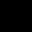

Frame 6146: Predicted Class = 76


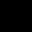

Frame 6147: Predicted Class = 76


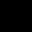

Frame 6148: Predicted Class = 76


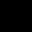

Frame 6149: Predicted Class = 76


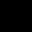

Frame 6150: Predicted Class = 76


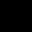

Frame 6151: Predicted Class = 76


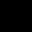

Frame 6152: Predicted Class = 76


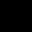

Frame 6153: Predicted Class = 76


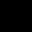

Frame 6154: Predicted Class = 76


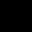

Frame 6155: Predicted Class = 76


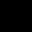

Frame 6156: Predicted Class = 76


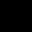

Frame 6157: Predicted Class = 76


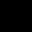

Frame 6158: Predicted Class = 76


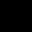

Frame 6159: Predicted Class = 76


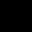

Frame 6160: Predicted Class = 76


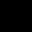

Frame 6161: Predicted Class = 76


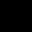

Frame 6162: Predicted Class = 76


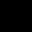

Frame 6163: Predicted Class = 76


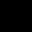

Frame 6164: Predicted Class = 76


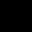

Frame 6165: Predicted Class = 76


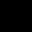

Frame 6166: Predicted Class = 76


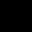

Frame 6167: Predicted Class = 76


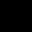

Frame 6168: Predicted Class = 76


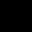

Frame 6169: Predicted Class = 76


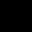

Frame 6170: Predicted Class = 76


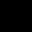

Frame 6171: Predicted Class = 76


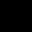

Frame 6172: Predicted Class = 76


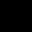

Frame 6173: Predicted Class = 76


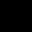

Frame 6174: Predicted Class = 76


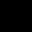

Frame 6175: Predicted Class = 76


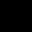

Frame 6176: Predicted Class = 76


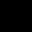

Frame 6177: Predicted Class = 76


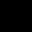

Frame 6178: Predicted Class = 76


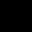

Frame 6179: Predicted Class = 76


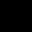

Frame 6180: Predicted Class = 76


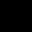

Frame 6181: Predicted Class = 76


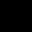

Frame 6182: Predicted Class = 76


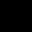

Frame 6183: Predicted Class = 76


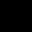

Frame 6184: Predicted Class = 76


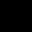

Frame 6185: Predicted Class = 76


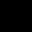

Frame 6186: Predicted Class = 76


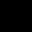

Frame 6187: Predicted Class = 76


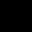

Frame 6188: Predicted Class = 76


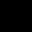

Frame 6189: Predicted Class = 76


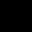

Frame 6190: Predicted Class = 76


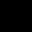

Frame 6191: Predicted Class = 76


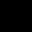

Frame 6192: Predicted Class = 76


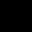

Frame 6193: Predicted Class = 76


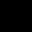

Frame 6194: Predicted Class = 76


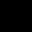

Frame 6195: Predicted Class = 76


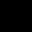

Frame 6196: Predicted Class = 76


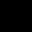

Frame 6197: Predicted Class = 76


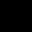

Frame 6198: Predicted Class = 76


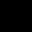

Frame 6199: Predicted Class = 76


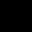

Frame 6200: Predicted Class = 76


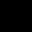

Frame 6201: Predicted Class = 76


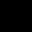

Frame 6202: Predicted Class = 76


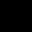

Frame 6203: Predicted Class = 76


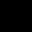

Frame 6204: Predicted Class = 76


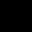

Frame 6205: Predicted Class = 76


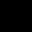

Frame 6206: Predicted Class = 76


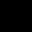

Frame 6207: Predicted Class = 76


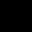

Frame 6208: Predicted Class = 76


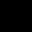

Frame 6209: Predicted Class = 76


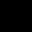

Frame 6210: Predicted Class = 76


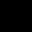

Frame 6211: Predicted Class = 76


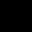

Frame 6212: Predicted Class = 76


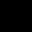

Frame 6213: Predicted Class = 76


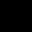

Frame 6214: Predicted Class = 76


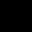

Frame 6215: Predicted Class = 76


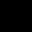

Frame 6216: Predicted Class = 76


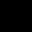

Frame 6217: Predicted Class = 76


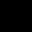

Frame 6218: Predicted Class = 76


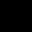

Frame 6219: Predicted Class = 76


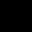

Frame 6220: Predicted Class = 76


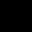

Frame 6221: Predicted Class = 76


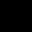

Frame 6222: Predicted Class = 76


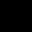

Frame 6223: Predicted Class = 76


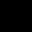

Frame 6224: Predicted Class = 76


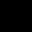

Frame 6225: Predicted Class = 76


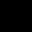

Frame 6226: Predicted Class = 76


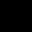

Frame 6227: Predicted Class = 76


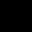

Frame 6228: Predicted Class = 76


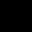

Frame 6229: Predicted Class = 76


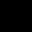

Frame 6230: Predicted Class = 76


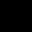

Frame 6231: Predicted Class = 76


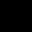

Frame 6232: Predicted Class = 76


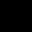

Frame 6233: Predicted Class = 76


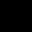

Frame 6234: Predicted Class = 76


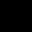

Frame 6235: Predicted Class = 76


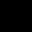

Frame 6236: Predicted Class = 76


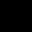

Frame 6237: Predicted Class = 76


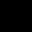

Frame 6238: Predicted Class = 76


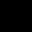

Frame 6239: Predicted Class = 76


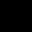

Frame 6240: Predicted Class = 76


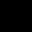

Frame 6241: Predicted Class = 76


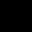

Frame 6242: Predicted Class = 76


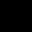

Frame 6243: Predicted Class = 76


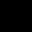

Frame 6244: Predicted Class = 76


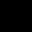

Frame 6245: Predicted Class = 76


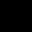

Frame 6246: Predicted Class = 76


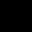

Frame 6247: Predicted Class = 76


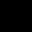

Frame 6248: Predicted Class = 76


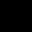

Frame 6249: Predicted Class = 76


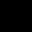

Frame 6250: Predicted Class = 76


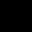

Frame 6251: Predicted Class = 76


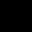

Frame 6252: Predicted Class = 76


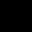

Frame 6253: Predicted Class = 76


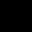

Frame 6254: Predicted Class = 76


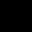

Frame 6255: Predicted Class = 76


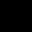

Frame 6256: Predicted Class = 76


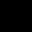

Frame 6257: Predicted Class = 76


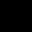

Frame 6258: Predicted Class = 76


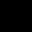

Frame 6259: Predicted Class = 76


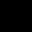

Frame 6260: Predicted Class = 76


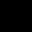

Frame 6261: Predicted Class = 76


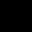

Frame 6262: Predicted Class = 76


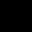

Frame 6263: Predicted Class = 76


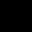

Frame 6264: Predicted Class = 76


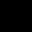

Frame 6265: Predicted Class = 76


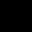

Frame 6266: Predicted Class = 76


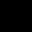

Frame 6267: Predicted Class = 76


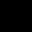

Frame 6268: Predicted Class = 76


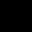

Frame 6269: Predicted Class = 76


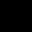

Frame 6270: Predicted Class = 76


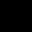

Frame 6271: Predicted Class = 76


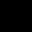

Frame 6272: Predicted Class = 76


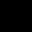

Frame 6273: Predicted Class = 76


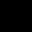

Frame 6274: Predicted Class = 76


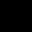

Frame 6275: Predicted Class = 76


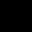

Frame 6276: Predicted Class = 76


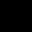

Frame 6277: Predicted Class = 76


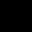

Frame 6278: Predicted Class = 76


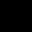

Frame 6279: Predicted Class = 76


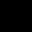

Frame 6280: Predicted Class = 76


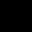

Frame 6281: Predicted Class = 76


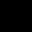

Frame 6282: Predicted Class = 76


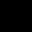

Frame 6283: Predicted Class = 76


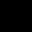

Frame 6284: Predicted Class = 76


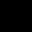

Frame 6285: Predicted Class = 76


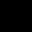

Frame 6286: Predicted Class = 76


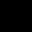

Frame 6287: Predicted Class = 76


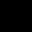

Frame 6288: Predicted Class = 76


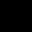

Frame 6289: Predicted Class = 76


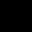

Frame 6290: Predicted Class = 76


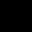

Frame 6291: Predicted Class = 76


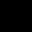

Frame 6292: Predicted Class = 76


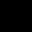

Frame 6293: Predicted Class = 76


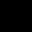

Frame 6294: Predicted Class = 76


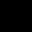

Frame 6295: Predicted Class = 76


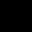

Frame 6296: Predicted Class = 76


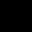

Frame 6297: Predicted Class = 76


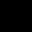

Frame 6298: Predicted Class = 76


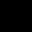

Frame 6299: Predicted Class = 76


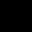

Frame 6300: Predicted Class = 76


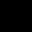

Frame 6301: Predicted Class = 76


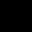

Frame 6302: Predicted Class = 76


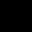

Frame 6303: Predicted Class = 76


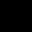

Frame 6304: Predicted Class = 76


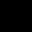

Frame 6305: Predicted Class = 76


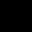

Frame 6306: Predicted Class = 76


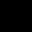

Frame 6307: Predicted Class = 76


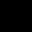

Frame 6308: Predicted Class = 76


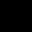

Frame 6309: Predicted Class = 76


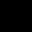

Frame 6310: Predicted Class = 76


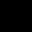

Frame 6311: Predicted Class = 76


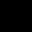

Frame 6312: Predicted Class = 76


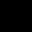

Frame 6313: Predicted Class = 76


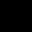

Frame 6314: Predicted Class = 76


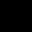

Frame 6315: Predicted Class = 76


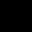

Frame 6316: Predicted Class = 76


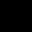

Frame 6317: Predicted Class = 76


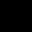

Frame 6318: Predicted Class = 76


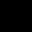

Frame 6319: Predicted Class = 76


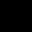

Frame 6320: Predicted Class = 76


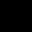

Frame 6321: Predicted Class = 76


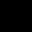

Frame 6322: Predicted Class = 76


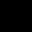

Frame 6323: Predicted Class = 76


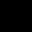

Frame 6324: Predicted Class = 76


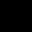

Frame 6325: Predicted Class = 76


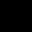

Frame 6326: Predicted Class = 76


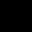

Frame 6327: Predicted Class = 76


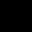

Frame 6328: Predicted Class = 76


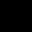

Frame 6329: Predicted Class = 76


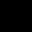

Frame 6330: Predicted Class = 76


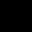

Frame 6331: Predicted Class = 76


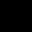

Frame 6332: Predicted Class = 76


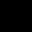

Frame 6333: Predicted Class = 76


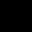

Frame 6334: Predicted Class = 76


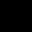

Frame 6335: Predicted Class = 76


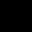

Frame 6336: Predicted Class = 76


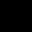

Frame 6337: Predicted Class = 76


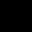

Frame 6338: Predicted Class = 76


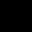

Frame 6339: Predicted Class = 76


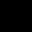

Frame 6340: Predicted Class = 76


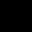

Frame 6341: Predicted Class = 76


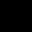

Frame 6342: Predicted Class = 76


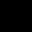

Frame 6343: Predicted Class = 76


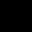

Frame 6344: Predicted Class = 76


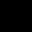

Frame 6345: Predicted Class = 76


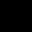

Frame 6346: Predicted Class = 76


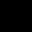

Frame 6347: Predicted Class = 76


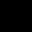

Frame 6348: Predicted Class = 76


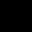

Frame 6349: Predicted Class = 76


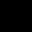

Frame 6350: Predicted Class = 76


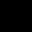

Frame 6351: Predicted Class = 76


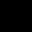

Frame 6352: Predicted Class = 76


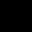

Frame 6353: Predicted Class = 76


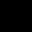

Frame 6354: Predicted Class = 76


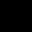

Frame 6355: Predicted Class = 76


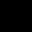

Frame 6356: Predicted Class = 76


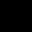

Frame 6357: Predicted Class = 76


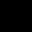

Frame 6358: Predicted Class = 76


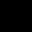

Frame 6359: Predicted Class = 76


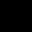

Frame 6360: Predicted Class = 76


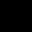

Frame 6361: Predicted Class = 76


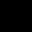

Frame 6362: Predicted Class = 76


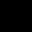

Frame 6363: Predicted Class = 76


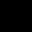

Frame 6364: Predicted Class = 76


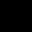

Frame 6365: Predicted Class = 76


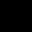

Frame 6366: Predicted Class = 76


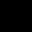

Frame 6367: Predicted Class = 76


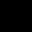

Frame 6368: Predicted Class = 76


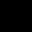

Frame 6369: Predicted Class = 76


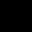

Frame 6370: Predicted Class = 76


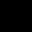

Frame 6371: Predicted Class = 76


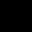

Frame 6372: Predicted Class = 76


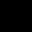

Frame 6373: Predicted Class = 76


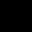

Frame 6374: Predicted Class = 76


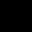

Frame 6375: Predicted Class = 76


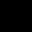

Frame 6376: Predicted Class = 76


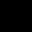

Frame 6377: Predicted Class = 76


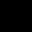

Frame 6378: Predicted Class = 76


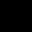

Frame 6379: Predicted Class = 76


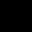

Frame 6380: Predicted Class = 76


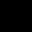

Frame 6381: Predicted Class = 76


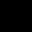

Frame 6382: Predicted Class = 76


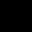

Frame 6383: Predicted Class = 76


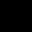

Frame 6384: Predicted Class = 76


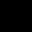

Frame 6385: Predicted Class = 76


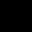

Frame 6386: Predicted Class = 76


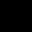

Frame 6387: Predicted Class = 76


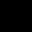

Frame 6388: Predicted Class = 76


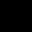

Frame 6389: Predicted Class = 76


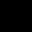

Frame 6390: Predicted Class = 76


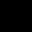

Frame 6391: Predicted Class = 76


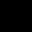

Frame 6392: Predicted Class = 76


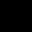

Frame 6393: Predicted Class = 76


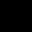

Frame 6394: Predicted Class = 76


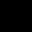

Frame 6395: Predicted Class = 76


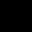

Frame 6396: Predicted Class = 76


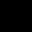

Frame 6397: Predicted Class = 76


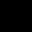

Frame 6398: Predicted Class = 76


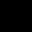

Frame 6399: Predicted Class = 76


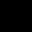

Frame 6400: Predicted Class = 76


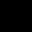

Frame 6401: Predicted Class = 76


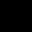

Frame 6402: Predicted Class = 76


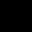

Frame 6403: Predicted Class = 76


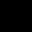

Frame 6404: Predicted Class = 76


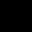

Frame 6405: Predicted Class = 76


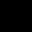

Frame 6406: Predicted Class = 76


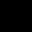

Frame 6407: Predicted Class = 76


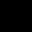

Frame 6408: Predicted Class = 76


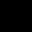

Frame 6409: Predicted Class = 76


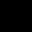

Frame 6410: Predicted Class = 76


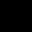

Frame 6411: Predicted Class = 76


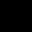

Frame 6412: Predicted Class = 76


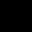

Frame 6413: Predicted Class = 76


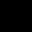

Frame 6414: Predicted Class = 76


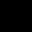

Frame 6415: Predicted Class = 76


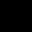

Frame 6416: Predicted Class = 76


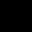

Frame 6417: Predicted Class = 76


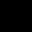

Frame 6418: Predicted Class = 76


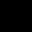

Frame 6419: Predicted Class = 23


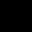

Frame 6420: Predicted Class = 23


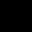

Frame 6421: Predicted Class = 23


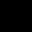

Frame 6422: Predicted Class = 76


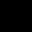

Frame 6423: Predicted Class = 23


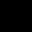

Frame 6424: Predicted Class = 23


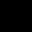

Frame 6425: Predicted Class = 23


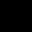

Frame 6426: Predicted Class = 23


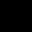

Frame 6427: Predicted Class = 23


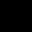

Frame 6428: Predicted Class = 73


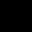

Frame 6429: Predicted Class = 73


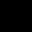

Frame 6430: Predicted Class = 73


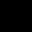

Frame 6431: Predicted Class = 73


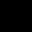

Frame 6432: Predicted Class = 73


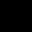

Frame 6433: Predicted Class = 76


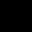

Frame 6434: Predicted Class = 76


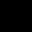

Frame 6435: Predicted Class = 76


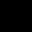

Frame 6436: Predicted Class = 76


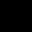

Frame 6437: Predicted Class = 76


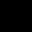

Frame 6438: Predicted Class = 76


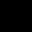

Frame 6439: Predicted Class = 76


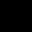

Frame 6440: Predicted Class = 76


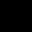

Frame 6441: Predicted Class = 76


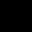

Frame 6442: Predicted Class = 76


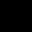

Frame 6443: Predicted Class = 76


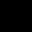

Frame 6444: Predicted Class = 76


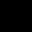

Frame 6445: Predicted Class = 76


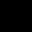

Frame 6446: Predicted Class = 76


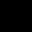

Frame 6447: Predicted Class = 76


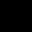

Frame 6448: Predicted Class = 76


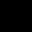

Frame 6449: Predicted Class = 76


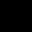

Frame 6450: Predicted Class = 76


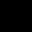

Frame 6451: Predicted Class = 76


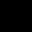

Frame 6452: Predicted Class = 76


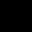

Frame 6453: Predicted Class = 76


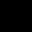

Frame 6454: Predicted Class = 76


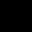

Frame 6455: Predicted Class = 76


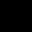

Frame 6456: Predicted Class = 76


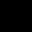

Frame 6457: Predicted Class = 76


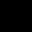

Frame 6458: Predicted Class = 76


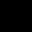

Frame 6459: Predicted Class = 76


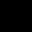

Frame 6460: Predicted Class = 76


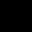

Frame 6461: Predicted Class = 76


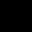

Frame 6462: Predicted Class = 76


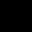

Frame 6463: Predicted Class = 76


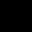

Frame 6464: Predicted Class = 76


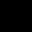

Frame 6465: Predicted Class = 76


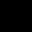

Frame 6466: Predicted Class = 76


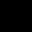

Frame 6467: Predicted Class = 76


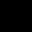

Frame 6468: Predicted Class = 76


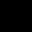

Frame 6469: Predicted Class = 76


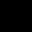

Frame 6470: Predicted Class = 76


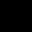

Frame 6471: Predicted Class = 76


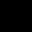

Frame 6472: Predicted Class = 76


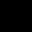

Frame 6473: Predicted Class = 76


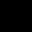

Frame 6474: Predicted Class = 76


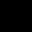

Frame 6475: Predicted Class = 76


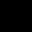

Frame 6476: Predicted Class = 76


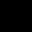

Frame 6477: Predicted Class = 76


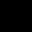

Frame 6478: Predicted Class = 76


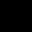

Frame 6479: Predicted Class = 76


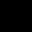

Frame 6480: Predicted Class = 76


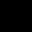

Frame 6481: Predicted Class = 76


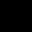

Frame 6482: Predicted Class = 76


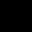

Frame 6483: Predicted Class = 76


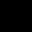

Frame 6484: Predicted Class = 76


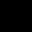

Frame 6485: Predicted Class = 76


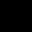

Frame 6486: Predicted Class = 76


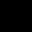

Frame 6487: Predicted Class = 76


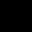

Frame 6488: Predicted Class = 76


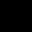

Frame 6489: Predicted Class = 76


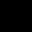

Frame 6490: Predicted Class = 76


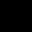

Frame 6491: Predicted Class = 76


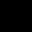

Frame 6492: Predicted Class = 76


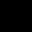

Frame 6493: Predicted Class = 76


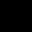

Frame 6494: Predicted Class = 76


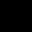

Frame 6495: Predicted Class = 76


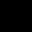

Frame 6496: Predicted Class = 76


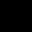

Frame 6497: Predicted Class = 76


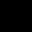

Frame 6498: Predicted Class = 76


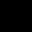

Frame 6499: Predicted Class = 76


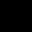

Frame 6500: Predicted Class = 76


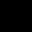

Frame 6501: Predicted Class = 76


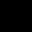

Frame 6502: Predicted Class = 76


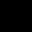

Frame 6503: Predicted Class = 76


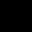

Frame 6504: Predicted Class = 76


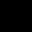

Frame 6505: Predicted Class = 76


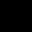

Frame 6506: Predicted Class = 76


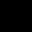

Frame 6507: Predicted Class = 76


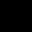

Frame 6508: Predicted Class = 76


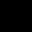

Frame 6509: Predicted Class = 76


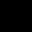

Frame 6510: Predicted Class = 76


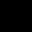

Frame 6511: Predicted Class = 76


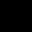

Frame 6512: Predicted Class = 76


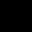

Frame 6513: Predicted Class = 76


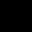

Frame 6514: Predicted Class = 76


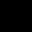

Frame 6515: Predicted Class = 76


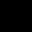

Frame 6516: Predicted Class = 76


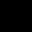

Frame 6517: Predicted Class = 76


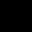

Frame 6518: Predicted Class = 76


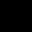

Frame 6519: Predicted Class = 76


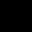

Frame 6520: Predicted Class = 76


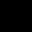

Frame 6521: Predicted Class = 76


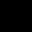

Frame 6522: Predicted Class = 76


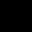

Frame 6523: Predicted Class = 76


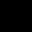

Frame 6524: Predicted Class = 76


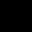

Frame 6525: Predicted Class = 76


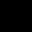

Frame 6526: Predicted Class = 76


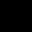

Frame 6527: Predicted Class = 76


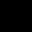

Frame 6528: Predicted Class = 76


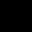

Frame 6529: Predicted Class = 76


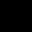

Frame 6530: Predicted Class = 76


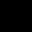

Frame 6531: Predicted Class = 76


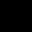

Frame 6532: Predicted Class = 76


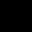

Frame 6533: Predicted Class = 76


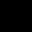

Frame 6534: Predicted Class = 76


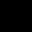

Frame 6535: Predicted Class = 76


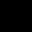

Frame 6536: Predicted Class = 76


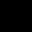

Frame 6537: Predicted Class = 76


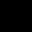

Frame 6538: Predicted Class = 76


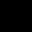

Frame 6539: Predicted Class = 76


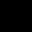

Frame 6540: Predicted Class = 76


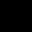

Frame 6541: Predicted Class = 76


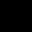

Frame 6542: Predicted Class = 76


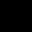

Frame 6543: Predicted Class = 76


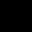

Frame 6544: Predicted Class = 76


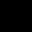

Frame 6545: Predicted Class = 76


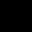

Frame 6546: Predicted Class = 76


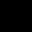

Frame 6547: Predicted Class = 76


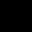

Frame 6548: Predicted Class = 76


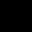

Frame 6549: Predicted Class = 76


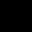

Frame 6550: Predicted Class = 76


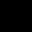

Frame 6551: Predicted Class = 76


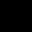

Frame 6552: Predicted Class = 76


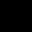

Frame 6553: Predicted Class = 76


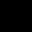

Frame 6554: Predicted Class = 76


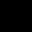

Frame 6555: Predicted Class = 76


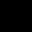

Frame 6556: Predicted Class = 76


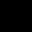

Frame 6557: Predicted Class = 76


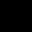

Frame 6558: Predicted Class = 76


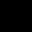

Frame 6559: Predicted Class = 76


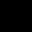

Frame 6560: Predicted Class = 76


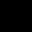

Frame 6561: Predicted Class = 76


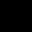

Frame 6562: Predicted Class = 76


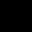

Frame 6563: Predicted Class = 76


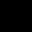

Frame 6564: Predicted Class = 76


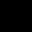

Frame 6565: Predicted Class = 76


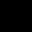

Frame 6566: Predicted Class = 76


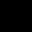

Frame 6567: Predicted Class = 76


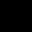

Frame 6568: Predicted Class = 76


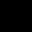

Frame 6569: Predicted Class = 76


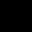

Frame 6570: Predicted Class = 76


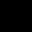

Frame 6571: Predicted Class = 76


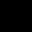

Frame 6572: Predicted Class = 76


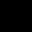

Frame 6573: Predicted Class = 76


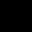

Frame 6574: Predicted Class = 76


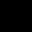

Frame 6575: Predicted Class = 76


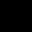

Frame 6576: Predicted Class = 76


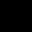

Frame 6577: Predicted Class = 76


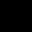

Frame 6578: Predicted Class = 76


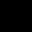

Frame 6579: Predicted Class = 76


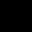

Frame 6580: Predicted Class = 76


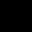

Frame 6581: Predicted Class = 76


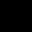

Frame 6582: Predicted Class = 76


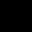

Frame 6583: Predicted Class = 76


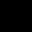

Frame 6584: Predicted Class = 76


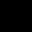

Frame 6585: Predicted Class = 76


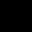

Frame 6586: Predicted Class = 76


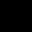

Frame 6587: Predicted Class = 76


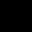

Frame 6588: Predicted Class = 76


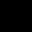

Frame 6589: Predicted Class = 76


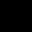

Frame 6590: Predicted Class = 76


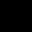

Frame 6591: Predicted Class = 76


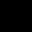

Frame 6592: Predicted Class = 76


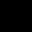

Frame 6593: Predicted Class = 76


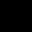

Frame 6594: Predicted Class = 76


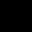

Frame 6595: Predicted Class = 76


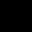

Frame 6596: Predicted Class = 76


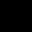

Frame 6597: Predicted Class = 76


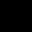

Frame 6598: Predicted Class = 76


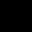

Frame 6599: Predicted Class = 76


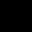

Frame 6600: Predicted Class = 76


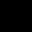

Frame 6601: Predicted Class = 76


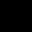

Frame 6602: Predicted Class = 76


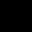

Frame 6603: Predicted Class = 76


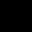

Frame 6604: Predicted Class = 76


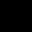

Frame 6605: Predicted Class = 76


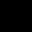

Frame 6606: Predicted Class = 76


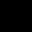

Frame 6607: Predicted Class = 76


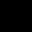

Frame 6608: Predicted Class = 76


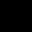

Frame 6609: Predicted Class = 76


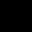

Frame 6610: Predicted Class = 76


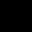

Frame 6611: Predicted Class = 76


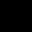

Frame 6612: Predicted Class = 76


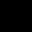

Frame 6613: Predicted Class = 76


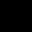

Frame 6614: Predicted Class = 76


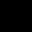

Frame 6615: Predicted Class = 76


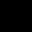

Frame 6616: Predicted Class = 76


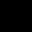

Frame 6617: Predicted Class = 76


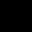

Frame 6618: Predicted Class = 76


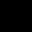

Frame 6619: Predicted Class = 76


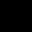

Frame 6620: Predicted Class = 76


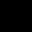

Frame 6621: Predicted Class = 76


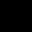

Frame 6622: Predicted Class = 76


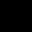

Frame 6623: Predicted Class = 76


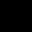

Frame 6624: Predicted Class = 76


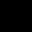

Frame 6625: Predicted Class = 76


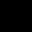

Frame 6626: Predicted Class = 76


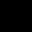

Frame 6627: Predicted Class = 76


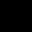

Frame 6628: Predicted Class = 76


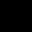

Frame 6629: Predicted Class = 76


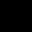

Frame 6630: Predicted Class = 76


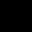

Frame 6631: Predicted Class = 76


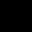

Frame 6632: Predicted Class = 76


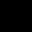

Frame 6633: Predicted Class = 76


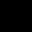

Frame 6634: Predicted Class = 76


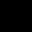

Frame 6635: Predicted Class = 76


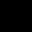

Frame 6636: Predicted Class = 76


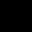

Frame 6637: Predicted Class = 76


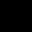

Frame 6638: Predicted Class = 76


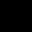

Frame 6639: Predicted Class = 76


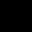

Frame 6640: Predicted Class = 76


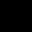

Frame 6641: Predicted Class = 76


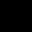

Frame 6642: Predicted Class = 76


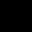

Frame 6643: Predicted Class = 76


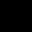

Frame 6644: Predicted Class = 76


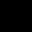

Frame 6645: Predicted Class = 76


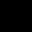

Frame 6646: Predicted Class = 76


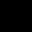

Frame 6647: Predicted Class = 76


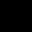

Frame 6648: Predicted Class = 76


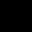

Frame 6649: Predicted Class = 76


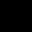

Frame 6650: Predicted Class = 76


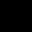

Frame 6651: Predicted Class = 76


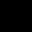

Frame 6652: Predicted Class = 76


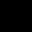

Frame 6653: Predicted Class = 76


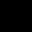

Frame 6654: Predicted Class = 76


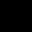

Frame 6655: Predicted Class = 76


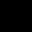

Frame 6656: Predicted Class = 76


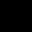

Frame 6657: Predicted Class = 76


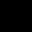

Frame 6658: Predicted Class = 76


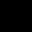

Frame 6659: Predicted Class = 76


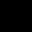

Frame 6660: Predicted Class = 76


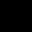

Frame 6661: Predicted Class = 76


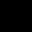

Frame 6662: Predicted Class = 76


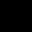

Frame 6663: Predicted Class = 76


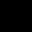

Frame 6664: Predicted Class = 76


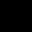

Frame 6665: Predicted Class = 76


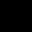

Frame 6666: Predicted Class = 76


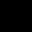

Frame 6667: Predicted Class = 76


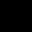

Frame 6668: Predicted Class = 76


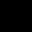

Frame 6669: Predicted Class = 76


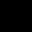

Frame 6670: Predicted Class = 76


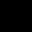

Frame 6671: Predicted Class = 76


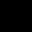

Frame 6672: Predicted Class = 76


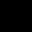

Frame 6673: Predicted Class = 76


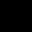

Frame 6674: Predicted Class = 76


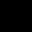

Frame 6675: Predicted Class = 76


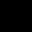

Frame 6676: Predicted Class = 76


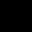

Frame 6677: Predicted Class = 76


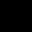

Frame 6678: Predicted Class = 76


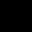

Frame 6679: Predicted Class = 76


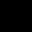

Frame 6680: Predicted Class = 76


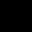

Frame 6681: Predicted Class = 76


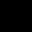

Frame 6682: Predicted Class = 76


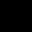

Frame 6683: Predicted Class = 76


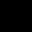

Frame 6684: Predicted Class = 76


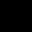

Frame 6685: Predicted Class = 76


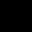

Frame 6686: Predicted Class = 76


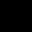

Frame 6687: Predicted Class = 76


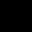

Frame 6688: Predicted Class = 76


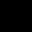

Frame 6689: Predicted Class = 76


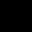

Frame 6690: Predicted Class = 76


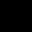

Frame 6691: Predicted Class = 76


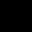

Frame 6692: Predicted Class = 76


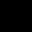

Frame 6693: Predicted Class = 76


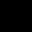

Frame 6694: Predicted Class = 76


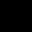

Frame 6695: Predicted Class = 76


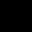

Frame 6696: Predicted Class = 76


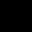

Frame 6697: Predicted Class = 76


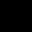

Frame 6698: Predicted Class = 76


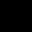

Frame 6699: Predicted Class = 76


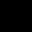

Frame 6700: Predicted Class = 76


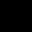

Frame 6701: Predicted Class = 76


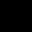

Frame 6702: Predicted Class = 76


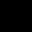

Frame 6703: Predicted Class = 76


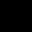

Frame 6704: Predicted Class = 76


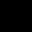

Frame 6705: Predicted Class = 76


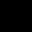

Frame 6706: Predicted Class = 76


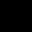

Frame 6707: Predicted Class = 76


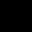

Frame 6708: Predicted Class = 76


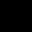

Frame 6709: Predicted Class = 76


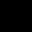

Frame 6710: Predicted Class = 76


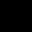

Frame 6711: Predicted Class = 76


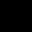

Frame 6712: Predicted Class = 76


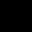

Frame 6713: Predicted Class = 76


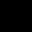

Frame 6714: Predicted Class = 76


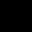

Frame 6715: Predicted Class = 76


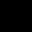

Frame 6716: Predicted Class = 76


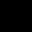

Frame 6717: Predicted Class = 76


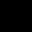

Frame 6718: Predicted Class = 76


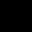

Frame 6719: Predicted Class = 76


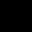

Frame 6720: Predicted Class = 76


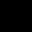

Frame 6721: Predicted Class = 76


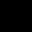

Frame 6722: Predicted Class = 76


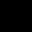

Frame 6723: Predicted Class = 76


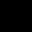

Frame 6724: Predicted Class = 76


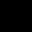

Frame 6725: Predicted Class = 76


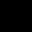

Frame 6726: Predicted Class = 76


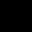

Frame 6727: Predicted Class = 76


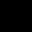

Frame 6728: Predicted Class = 76


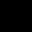

Frame 6729: Predicted Class = 76


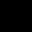

Frame 6730: Predicted Class = 76


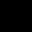

Frame 6731: Predicted Class = 76


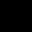

Frame 6732: Predicted Class = 76


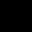

Frame 6733: Predicted Class = 76


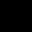

Frame 6734: Predicted Class = 76


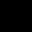

Frame 6735: Predicted Class = 76


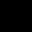

Frame 6736: Predicted Class = 76


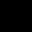

Frame 6737: Predicted Class = 76


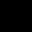

Frame 6738: Predicted Class = 76


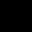

Frame 6739: Predicted Class = 76


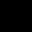

Frame 6740: Predicted Class = 76


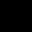

Frame 6741: Predicted Class = 76


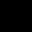

Frame 6742: Predicted Class = 76


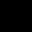

Frame 6743: Predicted Class = 76


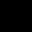

Frame 6744: Predicted Class = 76


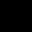

Frame 6745: Predicted Class = 76


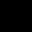

Frame 6746: Predicted Class = 76


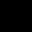

Frame 6747: Predicted Class = 76


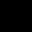

Frame 6748: Predicted Class = 76


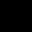

Frame 6749: Predicted Class = 76


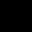

Frame 6750: Predicted Class = 76


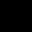

Frame 6751: Predicted Class = 76


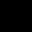

Frame 6752: Predicted Class = 76


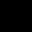

Frame 6753: Predicted Class = 76


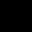

Frame 6754: Predicted Class = 76


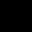

Frame 6755: Predicted Class = 76


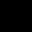

Frame 6756: Predicted Class = 76


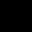

Frame 6757: Predicted Class = 76


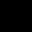

Frame 6758: Predicted Class = 76


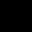

Frame 6759: Predicted Class = 76


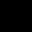

Frame 6760: Predicted Class = 76


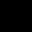

Frame 6761: Predicted Class = 76


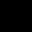

Frame 6762: Predicted Class = 76


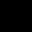

Frame 6763: Predicted Class = 76


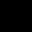

Frame 6764: Predicted Class = 76


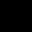

Frame 6765: Predicted Class = 76


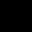

Frame 6766: Predicted Class = 76


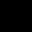

Frame 6767: Predicted Class = 76


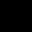

Frame 6768: Predicted Class = 76


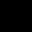

Frame 6769: Predicted Class = 76


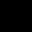

Frame 6770: Predicted Class = 76


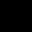

Frame 6771: Predicted Class = 76


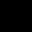

Frame 6772: Predicted Class = 76


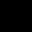

Frame 6773: Predicted Class = 76


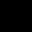

Frame 6774: Predicted Class = 76


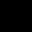

Frame 6775: Predicted Class = 76


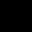

Frame 6776: Predicted Class = 76


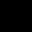

Frame 6777: Predicted Class = 76


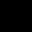

Frame 6778: Predicted Class = 76


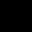

Frame 6779: Predicted Class = 76


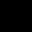

Frame 6780: Predicted Class = 76


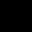

Frame 6781: Predicted Class = 76


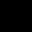

Frame 6782: Predicted Class = 76


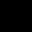

Frame 6783: Predicted Class = 76


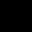

Frame 6784: Predicted Class = 76


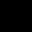

Frame 6785: Predicted Class = 76


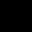

Frame 6786: Predicted Class = 76


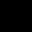

Frame 6787: Predicted Class = 76


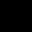

Frame 6788: Predicted Class = 76


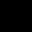

Frame 6789: Predicted Class = 76


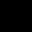

Frame 6790: Predicted Class = 76


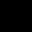

Frame 6791: Predicted Class = 76


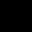

Frame 6792: Predicted Class = 76


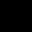

Frame 6793: Predicted Class = 76


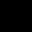

Frame 6794: Predicted Class = 76


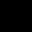

Frame 6795: Predicted Class = 76


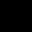

Frame 6796: Predicted Class = 76


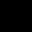

Frame 6797: Predicted Class = 76


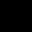

Frame 6798: Predicted Class = 76


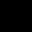

Frame 6799: Predicted Class = 76


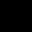

Frame 6800: Predicted Class = 76


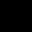

Frame 6801: Predicted Class = 76


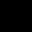

Frame 6802: Predicted Class = 76


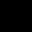

Frame 6803: Predicted Class = 76


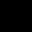

Frame 6804: Predicted Class = 76


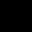

Frame 6805: Predicted Class = 76


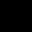

Frame 6806: Predicted Class = 76


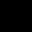

Frame 6807: Predicted Class = 76


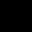

Frame 6808: Predicted Class = 76


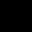

Frame 6809: Predicted Class = 76


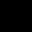

Frame 6810: Predicted Class = 76


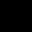

Frame 6811: Predicted Class = 76


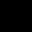

Frame 6812: Predicted Class = 76


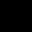

Frame 6813: Predicted Class = 76


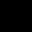

Frame 6814: Predicted Class = 76


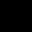

Frame 6815: Predicted Class = 76


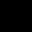

Frame 6816: Predicted Class = 76


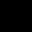

Frame 6817: Predicted Class = 76


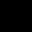

Frame 6818: Predicted Class = 76


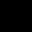

Frame 6819: Predicted Class = 76


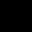

Frame 6820: Predicted Class = 76


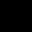

Frame 6821: Predicted Class = 76


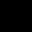

Frame 6822: Predicted Class = 76


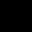

Frame 6823: Predicted Class = 76


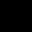

Frame 6824: Predicted Class = 76


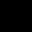

Frame 6825: Predicted Class = 76


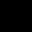

Frame 6826: Predicted Class = 76


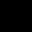

Frame 6827: Predicted Class = 76


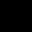

Frame 6828: Predicted Class = 76


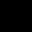

Frame 6829: Predicted Class = 76


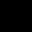

Frame 6830: Predicted Class = 76


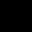

Frame 6831: Predicted Class = 76


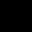

Frame 6832: Predicted Class = 76


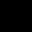

Frame 6833: Predicted Class = 76


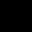

Frame 6834: Predicted Class = 76


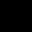

Frame 6835: Predicted Class = 76


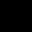

Frame 6836: Predicted Class = 76


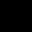

Frame 6837: Predicted Class = 76


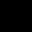

Frame 6838: Predicted Class = 76


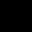

Frame 6839: Predicted Class = 76


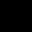

Frame 6840: Predicted Class = 76


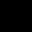

Frame 6841: Predicted Class = 76


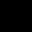

Frame 6842: Predicted Class = 76


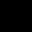

Frame 6843: Predicted Class = 76


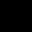

Frame 6844: Predicted Class = 76


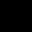

Frame 6845: Predicted Class = 76


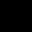

Frame 6846: Predicted Class = 76


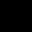

Frame 6847: Predicted Class = 76


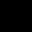

Frame 6848: Predicted Class = 76


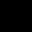

Frame 6849: Predicted Class = 76


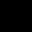

Frame 6850: Predicted Class = 76


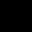

Frame 6851: Predicted Class = 76


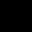

Frame 6852: Predicted Class = 76


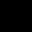

Frame 6853: Predicted Class = 76


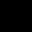

Frame 6854: Predicted Class = 76


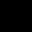

Frame 6855: Predicted Class = 76


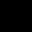

Frame 6856: Predicted Class = 76


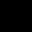

Frame 6857: Predicted Class = 76


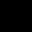

Frame 6858: Predicted Class = 76


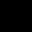

Frame 6859: Predicted Class = 76


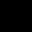

Frame 6860: Predicted Class = 76


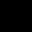

Frame 6861: Predicted Class = 76


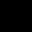

Frame 6862: Predicted Class = 76


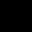

Frame 6863: Predicted Class = 76


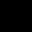

Frame 6864: Predicted Class = 76


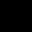

Frame 6865: Predicted Class = 76


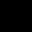

Frame 6866: Predicted Class = 76


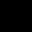

Frame 6867: Predicted Class = 76


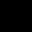

Frame 6868: Predicted Class = 76


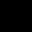

Frame 6869: Predicted Class = 76


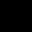

Frame 6870: Predicted Class = 76


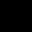

Frame 6871: Predicted Class = 76


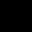

Frame 6872: Predicted Class = 76


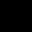

Frame 6873: Predicted Class = 76


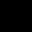

Frame 6874: Predicted Class = 76


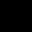

Frame 6875: Predicted Class = 76


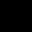

Frame 6876: Predicted Class = 76


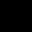

Frame 6877: Predicted Class = 76


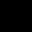

Frame 6878: Predicted Class = 76


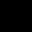

Frame 6879: Predicted Class = 76


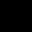

Frame 6880: Predicted Class = 76


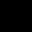

Frame 6881: Predicted Class = 76


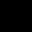

Frame 6882: Predicted Class = 76


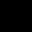

Frame 6883: Predicted Class = 76


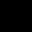

Frame 6884: Predicted Class = 76


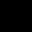

Frame 6885: Predicted Class = 76


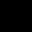

Frame 6886: Predicted Class = 76


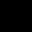

Frame 6887: Predicted Class = 76


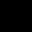

Frame 6888: Predicted Class = 76


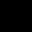

Frame 6889: Predicted Class = 76


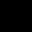

Frame 6890: Predicted Class = 76


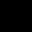

Frame 6891: Predicted Class = 76


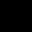

Frame 6892: Predicted Class = 76


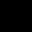

Frame 6893: Predicted Class = 76


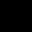

Frame 6894: Predicted Class = 76


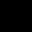

Frame 6895: Predicted Class = 76


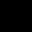

Frame 6896: Predicted Class = 76


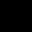

Frame 6897: Predicted Class = 76


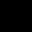

Frame 6898: Predicted Class = 76


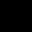

Frame 6899: Predicted Class = 76


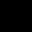

Frame 6900: Predicted Class = 76


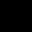

Frame 6901: Predicted Class = 76


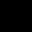

Frame 6902: Predicted Class = 76


In [ ]:
from google.colab.patches import cv2_imshow

for i, frame in enumerate(frames):
        cv2_imshow(frame)
        print(f"Frame {i}: Predicted Class = {predicted_labels[i]}")

In [ ]:
# prompt: show video after process

import cv2
from google.colab.patches import cv2_imshow

def preprocess_video(video_path):
    cap = cv2.VideoCapture(video_path)
    frames = []

    while True:
        ret, frame = cap.read()
        if not ret:
            break

        # Resize frame to 32x32 (same size as CIFAR-100 images)
        frame_resized = cv2.resize(frame, (32, 32))
        frames.append(frame_resized)

    cap.release()
    return frames

# Example usage for a folder
for video_file in video_files:
    video_path = os.path.join(folder_path, video_file)
    frames = preprocess_video(video_path)

    # Process or analyze the frames as needed

    # Convert frames to a numpy array and normalize
    frames = np.array(frames)
    frames = frames / 255.0  # Normalize pixel values

    # Predict the class for each frame in the video
    predictions = model.predict(frames)

    # Get the predicted class label for each frame
    predicted_labels = np.argmax(predictions, axis=1)

    # Print or analyze the predictions
    for i, label in enumerate(predicted_labels):
        print(f"Frame {i}: Predicted Class = {label}")

    # Display frames with predicted labels
    for i, frame in enumerate(frames):
        cv2_imshow(frame)
        print(f"Frame {i}: Predicted Class = {predicted_labels[i]}")
        cv2.waitKey(100)  # Adjust delay (in milliseconds) as needed
    cv2.destroyAllWindows()


In [ ]:
# prompt: use cifar100 to train and use this video files to test

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.model_selection import cross_val_score
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, roc_curve, auc
import gdown
import os
!pip install torch torchvision
!pip install opencv-python moviepy
!pip install opencv-python-headless

import torch
import torchvision
import torchvision.transforms as transforms

# Download and load CIFAR100 dataset
transform = transforms.Compose(
    [transforms.ToTensor(),
     transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])

trainset = torchvision.datasets.CIFAR100(root='./data', train=True,
                                        download=True, transform=transform)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=4,
                                          shuffle=True, num_workers=2)

testset = torchvision.datasets.CIFAR100(root='./data', train=False,
                                       download=True, transform=transform)
testloader = torch.utils.data.DataLoader(testset, batch_size=4,
                                         shuffle=False, num_workers=2)

classes = ('plane', 'car', 'bird', 'cat',
           'deer', 'dog', 'frog', 'horse', 'ship', 'truck')

# Define a simple CNN model
import torch.nn as nn
import torch.nn.functional as F

class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        self.conv1 = nn.Conv2d(3, 6, 5)
        self.pool = nn.MaxPool2d(2, 2)
        self.conv2 = nn.Conv2d(6, 16, 5)
        self.fc1 = nn.Linear(16 * 5 * 5, 120)
        self.fc2 = nn.Linear(120, 84)
        self.fc3 = nn.Linear(84, 100)

    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        x = x.view(-1, 16 * 5 * 5)
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = self.fc3(x)
        return x

net = Net()

# Define a loss function and optimizer
import torch.optim as optim

criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(net.parameters(), lr=0.001, momentum=0.9)

# Train the network
for epoch in range(2):  # loop over the dataset multiple times

    running_loss = 0.0
    for i, data in enumerate(trainloader, 0):
        # get the inputs; data is a list of [inputs, labels]
        inputs, labels = data

        # zero the parameter gradients
        optimizer.zero_grad()

        # forward + backward + optimize
        outputs = net(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        # print statistics
        running_loss += loss.item()
        if i % 2000 == 1999:    # print every 2000 mini-batches
            print('[%d, %5d] loss: %.3f' %
                  (epoch + 1, i + 1, running_loss / 2000))
            running_loss = 0.0

print('Finished Training')

# # Test the network on the test data
# correct = 0
# total = 0
# with torch.no_grad():
#     for data in testloader:
#         images, labels = data
#         outputs = net(images)
#         _, predicted = torch.max(outputs.data, 1)
#         total += labels.size(0)
#         correct += (predicted == labels).sum().item()

# print('Accuracy of the network on the 10000 test images: %d %%' % (
#     100 * correct / total))


# # Path to the folder where your videos are downloaded
# folder_path = '/content/Rat-VDO'

# # List video files in the folder
# video_files = [f for f in os.listdir(folder_path) if f.endswith(('.mp4', '.avi', '.mov'))]
# print(video_files)


# # You would need to process your video frames and convert them to the same format as the CIFAR100 dataset.
# # This might involve resizing, normalizing, and converting to tensors.
# # Then you can use the trained model to predict the class of each frame.

# # Example (replace with your actual video processing logic):
# # for video_file in video_files:
# #     # Load video and extract frames
# #     # ...

# #     # Process each frame
# #     for frame in frames:
# #         # Preprocess frame (resize, normalize, convert to tensor)
# #         input_tensor = preprocess_frame(frame)

# #         # Get prediction from the model
# #         output = net(input_tensor)
# #         _, predicted = torch.max(output.data, 1)

# #         # Do something with the prediction (e.g., display it)
# #         print("Predicted class:", predicted)



faster r-cnn

In [ ]:
import torch
from torchvision.models.detection import fasterrcnn_resnet50_fpn
from torchvision.transforms import functional as F
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# Load pre-trained Faster R-CNN model
model = fasterrcnn_resnet50_fpn(pretrained=True)
model.eval()

# Set device to CUDA if available, otherwise CPU
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
model.to(device)


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth
100%|██████████| 160M/160M [00:01<00:00, 154MB/s]


FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(

In [ ]:
# Define the bounding box for the rat area statically
x1, y1 = 100, 100  # Top-left corner (example values)
x2, y2 = 300, 300  # Bottom-right corner (example values)

# Create the rat area bounding box
rat_area = (x1, y1, x2, y2)  # Define the coordinates of the bounding box (left, top, right, bottom)


In [ ]:
def preprocess_frame(frame):
    frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
    frame_tensor = F.to_tensor(frame_rgb).unsqueeze(0).to(device)  # Convert to tensor
    return frame_tensor

In [ ]:
def detect_and_track_rat(video_path, output_video_path):
    cap = cv2.VideoCapture(video_path)

    if not cap.isOpened():
        print(f"Error: Could not open video {video_path}")
        return

    fps = int(cap.get(cv2.CAP_PROP_FPS))
    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

    # Create VideoWriter object to save output video
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    out = cv2.VideoWriter(output_video_path, fourcc, fps, (width, height))

    rat_time = 0  # Variable to track time in the rat area
    tracking = False  # Flag to indicate whether the rat is currently in the area
    start_time = None  # Variable to track when the rat enters the area

    while True:
        ret, frame = cap.read()
        if not ret:
            break

        input_frame = preprocess_frame(frame)

        with torch.no_grad():
            predictions = model(input_frame)[0]

        for i in range(len(predictions['boxes'])):
            box = predictions['boxes'][i].cpu().numpy()
            score = predictions['scores'][i].cpu().numpy()

            if score > 0.5:  # Filter by confidence score
                x1, y1, x2, y2 = map(int, box)

                # Check if the detected object is within the rat area
                if (x1 >= rat_area[0] and y1 >= rat_area[1] and
                    x2 <= rat_area[2] and y2 <= rat_area[3]):
                    if not tracking:
                        tracking = True
                        start_time = cap.get(cv2.CAP_PROP_POS_MSEC) / 1000  # Record the start time
                else:
                    if tracking:
                        tracking = False
                        end_time = cap.get(cv2.CAP_PROP_POS_MSEC) / 1000  # Record the end time
                        rat_time += (end_time - start_time)  # Update the total time in rat area

                # Draw bounding box
                cv2.rectangle(frame, (x1, y1), (x2, y2), (0, 255, 0), 2)

        # Draw the rat area rectangle
        cv2.rectangle(frame, (rat_area[0], rat_area[1]), (rat_area[2], rat_area[3]), (255, 0, 0), 2)

        # Display the total time the rat spent in the area
        cv2.putText(frame, f"Time in Rat Area: {rat_time:.2f}s", (10, 30),
                    cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 255), 2)

        out.write(frame)  # Write the frame to output video

    cap.release()
    out.release()
    print(f"Processed video saved as {output_video_path}")